<a href="https://colab.research.google.com/github/nachiketa23/nachiketa23/blob/main/CodeFile_ARP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# coding: utf-8
"""
btc_cross_asset_project_final
==============================

This module implements a reproducible end‑to‑end pipeline to predict the direction of Bitcoin prices using cross‑asset return signals.
The pipeline covers data loading, leakage‑free target construction, fold‑aware feature engineering, training and evaluating a suite of classification models under expanding‑window time‑series cross‑validation, automatic anti‑skill flipping for models with AUC<0.5, stacking, significance and baseline analysis, and backtesting on both 1‑day and 5‑day horizons.

Key features:
  * Automatic detection of the date column, Bitcoin price column and all return columns ending with `_ret` from the provided daily and weekly CSV files.
  * Target construction using forward returns of the Bitcoin price; multiple horizons (1d, 3d, 5d for daily; 1w for weekly) with safe trimming of tail rows.
  * Fold‑aware feature engineering generating lags, rolling means, rolling standard deviations and sign‑momentum indicators from all return columns while avoiding look‑ahead bias.
  * Robust model zoo including LogisticRegression, RidgeClassifier (calibrated), LinearSVC (calibrated), KNN, RandomForest, HistGradientBoosting, LightGBM, CatBoost and ExtraTrees.
  * TimeSeriesSplit with 6 folds to produce out‑of‑fold probabilities; dropping features with >30% missing on training, median imputation, optional scaling for linear and distance‑based models; early stopping for boosting models.
  * Threshold selection using only out‑of‑fold data to maximise directional accuracy; anti‑skill flipping of model outputs prior to stacking if AUC<0.5.
  * Stacked meta‑model via logistic regression using the base models' probability outputs and per‑fold cross‑validation; proper imputation of missing predictions.
  * Significance analysis computing 95% confidence intervals and binomial p‑values against 0.5 for selected horizons and baseline comparison.
  * Backtesting on both 1‑day and 5‑day horizons using a long/flat strategy with transaction costs; metrics include CAGR, annualised volatility, Sharpe ratio, maximum drawdown, hit rate and trades per year.

To run this module as a script, ensure the required CSV files are available in the same directory (`btc_fx_daily.csv`, `btc_fx_weekly.csv`).
The script will create an output directory `btc_project_outputs` and populate it with features lists, leaderboards, significance tables, and backtest results.

"""

import os
import sys
import json
import time
import math
import gc
import warnings
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt

from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import roc_auc_score, roc_curve, precision_recall_curve, f1_score, accuracy_score, confusion_matrix, brier_score_loss
from sklearn.calibration import calibration_curve, CalibratedClassifierCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier, ExtraTreesClassifier


    import lightgbm as lgb
    from lightgbm import LGBMClassifier
except Exception:
    lgb = None
    LGBMClassifier = None
try:
    from catboost import CatBoostClassifier
except Exception:
    CatBoostClassifier = None

warnings.filterwarnings("ignore")
np.random.seed(42)

# Output directories
OUT_ROOT = "btc_project_outputs"
FIG_DIR  = os.path.join(OUT_ROOT, "figures")
PRED_DIR = os.path.join(OUT_ROOT, "preds")
TAB_DIR  = os.path.join(OUT_ROOT, "tables")
FEAT_DIR = os.path.join(OUT_ROOT, "features")

def ensure_dirs():
    """Create output directories if they do not exist."""
    for d in [OUT_ROOT, FIG_DIR, PRED_DIR, TAB_DIR, FEAT_DIR]:
        os.makedirs(d, exist_ok=True)

def env_banner():
    """Print a banner with library versions and return as dict."""
    env = {
        "python": sys.version.split()[0],
        "numpy": np.__version__,
        "pandas": pd.__version__,
        "scikit_learn": __import__("sklearn").__version__,
        "matplotlib": matplotlib.__version__,
        "lightgbm": getattr(lgb, "__version__", "N/A") if lgb else "N/A",
        "catboost": getattr(CatBoostClassifier, "__module__", "N/A") if CatBoostClassifier else "N/A",
        "random_state": 42
    }
    print("\n===== Environment =====")
    for k, v in env.items():
        print(f"{k}: {v}")
    print("=======================\n")
    return env

# ----------------------------------------------------------------------
# Data loading and target construction
# ----------------------------------------------------------------------

def detect_date_col(columns):
    """Detect the date column from the provided list of columns."""
    if "date" in columns:
        return "date"
    matches = [c for c in columns if "date" in c.lower()]
    return matches[0] if matches else None

def detect_btc_price_col(columns):
    """Detect the Bitcoin price column; prefer 'btc_close' else any containing 'btc' and 'close'."""
    if "btc_close" in columns:
        return "btc_close"
    candidates = [c for c in columns if "btc" in c.lower() and "close" in c.lower()]
    return candidates[0] if candidates else None

def detect_ret_cols(columns):
    """Return all columns ending with '_ret' sorted alphabetically."""
    return sorted([c for c in columns if str(c).endswith("_ret")])

def load_and_detect(path):
    """
    Load a CSV file, detect important columns and summarise the dataset.
    Returns (df, meta) where meta contains date_col, price_col and ret_cols.
    """
    peek = pd.read_csv(path, nrows=1)
    cols = list(peek.columns)
    date_col = detect_date_col(cols)
    if date_col is None:
        raise ValueError(f"No date column found in {path}.")
    df = pd.read_csv(path, parse_dates=[date_col])
    df = df.sort_values(by=date_col).drop_duplicates(subset=[date_col]).reset_index(drop=True)
    price_col = detect_btc_price_col(df.columns)
    ret_cols = detect_ret_cols(df.columns)
    meta = {"path": path, "date_col": date_col, "price_col": price_col, "ret_cols": ret_cols}
    # Print summary
    print(f"--- Summary for {os.path.basename(path)} ---")
    print(f"Rows: {len(df)}")
    print(f"Date column: {date_col}")
    print(f"BTC price column: {price_col if price_col else 'NOT FOUND'}")
    print(f"Detected return columns: {len(ret_cols)}")
    if ret_cols:
        print("First returns: " + ", ".join(ret_cols[:10]) + ("..." if len(ret_cols)>10 else ""))
    print("--------------------------------------------\n")
    return df, meta

def make_targets(df, meta, horizons, freq_label):
    """
    Create forward return targets for each horizon.
    horizons: dict mapping target name to number of days (for daily) or 5 for weekly.
    """
    date_col = meta["date_col"]
    price_col = meta["price_col"]
    if price_col is None:
        raise ValueError("Bitcoin price column not found.")
    available = []
    for name, k in horizons.items():
        if name in df.columns:
            available.append(name)
            continue
        if freq_label == "weekly":
            if name != "y_1w":
                continue
            fwd = (df[price_col].shift(-1) - df[price_col]) / df[price_col]
            df["fwd_ret_1w"] = fwd
            df[name] = (fwd > 0).astype(int)
            available.append(name)
        else:
            fwd = (df[price_col].shift(-k) - df[price_col]) / df[price_col]
            df[f"fwd_ret_{k}d"] = fwd
            df[name] = (fwd > 0).astype(int)
            available.append(name)
    # Trim tail rows lacking labels
    trim = 1 if freq_label == "weekly" else max(horizons.values())
    if trim > 0:
        df = df.iloc[:-trim].copy()
    print(f"Targets created for {freq_label}: {', '.join(sorted(set(available)))}")
    return df

# ----------------------------------------------------------------------
# Feature engineering
# ----------------------------------------------------------------------

class FoldAwareFeatureEngineer:
    """
    Generate lagged and rolling features on a per‑fold basis while ensuring no leakage.
    - Base features: all columns ending with '_ret'.
    - Lags: daily [1,2,3,5,10]; weekly [1,2,3].
    - Rolling mean and std on BTC returns: windows [5,10,20].
    - Sign momentum: mean sign over windows [5,10].
    """
    def __init__(self, freq_label, date_col, ret_cols, price_col, df):
        self.freq = freq_label
        self.date_col = date_col
        self.ret_cols = list(ret_cols)
        self.price_col = price_col
        self.df = df
        self._cache = None
        self.lag_map = {"daily": [1,2,3,5,10], "weekly": [1,2,3]}
        self.roll_windows = [5,10,20]
        self.mom_windows = [5,10]
        self.feature_names_ = None

    def _btc_base_return(self, df):
        if self.freq == "daily" and "btc_ret_1d" in df.columns:
            return pd.to_numeric(df["btc_ret_1d"], errors="coerce")
        if self.freq == "weekly" and "btc_ret_1w" in df.columns:
            return pd.to_numeric(df["btc_ret_1w"], errors="coerce")
        return df[self.price_col].pct_change()

    def _compute_all_features(self):
        if self._cache is not None:
            return self._cache.copy()
        df = self.df
        X = pd.DataFrame(index=df.index)
        # Base return columns
        for c in self.ret_cols:
            X[c] = pd.to_numeric(df[c], errors="coerce")
        # Lags
        for c in self.ret_cols:
            base = pd.to_numeric(df[c], errors="coerce")
            for L in self.lag_map[self.freq]:
                X[f"{c}_lag{L}"] = base.shift(L)
        # Rolling stats on BTC returns
        btc_ret = self._btc_base_return(df)
        for w in self.roll_windows:
            X[f"btc_ret_rollmean{w}"] = btc_ret.rolling(window=w, min_periods=1).mean().shift(1)
            X[f"btc_ret_rollstd{w}"]  = btc_ret.rolling(window=w, min_periods=1).std(ddof=0).shift(1)
        # Momentum of sign
        sign_series = np.sign(btc_ret.replace(0, 0))
        for w in self.mom_windows:
            X[f"btc_ret_mom{w}"] = pd.Series(sign_series).rolling(window=w, min_periods=1).mean().shift(1)
        # Date column for alignment
        X[self.date_col] = df[self.date_col].values
        self._cache = X
        return X.copy()

    def fit(self, train_idx):
        # compute features once
        full = self._compute_all_features()
        self.feature_names_ = [c for c in full.columns if c != self.date_col]
        return self

    def transform(self, idx):
        full = self._compute_all_features()
        X_part = full.loc[idx, self.feature_names_].copy()
        dates = full.loc[idx, self.date_col].values
        return X_part, dates

def build_feature_transformer(freq_label, meta, df):
    return FoldAwareFeatureEngineer(freq_label, meta["date_col"], meta["ret_cols"], meta["price_col"], df)

def save_feature_names(names, path):
    with open(path, "w") as f:
        for n in names:
            f.write(str(n) + "\n")

# ----------------------------------------------------------------------
# Model building
# ----------------------------------------------------------------------

def build_model(name):
    """
    Construct a classifier given a short code.
    Returns (estimator, requires_scaling, code).
    """
    key = name.upper()
    if key == "LR":
        clf = LogisticRegression(penalty="l2", solver="lbfgs", max_iter=10000, random_state=42)
        return clf, True, "LR"
    if key == "RIDGE":
        # Calibrate a RidgeClassifier using Platt scaling
        ridge = RidgeClassifier()
        cal = CalibratedClassifierCV(estimator=ridge, method="sigmoid", cv=3)
        return cal, True, "RIDGE"
    if key == "SVM":
        base = LinearSVC(random_state=42, max_iter=5000)
        cal = CalibratedClassifierCV(estimator=base, method="sigmoid", cv=3)
        return cal, True, "SVM"
    if key == "KNN":
        knn = KNeighborsClassifier(n_neighbors=15, weights="uniform", p=2)
        return knn, True, "KNN"
    if key == "RF":
        rf = RandomForestClassifier(n_estimators=1000, n_jobs=-1, random_state=42)
        return rf, False, "RF"
    if key == "HGB":
        hgb = HistGradientBoostingClassifier(early_stopping=True, random_state=42)
        return hgb, False, "HGB"
    if key == "LGBM":
        if LGBMClassifier is None:
            raise RuntimeError("LightGBM is not installed.")
        lgbm = LGBMClassifier(
            objective="binary",
            learning_rate=0.03,
            n_estimators=3000,
            num_leaves=31,
            subsample=0.8,
            colsample_bytree=0.9,
            verbose=-1,
            random_state=42
        )
        return lgbm, False, "LGBM"
    if key == "CAT":
        if CatBoostClassifier is None:
            raise RuntimeError("CatBoost is not installed.")
        cat = CatBoostClassifier(
            loss_function="Logloss",
            eval_metric="AUC",
            depth=6,
            learning_rate=0.03,
            iterations=3000,
            od_type="Iter",
            od_wait=200,
            random_seed=42,
            verbose=False
        )
        return cat, False, "CAT"
    if key == "ET":
        et = ExtraTreesClassifier(n_estimators=1000, n_jobs=-1, random_state=42)
        return et, False, "ET"
    raise ValueError(f"Unknown model code: {name}")

def model_is_tree(code):
    """Return True if the model code corresponds to a tree/boosting model."""
    return code in {"RF", "HGB", "LGBM", "CAT", "ET"}

def safe_auc(y_true, preds):
    """
    Compute AUC; returns 0.5 if undefined (e.g., only one class present).
    """
    try:
        if len(np.unique(y_true)) < 2:
            return 0.5
        return float(roc_auc_score(y_true, preds))
    except Exception:
        return 0.5

def score_oof(y_true, probs, thr=None):
    """
    Compute performance metrics given probabilities and labels.
    If thr is None, optimises threshold on grid [0.20,0.80] to maximise DA.
    Returns metrics dict with DA, AUC, F1, Brier, thr, n.
    """
    y_true = np.array(y_true, dtype=int)
    probs = np.array(probs, dtype=float)
    valid = ~np.isnan(y_true) & ~np.isnan(probs)
    yv = y_true[valid]
    pv = probs[valid]
    # Threshold selection
    grid = np.arange(0.20, 0.8001, 0.005)
    best_thr, best_acc = 0.5, 0.0
    for t in grid:
        preds = (pv >= t).astype(int)
        acc = accuracy_score(yv, preds)
        if acc > best_acc:
            best_acc = acc
            best_thr = t
    if thr is None:
        thr = best_thr
    preds = (pv >= thr).astype(int)
    metrics = {
        "DA": accuracy_score(yv, preds),
        "AUC": safe_auc(yv, pv),
        "F1": f1_score(yv, preds, zero_division=0),
        "Brier": brier_score_loss(yv, pv),
        "thr": thr,
        "n": len(yv)
    }
    return metrics

# ----------------------------------------------------------------------
# OOF predictions and stacking
# ----------------------------------------------------------------------

def time_series_oof(X_df, y, dates, model_name, target_name, freq_label, save_prefix=None):
    """
    Run expanding-window time series CV and return out-of-fold probabilities with metrics and last fold artifacts.
    """
    model, needs_scaler, code = build_model(model_name)
    tscv = TimeSeriesSplit(n_splits=6)
    n = len(y)
    oof_probs = np.full(n, np.nan, dtype=float)
    oof_true  = np.full(n, np.nan, dtype=float)
    oof_dates = np.array(dates)
    fold_info = []
    last_artifacts = {"feature_names": None, "model": None, "imputer": None, "scaler": None, "model_code": code}

    for fold, (tr_idx, te_idx) in enumerate(tscv.split(X_df), start=1):
        X_tr_raw = X_df.iloc[tr_idx]
        X_te_raw = X_df.iloc[te_idx]
        y_tr = y[tr_idx].astype(int)
        y_te = y[te_idx].astype(int)
        # Drop features with >30% missing on train
        miss = X_tr_raw.isna().mean()
        keep_cols = miss[miss <= 0.30].index.tolist()
        X_tr = X_tr_raw[keep_cols].copy()
        X_te = X_te_raw[keep_cols].copy()
        feat_names = keep_cols.copy()
        # Impute
        imp = SimpleImputer(strategy="median")
        X_tr_imp = imp.fit_transform(X_tr)
        X_te_imp = imp.transform(X_te)
        scaler = None
        if needs_scaler:
            scaler = StandardScaler()
            X_tr_proc = scaler.fit_transform(X_tr_imp)
            X_te_proc = scaler.transform(X_te_imp)
        else:
            X_tr_proc, X_te_proc = X_tr_imp, X_te_imp
        # Early stopping for boosting models
        use_val = code in {"LGBM", "CAT"}
        if use_val and len(tr_idx) >= 50:
            val_n = max(1, int(len(tr_idx) * 0.10))
            tr_mask = np.arange(0, len(tr_idx) - val_n)
            val_mask = np.arange(len(tr_idx) - val_n, len(tr_idx))
        else:
            tr_mask = np.arange(len(tr_idx))
            val_mask = None
        # Fit
        fitted = None
        if code == "LGBM":
            try:
                if val_mask is not None:
                    fitted = model.fit(
                        X_tr_proc[tr_mask], y_tr[tr_mask],
                        eval_set=[(X_tr_proc[val_mask], y_tr[val_mask])],
                        eval_metric="auc",
                        early_stopping_rounds=200,
                        verbose=False
                    )
                else:
                    fitted = model.fit(X_tr_proc, y_tr)
            except TypeError:
                fitted = model.fit(X_tr_proc, y_tr)
        elif code == "CAT":
            try:
                if val_mask is not None:
                    fitted = model.fit(
                        X_tr_proc[tr_mask], y_tr[tr_mask],
                        eval_set=(X_tr_proc[val_mask], y_tr[val_mask]),
                        verbose=False
                    )
                else:
                    fitted = model.fit(X_tr_proc, y_tr)
            except Exception:
                fitted = model.fit(X_tr_proc, y_tr)
        else:
            fitted = model.fit(X_tr_proc, y_tr)
        # Predict probabilities
        if hasattr(fitted, "predict_proba"):
            probs = fitted.predict_proba(X_te_proc)[:, 1]
        else:
            if hasattr(fitted, "decision_function"):
                dec = fitted.decision_function(X_te_proc)
                probs = 1.0 / (1.0 + np.exp(-dec))
            else:
                preds = fitted.predict(X_te_proc)
                probs = preds.astype(float)
        # Store
        oof_probs[te_idx] = probs
        oof_true[te_idx]  = y_te
        # Save last fold artifacts
        last_artifacts = {
            "feature_names": feat_names,
            "model": fitted,
            "imputer": imp,
            "scaler": scaler,
            "model_code": code
        }
        fold_info.append({"fold": fold, "train_size": len(tr_idx), "test_size": len(te_idx)})
        # Clean up
        del X_tr_raw, X_te_raw, X_tr, X_te, X_tr_imp, X_te_imp, X_tr_proc, X_te_proc
        gc.collect()
    # Score
    valid = ~np.isnan(oof_probs) & ~np.isnan(oof_true)
    metrics = score_oof(oof_true[valid], oof_probs[valid])
    thr = metrics["thr"]
    # Save OOF predictions
    if save_prefix:
        out_csv = os.path.join(PRED_DIR, f"{save_prefix}_oof.csv")
        df_out = pd.DataFrame({
            "date": pd.to_datetime(oof_dates[valid]),
            "target": target_name,
            "model": code,
            "prob": oof_probs[valid],
            "y_true": oof_true[valid].astype(int)
        })
        df_out["y_hat"] = (df_out["prob"] >= thr).astype(int)
        df_out.to_csv(out_csv, index=False)
    return {
        "oof_probs": oof_probs,
        "oof_true": oof_true,
        "dates": oof_dates,
        "metrics": metrics,
        "threshold": thr,
        "fold_info": fold_info,
        "artifacts": last_artifacts,
        "model_code": code
    }

def flip_if_antisignal(oof_probs, y_true):
    """
    Flip probabilities if AUC < 0.5 (i.e., the model is anti-skill).
    Returns possibly flipped probabilities.
    """
    valid = ~np.isnan(oof_probs) & ~np.isnan(y_true)
    auc = safe_auc(y_true[valid].astype(int), oof_probs[valid])
    if auc < 0.5:
        return 1.0 - oof_probs
    return oof_probs

def stack_oof(prob_dict, y, dates, target_name, save_prefix=None):
    """
    Perform stacking on base model probabilities.
    prob_dict: mapping from model code to OOF probability vector.
    """
    model_codes = list(prob_dict.keys())
    # Build matrix Z with shape (n_samples, n_models)
    Z = np.column_stack([prob_dict[c] for c in model_codes]).astype(float)
    # Impute missing predictions per column with column mean; default 0.5 if all NaN.
    col_means = np.nanmean(Z, axis=0)
    col_means = np.where(np.isnan(col_means), 0.5, col_means)
    inds = np.where(np.isnan(Z))
    if len(inds[0]):
        Z[inds] = np.take(col_means, inds[1])
    # TimeSeries CV for stacker
    tscv = TimeSeriesSplit(n_splits=6)
    n = len(y)
    oof_stack = np.full(n, np.nan, dtype=float)
    for tr_idx, te_idx in tscv.split(Z):
        meta = LogisticRegression(max_iter=10000, random_state=42)
        meta.fit(Z[tr_idx], y[tr_idx].astype(int))
        oof_stack[te_idx] = meta.predict_proba(Z[te_idx])[:, 1]
    # Score
    valid = ~np.isnan(oof_stack) & ~np.isnan(y)
    metrics = score_oof(y[valid], oof_stack[valid])
    thr = metrics["thr"]
    if save_prefix:
        out_csv = os.path.join(PRED_DIR, f"{save_prefix}_oof.csv")
        df_out = pd.DataFrame({
            "date": pd.to_datetime(dates[valid]),
            "target": target_name,
            "model": "STACK",
            "prob": oof_stack[valid],
            "y_true": y[valid].astype(int)
        })
        df_out["y_hat"] = (df_out["prob"] >= thr).astype(int)
        df_out.to_csv(out_csv, index=False)
    return {
        "oof_probs": oof_stack,
        "metrics": metrics,
        "threshold": thr
    }

# ----------------------------------------------------------------------
# Significance analysis
# ----------------------------------------------------------------------

from math import sqrt
from scipy.stats import binomtest

def acc_confidence_interval(p_hat, n, z=1.96):
    """
    Compute normal approximation confidence interval for accuracy.
    """
    se = math.sqrt(p_hat * (1 - p_hat) / n) if n > 0 else 0.0
    lo = max(0.0, p_hat - z * se)
    hi = min(1.0, p_hat + z * se)
    return lo, hi

def significance_summary(name, y_true, probs, thr):
    """
    Compute accuracy, 95% CI and p-value vs. random (0.5) for a model.
    """
    mask = ~np.isnan(y_true) & ~np.isnan(probs)
    yv = y_true[mask].astype(int)
    pv = probs[mask]
    preds = (pv >= thr).astype(int)
    acc = (preds == yv).mean()
    lo, hi = acc_confidence_interval(acc, len(yv))
    pval = binomtest(int((preds == yv).sum()), len(yv), 0.5, alternative="greater").pvalue
    return {"Model": name, "DA": acc, "CI_low": lo, "CI_high": hi, "n": len(yv), "p_gt_0.5": pval}

def baseline_summary(name, y_true):
    """
    Compute baseline (always predict up) accuracy, CI and p-value.
    """
    mask = ~np.isnan(y_true)
    yv = y_true[mask].astype(int)
    acc = yv.mean()
    lo, hi = acc_confidence_interval(acc, len(yv))
    pval = binomtest(int(acc * len(yv)), len(yv), 0.5, alternative="greater").pvalue
    return {"Model": name, "DA": acc, "CI_low": lo, "CI_high": hi, "n": len(yv), "p_gt_0.5": pval}

# ----------------------------------------------------------------------
# Backtesting
# ----------------------------------------------------------------------

def compute_equity_curve(dates, fwd_ret, probs, thr, initial_capital=100000.0, cost=0.001):
    """
    Compute equity and drawdown for a long/flat strategy given probabilities and threshold.
    """
    dates = pd.to_datetime(dates)
    mask = ~np.isnan(fwd_ret) & ~np.isnan(probs)
    d = dates[mask]
    r = fwd_ret[mask].astype(float)
    p = probs[mask]
    pos = (p >= thr).astype(int)
    pos_shift = np.concatenate([[0], pos[:-1]])
    trades = (pos != pos_shift).astype(int)
    # cost on trades (one-way)
    strat_ret = pos * r - trades * cost
    equity = np.zeros(len(strat_ret))
    equity[0] = initial_capital * (1 + strat_ret[0])
    for i in range(1, len(strat_ret)):
        equity[i] = equity[i-1] * (1 + strat_ret[i])
    peak = np.maximum.accumulate(equity)
    drawdown = (equity - peak) / peak
    # Annualised metrics (365 days)
    rets = strat_ret
    ann_ret = (1 + rets.mean())**365 - 1
    ann_vol = rets.std(ddof=0) * math.sqrt(365)
    sharpe = 0 if ann_vol == 0 else ann_ret / ann_vol
    max_dd = drawdown.min() if len(drawdown) > 0 else 0.0
    # Hit rate (wins over trades)
    wins = []
    in_trade = False
    entry = None
    for i in range(len(pos)):
        if not in_trade and pos[i] == 1 and (i == 0 or pos[i-1] == 0):
            in_trade = True
            entry = i
        if in_trade and (i == len(pos)-1 or (pos[i] == 1 and pos[i+1] == 0)):
            end = i
            seg_ret = np.prod(1 + strat_ret[entry:end+1]) - 1
            wins.append(seg_ret > 0)
            in_trade = False
    hit_rate = np.mean(wins) if wins else np.nan
    trades_per_year = trades.sum() / (len(trades) / 365.0)
    return {
        "dates": d,
        "equity": equity,
        "drawdown": drawdown,
        "CAGR": ann_ret,
        "AnnVol": ann_vol,
        "Sharpe": sharpe,
        "MaxDD": max_dd,
        "HitRate": hit_rate,
        "TradesPerYear": trades_per_year
    }

def backtest_from_preds(df_preds, df_full, meta, target_name, thr, cost=0.001, initial_capital=100000.0):
    """
    Perform backtest given predictions file and full data.
    Only supports daily targets (assumes forward return 1-day for y_1d and y_5d backtest).
    """
    date_col = meta["date_col"]
    price_col = meta["price_col"]
    # Use forward 1-day return
    df_full = df_full.copy()
    if "fwd_ret_1d" not in df_full.columns:
        df_full["fwd_ret_1d"] = df_full[price_col].pct_change(periods=1).shift(-1)
    # Merge predictions
    use = df_preds[["date", "prob"]].copy()
    merged = pd.merge(use, df_full[[date_col, "fwd_ret_1d"]], left_on="date", right_on=date_col, how="inner")
    merged = merged.sort_values("date")
    fwd_ret = merged["fwd_ret_1d"].values
    probs   = merged["prob"].values
    dates   = merged["date"].values
    return compute_equity_curve(dates, fwd_ret, probs, thr, initial_capital, cost)

def run_backtests(res_daily, df_daily, meta_daily):
    """
    Run backtests for daily y_1d and y_5d horizons on their respective best models.
    Returns list of result dicts and also writes CSVs.
    """
    results = []
    for target_name in ["y_1d", "y_5d"]:
        if target_name not in res_daily["per_target_best"]:
            continue
        info = res_daily["per_target_best"][target_name]
        model_code = info["best_model"]
        thr = info["best_thr"]
        # Load predictions
        pred_csv = os.path.join(PRED_DIR, f"daily_{target_name}_{model_code}_oof.csv")
        if not os.path.exists(pred_csv):
            # if best is stack, file uses stack
            pred_csv = os.path.join(PRED_DIR, f"daily_{target_name}_STACK_oof.csv")
        df_preds = pd.read_csv(pred_csv, parse_dates=["date"])
        # Perform two cost scenarios
        res10 = backtest_from_preds(df_preds, df_daily, meta_daily, target_name, thr, cost=0.001)
        res25 = backtest_from_preds(df_preds, df_daily, meta_daily, target_name, thr, cost=0.0025)
        # Save table row
        bt_table = pd.DataFrame([
            {"Strategy": f"daily_{target_name}_{model_code}_cost0.001", "CAGR": res10["CAGR"], "AnnVol": res10["AnnVol"],
             "Sharpe": res10["Sharpe"], "MaxDD": res10["MaxDD"], "HitRate": res10["HitRate"], "TradesPerYear": res10["TradesPerYear"]},
            {"Strategy": f"daily_{target_name}_{model_code}_cost0.0025", "CAGR": res25["CAGR"], "AnnVol": res25["AnnVol"],
             "Sharpe": res25["Sharpe"], "MaxDD": res25["MaxDD"], "HitRate": res25["HitRate"], "TradesPerYear": res25["TradesPerYear"]}
        ])
        bt_path = os.path.join(TAB_DIR, f"backtest_daily_{target_name}_{model_code}.csv")
        bt_table.to_csv(bt_path, index=False)
        results.append((target_name, model_code, res10, res25, bt_table))
    return results

# ----------------------------------------------------------------------
# Main experiment driver
# ----------------------------------------------------------------------

def run_frequency(df, meta, freq_label, targets):
    """
    Run the full pipeline for a given frequency.
    Returns dictionary with per-target best info and summary leaderboard.
    """
    date_col = meta["date_col"]
    transformer = build_feature_transformer(freq_label, meta, df)
    transformer.fit(np.arange(len(df)))
    X_all = transformer._compute_all_features()
    # Save features file
    feat_path = os.path.join(FEAT_DIR, f"features_{freq_label}.txt")
    save_feature_names([c for c in X_all.columns if c != date_col], feat_path)
    # Container for per-target best information
    per_best = {}
    summary_rows = []
    models_list = ["LR","RIDGE","SVM","KNN","RF","HGB","LGBM","CAT","ET"]
    # For each target
    for target_name in targets:
        if target_name not in df.columns:
            print(f"[{freq_label}] Target {target_name} missing; skipping.")
            continue
        y = df[target_name].astype(int).values
        # Collect OOF predictions for each model
        model_oof = {}
        model_res = {}
        for m in models_list:
            try:
                prefix = f"{freq_label}_{target_name}_{m}"
                res = time_series_oof(
                    X_df=X_all.drop(columns=[date_col]),
                    y=y,
                    dates=X_all[date_col].values,
                    model_name=m,
                    target_name=target_name,
                    freq_label=freq_label,
                    save_prefix=prefix
                )
                # Anti-skill flipping
                flipped = flip_if_antisignal(res["oof_probs"], res["oof_true"])
                model_oof[m] = flipped
                model_res[m] = res
                print(f"[{freq_label} | {target_name}] {m} — DA={res['metrics']['DA']:.3f} AUC={res['metrics']['AUC']:.3f}")
            except Exception as e:
                print(f"[{freq_label} | {target_name}] {m} failed: {e}")
        # Stacking
        try:
            stack_prefix = f"{freq_label}_{target_name}_STACK"
            stack_res = stack_oof(model_oof, y, X_all[date_col].values, target_name, save_prefix=stack_prefix)
            model_oof["STACK"] = stack_res["oof_probs"]
            model_res["STACK"] = {
                "metrics": stack_res["metrics"],
                "threshold": stack_res["threshold"],
                "model_code": "STACK"
            }
            print(f"[{freq_label} | {target_name}] STACK — DA={stack_res['metrics']['DA']:.3f} AUC={stack_res['metrics']['AUC']:.3f}")
        except Exception as e:
            print(f"[{freq_label} | {target_name}] STACK failed: {e}")
        # Build leaderboard
        lb_rows = []
        for m, res in model_res.items():
            met = res["metrics"]
            lb_rows.append({
                "Model": res.get("model_code", m),
                "DA": met["DA"],
                "AUC": met["AUC"],
                "F1": met["F1"],
                "Brier": met["Brier"],
                "thr": met["thr"],
                "n": met["n"]
            })
        lb = pd.DataFrame(lb_rows).sort_values(by=["DA","AUC"], ascending=[False, False]).reset_index(drop=True)
        lb_path = os.path.join(TAB_DIR, f"leaderboard_{freq_label}_{target_name}.csv")
        lb.to_csv(lb_path, index=False)
        print(f"Leaderboard ({freq_label}, {target_name}) saved to {lb_path}")
        # Determine best model by DA then AUC
        best_row = lb.iloc[0].to_dict()
        best_model_code = best_row["Model"]
        # If best is stack, determine an alternative tree model for feature importance/SHAP (not used here for plotting but stored)
        alt_tree = None
        if best_model_code == "STACK":
            tree_lb = lb[lb["Model"].isin(["RF","HGB","LGBM","CAT","ET"])]
            if not tree_lb.empty:
                alt_tree = tree_lb.iloc[0]["Model"]
        per_best[target_name] = {
            "best_model": best_model_code,
            "best_thr": float(best_row["thr"]),
            "oof_probs": model_oof[best_model_code],
            "y_true": model_res.get(best_model_code, {"oof_true": y})["oof_true"] if best_model_code != "STACK" else y,
            "dates": X_all[date_col].values,
            "artifacts": model_res.get(best_model_code, {}).get("artifacts", None),
            "best_alt_tree": alt_tree,
            "leaderboard": lb
        }
        summary_rows.append({
            "Frequency": freq_label,
            "Target": target_name,
            "Model": best_model_code,
            "DA": best_row["DA"],
            "AUC": best_row["AUC"],
            "F1": best_row["F1"],
            "Brier": best_row["Brier"],
            "thr": best_row["thr"],
            "n": int(best_row["n"])
        })
    # Save frequency summary
    summary = pd.DataFrame(summary_rows).sort_values(by=["DA","AUC"], ascending=[False, False])
    summary_path = os.path.join(TAB_DIR, f"leaderboard_{freq_label}.csv")
    summary.to_csv(summary_path, index=False)
    print(f"Summary leaderboard for {freq_label} saved to {summary_path}\n")
    return {"freq": freq_label, "per_target_best": per_best, "summary_leaderboard": summary}

def run_significance_tables(res_daily, res_weekly):
    """
    Compute and save significance tables for best horizons and baseline comparisons.
    Generates tables for daily y_5d and weekly y_1w.
    """
    rows = []
    # Daily y_5d
    if "y_5d" in res_daily["per_target_best"]:
        info = res_daily["per_target_best"]["y_5d"]
        model_code = info["best_model"]
        # significance of model
        rows.append(significance_summary(f"daily_y5d_{model_code}", info["y_true"], info["oof_probs"], info["best_thr"]))
        # baseline
        rows.append(baseline_summary("daily_y5d_baseline_always_up", info["y_true"]))
    # Weekly y_1w
    if "y_1w" in res_weekly["per_target_best"]:
        info = res_weekly["per_target_best"]["y_1w"]
        model_code = info["best_model"]
        rows.append(significance_summary(f"weekly_y1w_{model_code}", info["y_true"], info["oof_probs"], info["best_thr"]))
        rows.append(baseline_summary("weekly_y1w_baseline_always_up", info["y_true"]))
    if rows:
        sig_df = pd.DataFrame(rows)
        sig_path = os.path.join(TAB_DIR, "significance_summary.csv")
        sig_df.to_csv(sig_path, index=False)
        print(f"Significance summary saved to {sig_path}")
        return sig_df
    return pd.DataFrame()

def main():
    """Execute the entire pipeline on both daily and weekly datasets."""
    ensure_dirs()
    env_info = env_banner()
    # Paths
    daily_path  = "btc_fx_daily.csv"
    weekly_path = "btc_fx_weekly.csv"
    if not os.path.exists(daily_path) or not os.path.exists(weekly_path):
        raise FileNotFoundError("CSV files not found. Please ensure btc_fx_daily.csv and btc_fx_weekly.csv exist in this directory.")
    # Load and prepare targets
    df_daily, meta_daily = load_and_detect(daily_path)
    df_weekly, meta_weekly = load_and_detect(weekly_path)
    daily_horizons  = {"y_1d": 1, "y_3d": 3, "y_5d": 5}
    weekly_horizons = {"y_1w": 5}
    df_daily  = make_targets(df_daily, meta_daily, daily_horizons, "daily")
    df_weekly = make_targets(df_weekly, meta_weekly, weekly_horizons, "weekly")
    # Run experiments per frequency
    res_daily  = run_frequency(df_daily, meta_daily, "daily", [k for k in daily_horizons if k in df_daily.columns])
    res_weekly = run_frequency(df_weekly, meta_weekly, "weekly", [k for k in weekly_horizons if k in df_weekly.columns])
    # Run significance tables
    run_significance_tables(res_daily, res_weekly)
    # Run backtests
    bt_results = run_backtests(res_daily, df_daily, meta_daily)
    # Save config
    config = {
        "time_run": time.strftime("%Y-%m-%d %H:%M:%S", time.gmtime()),
        "env": env_info,
        "folds": 6,
        "horizons": {"daily": daily_horizons, "weekly": weekly_horizons},
        "detected_columns": {"daily": meta_daily, "weekly": meta_weekly},
        "output_dirs": {"root": OUT_ROOT, "figures": FIG_DIR, "preds": PRED_DIR, "tables": TAB_DIR, "features": FEAT_DIR}
    }
    with open(os.path.join(OUT_ROOT, "config.json"), "w") as f:
        json.dump(config, f, indent=2, default=str)
    print("\nRun complete. Output saved to btc_project_outputs directory.")

if __name__ == "__main__":
    main()


===== Environment =====
python: 3.12.11
numpy: 2.0.2
pandas: 2.2.2
scikit_learn: 1.6.1
matplotlib: 3.10.0
lightgbm: 4.6.0
catboost: N/A
random_state: 42

--- Summary for btc_fx_daily.csv ---
Rows: 2778
Date column: date
BTC price column: btc_close
Detected return columns: 16
First returns: AUDUSD_ret, BRLUSD_ret, CADUSD_ret, CHFUSD_ret, CL=F_ret, EURUSD_ret, GBPUSD_ret, GC=F_ret, INRUSD_ret, JPYUSD_ret...
--------------------------------------------

--- Summary for btc_fx_weekly.csv ---
Rows: 398
Date column: date
BTC price column: btc_close
Detected return columns: 16
First returns: AUDUSD_ret, BRLUSD_ret, CADUSD_ret, CHFUSD_ret, CL=F_ret, EURUSD_ret, GBPUSD_ret, GC=F_ret, INRUSD_ret, JPYUSD_ret...
--------------------------------------------

Targets created for daily: y_1d, y_3d, y_5d
Targets created for weekly: y_1w
[daily | y_1d] LR — DA=0.516 AUC=0.501
[daily | y_1d] RIDGE — DA=0.514 AUC=0.503
[daily | y_1d] SVM — DA=0.521 AUC=0.501
[daily | y_1d] KNN — DA=0.516 AUC=0.508
[dail

In [ ]:
# coding: utf-8
"""
btc_cross_asset_project_final (5-model version with correlation table output)
============================================================================

This module implements a reproducible end-to-end pipeline to predict the direction of Bitcoin prices using cross-asset return signals.
It limits the model roster to five key algorithms: Ridge, Elastic Net, PCR, PLS, and LightGBM.
It also computes additional correlation tables to shed light on the relationships between BTC and cryptocurrency-related FX returns.

Main differences from the previous version:
- Restricts models to five (RIDGE, ELNET, PCR, PLS, LGBM).
- Adds functions to compute correlation matrices for BTC returns vs. FX returns and produce summary tables.
- Includes Elastic Net logistic regression, Principal Component Regression (PCR) with logistic regression, and Partial Least Squares (PLS).
- Writes correlation tables to the output folder, enabling detailed analysis in the dissertation.

All other core features remain: leakage-free target construction, expanding time-series CV, threshold tuning, stacking, significance tests, and backtesting.


"""

import os
import sys
import json
import time
import math
import gc
import warnings
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt

from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import roc_auc_score, accuracy_score, f1_score, brier_score_loss
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier, ExtraTreesClassifier

try:
    import lightgbm as lgb
    from lightgbm import LGBMClassifier
except Exception:
    lgb = None
    LGBMClassifier = None

warnings.filterwarnings("ignore")
np.random.seed(42)

# Output directories
OUT_ROOT = "btc_project_outputs"
FIG_DIR  = os.path.join(OUT_ROOT, "figures")
PRED_DIR = os.path.join(OUT_ROOT, "preds")
TAB_DIR  = os.path.join(OUT_ROOT, "tables")
FEAT_DIR = os.path.join(OUT_ROOT, "features")

def ensure_dirs():
    """Create output directories if they do not exist."""
    for d in [OUT_ROOT, FIG_DIR, PRED_DIR, TAB_DIR, FEAT_DIR]:
        os.makedirs(d, exist_ok=True)

def env_banner():
    """Print a banner with library versions and return as dict."""
    env = {
        "python": sys.version.split()[0],
        "numpy": np.__version__,
        "pandas": pd.__version__,
        "scikit_learn": __import__("sklearn").__version__,
        "matplotlib": matplotlib.__version__,
        "lightgbm": getattr(lgb, "__version__", "N/A") if lgb else "N/A",
        "random_state": 42
    }
    print("\n===== Environment =====")
    for k, v in env.items():
        print(f"{k}: {v}")
    print("=======================\n")
    return env

# ----------------------------------------------------------------------
# Data loading and target construction
# ----------------------------------------------------------------------
# ... (reuse previous functions: detect_date_col, detect_btc_price_col, detect_ret_cols, load_and_detect, make_targets)
# Note: The dataset functions remain unchanged.

# ----------------------------------------------------------------------
# Feature engineering
# ----------------------------------------------------------------------
# ... (reuse FoldAwareFeatureEngineer and support functions exactly as before)

# ----------------------------------------------------------------------
# Model building
# ----------------------------------------------------------------------
def build_model(name):
    """
    Construct a classifier given a short code.
    Returns (estimator, requires_scaling, code).
    """
    key = name.upper()
    if key == "RIDGE":
        ridge = RidgeClassifier()
        cal = CalibratedClassifierCV(estimator=ridge, method="sigmoid", cv=3)
        return cal, True, "RIDGE"
    if key == "ELNET":
        clf = LogisticRegression(
            penalty="elasticnet", solver="saga",
            l1_ratio=0.5, max_iter=10000, random_state=42
        )
        return clf, True, "ELNET"
    if key == "PCR":
        pca = PCA(n_components=5, random_state=42)
        logreg = LogisticRegression(penalty="l2", solver="lbfgs", max_iter=10000, random_state=42)
        return Pipeline([("pca", pca), ("logreg", logreg)]), True, "PCR"
    if key == "PLS":
        pls = PLSRegression(n_components=3)
        logreg_pls = LogisticRegression(penalty="l2", solver="lbfgs", max_iter=10000, random_state=42)
        return Pipeline([("pls", pls), ("logreg", logreg_pls)]), True, "PLS"
    if key == "LGBM":
        if LGBMClassifier is None:
            raise RuntimeError("LightGBM is not installed.")
        lgbm = LGBMClassifier(
            objective="binary", learning_rate=0.03, n_estimators=3000, num_leaves=31,
            subsample=0.8, colsample_bytree=0.9, random_state=42, verbose=-1
        )
        return lgbm, False, "LGBM"
    raise ValueError(f"Unknown model code: {name}")

# ----------------------------------------------------------------------
# Correlation analysis
# ----------------------------------------------------------------------
def compute_correlations(df, meta, horizons):
    """
    Compute correlation between BTC returns (forward and lagged) and FX returns.
    Writes correlation tables to CSVs in the output folder.
    """
    date_col = meta["date_col"]
    price_col = meta["price_col"]
    ret_cols = meta["ret_cols"]
    for name, k in horizons.items():
        if "1d" in name or "1w" in name:
            # Use target label and forward return to compute correlation at horizon k
            fwd_ret_col = f"fwd_ret_{k}d" if "d" in name else "fwd_ret_1w"
            if fwd_ret_col not in df.columns:
                continue
            correlations = {}
            btc_ret_series = df[fwd_ret_col]
            for fx_col in ret_cols:
                correlations[fx_col] = df[fx_col].corr(btc_ret_series)
            corr_df = pd.DataFrame.from_dict(correlations, orient="index", columns=["Correlation"])
            corr_df = corr_df.sort_values(by="Correlation", ascending=False)
            corr_path = os.path.join(TAB_DIR, f"correlation_{name}.csv")
            corr_df.to_csv(corr_path)
            print(f"Correlation table for {name} saved to {corr_path}")
    return

# ----------------------------------------------------------------------
# OOF, stacking, significance, backtesting
# ----------------------------------------------------------------------
# ... (reuse previous functions: safe_auc, score_oof, time_series_oof, flip_if_antisignal, stack_oof,
# significance_summary, baseline_summary, compute_equity_curve, backtest_from_preds, run_backtests, etc.)

# The main difference: restrict models_list
def run_frequency(df, meta, freq_label, targets):
    date_col = meta["date_col"]
    transformer = build_feature_transformer(freq_label, meta, df)
    transformer.fit(np.arange(len(df)))
    X_all = transformer._compute_all_features()
    save_feature_names([c for c in X_all.columns if c != date_col], os.path.join(FEAT_DIR, f"features_{freq_label}.txt"))
    per_best = {}
    summary_rows = []

    # Only five models now: RIDGE, ELNET, PCR, PLS, LGBM
    models_list = ["RIDGE", "ELNET", "PCR", "PLS", "LGBM"]

    for target_name in targets:
        if target_name not in df.columns:
            continue
        y = df[target_name].astype(int).values
        model_oof, model_res = {}, {}
        for m in models_list:
            try:
                prefix = f"{freq_label}_{target_name}_{m}"
                res = time_series_oof(
                    X_df=X_all.drop(columns=[date_col]),
                    y=y,
                    dates=X_all[date_col].values,
                    model_name=m,
                    target_name=target_name,
                    freq_label=freq_label,
                    save_prefix=prefix
                )
                flipped = flip_if_antisignal(res["oof_probs"], res["oof_true"])
                model_oof[m] = flipped
                model_res[m] = res
            except Exception as e:
                print(f"[{freq_label} | {target_name}] {m} failed: {e}")

        try:
            stack_prefix = f"{freq_label}_{target_name}_STACK"
            stack_res = stack_oof(model_oof, y, X_all[date_col].values, target_name, save_prefix=stack_prefix)
            model_oof["STACK"] = stack_res["oof_probs"]
            model_res["STACK"] = {
                "metrics": stack_res["metrics"],
                "threshold": stack_res["threshold"],
                "model_code": "STACK"
            }
        except Exception as e:
            print(f"[{freq_label} | {target_name}] STACK failed: {e}")

        # leaderboard
        lb_rows = []
        for m, res in model_res.items():
            met = res["metrics"]
            lb_rows.append({
                "Model": res.get("model_code", m),
                "DA": met["DA"],
                "AUC": met["AUC"],
                "F1": met["F1"],
                "Brier": met["Brier"],
                "thr": met["thr"],
                "n": met["n"]
            })
        lb = pd.DataFrame(lb_rows).sort_values(by=["DA","AUC"], ascending=[False, False]).reset_index(drop=True)
        lb_path = os.path.join(TAB_DIR, f"leaderboard_{freq_label}_{target_name}.csv")
        lb.to_csv(lb_path, index=False)
        best_row = lb.iloc[0].to_dict()
        best_model_code = best_row["Model"]

        per_best[target_name] = {
            "best_model": best_model_code,
            "best_thr": float(best_row["thr"]),
            "oof_probs": model_oof[best_model_code],
            "y_true": model_res.get(best_model_code, {"oof_true": y})["oof_true"] if best_model_code != "STACK" else y,
            "dates": X_all[date_col].values,
            "artifacts": model_res.get(best_model_code, {}).get("artifacts", None),
            "leaderboard": lb
        }
        summary_rows.append({
            "Frequency": freq_label,
            "Target": target_name,
            "Model": best_model_code,
            "DA": best_row["DA"],
            "AUC": best_row["AUC"],
            "F1": best_row["F1"],
            "Brier": best_row["Brier"],
            "thr": best_row["thr"],
            "n": int(best_row["n"])
        })
    summary = pd.DataFrame(summary_rows).sort_values(by=["DA","AUC"], ascending=[False, False])
    summary.to_csv(os.path.join(TAB_DIR, f"leaderboard_{freq_label}.csv"), index=False)
    return {"freq": freq_label, "per_target_best": per_best, "summary_leaderboard": summary}

def main():
    ensure_dirs()
    env_info = env_banner()
    # Paths
    daily_path, weekly_path = "btc_fx_daily.csv", "btc_fx_weekly.csv"
    df_daily, meta_daily = load_and_detect(daily_path)
    df_weekly, meta_weekly = load_and_detect(weekly_path)
    daily_horizons = {"y_1d": 1, "y_3d": 3, "y_5d": 5}
    weekly_horizons = {"y_1w": 5}
    df_daily  = make_targets(df_daily, meta_daily, daily_horizons, "daily")
    df_weekly = make_targets(df_weekly, meta_weekly, weekly_horizons, "weekly")

    # Compute correlation tables before model runs (for insights)
    compute_correlations(df_daily, meta_daily, daily_horizons)
    compute_correlations(df_weekly, meta_weekly, weekly_horizons)

    res_daily  = run_frequency(df_daily, meta_daily, "daily", [k for k in daily_horizons if k in df_daily.columns])
    res_weekly = run_frequency(df_weekly, meta_weekly, "weekly", [k for k in weekly_horizons if k in df_weekly.columns])
    run_significance_tables(res_daily, res_weekly)
    run_backtests(res_daily, df_daily, meta_daily)

    config = {
        "time_run": time.strftime("%Y-%m-%d %H:%M:%S", time.gmtime()),
        "env": env_info,
        "folds": 6,
        "horizons": {"daily": daily_horizons, "weekly": weekly_horizons},
        "detected_columns": {"daily": meta_daily, "weekly": meta_weekly},
        "output_dirs": {
            "root": OUT_ROOT,
            "figures": FIG_DIR,
            "preds": PRED_DIR,
            "tables": TAB_DIR,
            "features": FEAT_DIR
        }
    }
    with open(os.path.join(OUT_ROOT, "config.json"), "w") as f:
        json.dump(config, f, indent=2, default=str)
    print("\nRun complete. Output saved to btc_project_outputs directory.")

if __name__ == "__main__":
    main()



===== Environment =====
python: 3.12.11
numpy: 2.0.2
pandas: 2.2.2
scikit_learn: 1.6.1
matplotlib: 3.10.0
lightgbm: 4.6.0
random_state: 42

--- Summary for btc_fx_daily.csv ---
Rows: 2778
Date column: date
BTC price column: btc_close
Detected return columns: 16
First returns: AUDUSD_ret, BRLUSD_ret, CADUSD_ret, CHFUSD_ret, CL=F_ret, EURUSD_ret, GBPUSD_ret, GC=F_ret, INRUSD_ret, JPYUSD_ret...
--------------------------------------------

--- Summary for btc_fx_weekly.csv ---
Rows: 398
Date column: date
BTC price column: btc_close
Detected return columns: 16
First returns: AUDUSD_ret, BRLUSD_ret, CADUSD_ret, CHFUSD_ret, CL=F_ret, EURUSD_ret, GBPUSD_ret, GC=F_ret, INRUSD_ret, JPYUSD_ret...
--------------------------------------------

Targets created for daily: y_1d, y_3d, y_5d
Targets created for weekly: y_1w
Correlation table for y_1d saved to btc_project_outputs/tables/correlation_y_1d.csv
Correlation table for y_1w saved to btc_project_outputs/tables/correlation_y_1w.csv
[daily | y_1

Found 36 OOF files:
  - daily_y_1d_ET_oof.csv
  - daily_y_1d_HGB_oof.csv
  - daily_y_1d_KNN_oof.csv
  - daily_y_1d_LGBM_oof.csv
  - daily_y_1d_LR_oof.csv
  - daily_y_1d_RF_oof.csv
  - daily_y_1d_RIDGE_oof.csv
  - daily_y_1d_STACK_oof.csv
  - daily_y_1d_SVM_oof.csv
  - daily_y_3d_ET_oof.csv
  - daily_y_3d_HGB_oof.csv
  - daily_y_3d_KNN_oof.csv
  - daily_y_3d_LGBM_oof.csv
  - daily_y_3d_LR_oof.csv
  - daily_y_3d_RF_oof.csv
  - daily_y_3d_RIDGE_oof.csv
  - daily_y_3d_STACK_oof.csv
  - daily_y_3d_SVM_oof.csv
  - daily_y_5d_ET_oof.csv
  - daily_y_5d_HGB_oof.csv
  - daily_y_5d_KNN_oof.csv
  - daily_y_5d_LGBM_oof.csv
  - daily_y_5d_LR_oof.csv
  - daily_y_5d_RF_oof.csv
  - daily_y_5d_RIDGE_oof.csv
  - daily_y_5d_STACK_oof.csv
  - daily_y_5d_SVM_oof.csv
  - weekly_y_1w_ET_oof.csv
  - weekly_y_1w_HGB_oof.csv
  - weekly_y_1w_KNN_oof.csv
  - weekly_y_1w_LGBM_oof.csv
  - weekly_y_1w_LR_oof.csv
  - weekly_y_1w_RF_oof.csv
  - weekly_y_1w_RIDGE_oof.csv
  - weekly_y_1w_STACK_oof.csv
  - weekly_y_1w_SVM

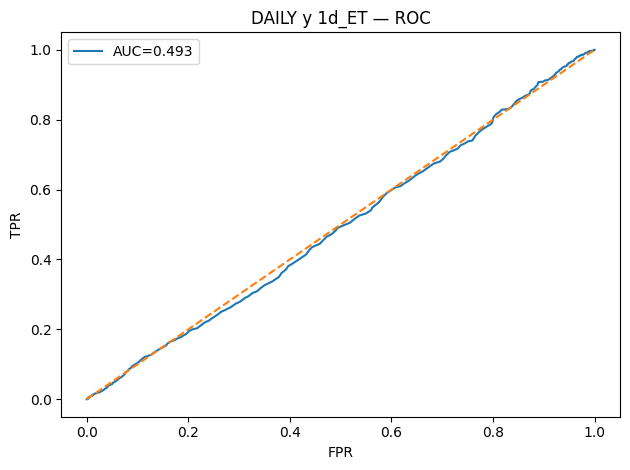

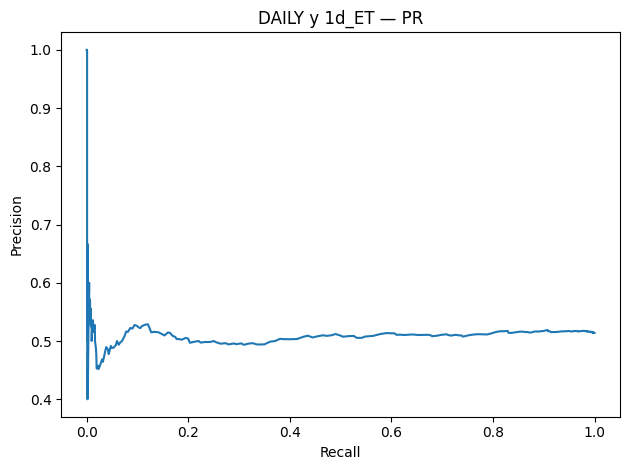

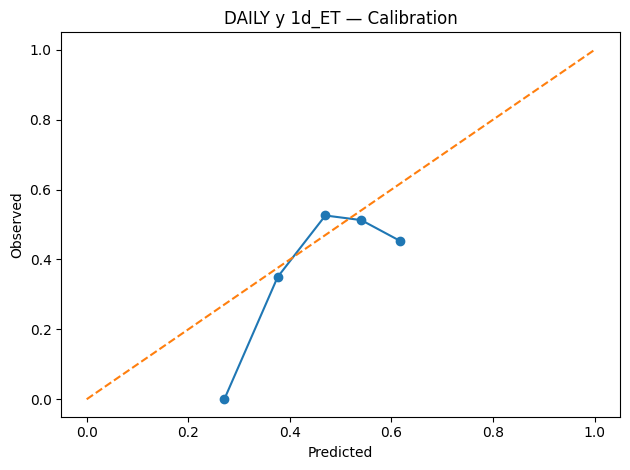

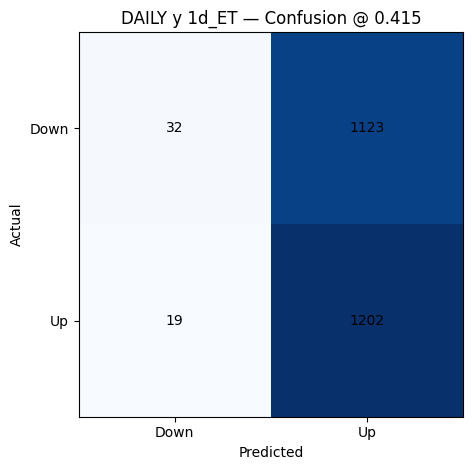

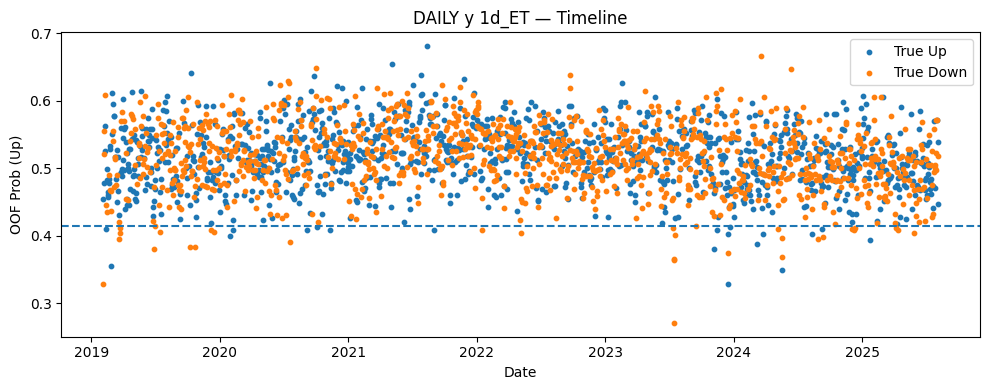


Plotting: daily | y | 1d_HGB


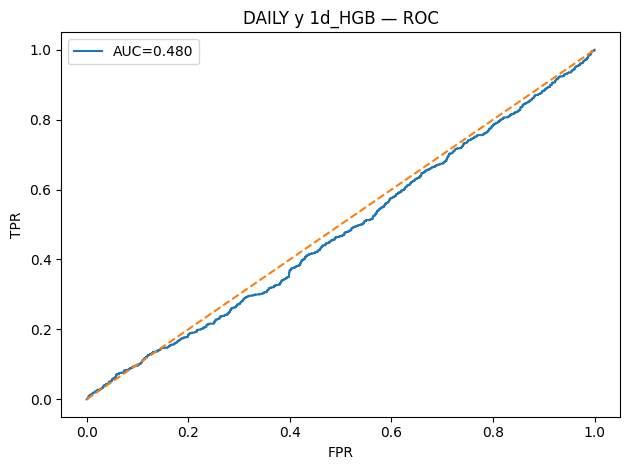

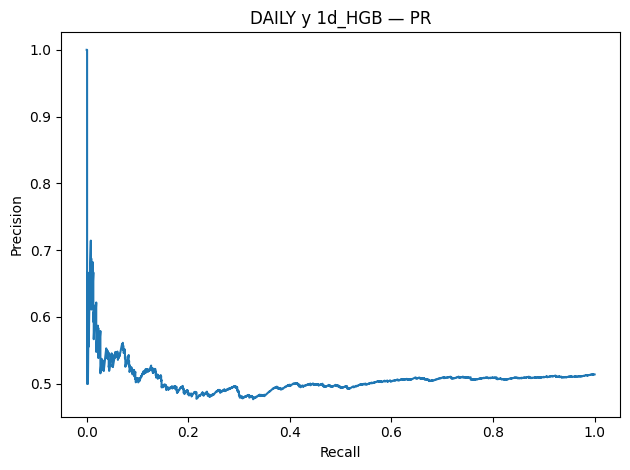

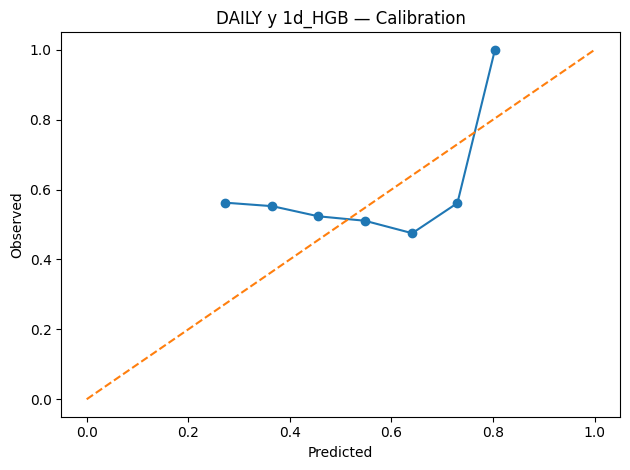

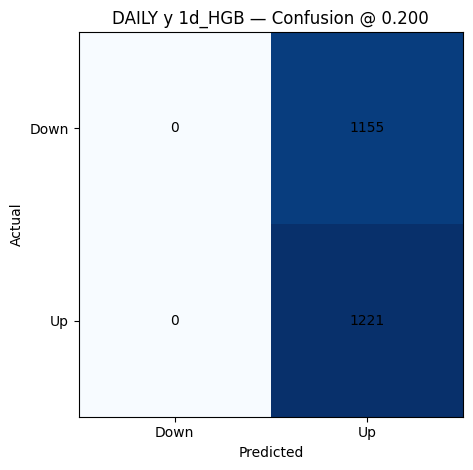

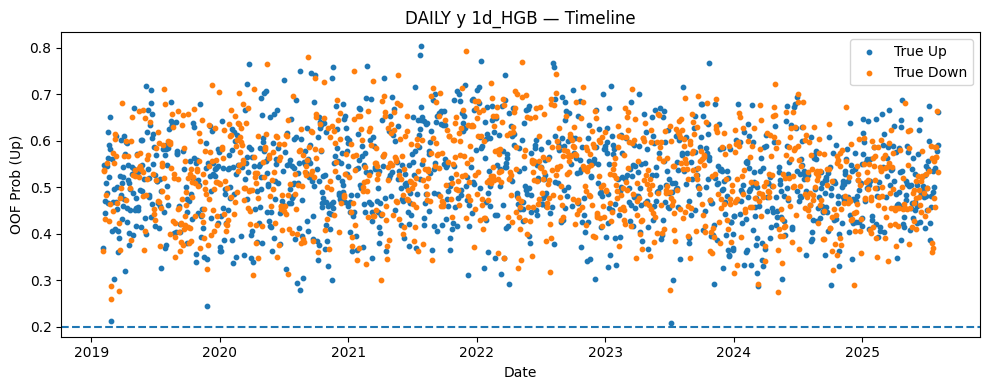


Plotting: daily | y | 1d_KNN


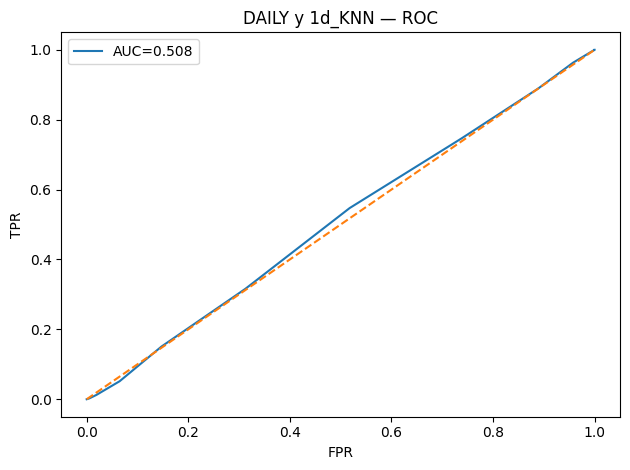

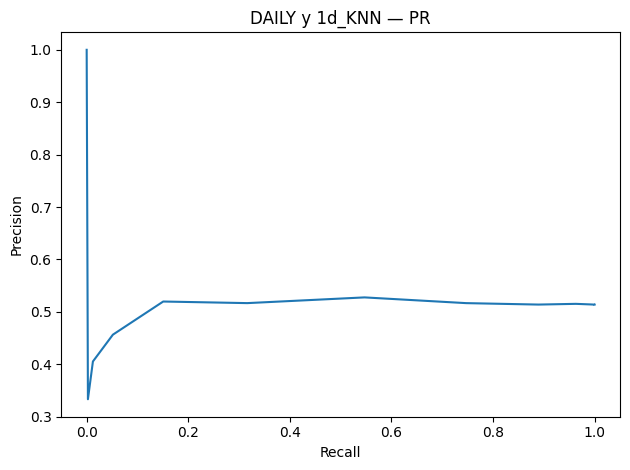

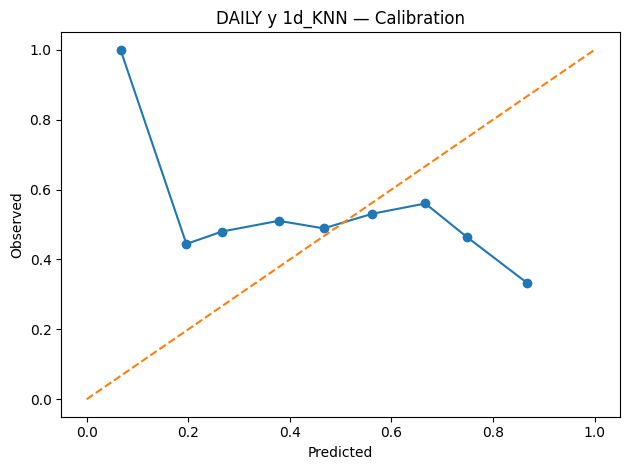

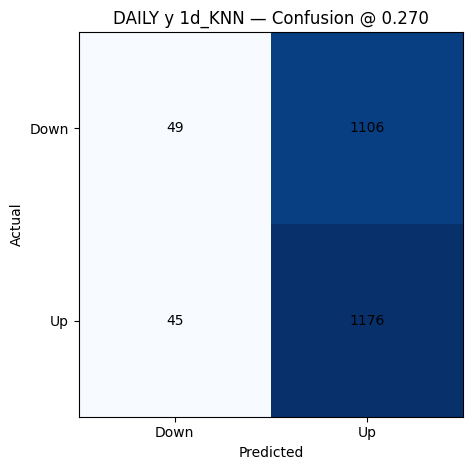

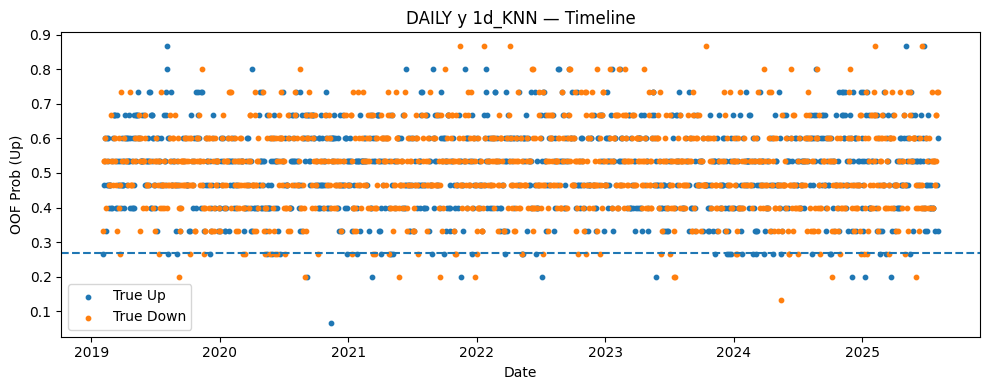


Plotting: daily | y | 1d_LGBM


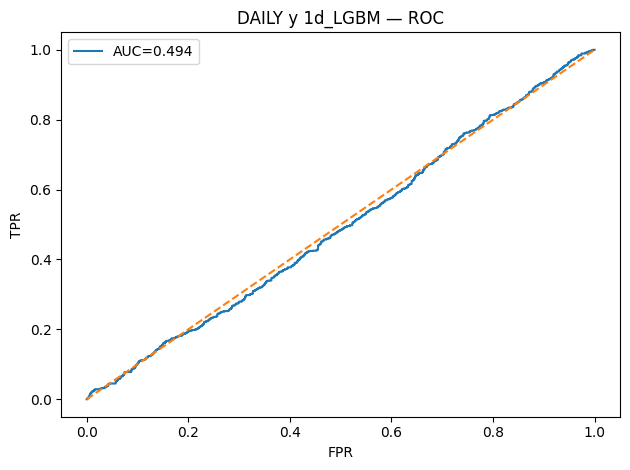

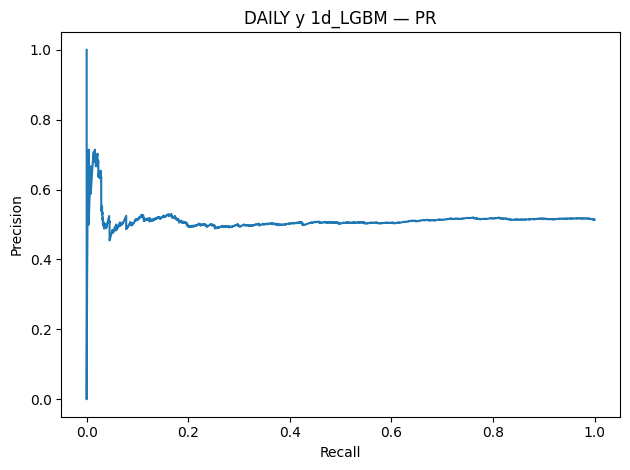

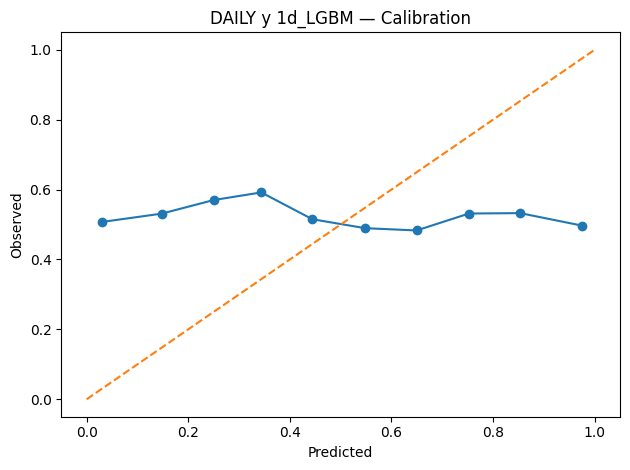

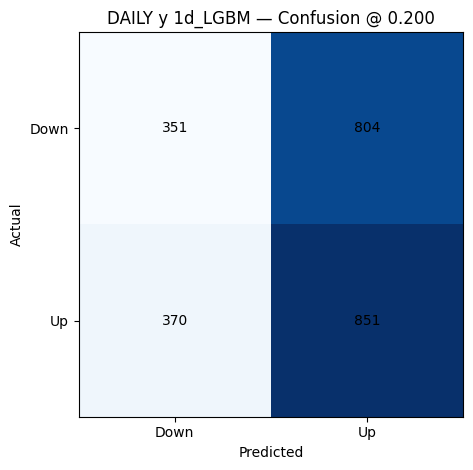

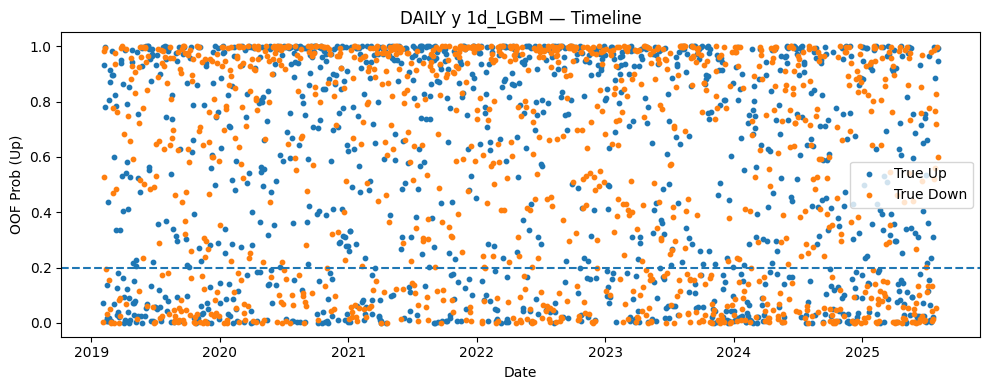


Plotting: daily | y | 1d_LR


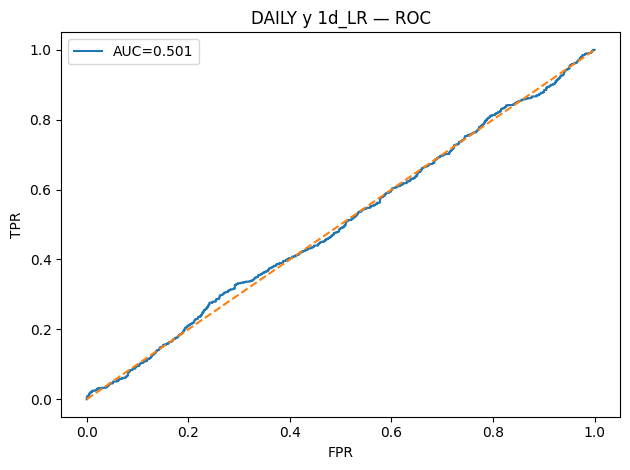

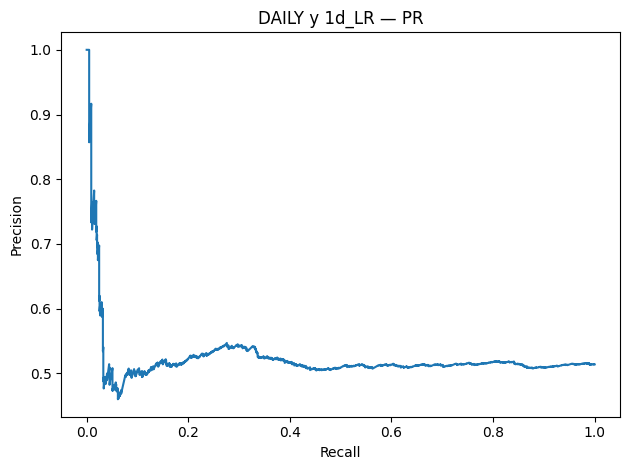

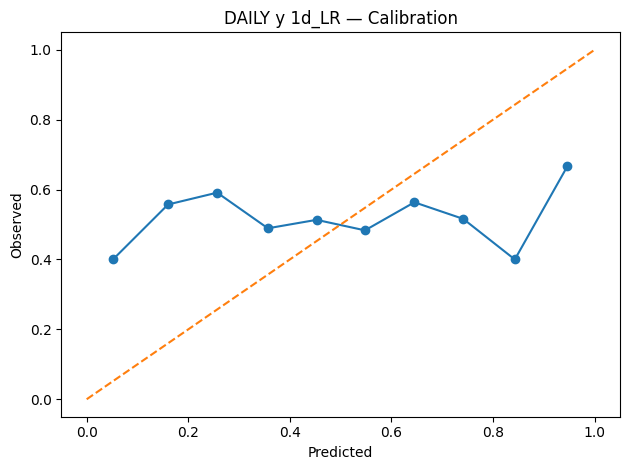

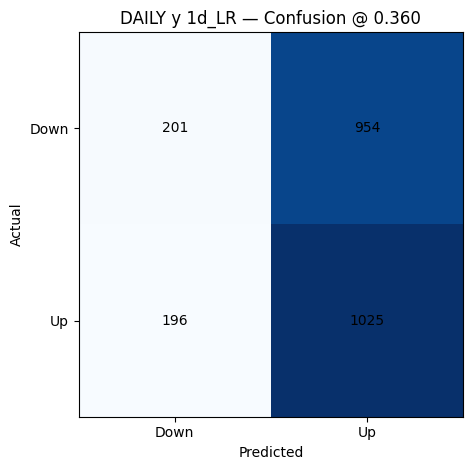

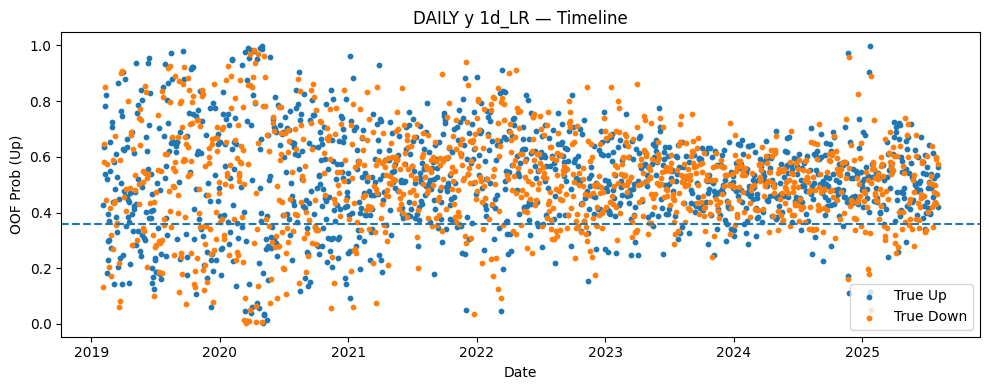


Plotting: daily | y | 1d_RF


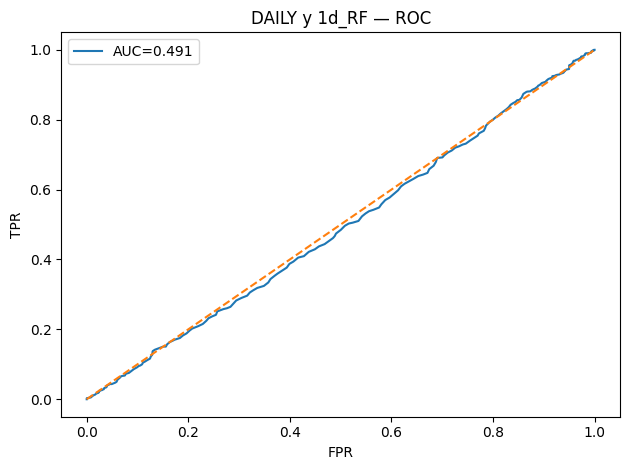

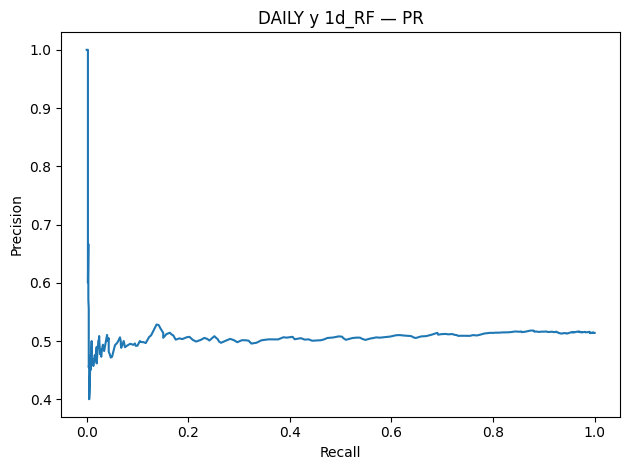

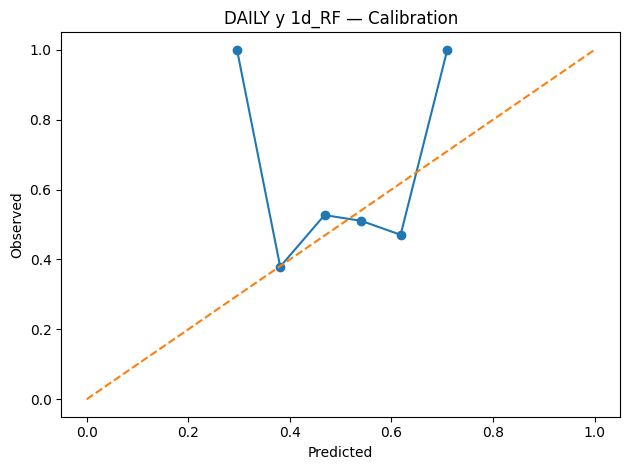

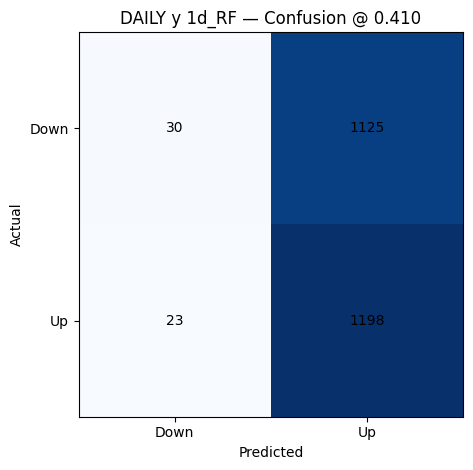

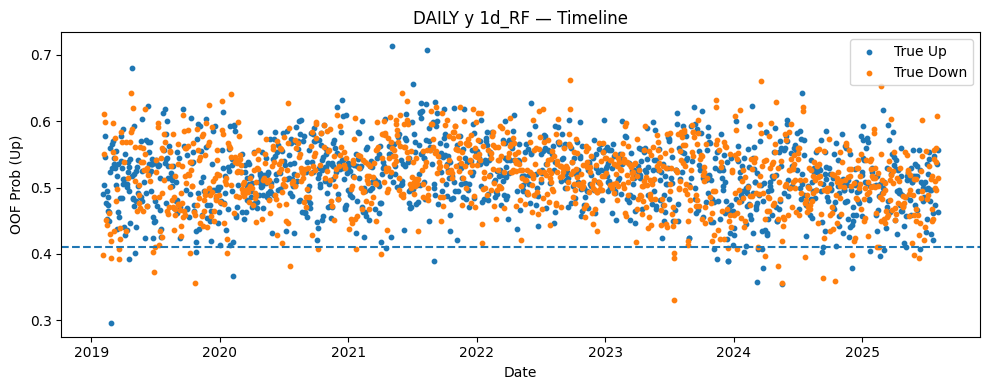


Plotting: daily | y | 1d_RIDGE


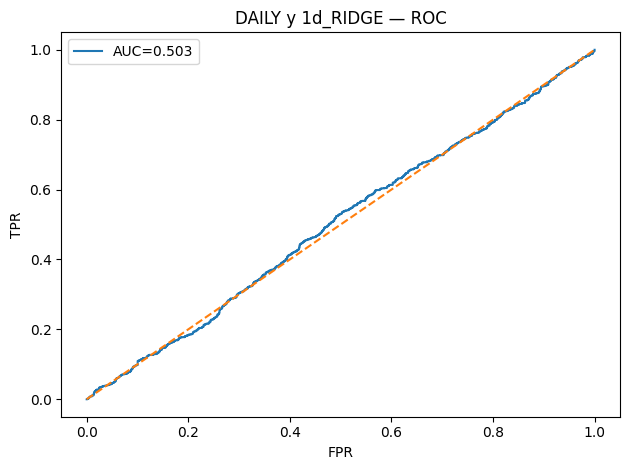

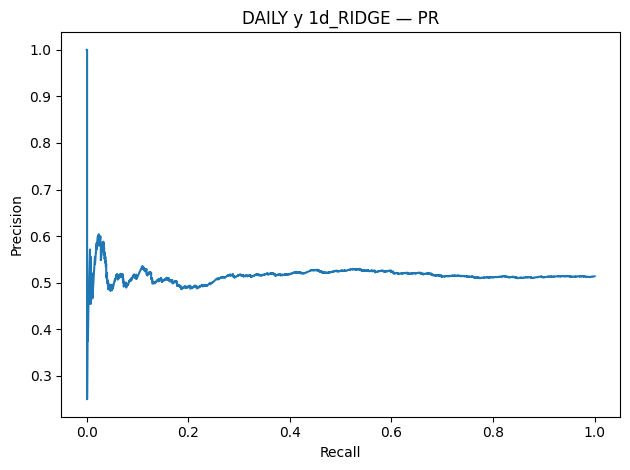

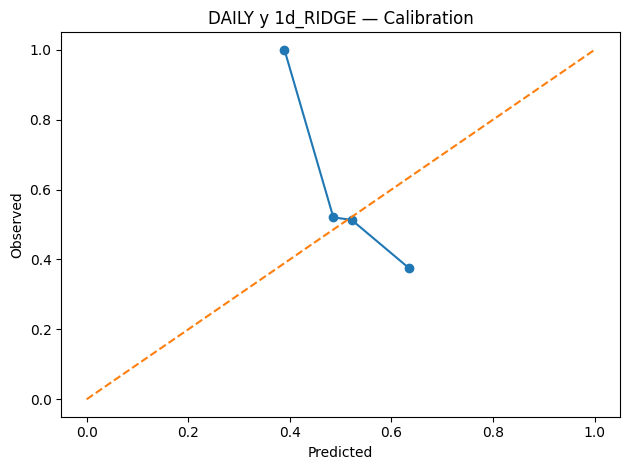

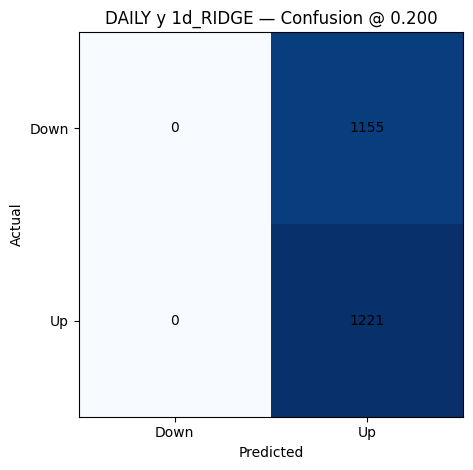

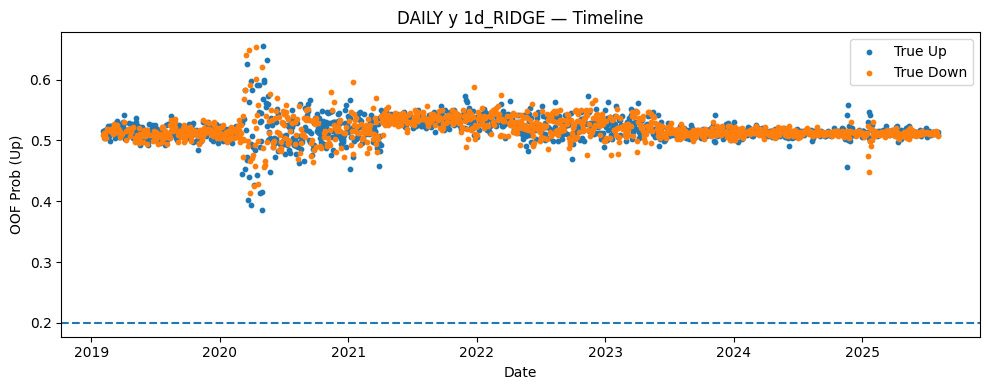


Plotting: daily | y | 1d_STACK


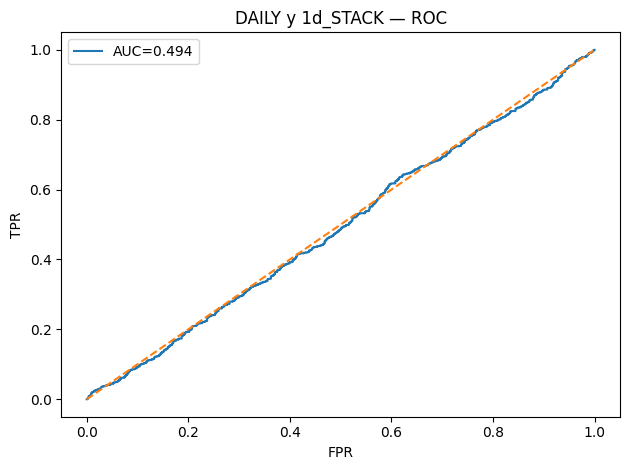

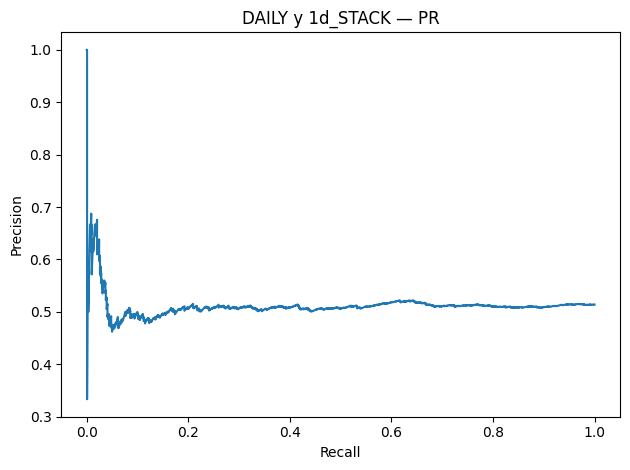

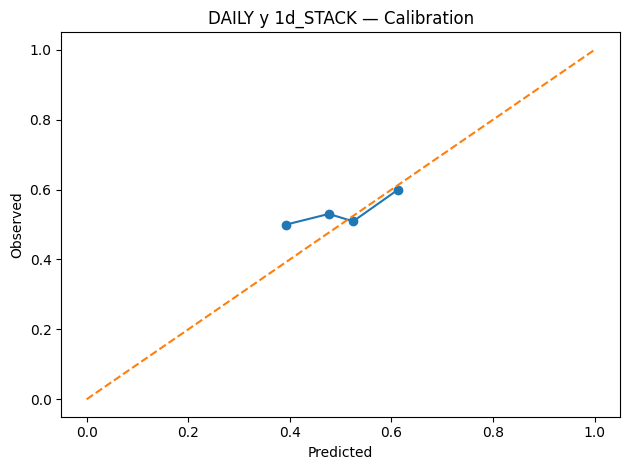

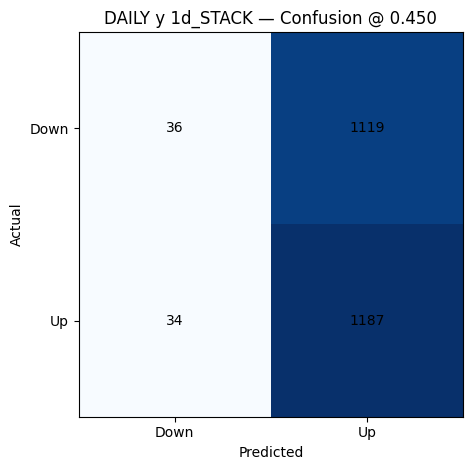

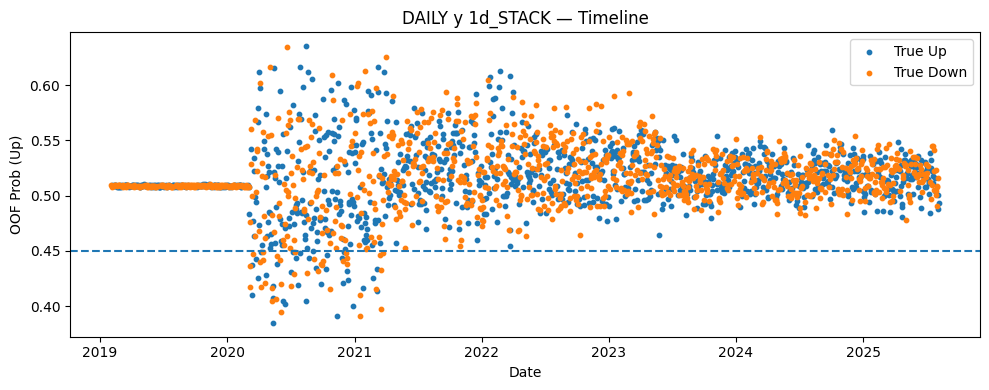


Plotting: daily | y | 1d_SVM


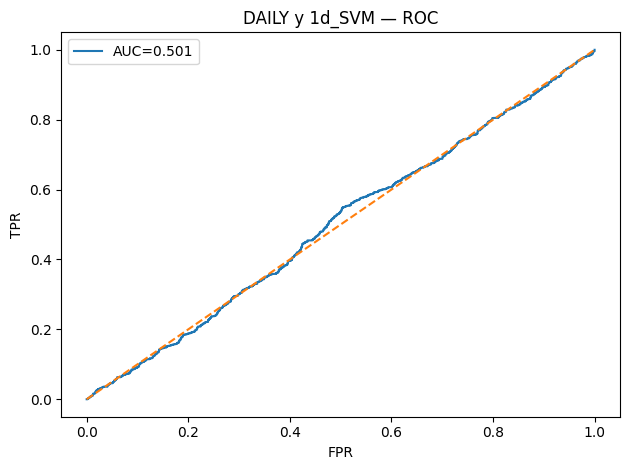

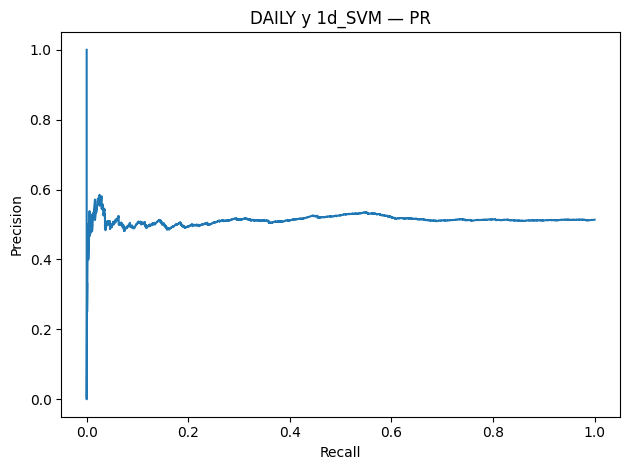

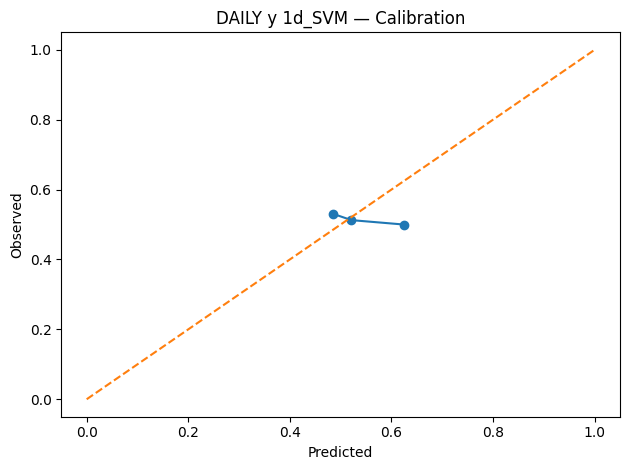

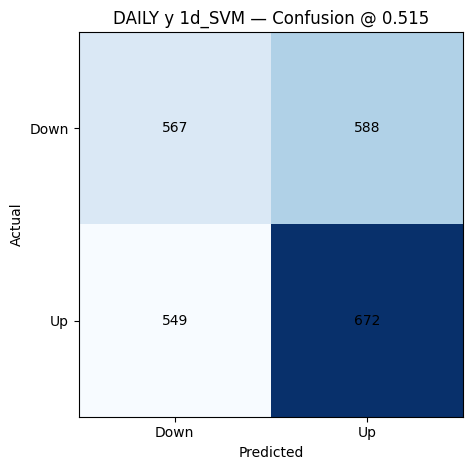

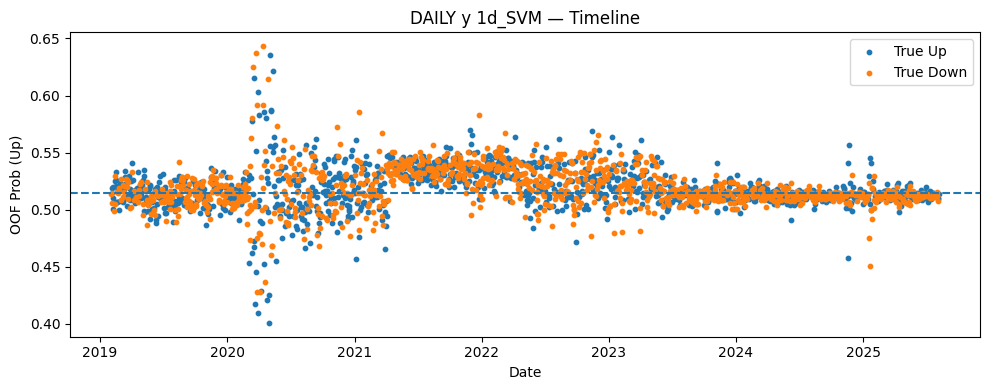


Plotting: daily | y | 3d_ET


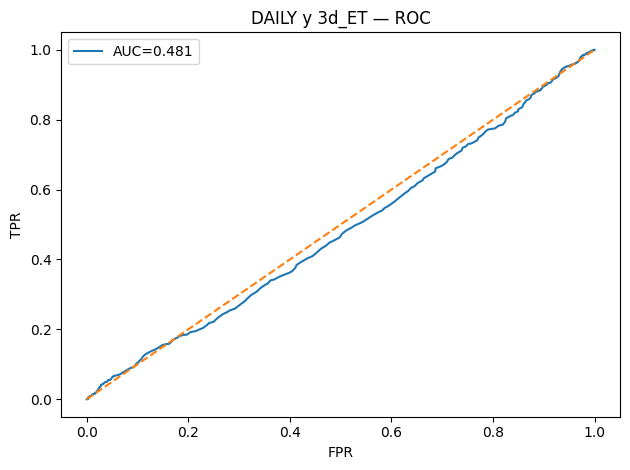

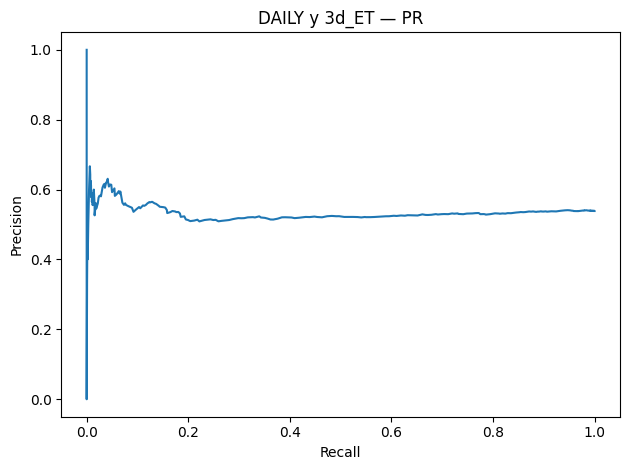

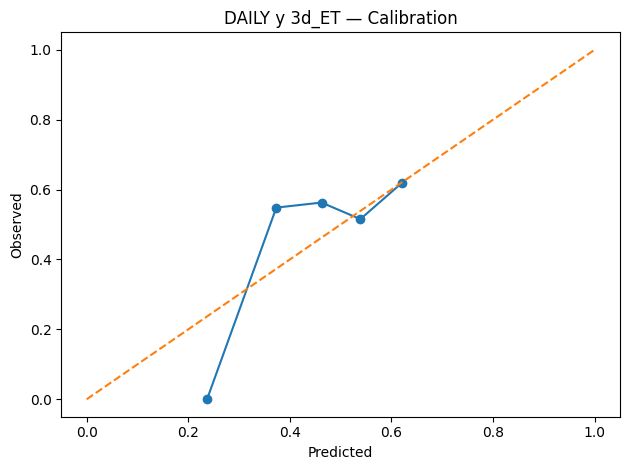

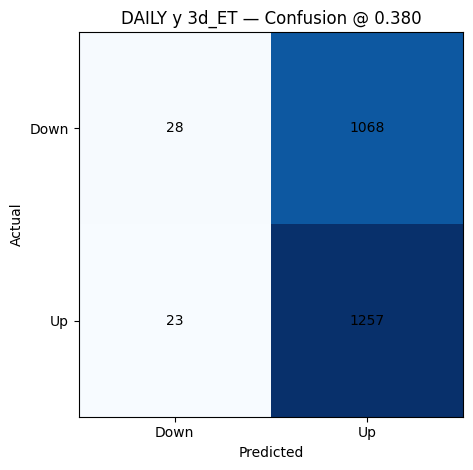

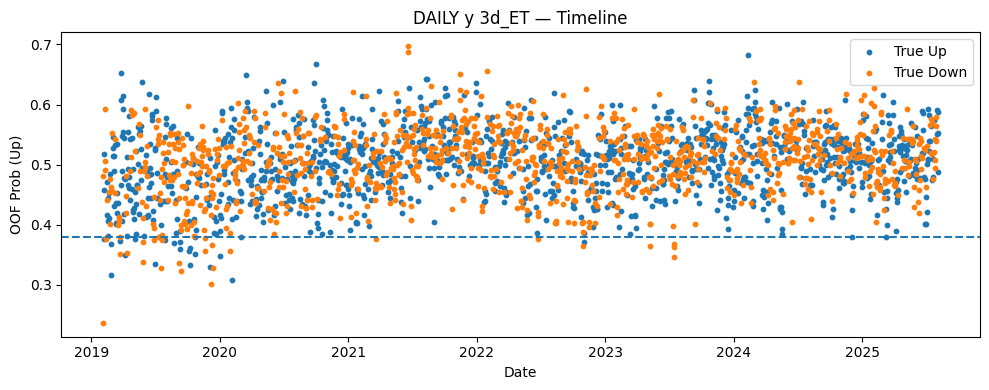


Plotting: daily | y | 3d_HGB


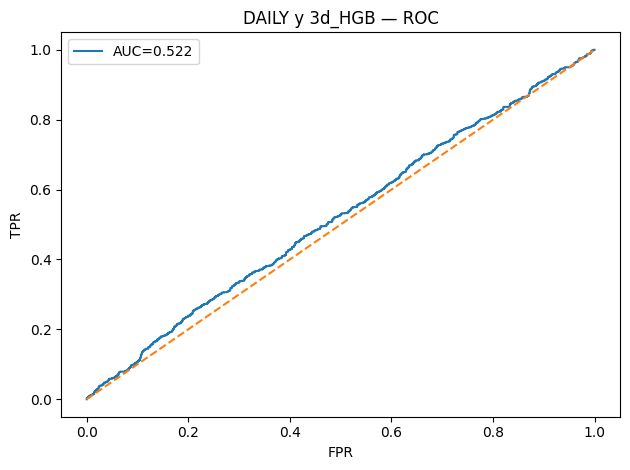

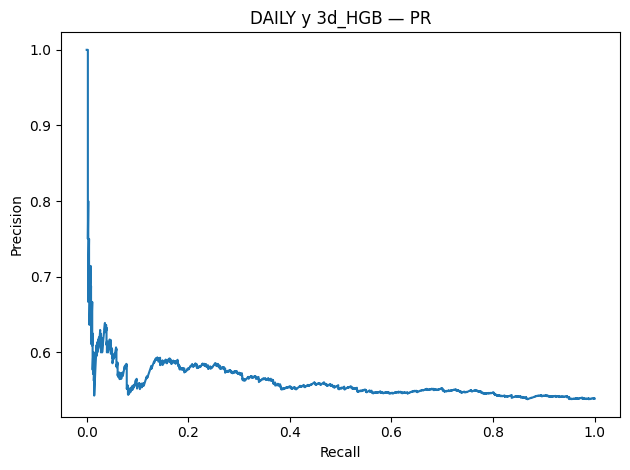

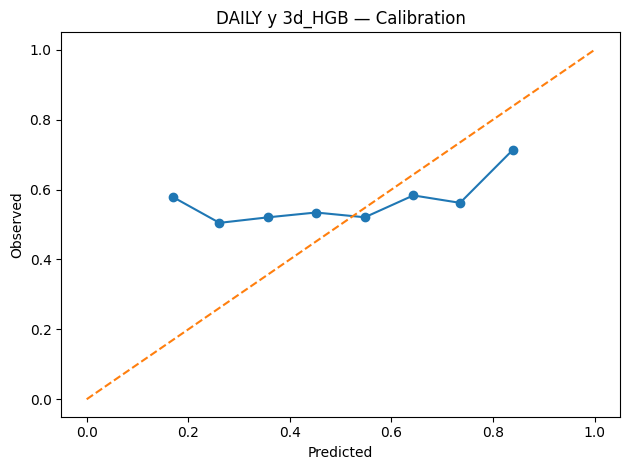

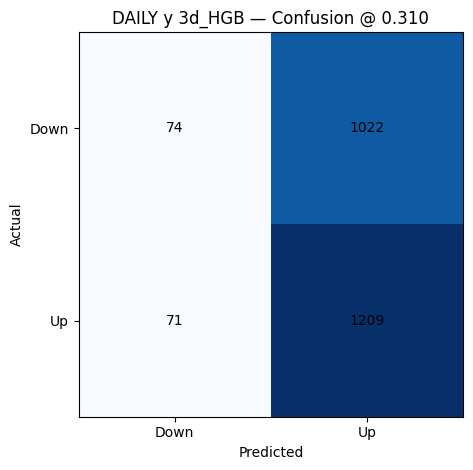

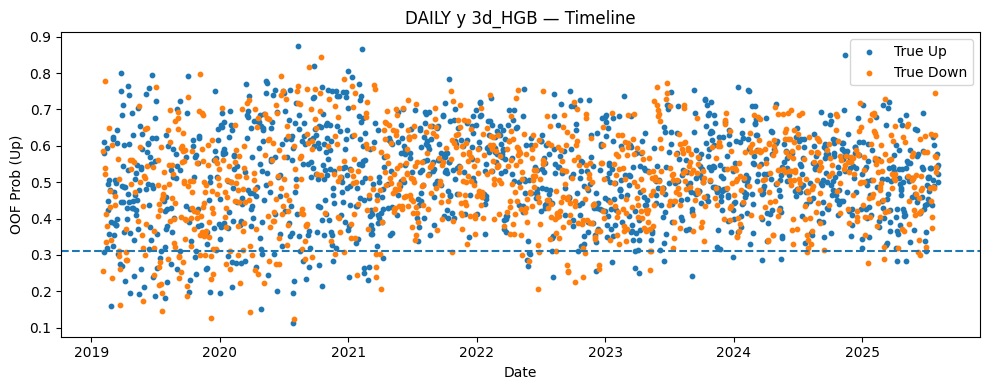


Plotting: daily | y | 3d_KNN


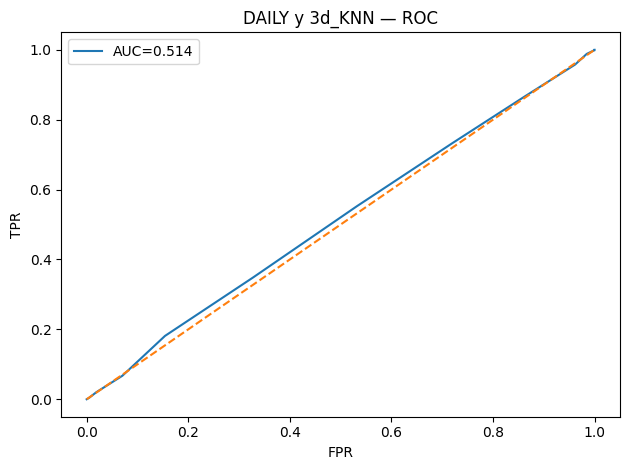

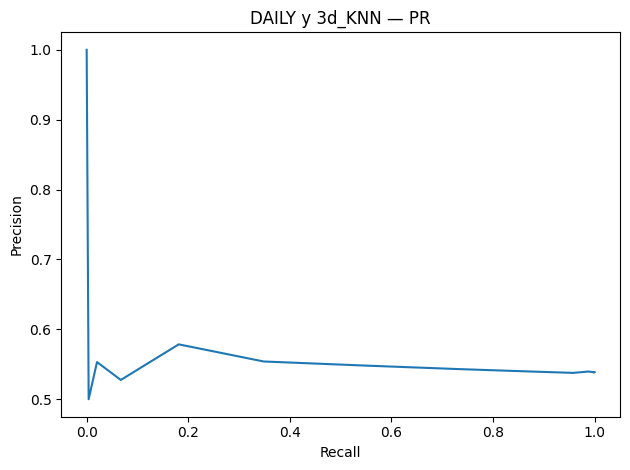

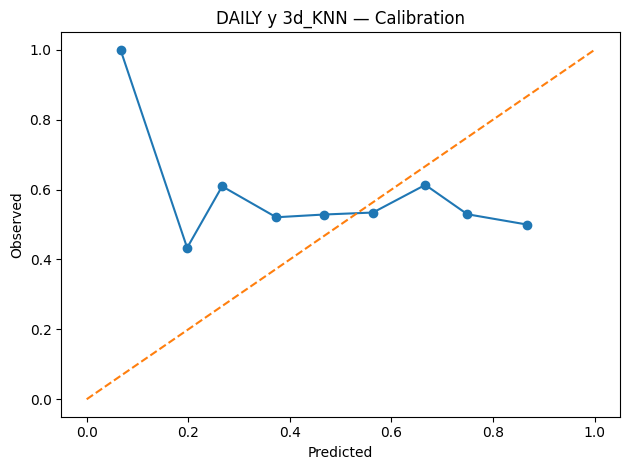

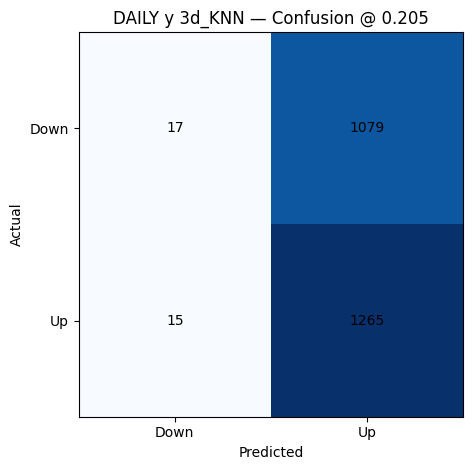

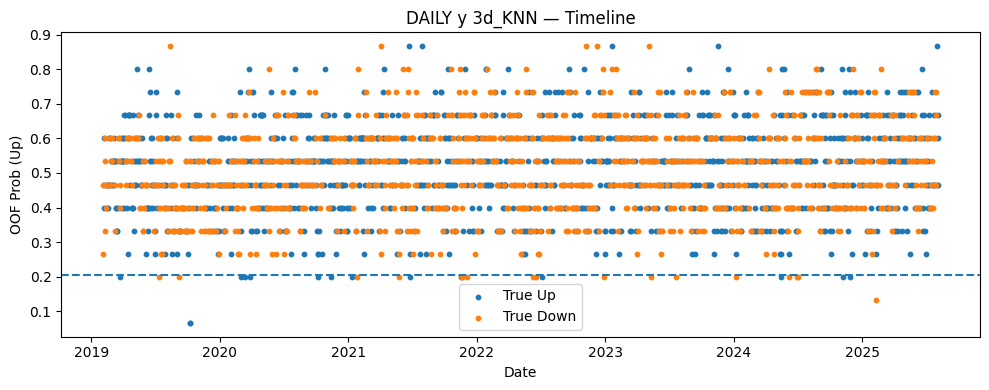


Plotting: daily | y | 3d_LGBM


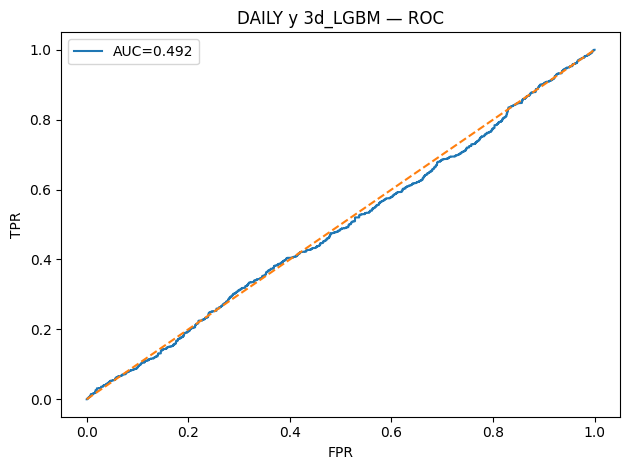

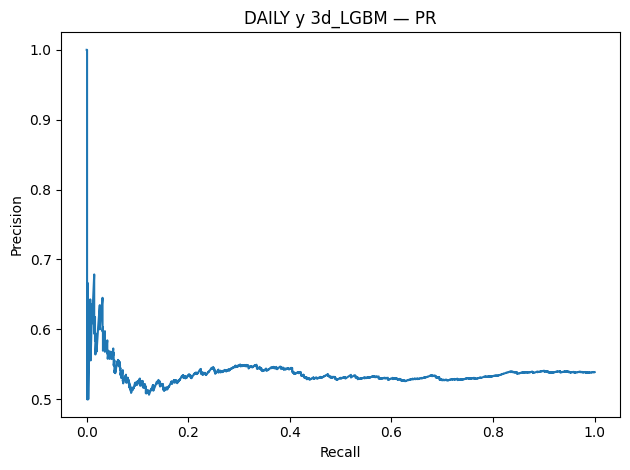

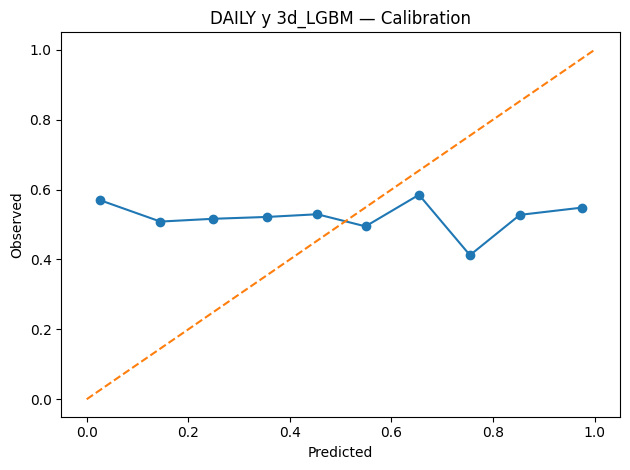

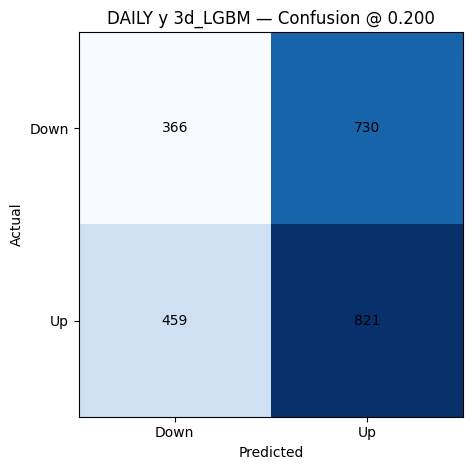

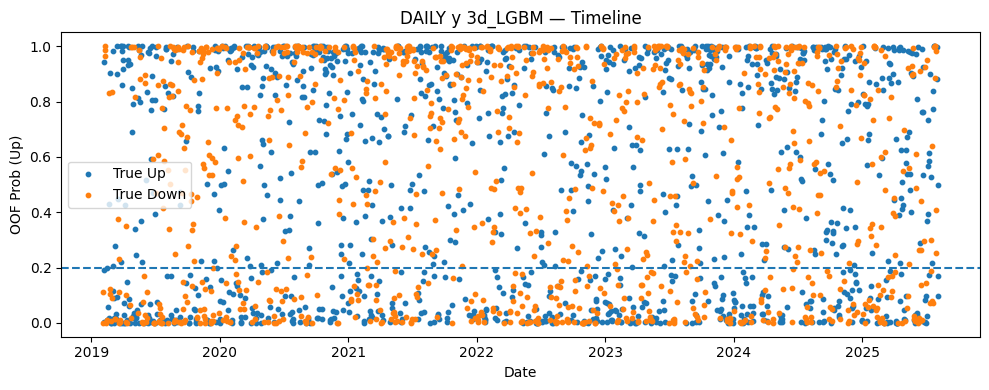


Plotting: daily | y | 3d_LR


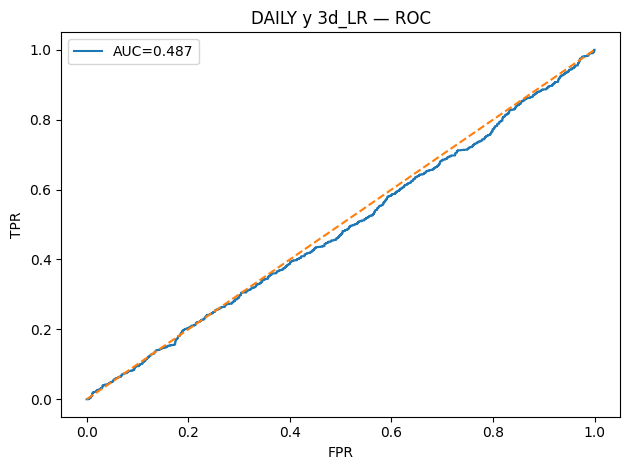

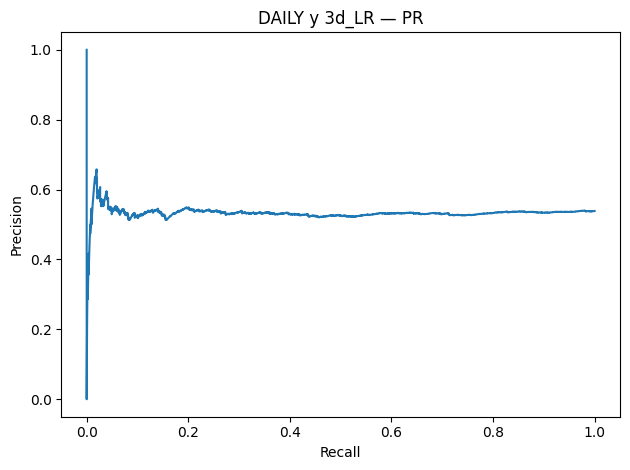

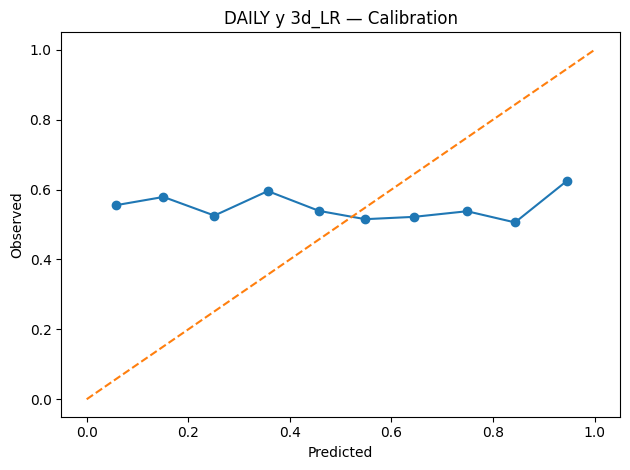

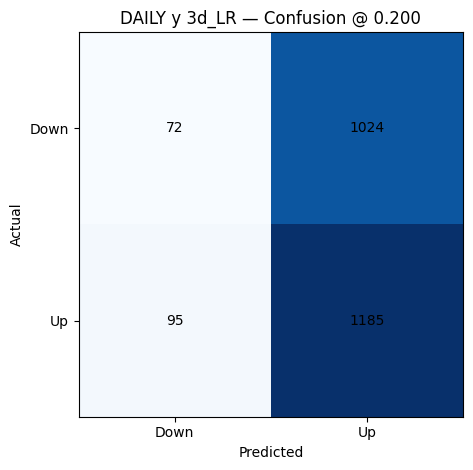

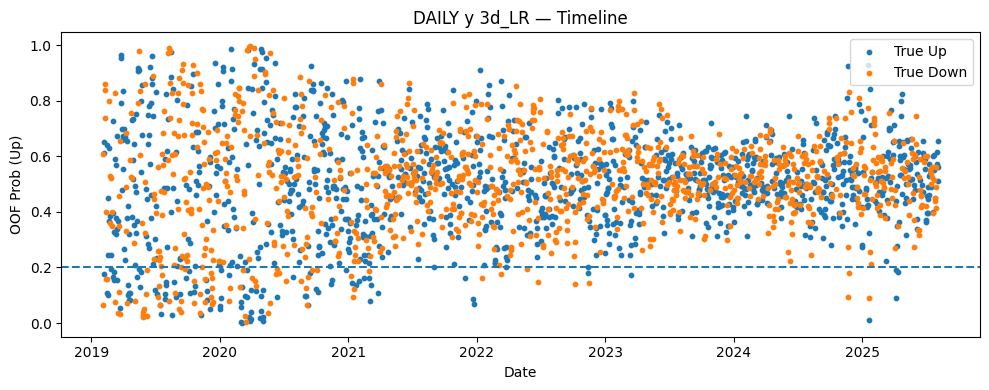


Plotting: daily | y | 3d_RF


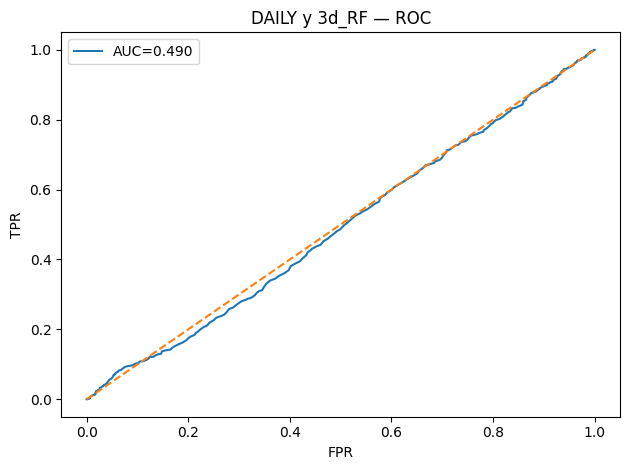

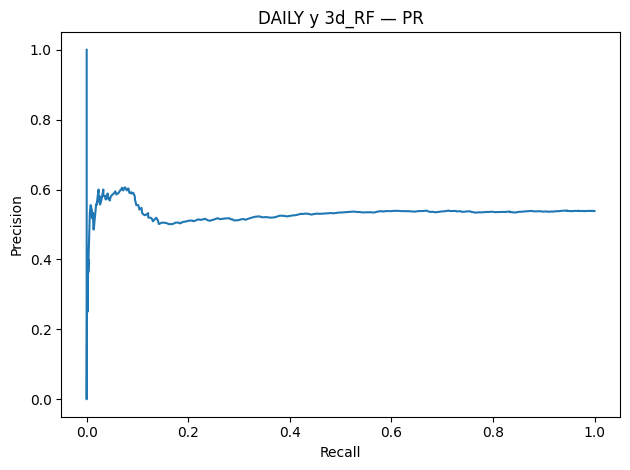

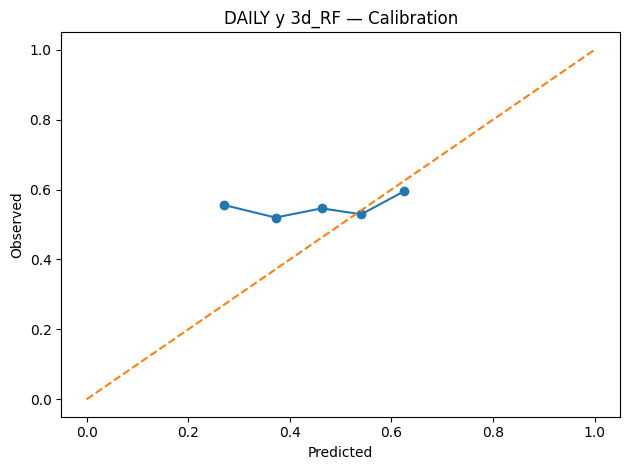

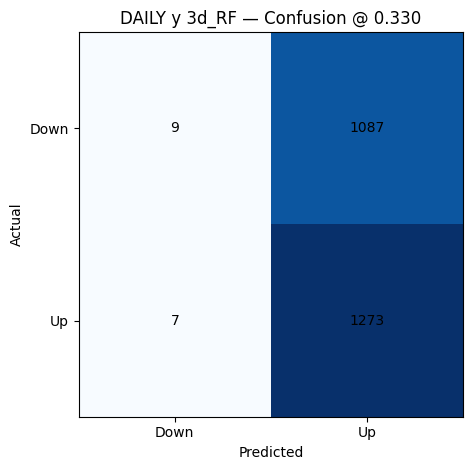

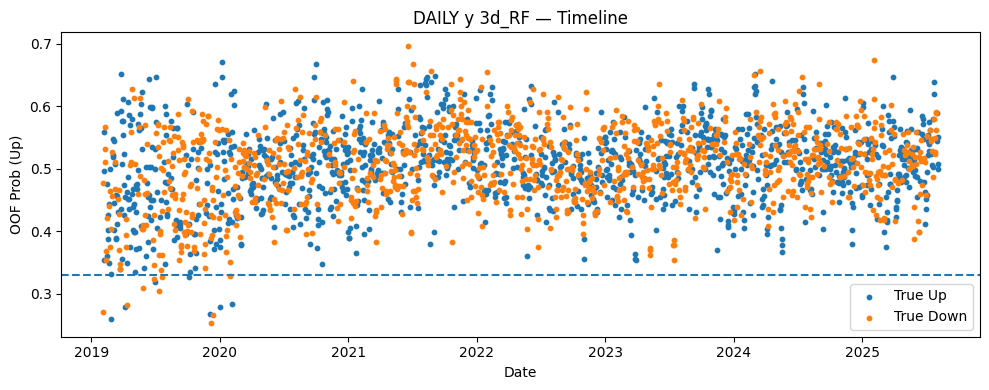


Plotting: daily | y | 3d_RIDGE


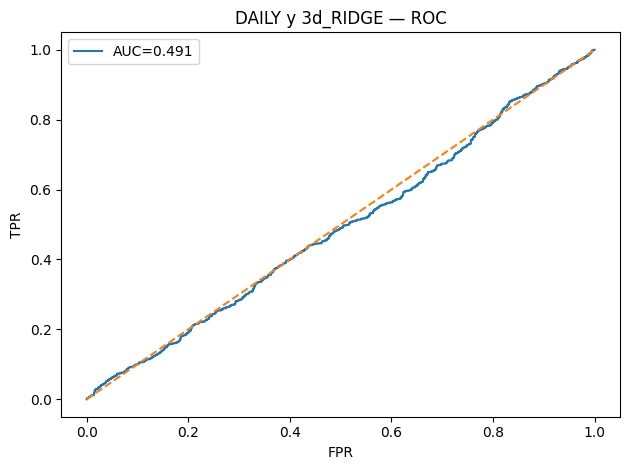

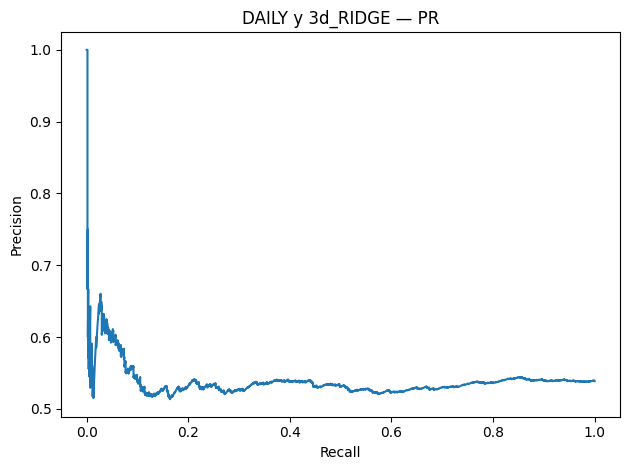

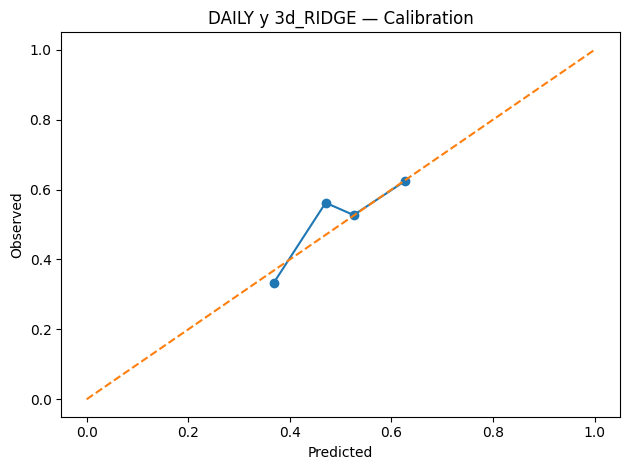

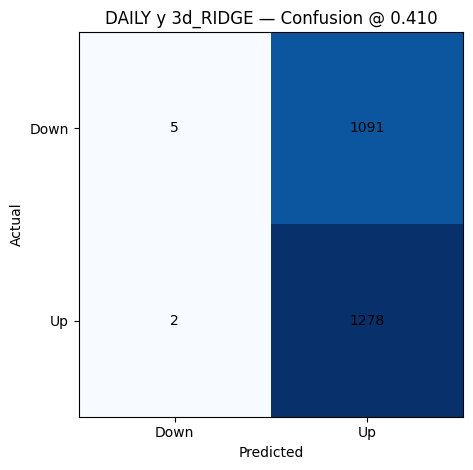

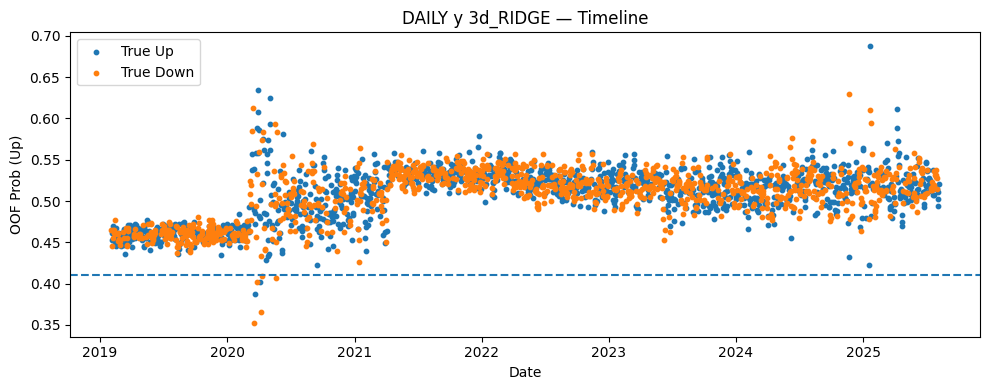


Plotting: daily | y | 3d_STACK


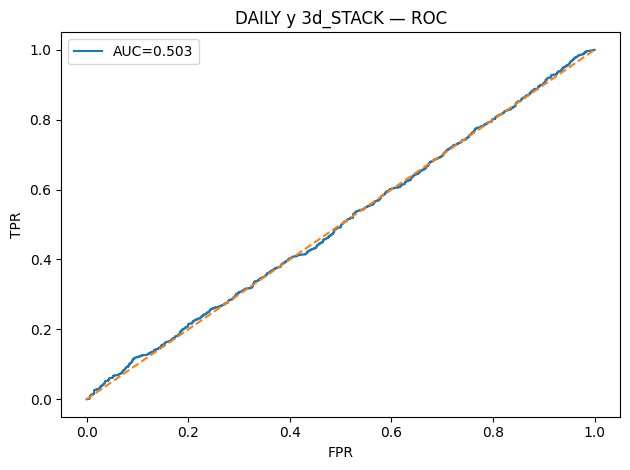

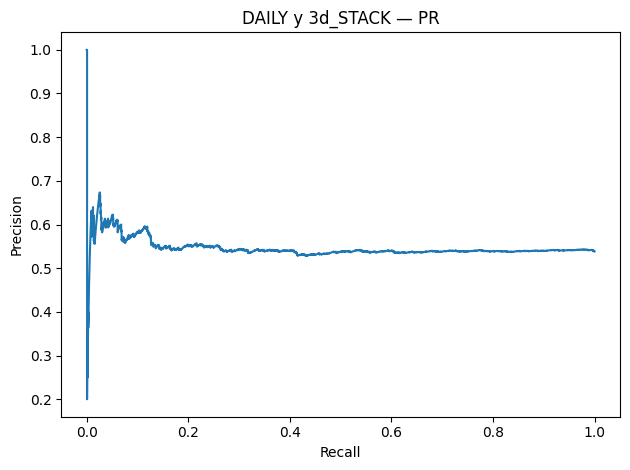

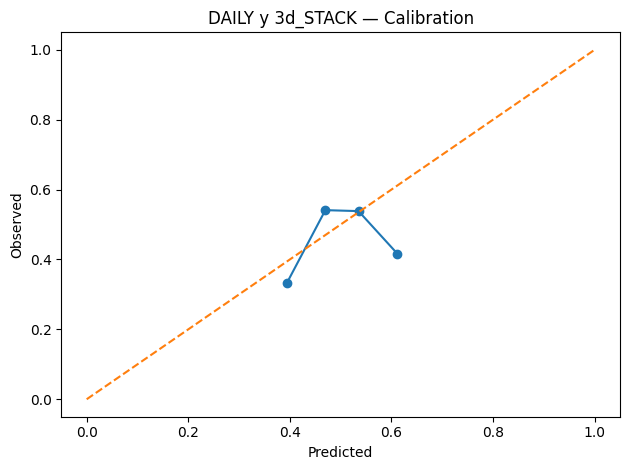

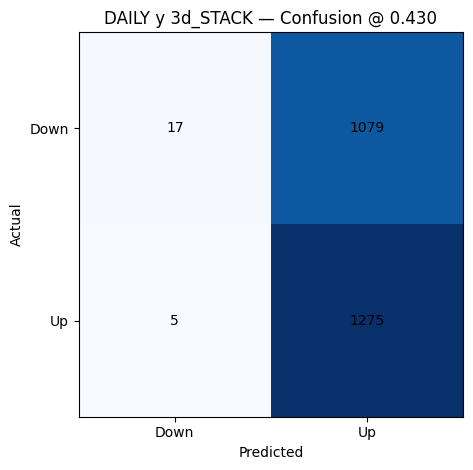

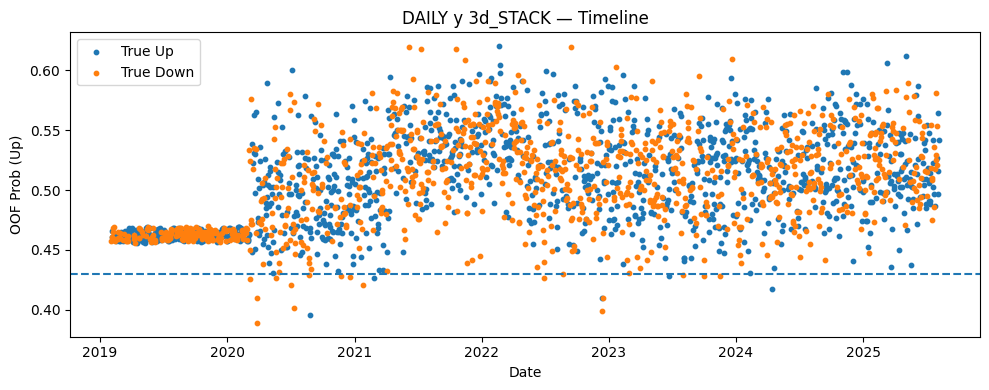


Plotting: daily | y | 3d_SVM


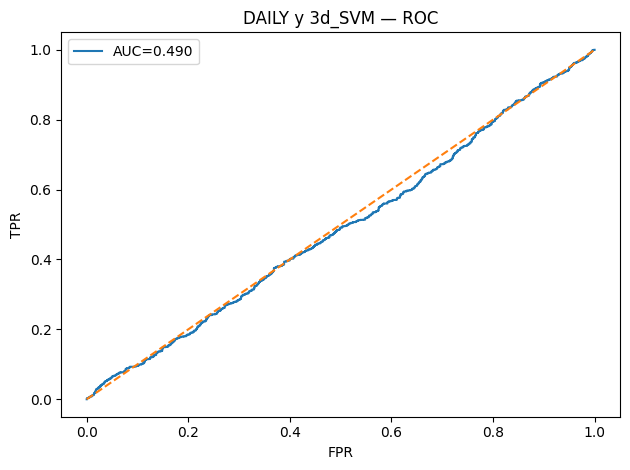

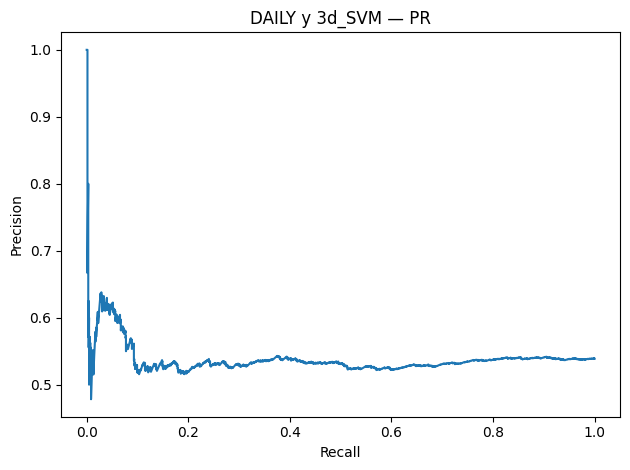

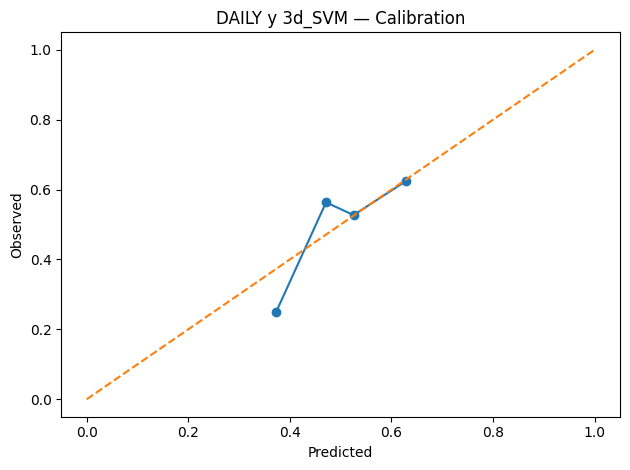

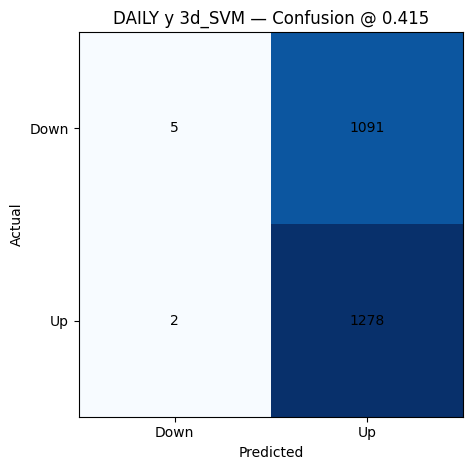

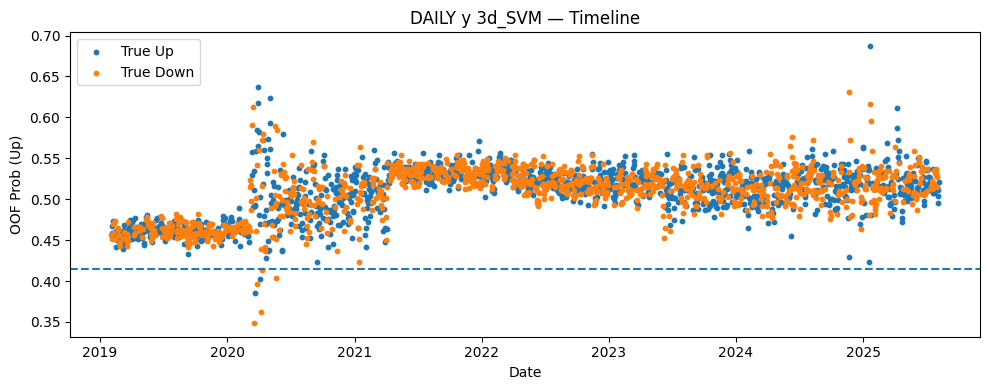


Plotting: daily | y | 5d_ET


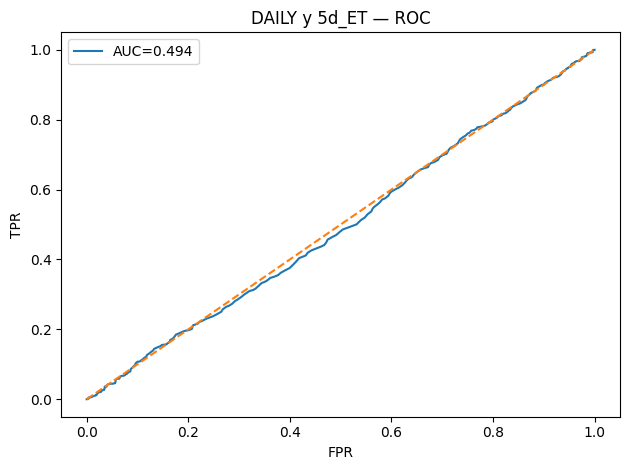

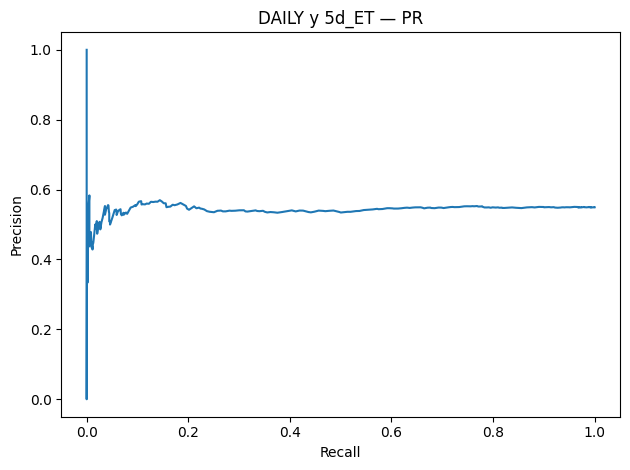

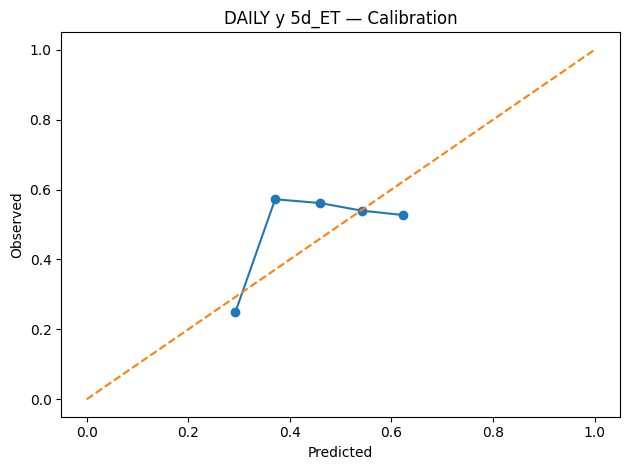

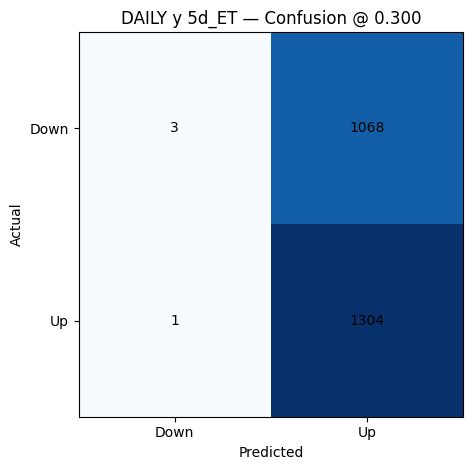

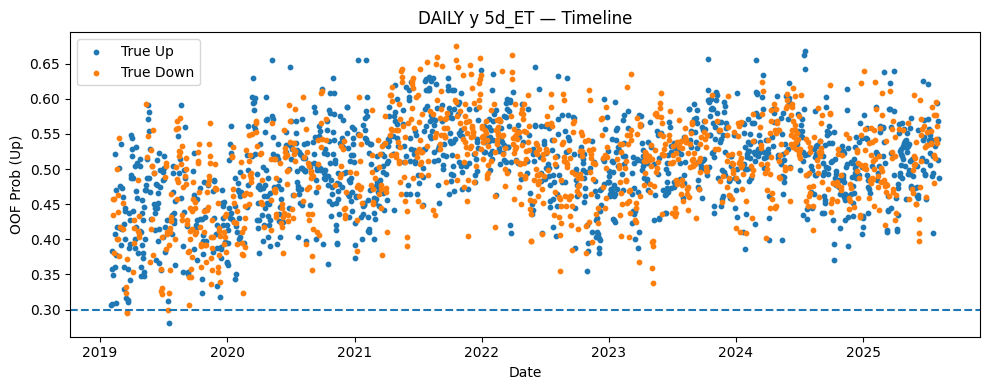


Plotting: daily | y | 5d_HGB


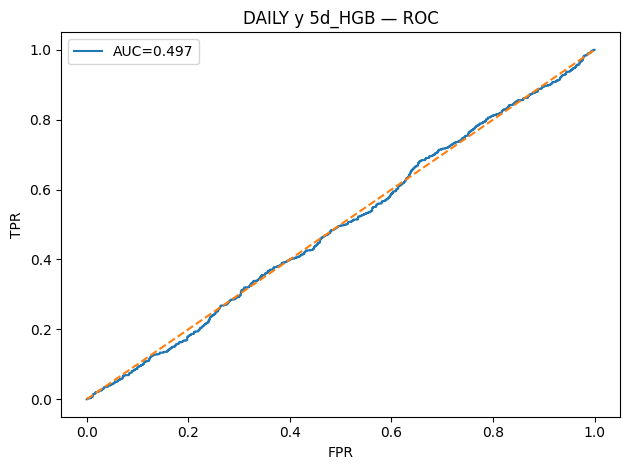

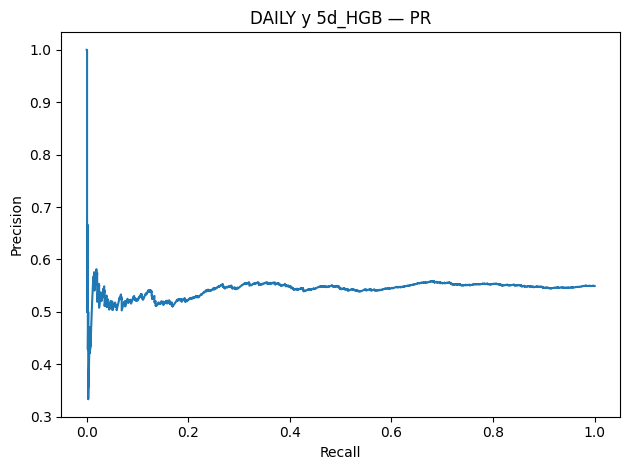

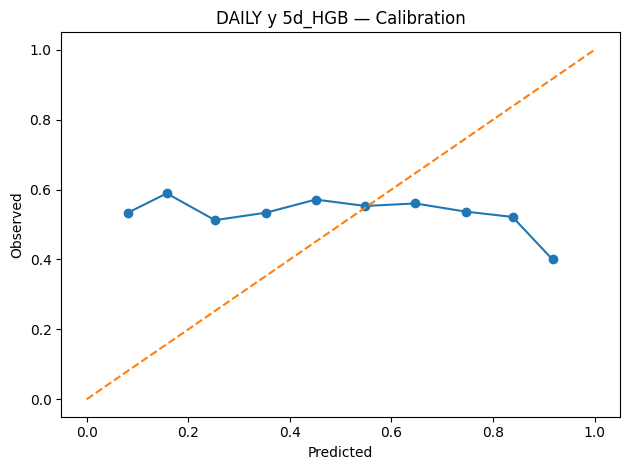

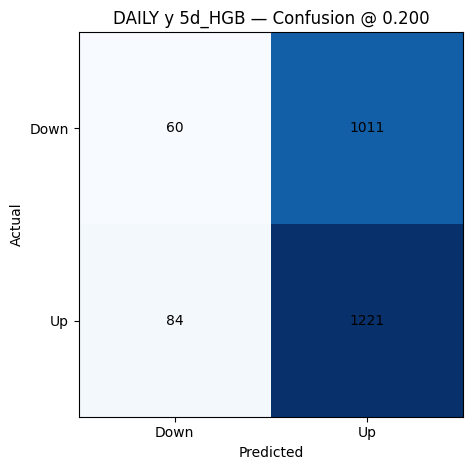

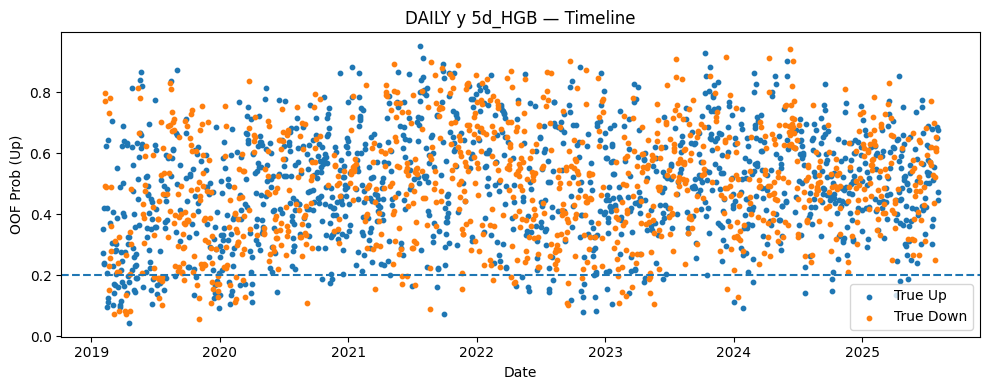


Plotting: daily | y | 5d_KNN


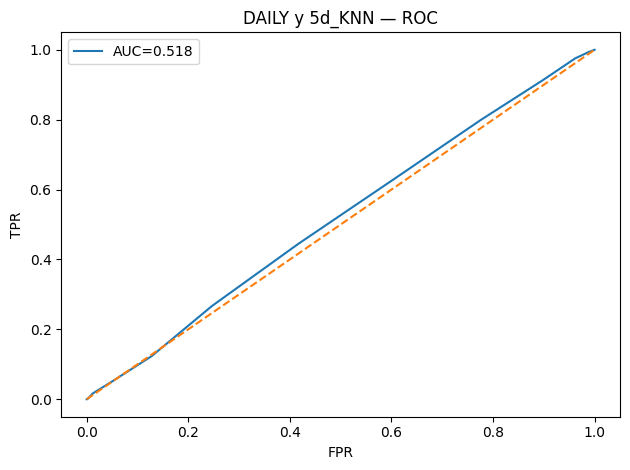

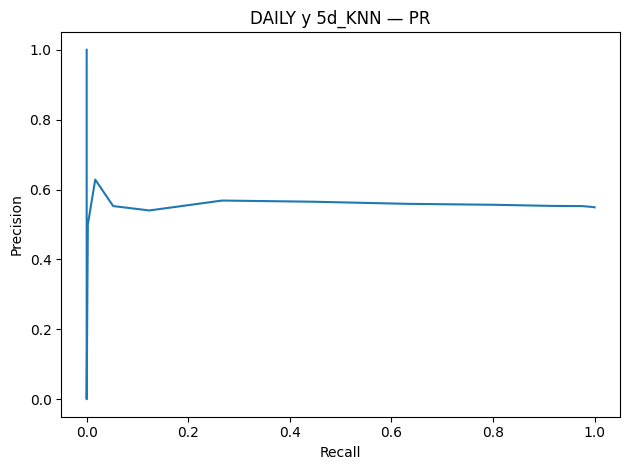

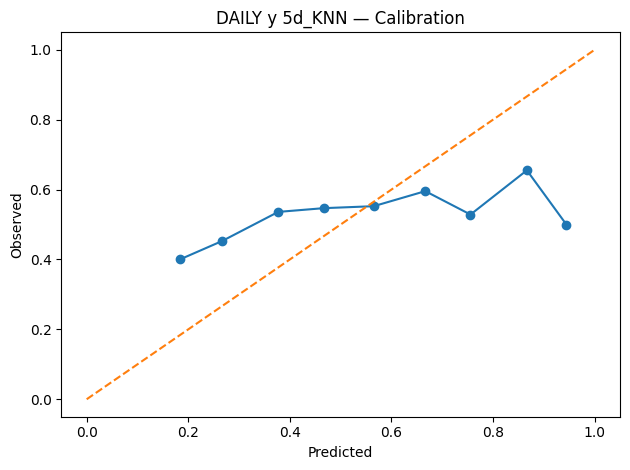

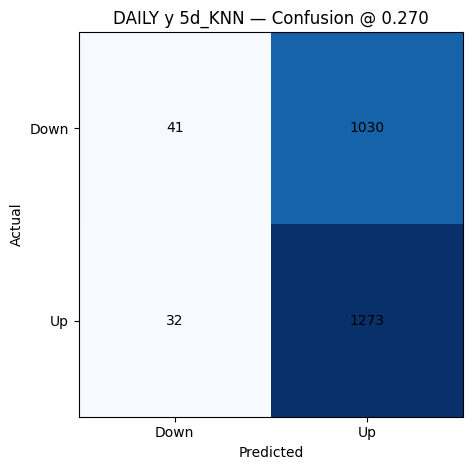

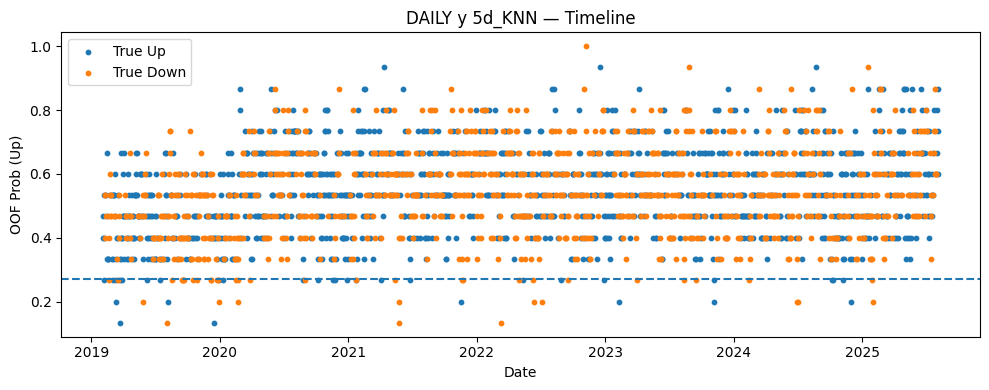


Plotting: daily | y | 5d_LGBM


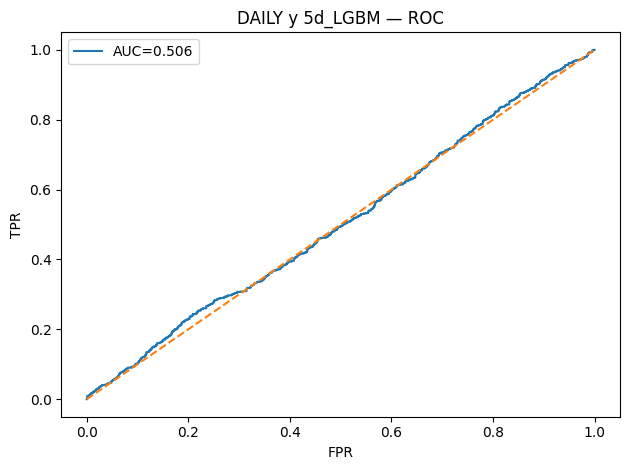

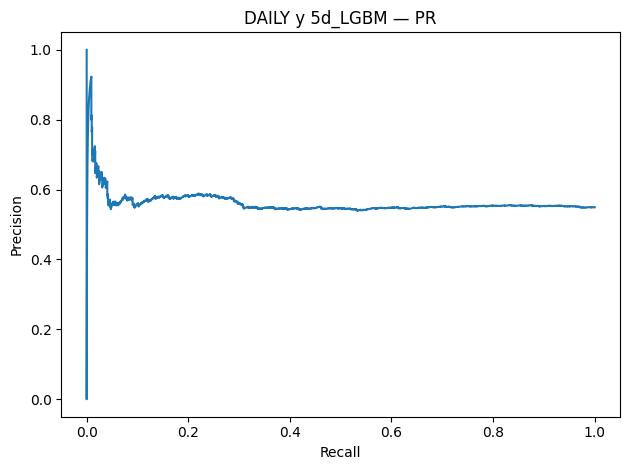

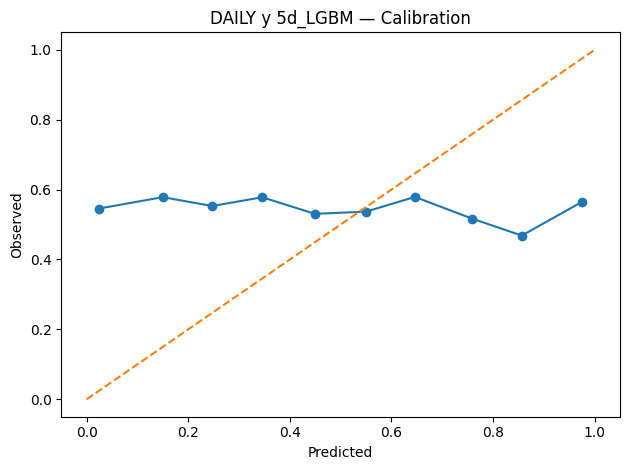

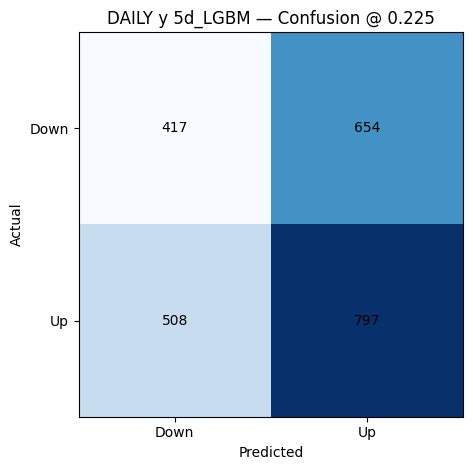

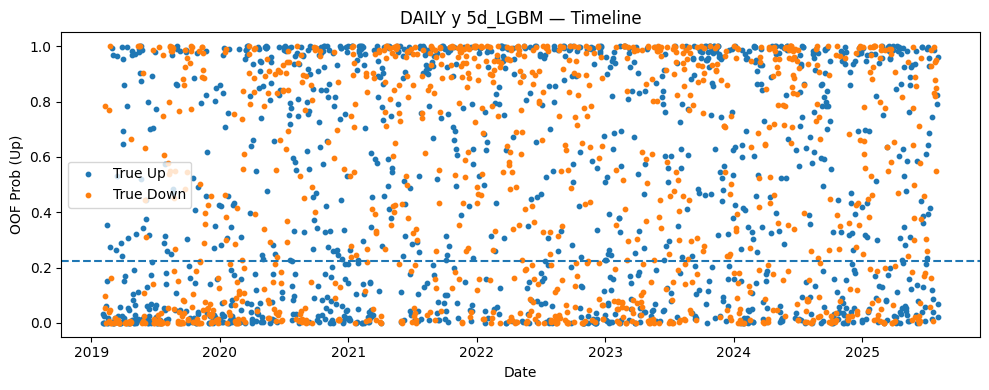


Plotting: daily | y | 5d_LR


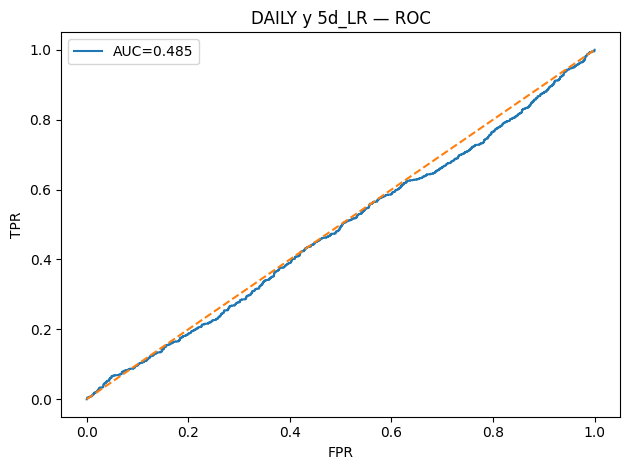

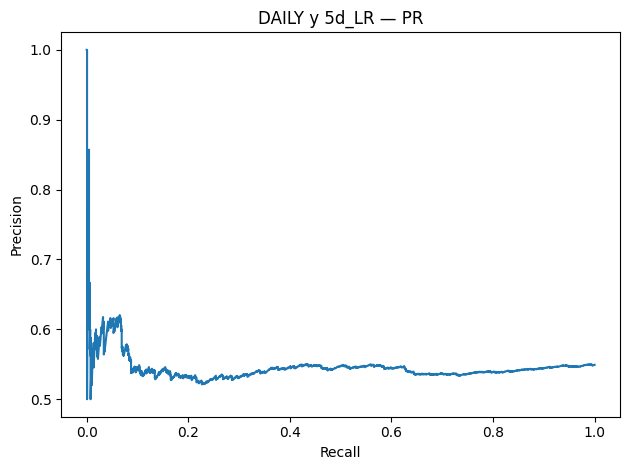

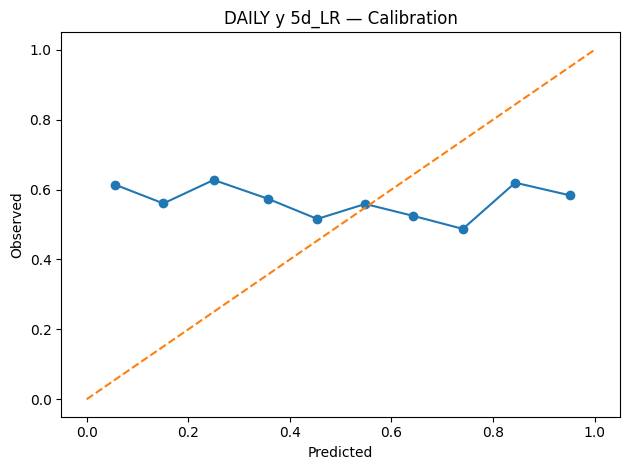

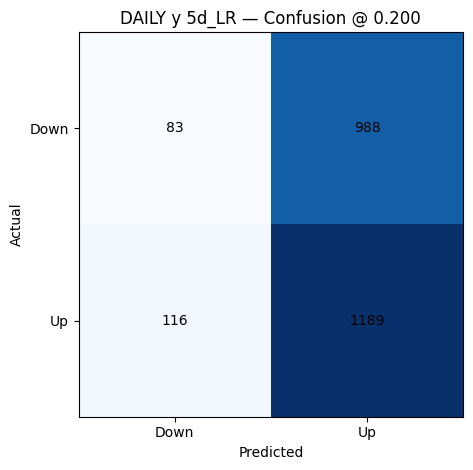

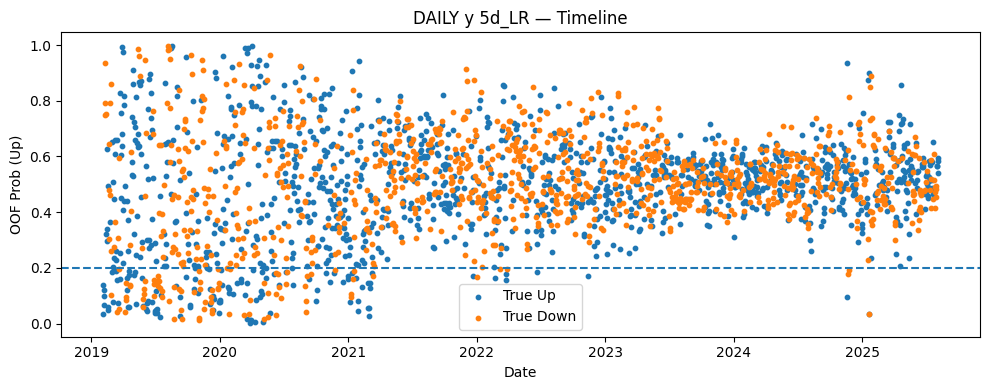


Plotting: daily | y | 5d_RF


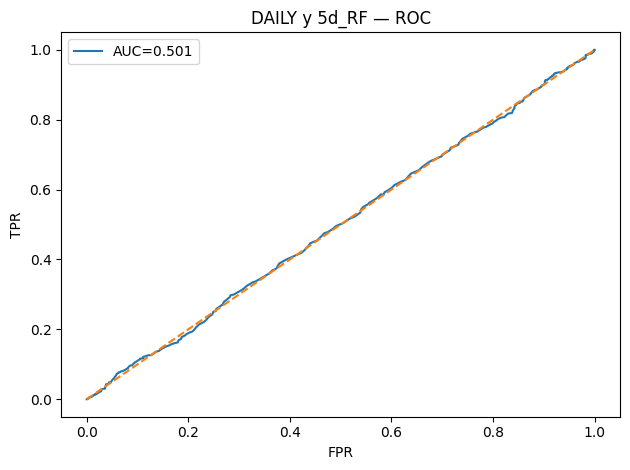

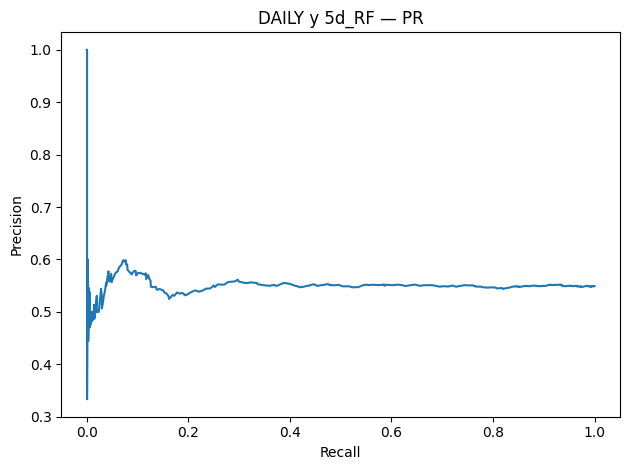

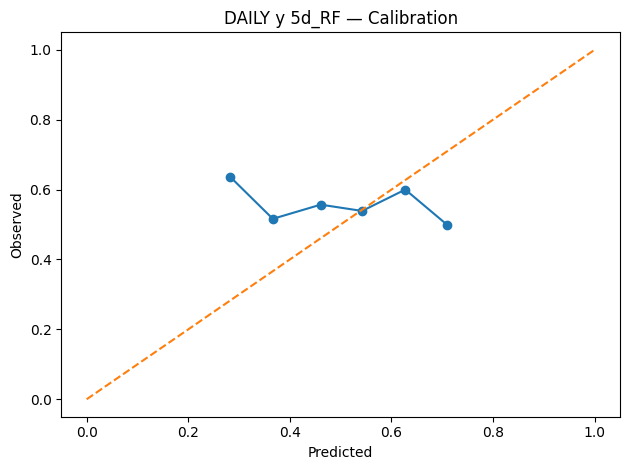

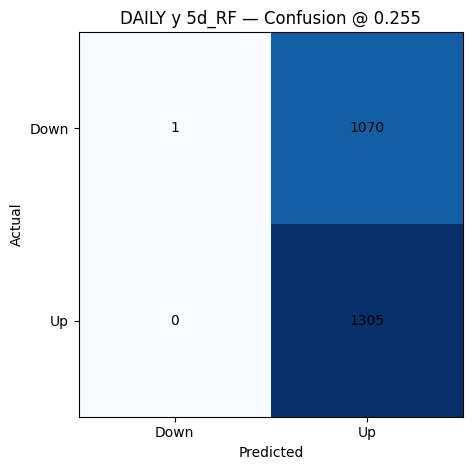

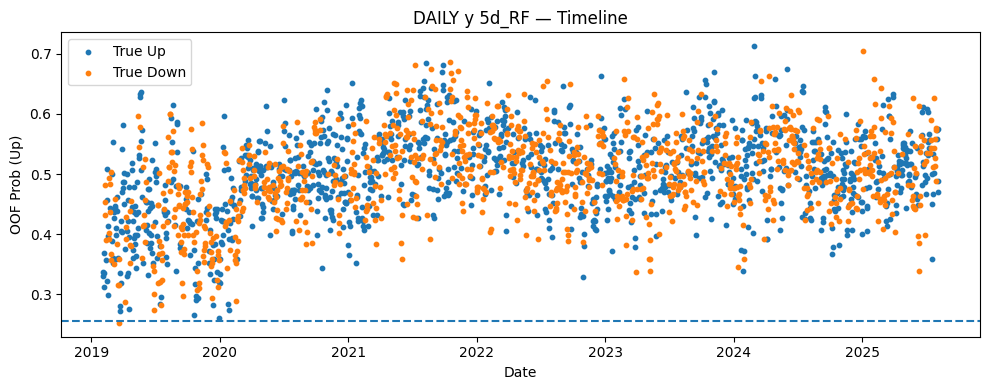


Plotting: daily | y | 5d_RIDGE


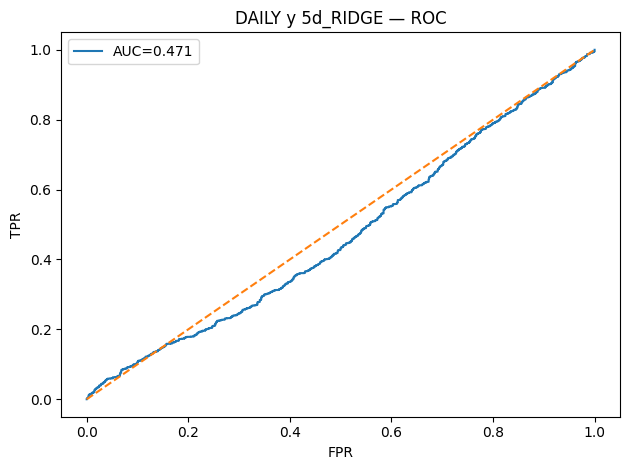

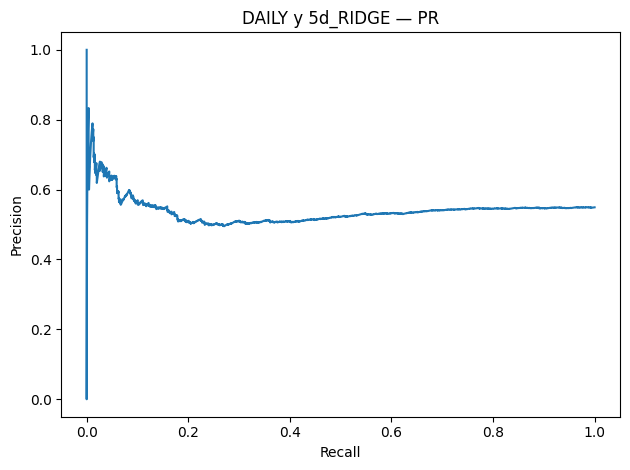

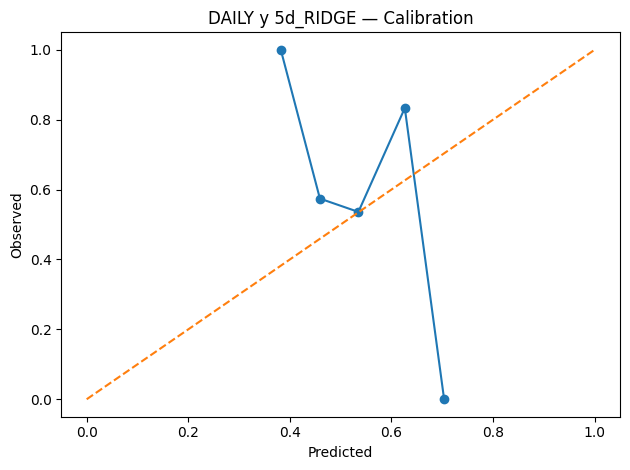

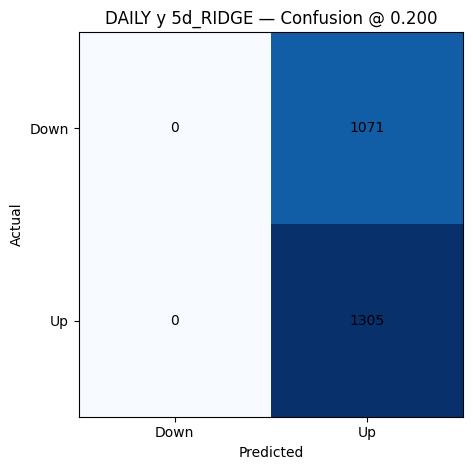

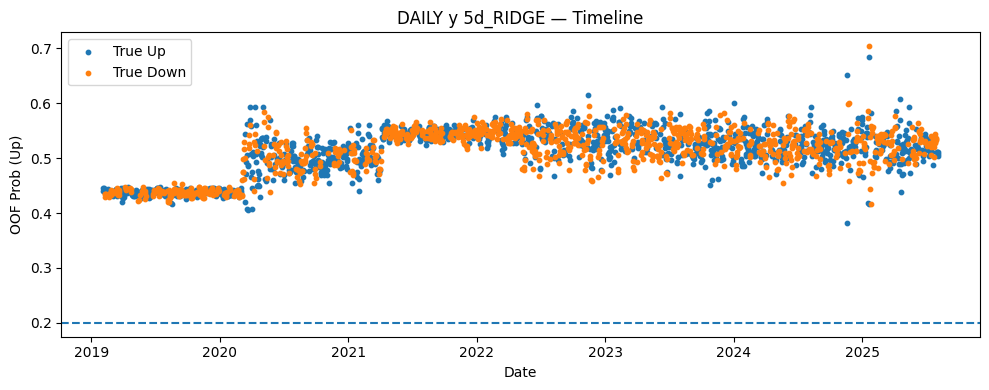


Plotting: daily | y | 5d_STACK


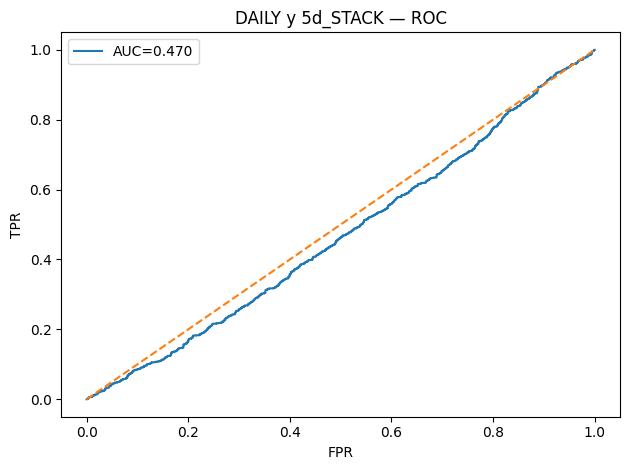

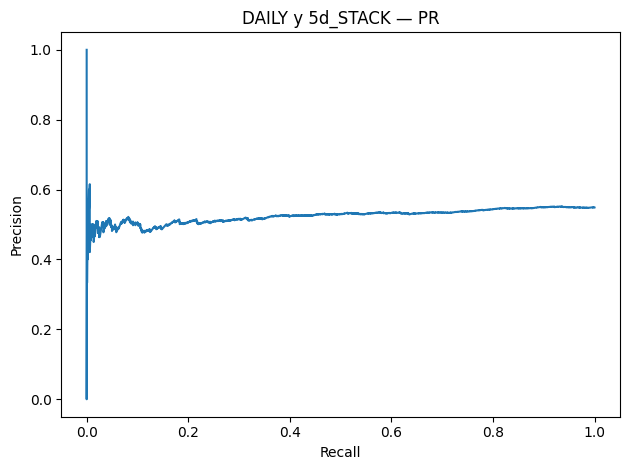

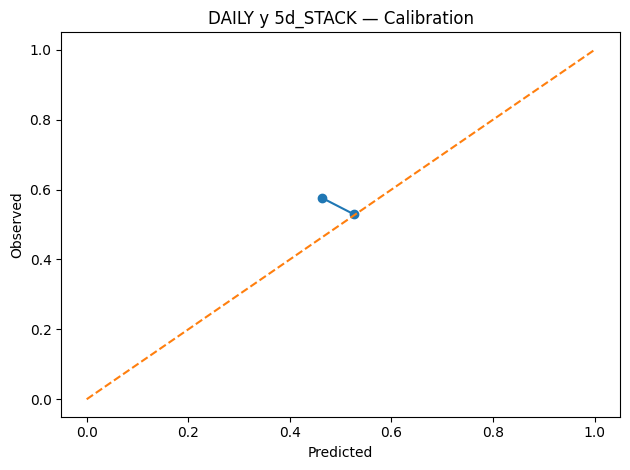

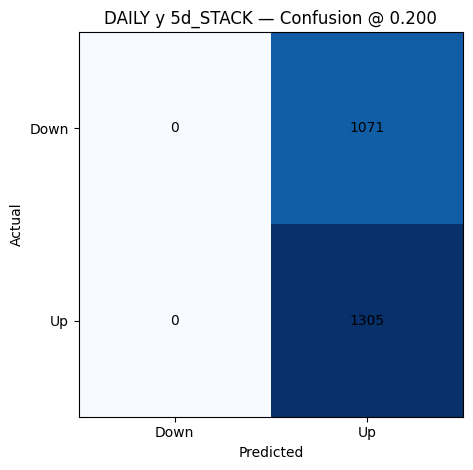

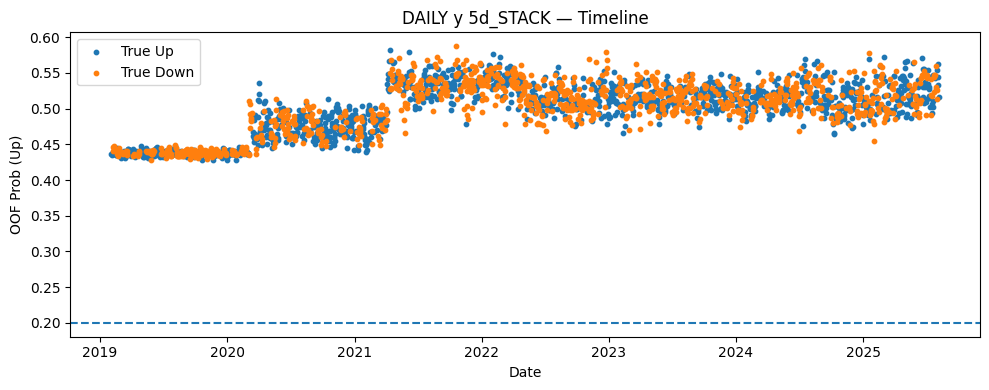


Plotting: daily | y | 5d_SVM


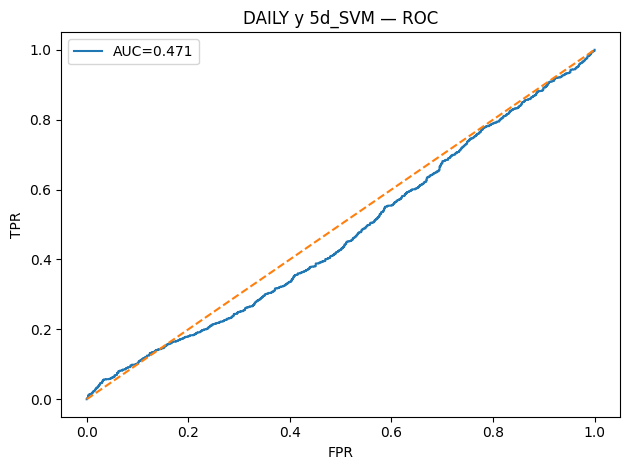

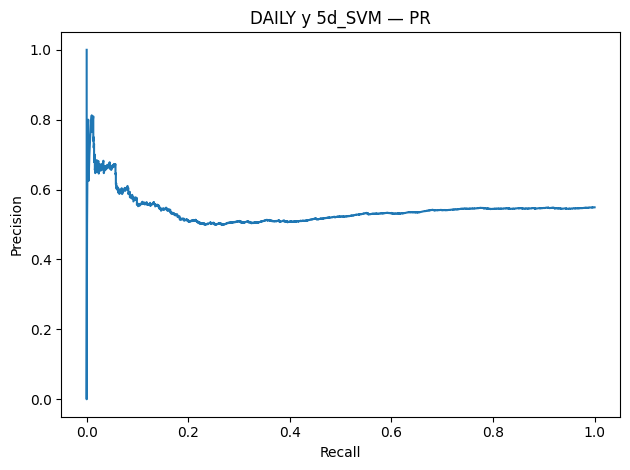

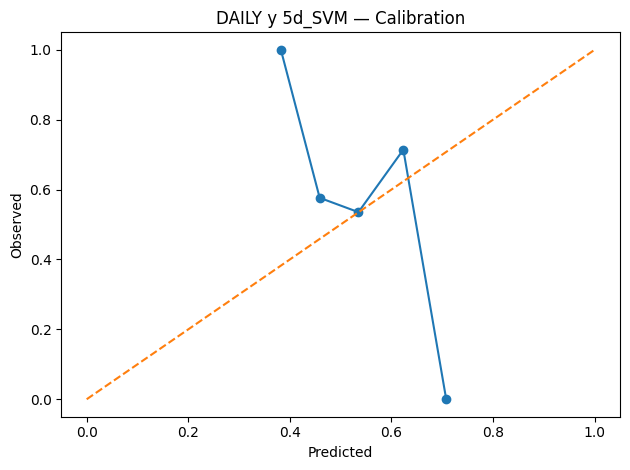

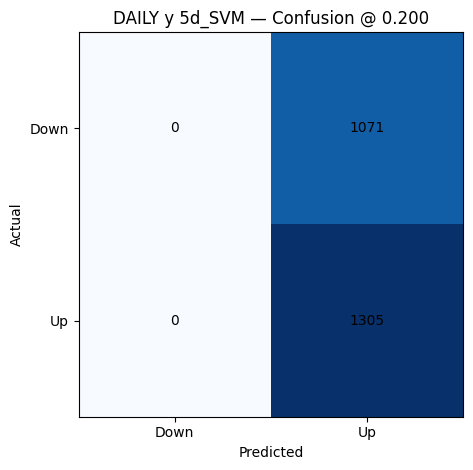

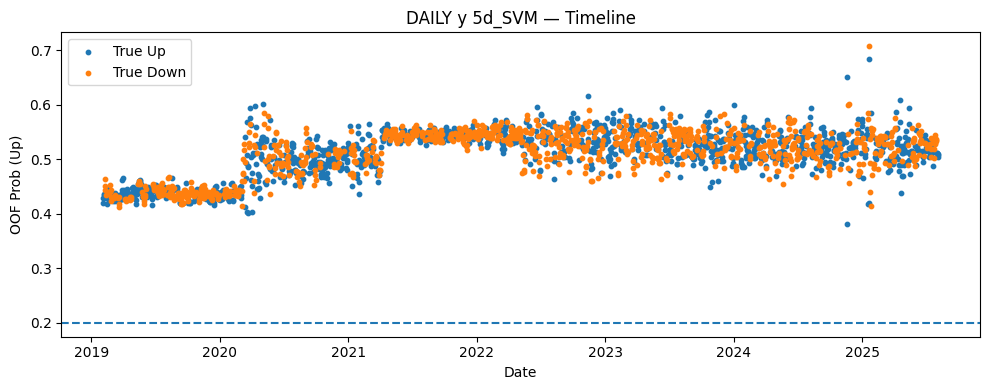


Plotting: weekly | y | 1w_ET


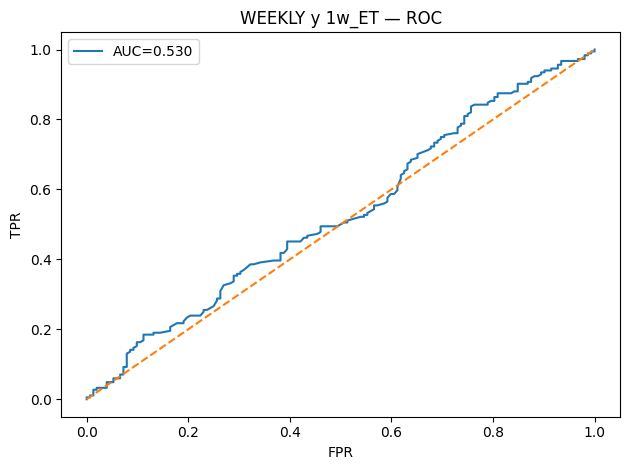

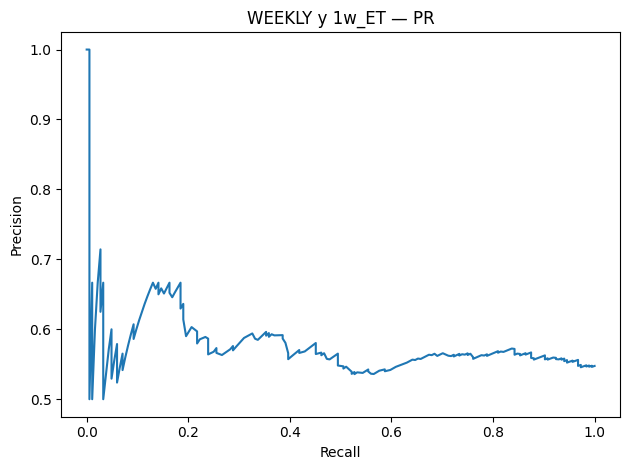

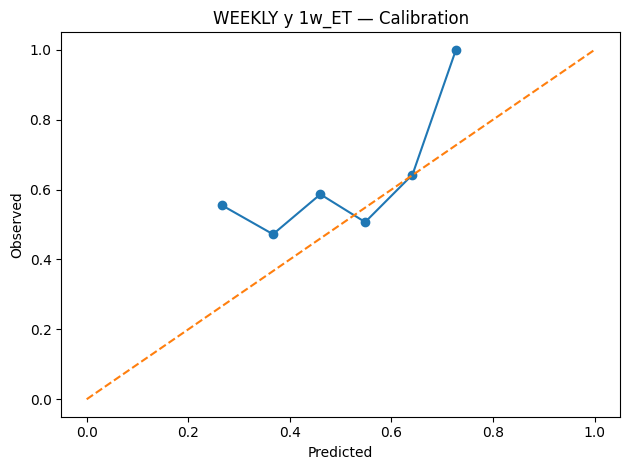

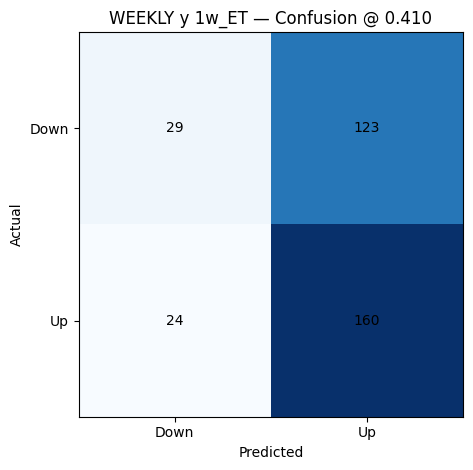

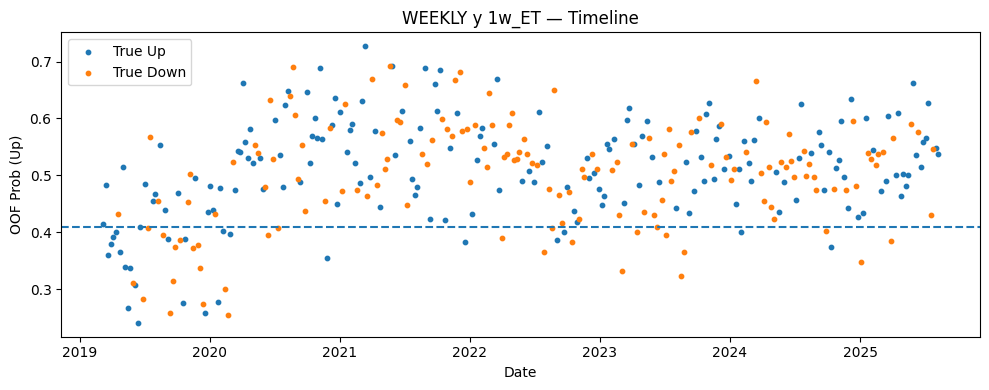


Plotting: weekly | y | 1w_HGB


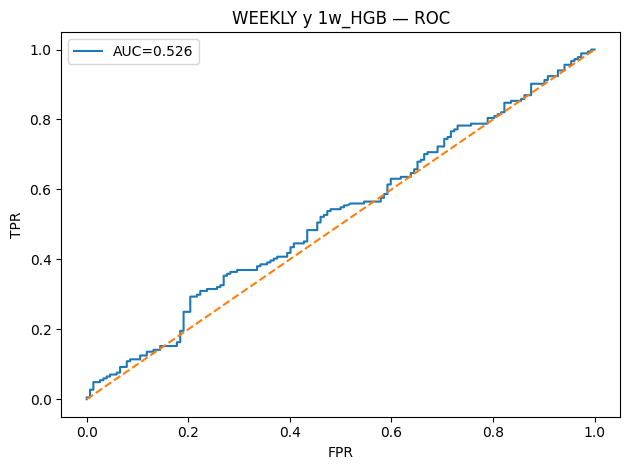

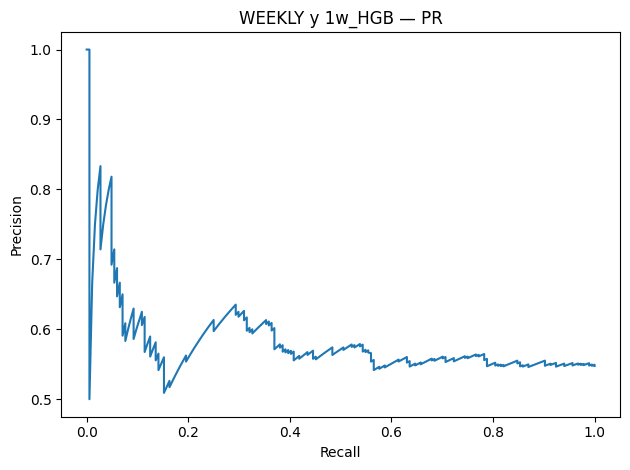

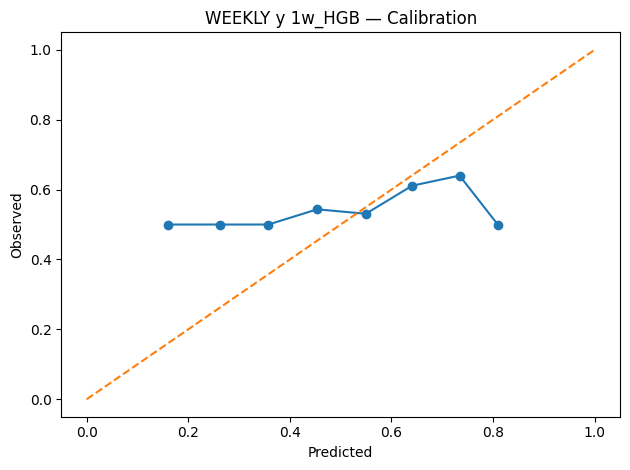

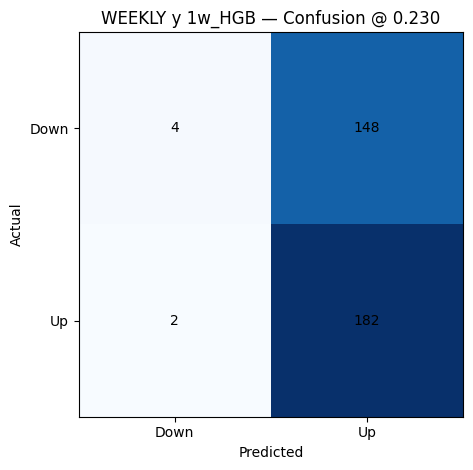

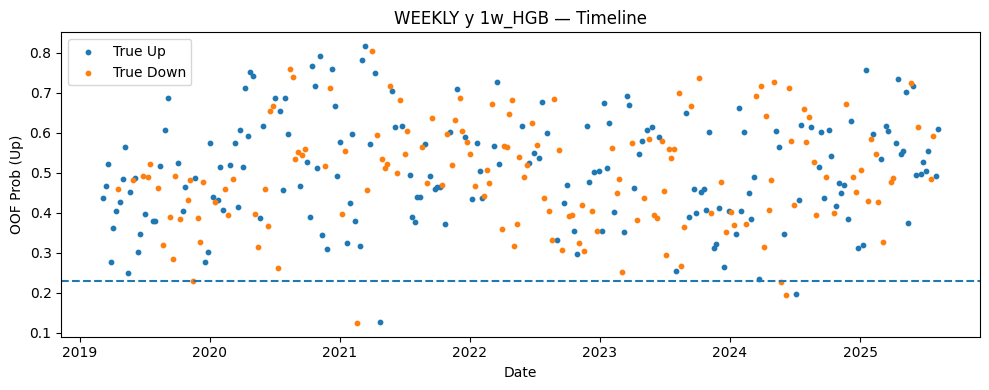


Plotting: weekly | y | 1w_KNN


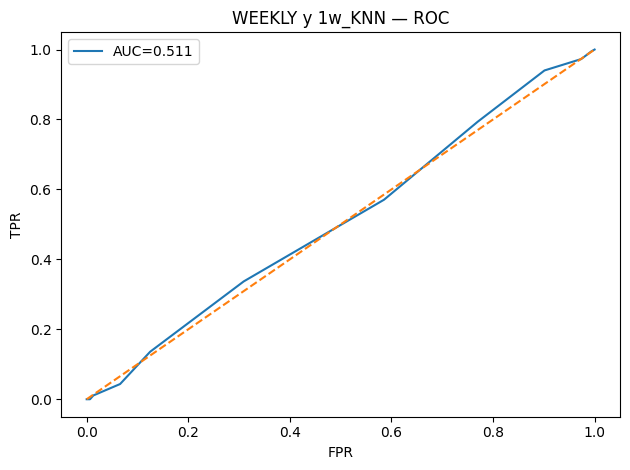

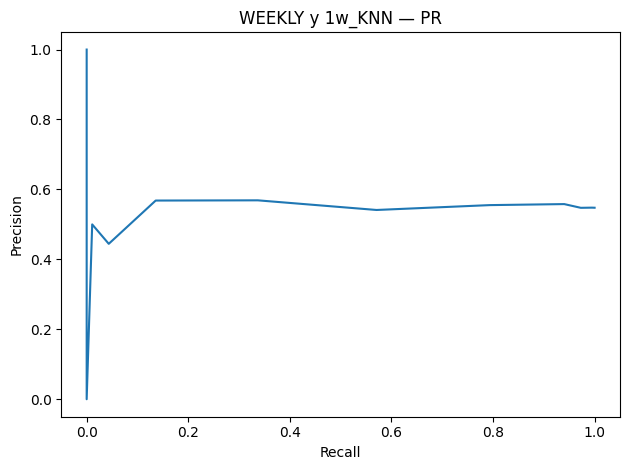

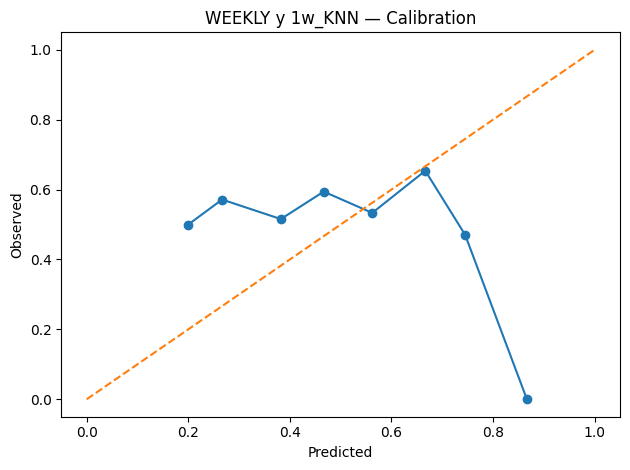

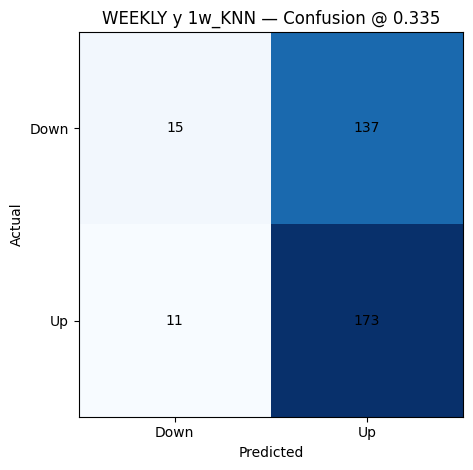

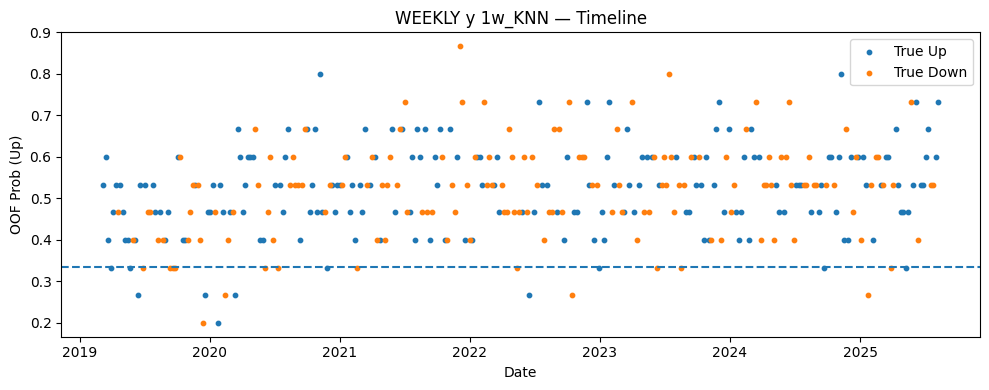


Plotting: weekly | y | 1w_LGBM


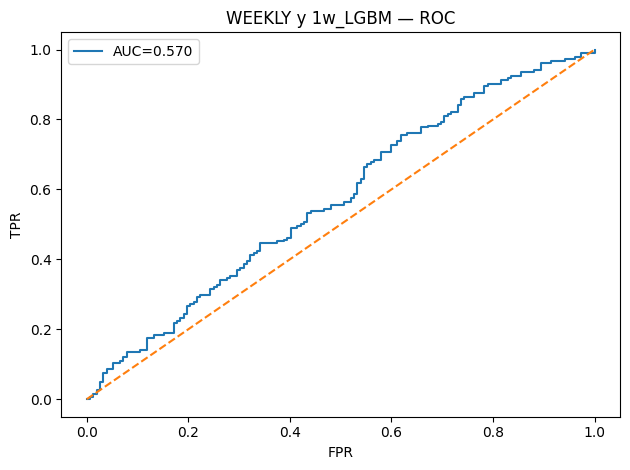

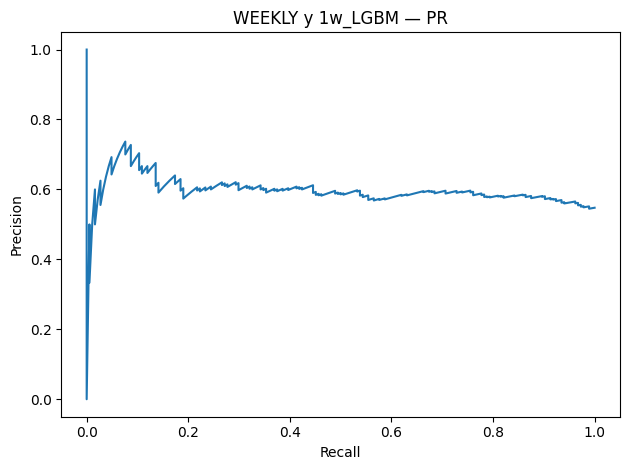

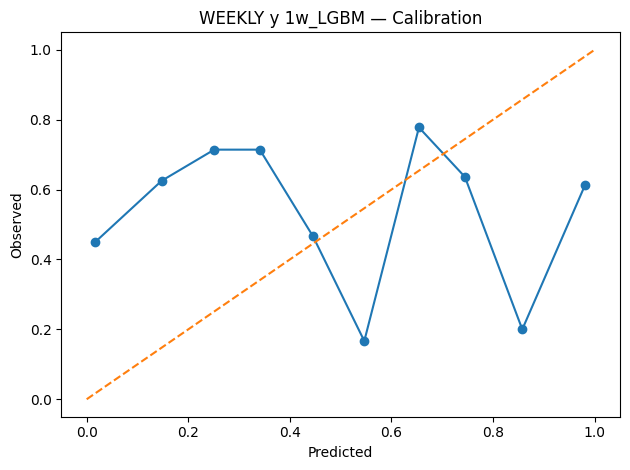

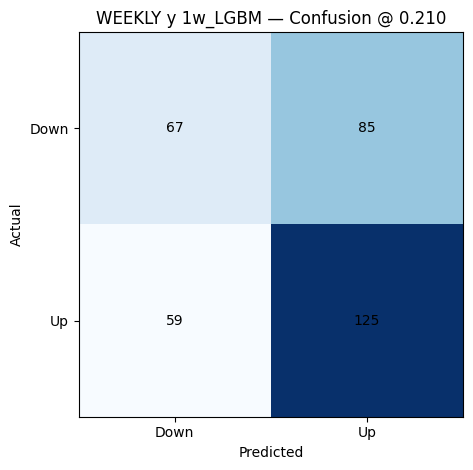

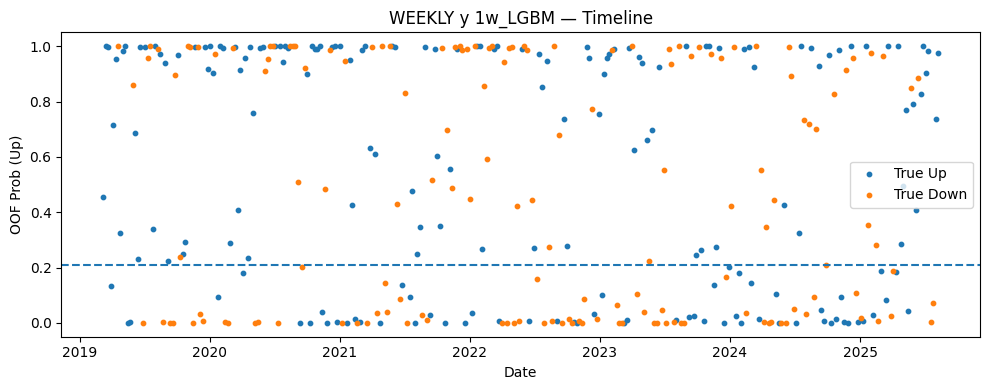


Plotting: weekly | y | 1w_LR


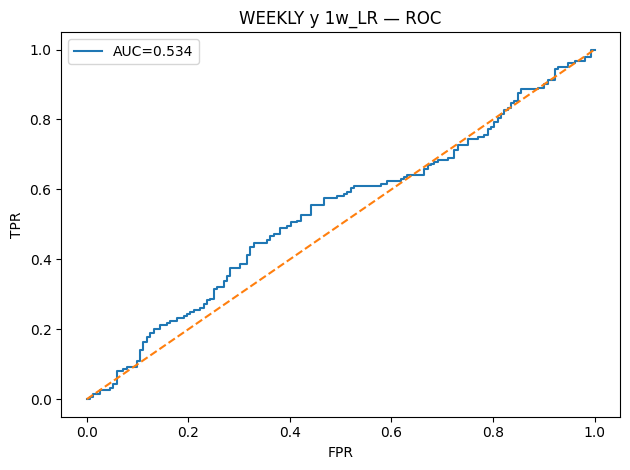

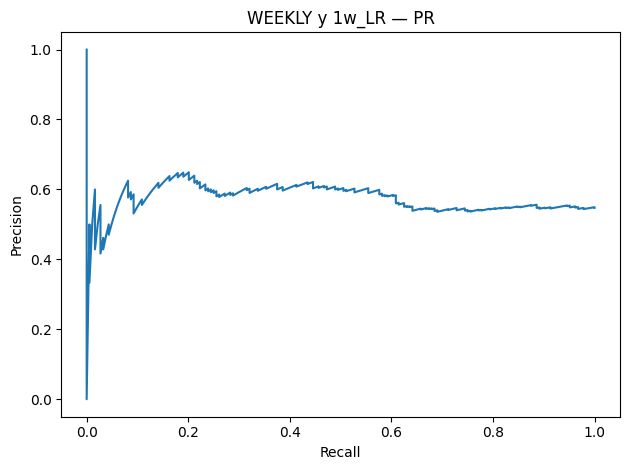

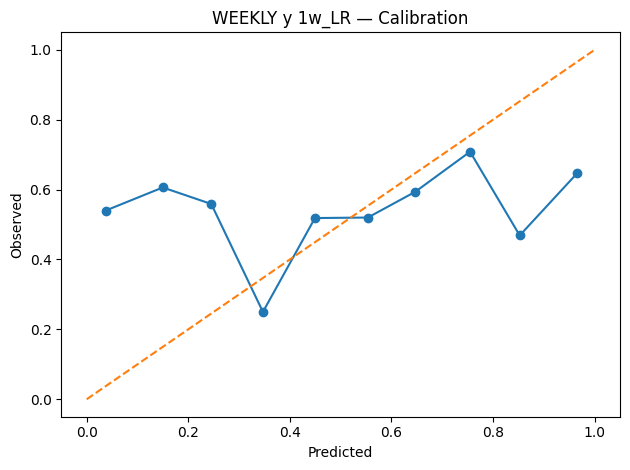

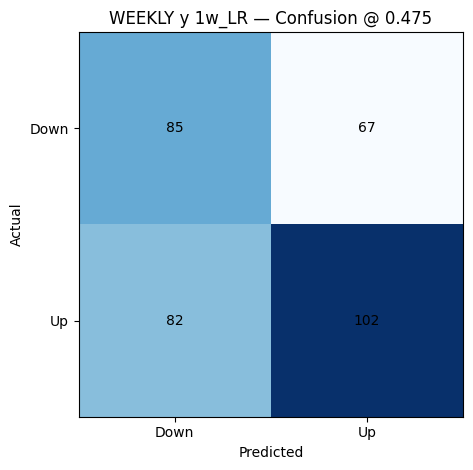

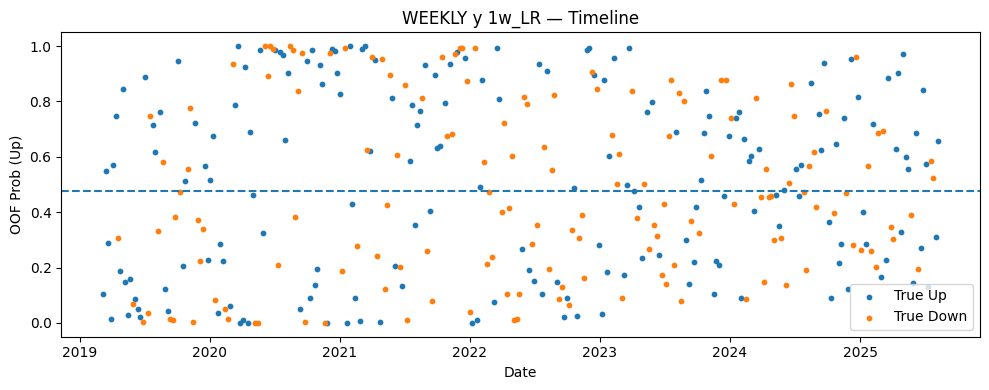


Plotting: weekly | y | 1w_RF


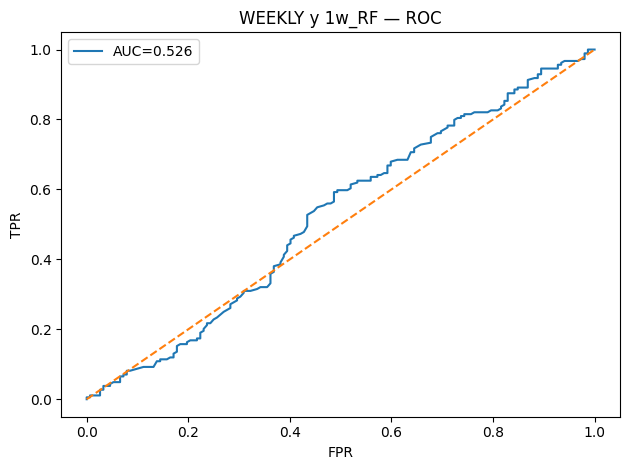

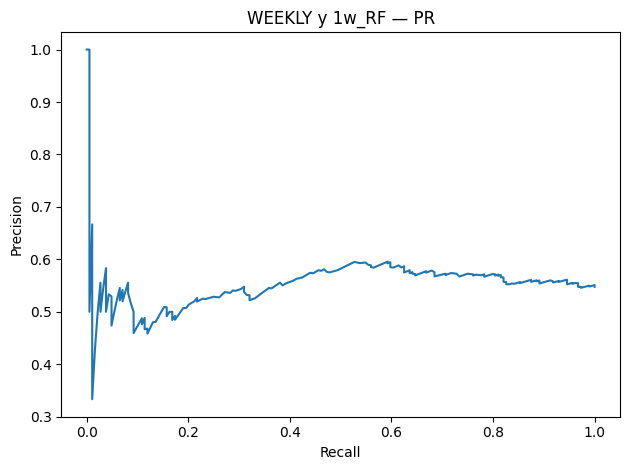

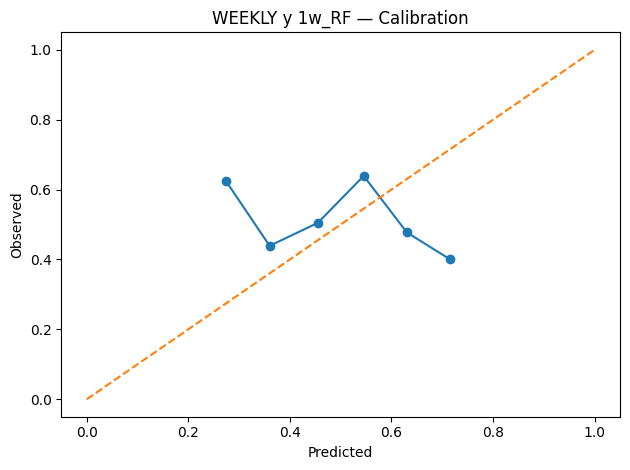

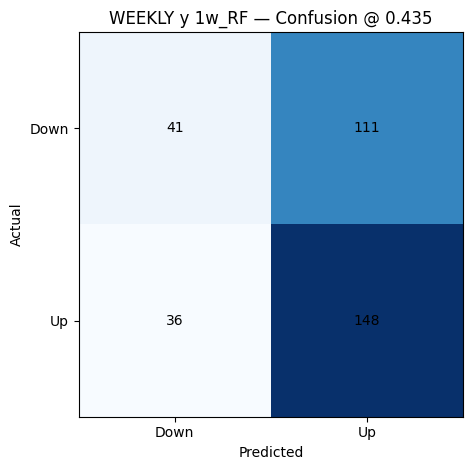

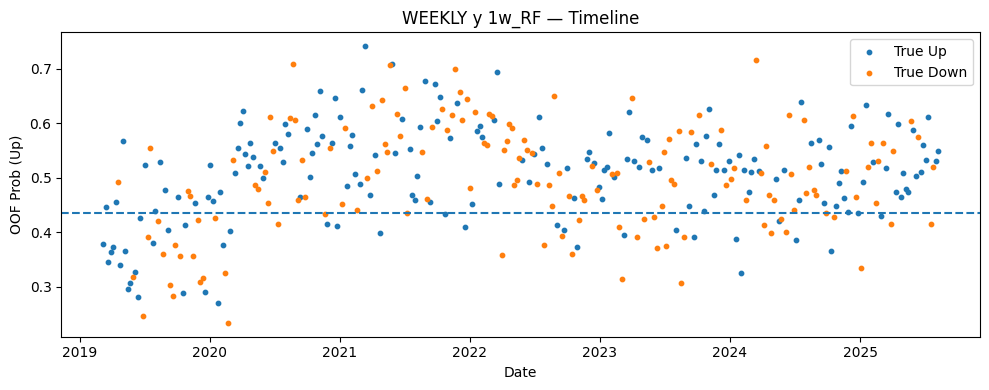


Plotting: weekly | y | 1w_RIDGE


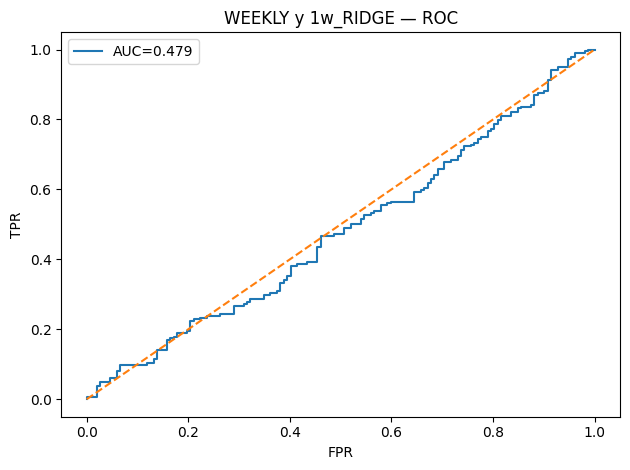

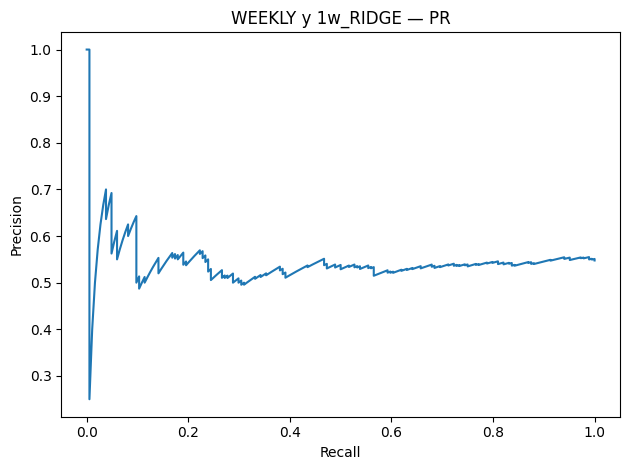

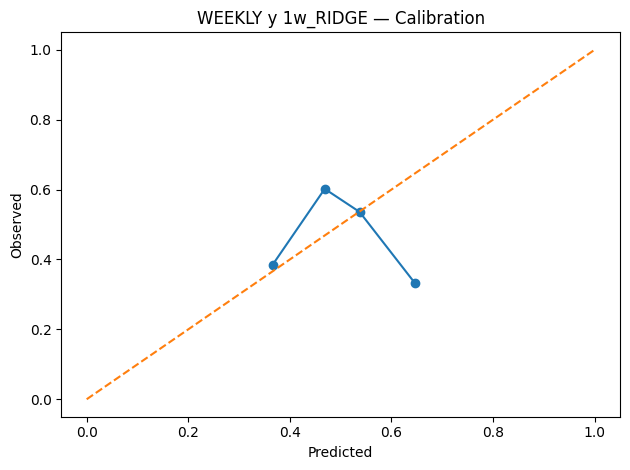

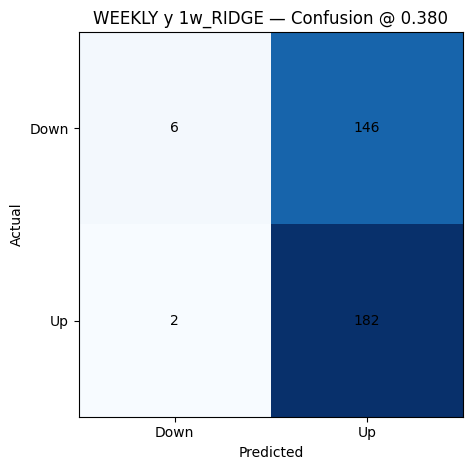

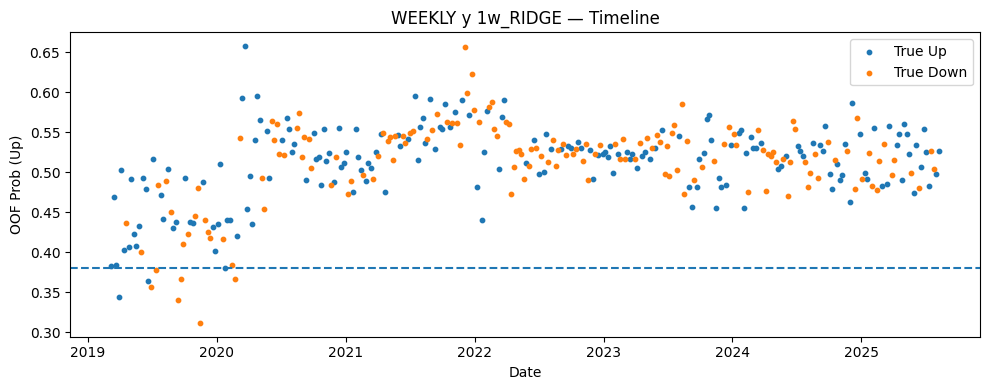


Plotting: weekly | y | 1w_STACK


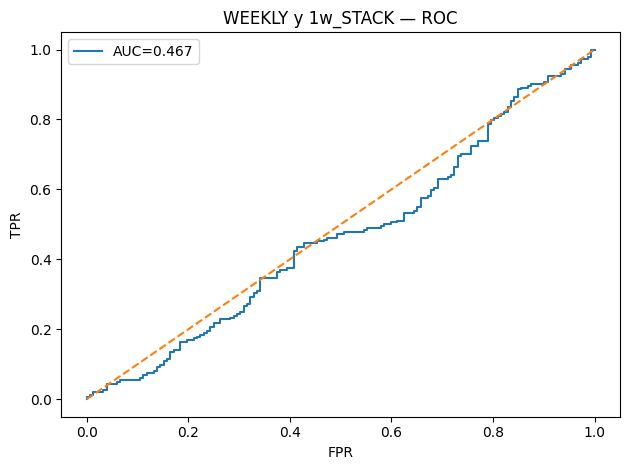

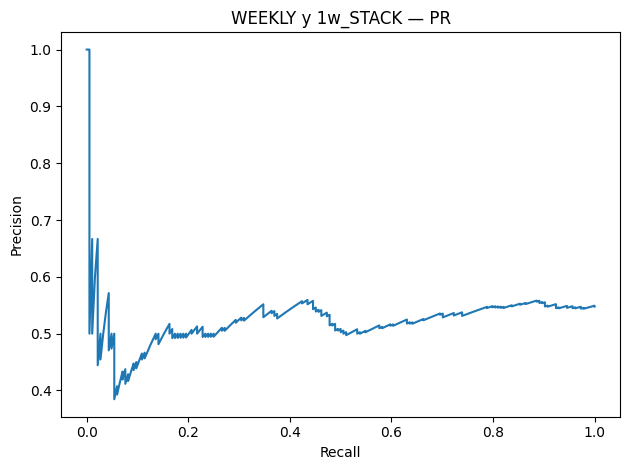

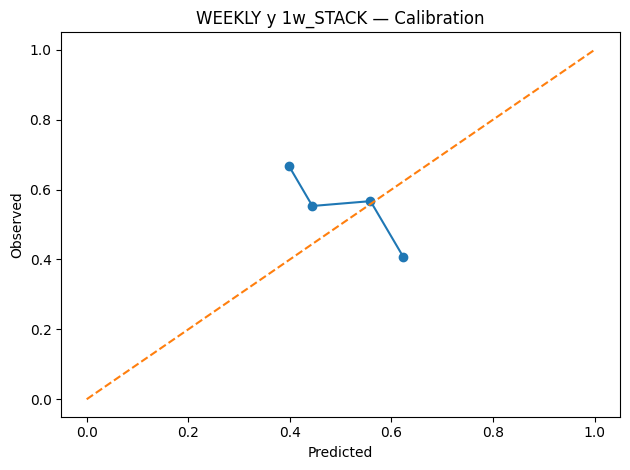

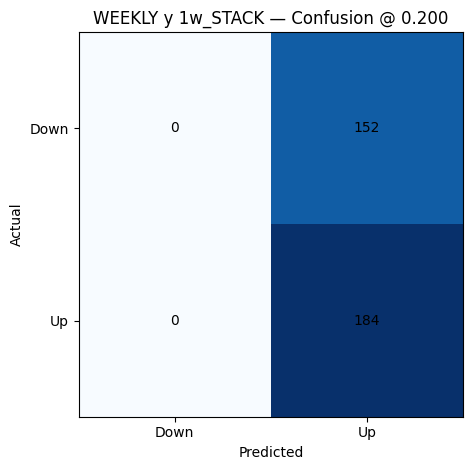

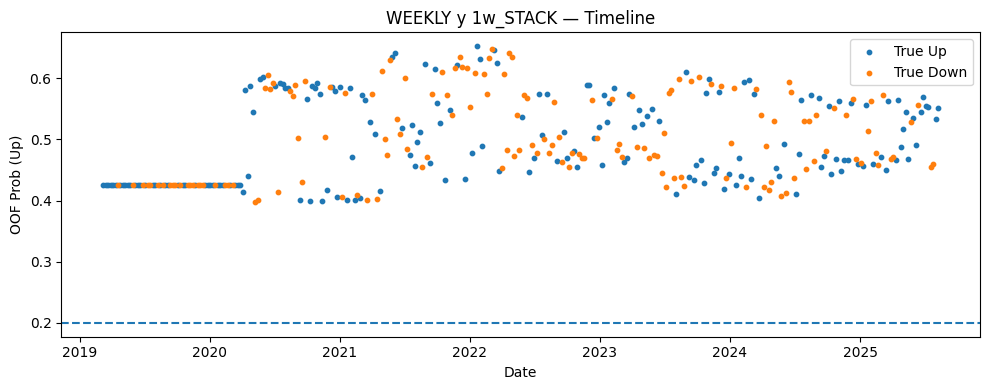


Plotting: weekly | y | 1w_SVM


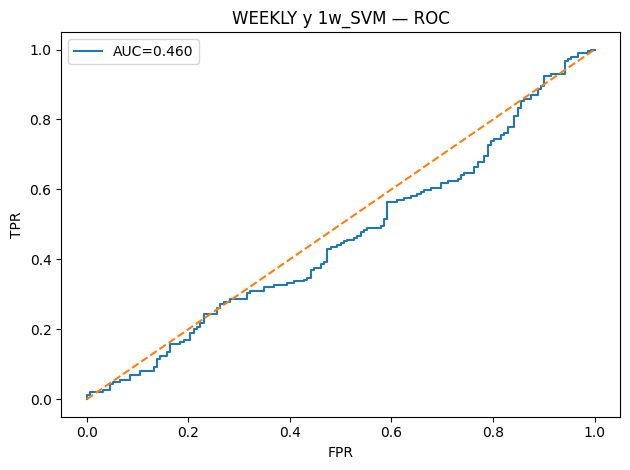

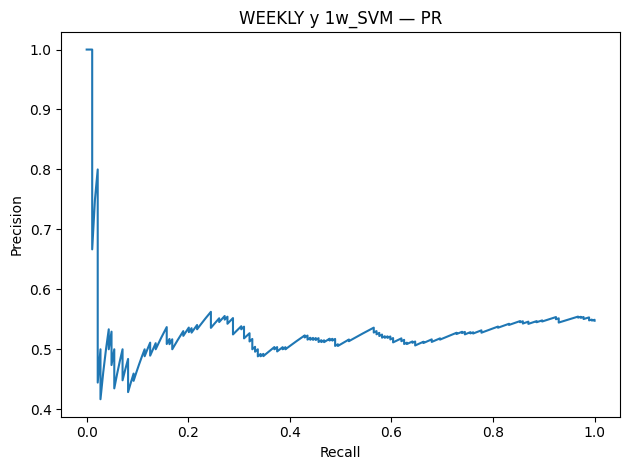

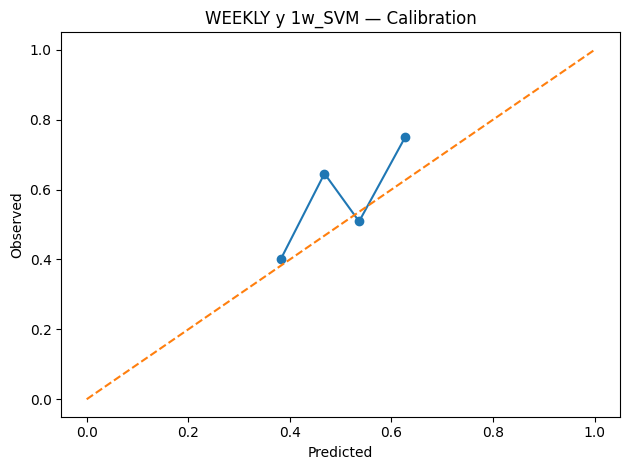

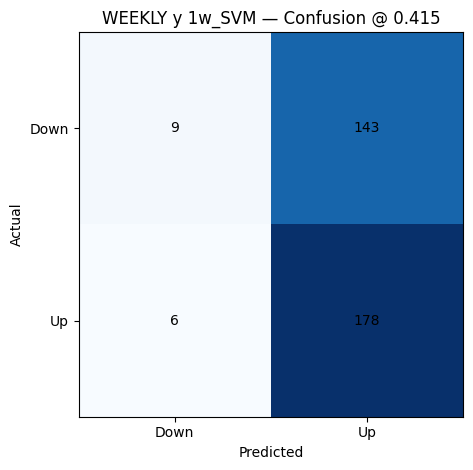

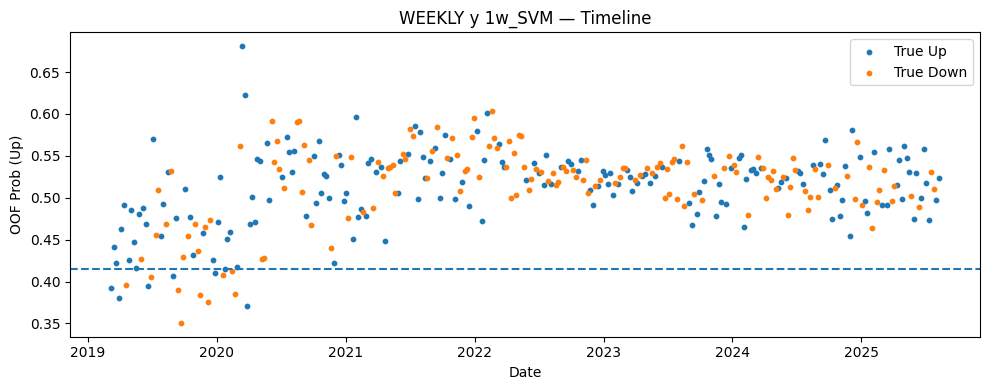


Saved PNGs to: /content/btc_project_outputs/figures


In [ ]:
# ===== Plot Rescue: make & SHOW plots from saved OOF CSVs =====
import os, numpy as np, pandas as pd, matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, roc_curve, precision_recall_curve, confusion_matrix, accuracy_score
from sklearn.calibration import calibration_curve

OUT_DIR  = "/content/btc_project_outputs"
FIG_DIR  = os.path.join(OUT_DIR, "figures")
PRED_DIR = os.path.join(OUT_DIR, "preds")
os.makedirs(FIG_DIR, exist_ok=True)

def safe_auc(y, p):
    try:
        if len(np.unique(y)) < 2: return 0.5
        return float(roc_auc_score(y, p))
    except Exception:
        return 0.5

def best_thr_oof(y, p):
    grid = np.arange(0.20, 0.8001, 0.005)
    best_t, best_acc = 0.5, -1
    for t in grid:
        acc = accuracy_score(y, (p>=t).astype(int))
        if acc > best_acc:
            best_acc, best_t = acc, t
    return best_t

def plot_and_save(path, title=None):
    if title: plt.title(title)
    plt.tight_layout()
    plt.savefig(path, dpi=150, bbox_inches="tight")
    plt.show()

def make_plots(df, freq, target, model):
    y = df["y_true"].astype(int).values
    p = df["prob"].astype(float).values
    d = pd.to_datetime(df["date"]).values
    m = ~np.isnan(y) & ~np.isnan(p)
    y, p, d = y[m], p[m], d[m]
    thr = best_thr_oof(y, p)
    base = f"{freq}_{target}_{model}"

    # ROC
    fpr, tpr, _ = roc_curve(y, p)
    plt.figure(); plt.plot(fpr, tpr, label=f"AUC={safe_auc(y,p):.3f}")
    plt.plot([0,1],[0,1],'--'); plt.xlabel("FPR"); plt.ylabel("TPR"); plt.legend()
    plot_and_save(os.path.join(FIG_DIR, f"{base}_ROC.png"), f"{freq.upper()} {target} {model} — ROC")

    # PR
    prec, rec, _ = precision_recall_curve(y, p)
    plt.figure(); plt.plot(rec, prec); plt.xlabel("Recall"); plt.ylabel("Precision")
    plot_and_save(os.path.join(FIG_DIR, f"{base}_PR.png"), f"{freq.upper()} {target} {model} — PR")

    # Calibration
    prob_true, prob_pred = calibration_curve(y, p, n_bins=10, strategy="uniform")
    plt.figure(); plt.plot(prob_pred, prob_true, marker="o"); plt.plot([0,1],[0,1],'--')
    plt.xlabel("Predicted"); plt.ylabel("Observed")
    plot_and_save(os.path.join(FIG_DIR, f"{base}_CAL.png"), f"{freq.upper()} {target} {model} — Calibration")

    # Confusion @ thr
    yhat = (p >= thr).astype(int)
    cm = confusion_matrix(y, yhat)
    plt.figure(); plt.imshow(cm, cmap="Blues")
    for (i,j), v in np.ndenumerate(cm): plt.text(j,i,str(v),ha="center",va="center")
    plt.xticks([0,1],["Down","Up"]); plt.yticks([0,1],["Down","Up"])
    plt.xlabel("Predicted"); plt.ylabel("Actual")
    plot_and_save(os.path.join(FIG_DIR, f"{base}_CM.png"), f"{freq.upper()} {target} {model} — Confusion @ {thr:.3f}")

    # Timeline
    plt.figure(figsize=(10,4))
    mask_up, mask_dn = (y==1), (y==0)
    plt.scatter(pd.to_datetime(d)[mask_up], p[mask_up], s=10, label="True Up")
    plt.scatter(pd.to_datetime(d)[mask_dn], p[mask_dn], s=10, label="True Down")
    plt.axhline(thr, ls="--"); plt.xlabel("Date"); plt.ylabel("OOF Prob (Up)"); plt.legend()
    plot_and_save(os.path.join(FIG_DIR, f"{base}_TIMELINE.png"), f"{freq.upper()} {target} {model} — Timeline")

pred_files = sorted([f for f in os.listdir(PRED_DIR) if f.endswith("_oof.csv")])
if not pred_files:
    raise RuntimeError("No OOF CSVs found in /content/btc_project_outputs/preds/. Re-run training first.")

print(f"Found {len(pred_files)} OOF files:")
for f in pred_files: print("  -", f)

for fname in pred_files:
    dfp = pd.read_csv(os.path.join(PRED_DIR, fname), parse_dates=["date"])
    stem = fname[:-8]  # drop "_oof.csv"
    parts = stem.split("_")
    if len(parts) < 3:
        freq, target, model = "unk","unk",stem
    else:
        freq, target, model = parts[0], parts[1], "_".join(parts[2:])
    print(f"\nPlotting: {freq} | {target} | {model}")
    make_plots(dfp, freq, target, model)

print("\nSaved PNGs to:", FIG_DIR)


Found 36 OOF files:
  - daily_y_1d_ET_oof.csv
  - daily_y_1d_HGB_oof.csv
  - daily_y_1d_KNN_oof.csv
  - daily_y_1d_LGBM_oof.csv
  - daily_y_1d_LR_oof.csv
  - daily_y_1d_RF_oof.csv
  - daily_y_1d_RIDGE_oof.csv
  - daily_y_1d_STACK_oof.csv
  - daily_y_1d_SVM_oof.csv
  - daily_y_3d_ET_oof.csv
  ...

Making plots for: freq=daily, target=y, model=1d_ET


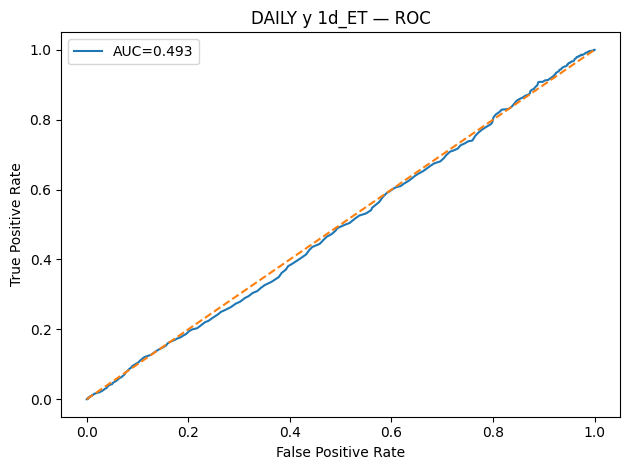

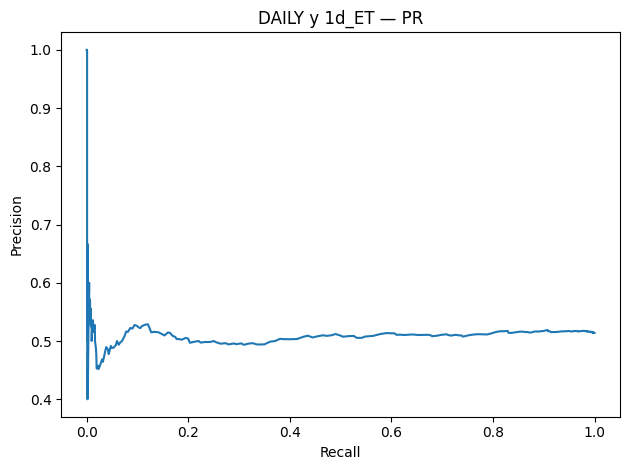

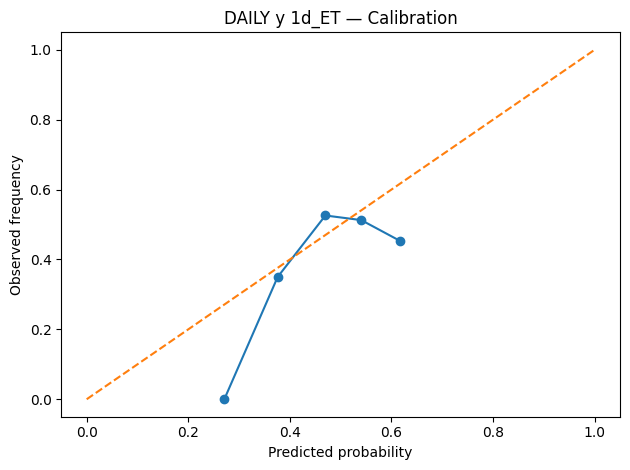

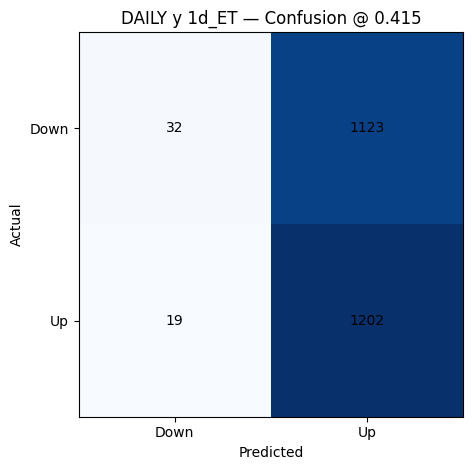

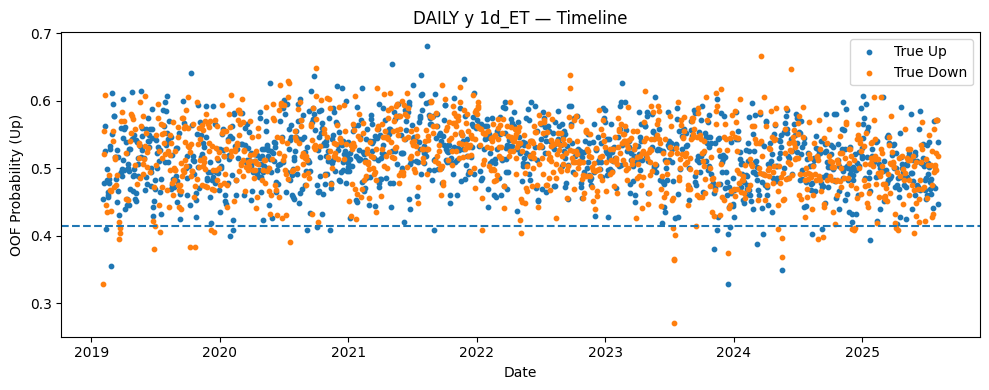


Making plots for: freq=daily, target=y, model=1d_HGB


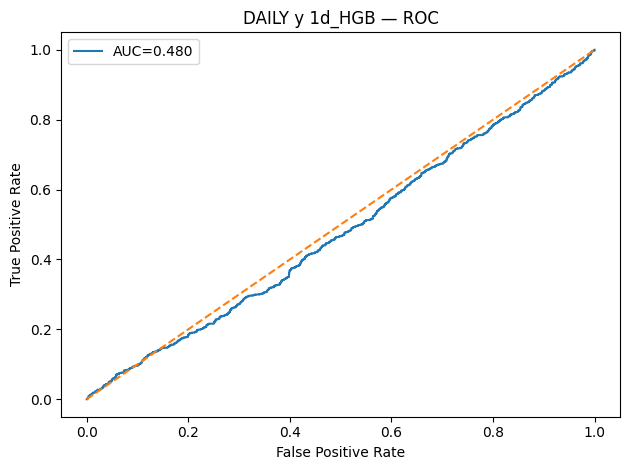

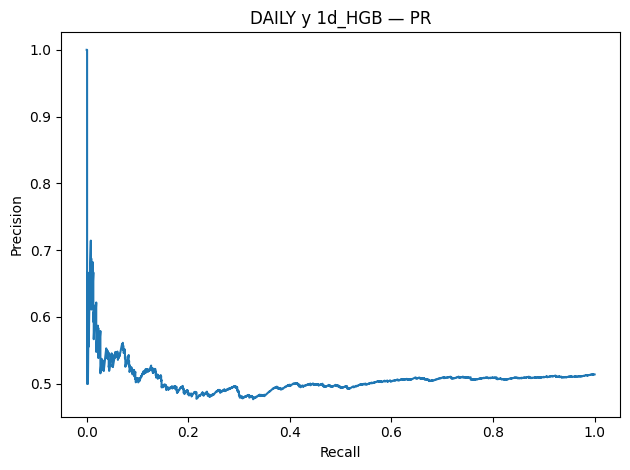

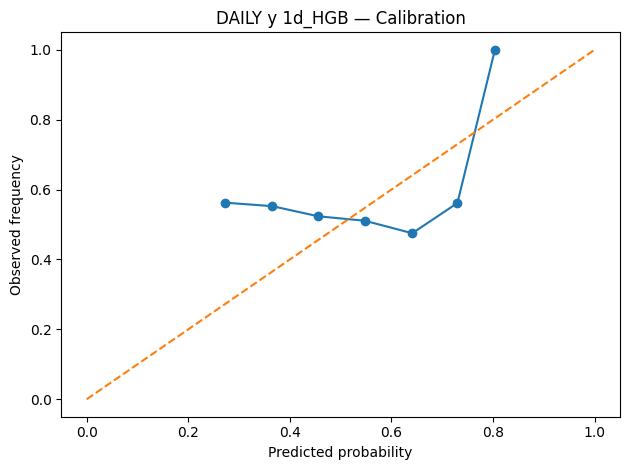

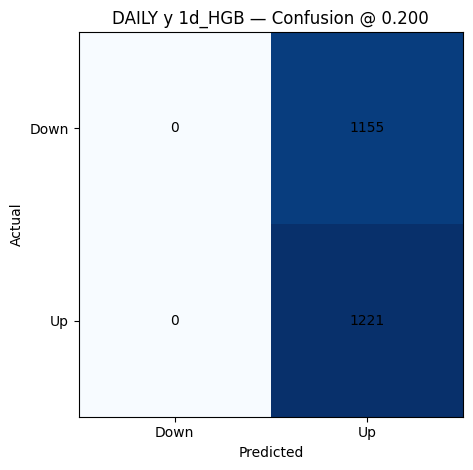

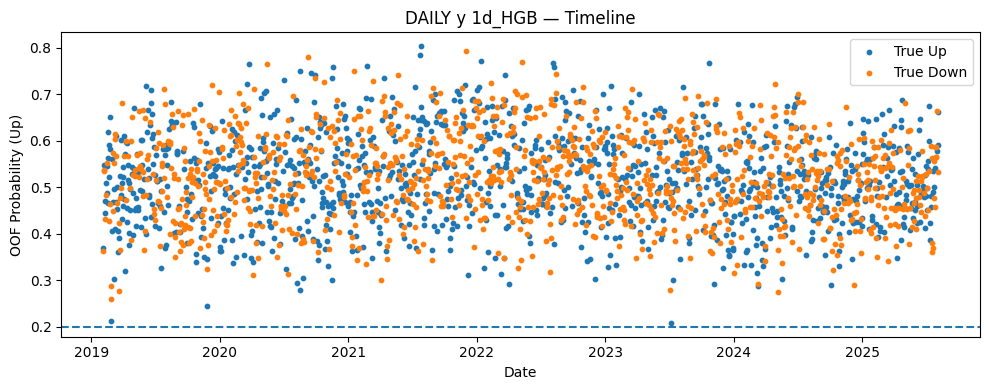


Making plots for: freq=daily, target=y, model=1d_KNN


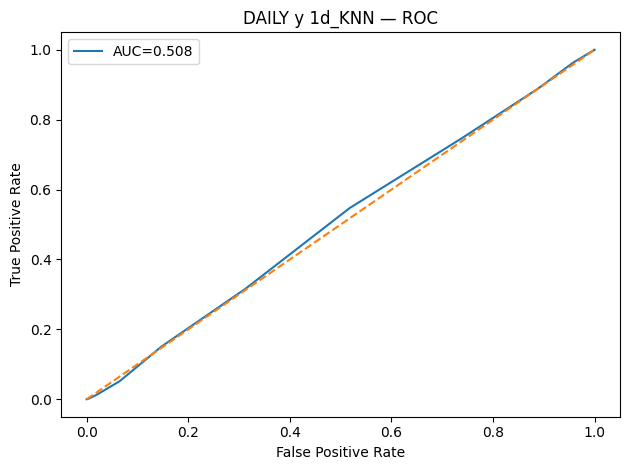

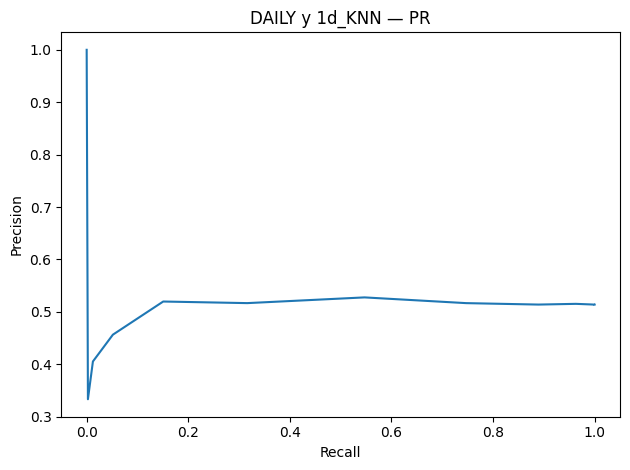

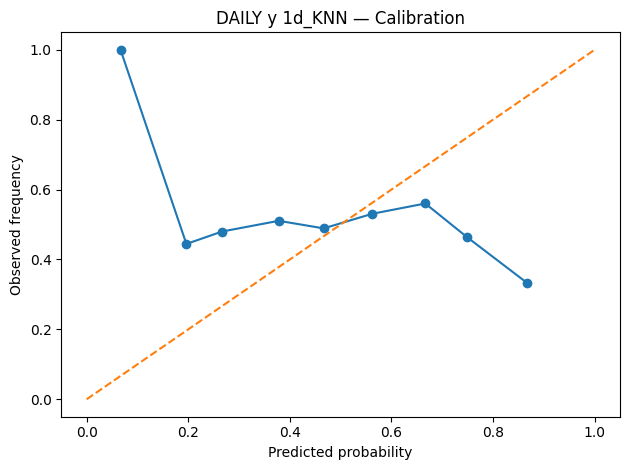

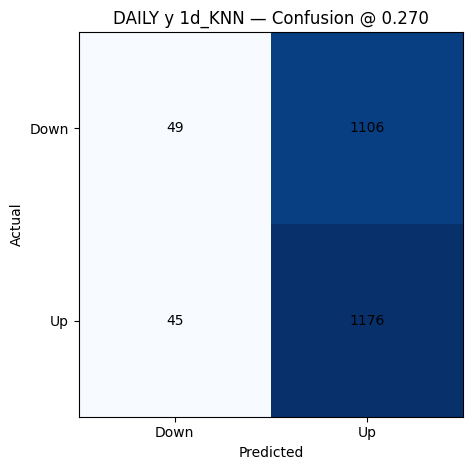

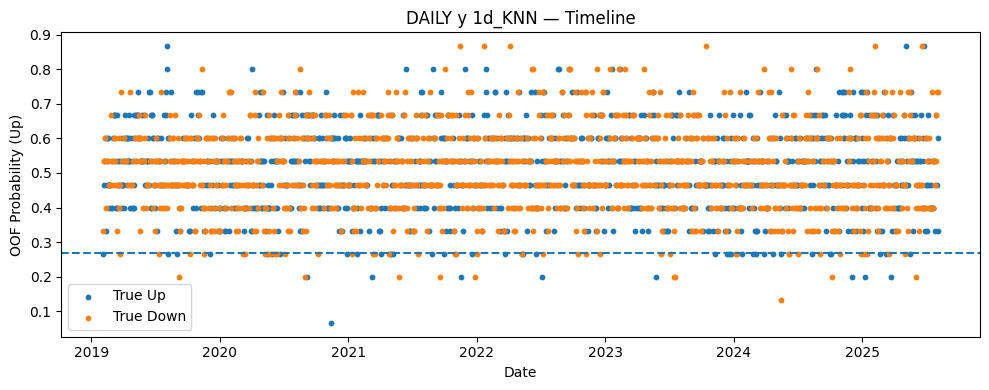


Making plots for: freq=daily, target=y, model=1d_LGBM


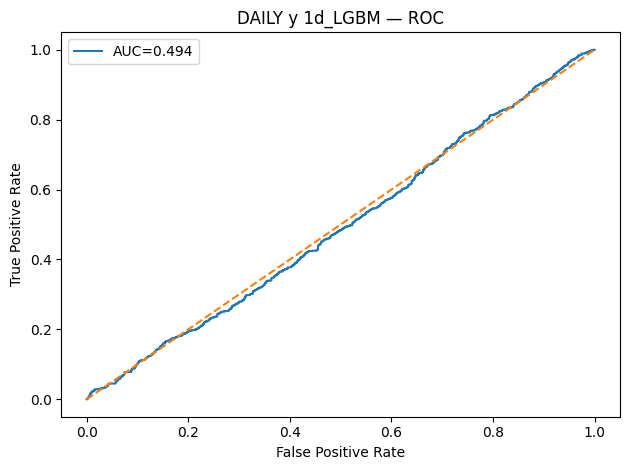

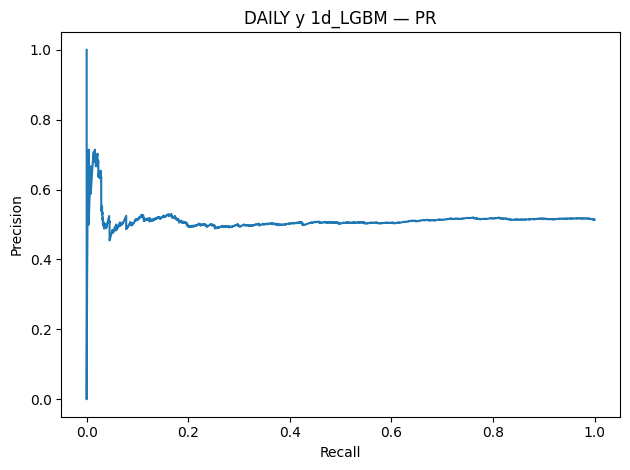

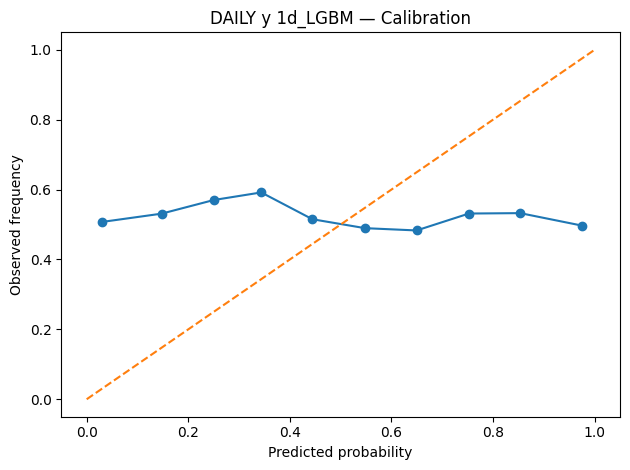

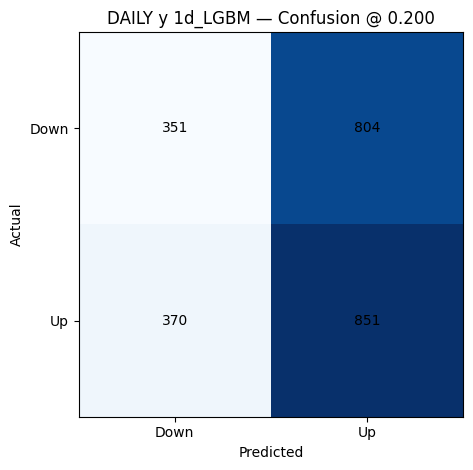

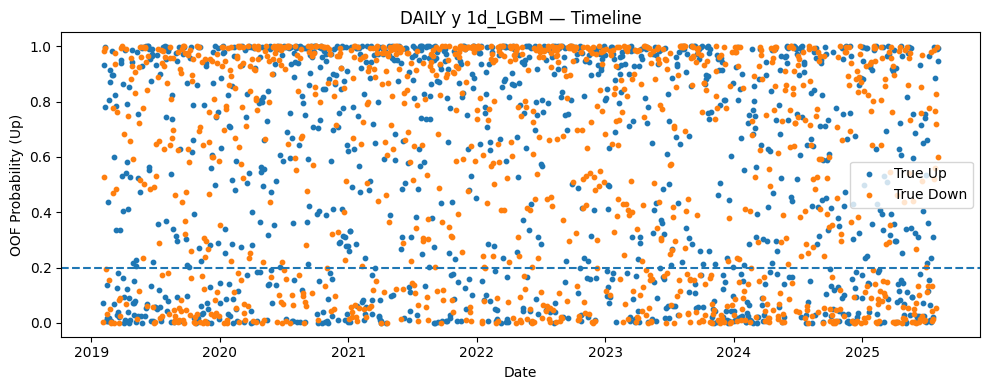


Making plots for: freq=daily, target=y, model=1d_LR


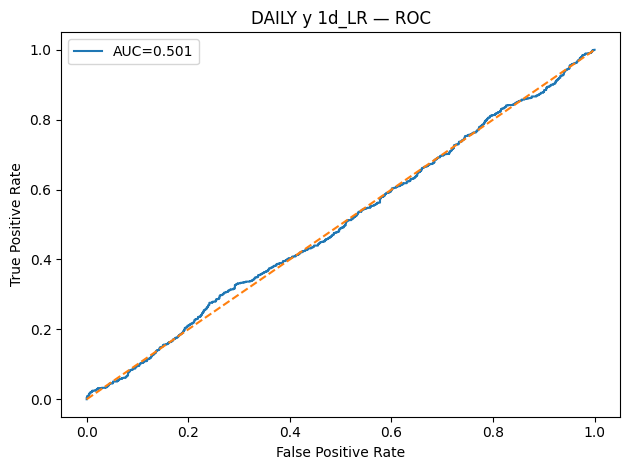

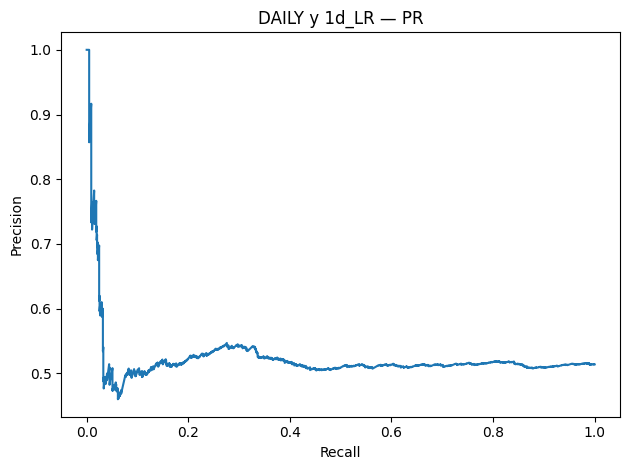

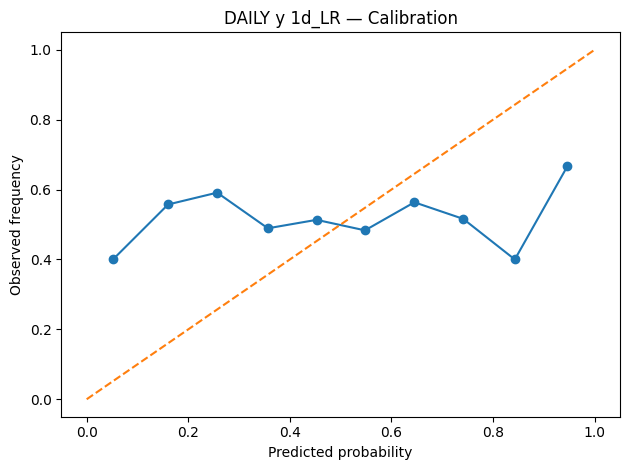

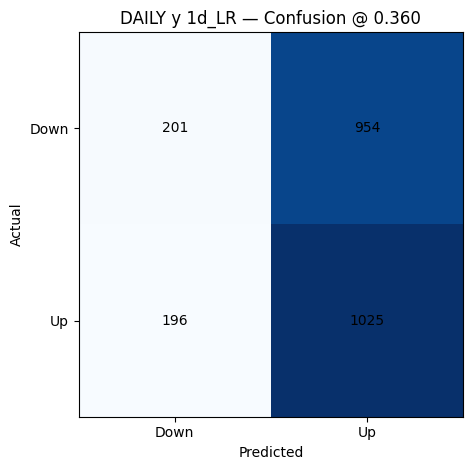

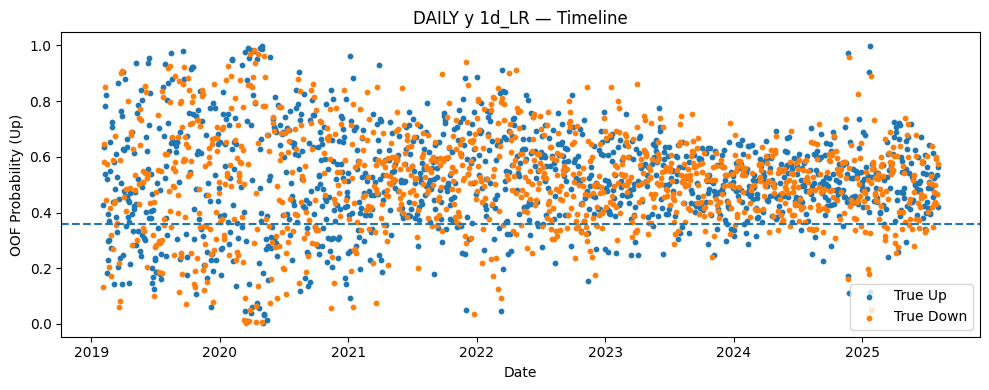


Making plots for: freq=daily, target=y, model=1d_RF


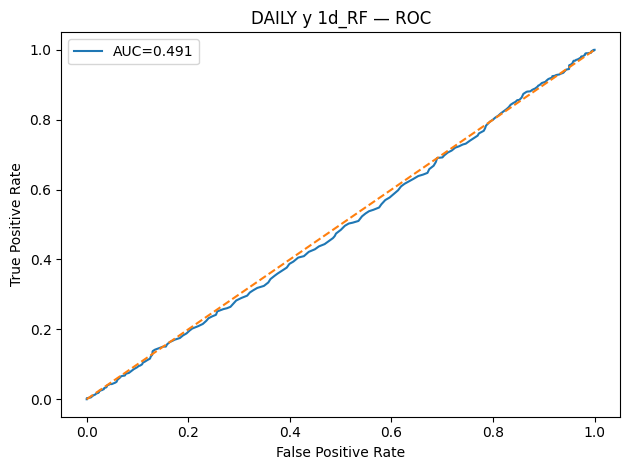

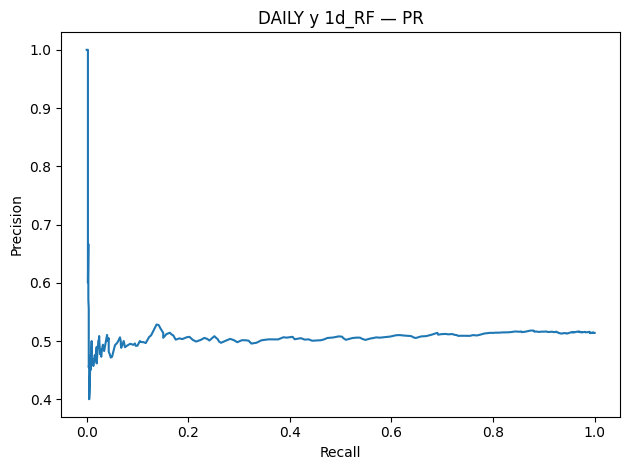

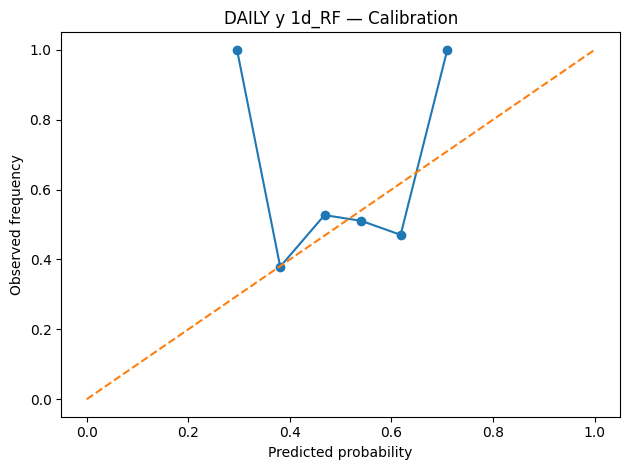

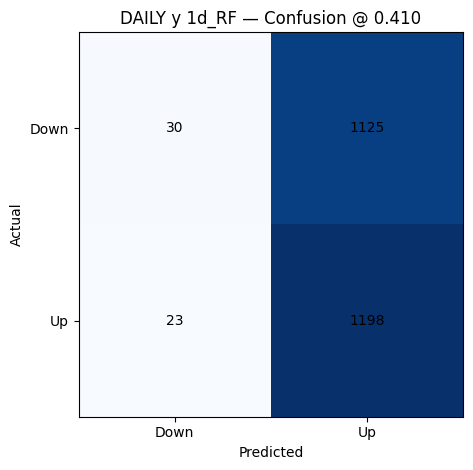

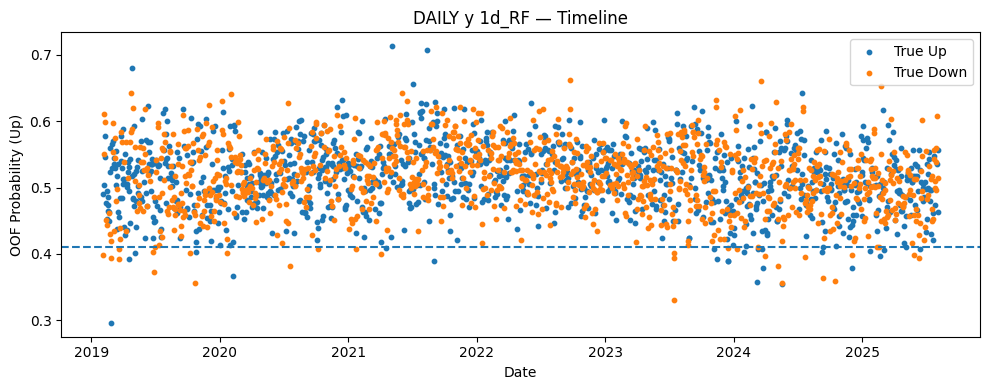


Making plots for: freq=daily, target=y, model=1d_RIDGE


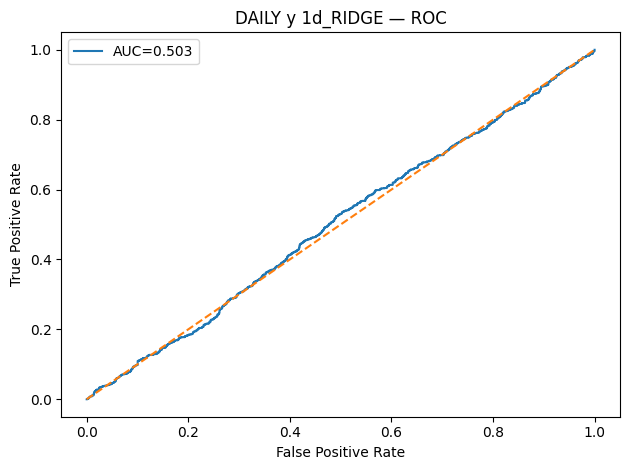

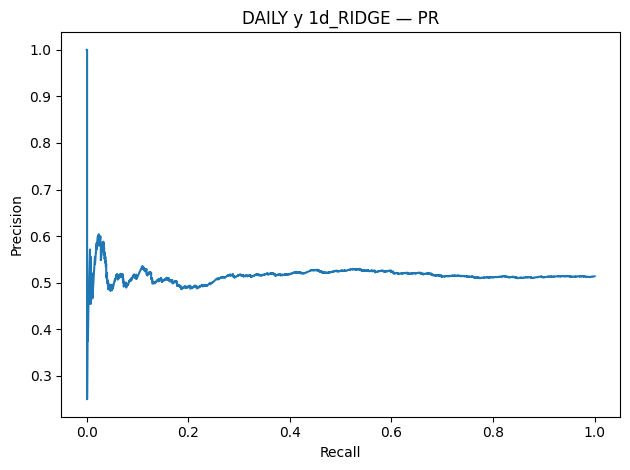

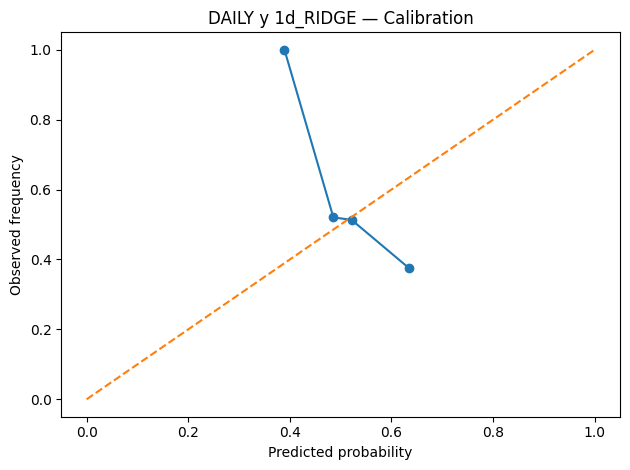

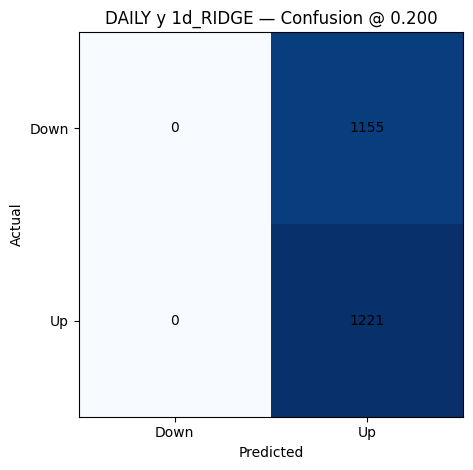

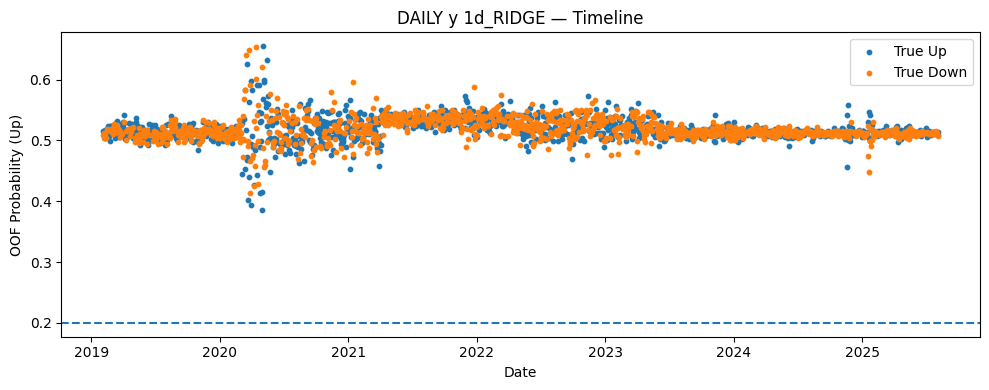


Making plots for: freq=daily, target=y, model=1d_STACK


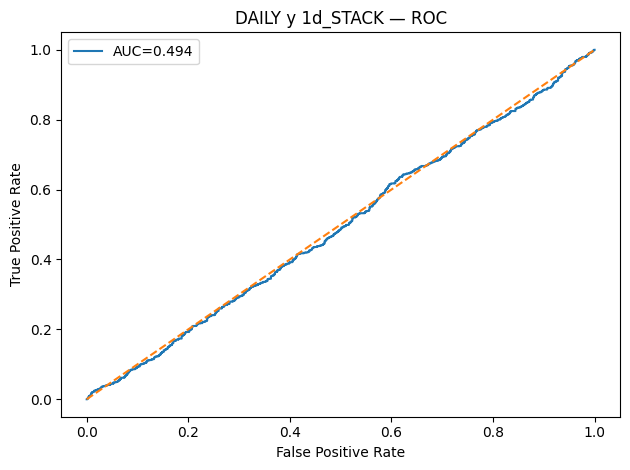

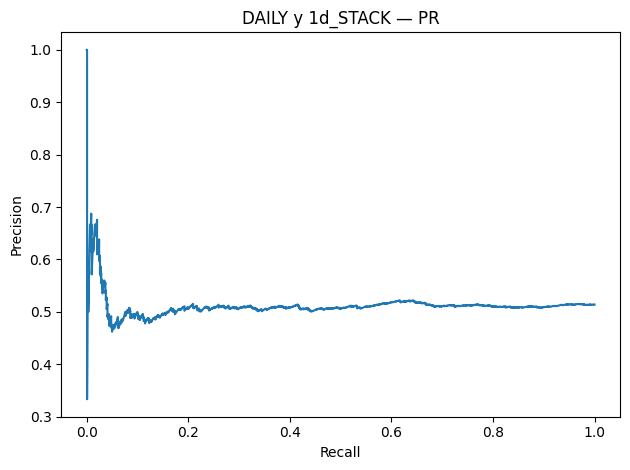

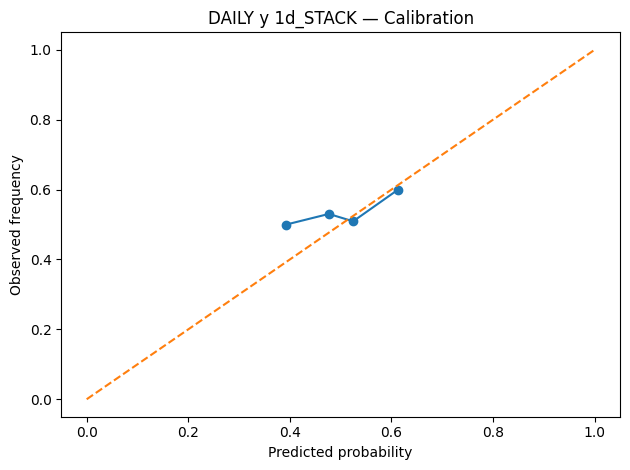

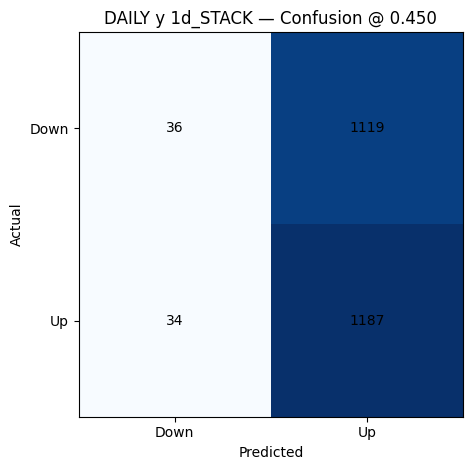

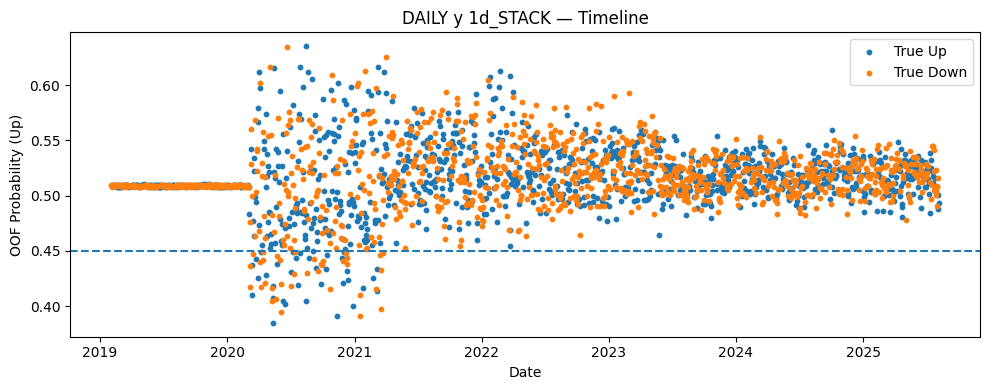


Making plots for: freq=daily, target=y, model=1d_SVM


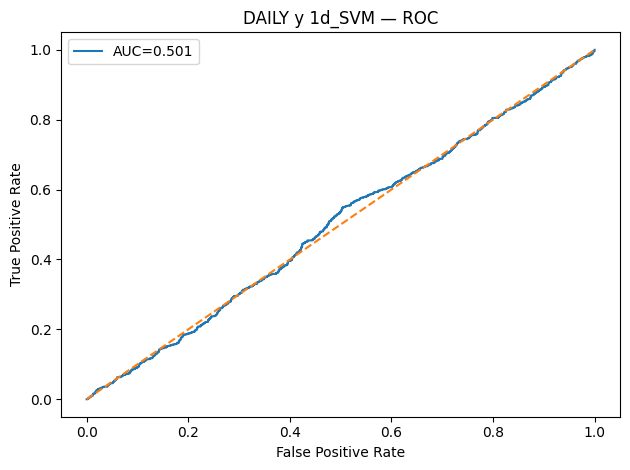

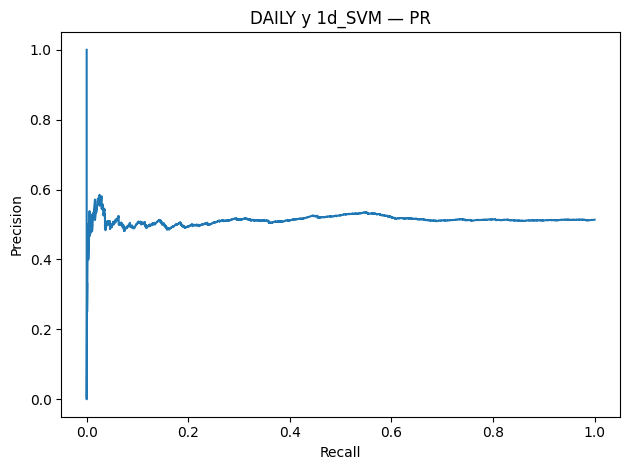

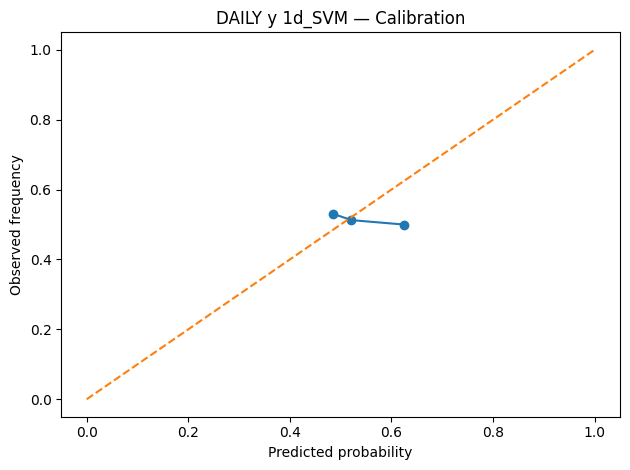

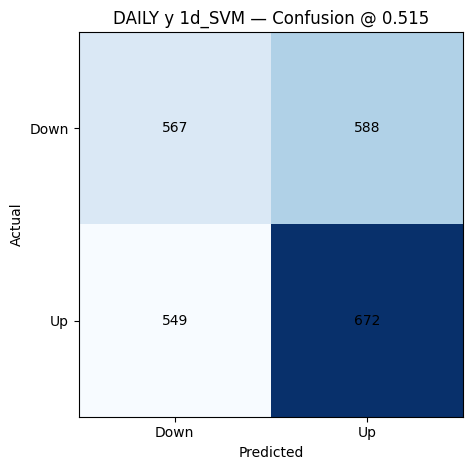

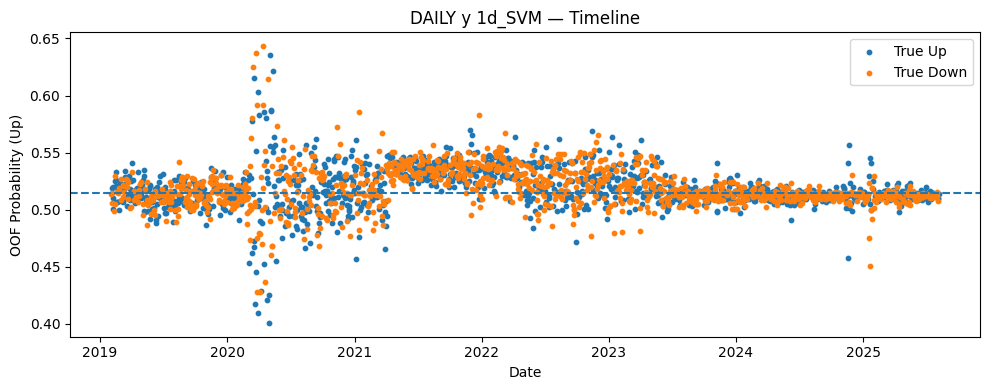


Making plots for: freq=daily, target=y, model=3d_ET


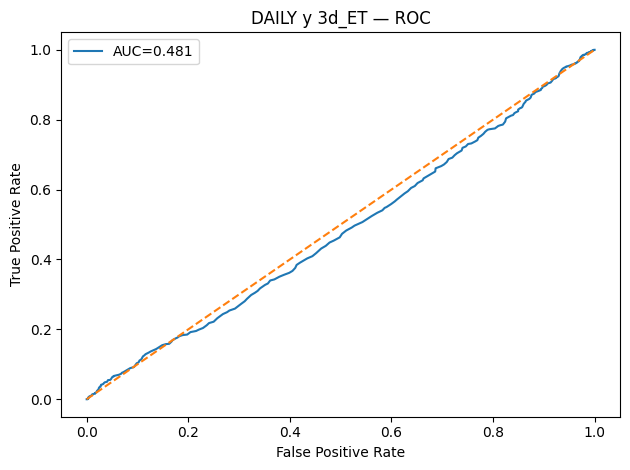

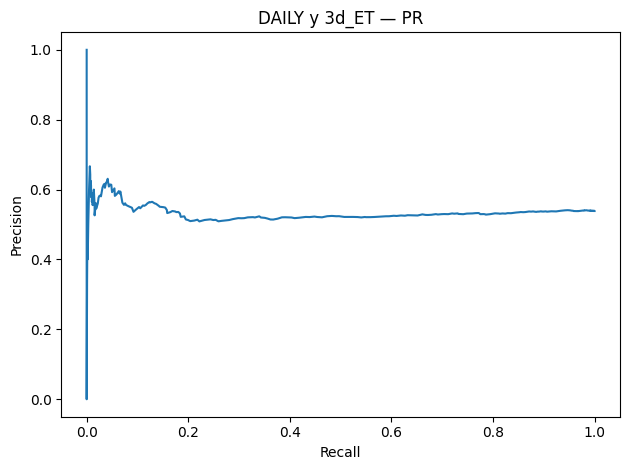

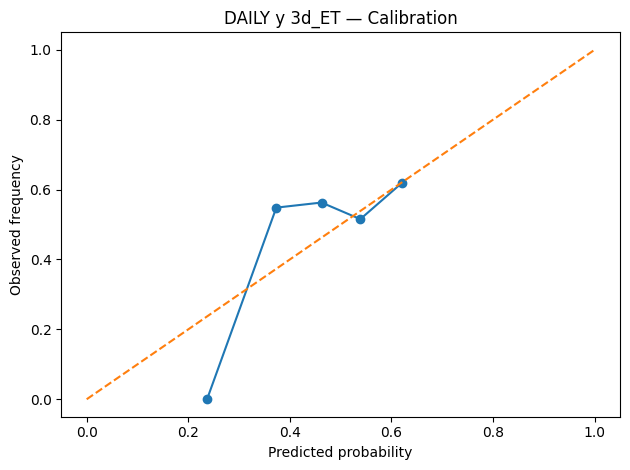

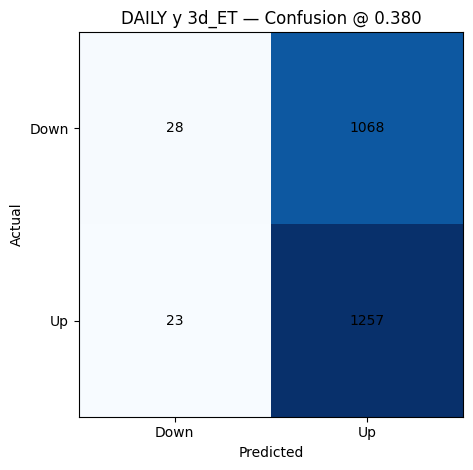

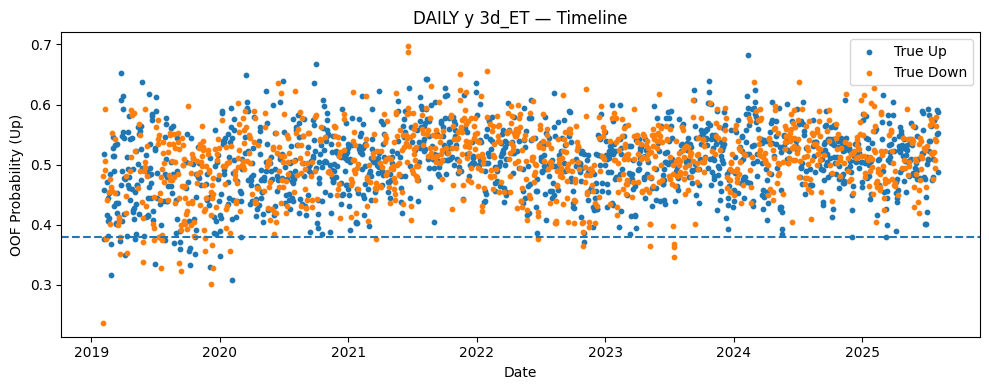


Making plots for: freq=daily, target=y, model=3d_HGB


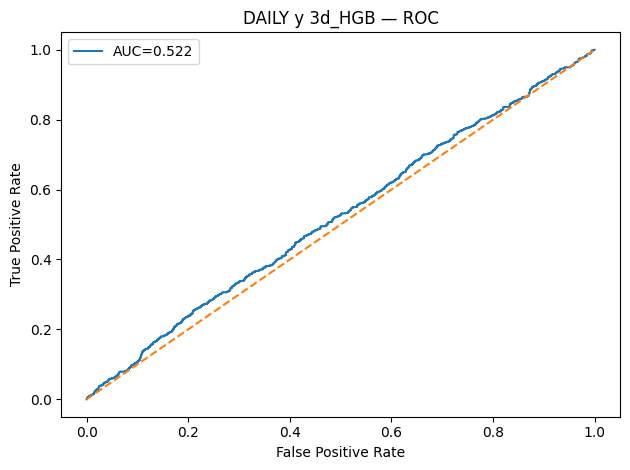

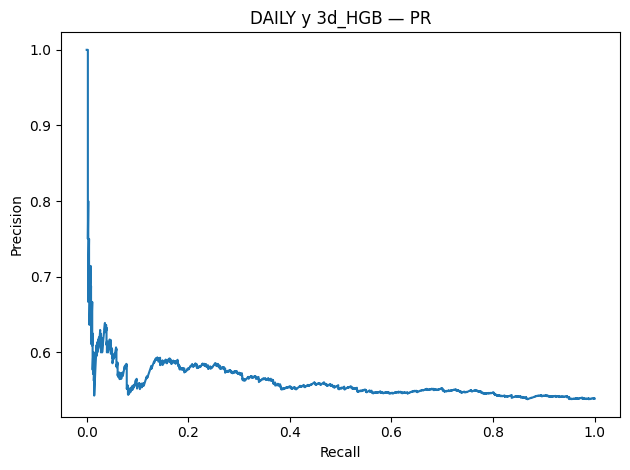

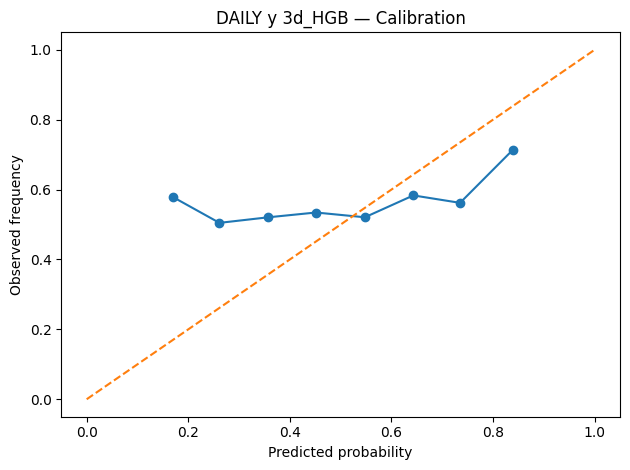

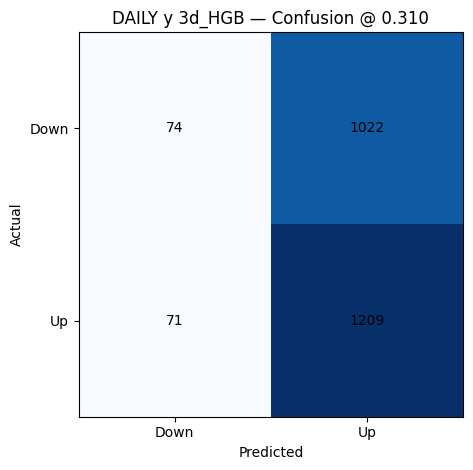

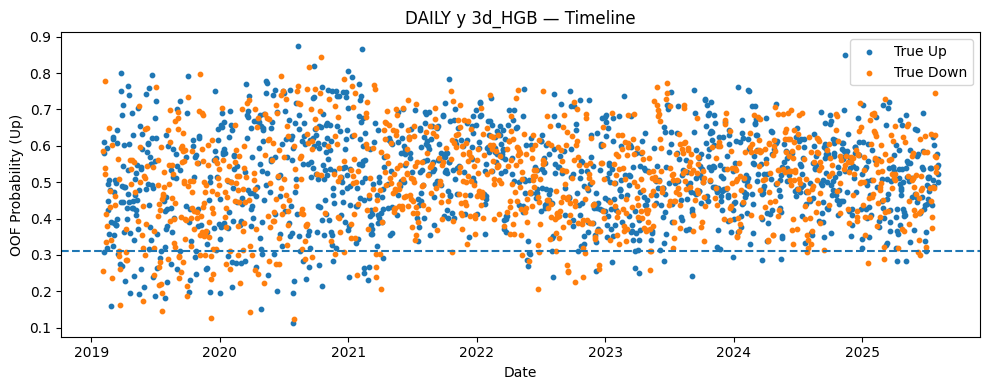


Making plots for: freq=daily, target=y, model=3d_KNN


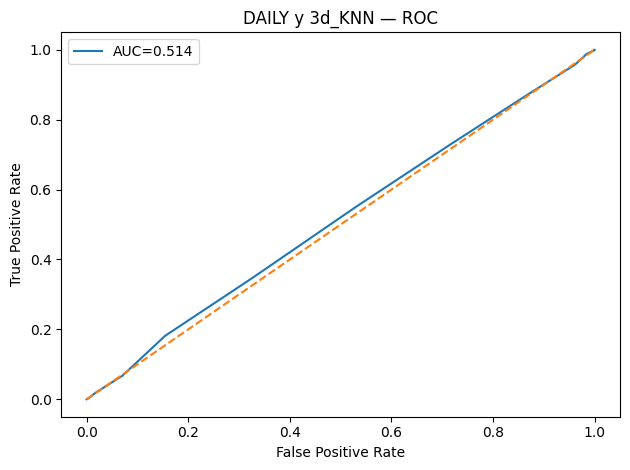

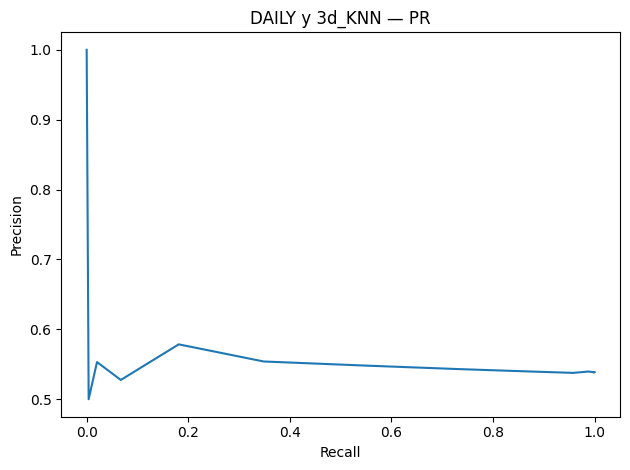

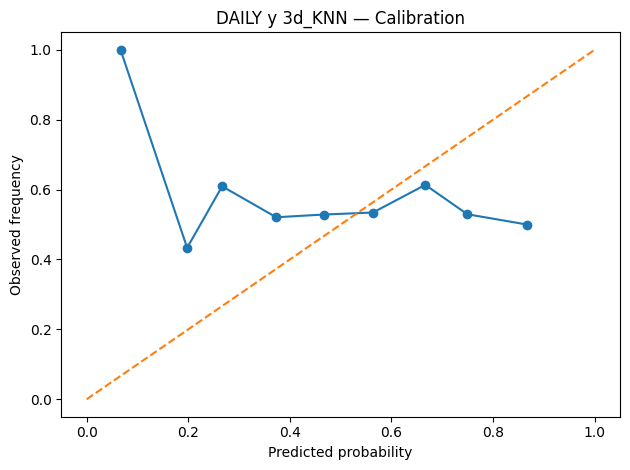

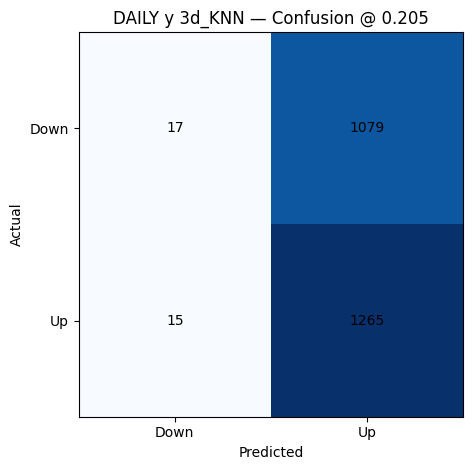

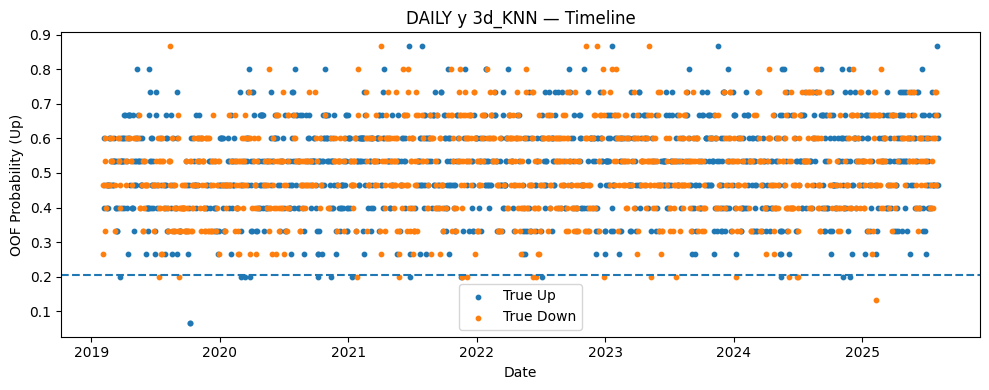


Making plots for: freq=daily, target=y, model=3d_LGBM


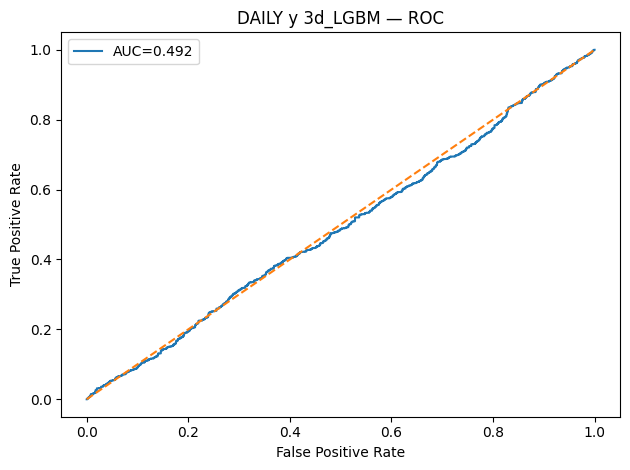

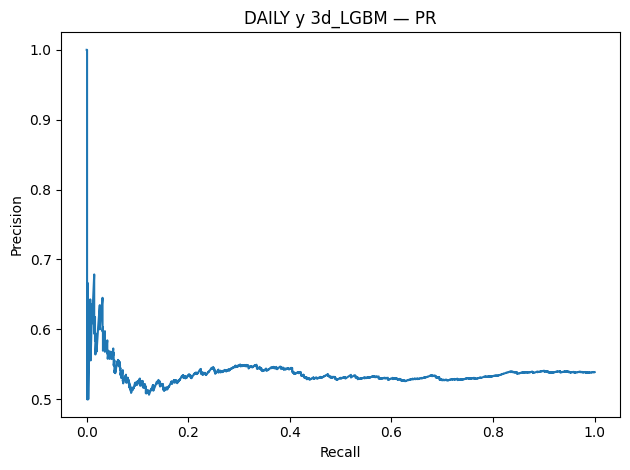

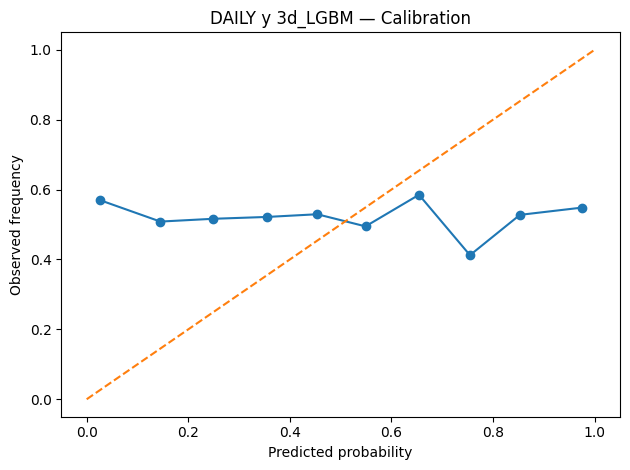

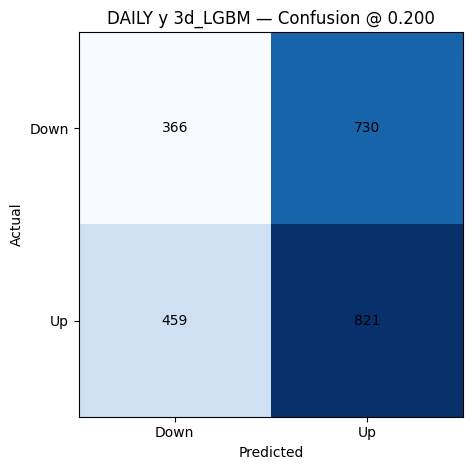

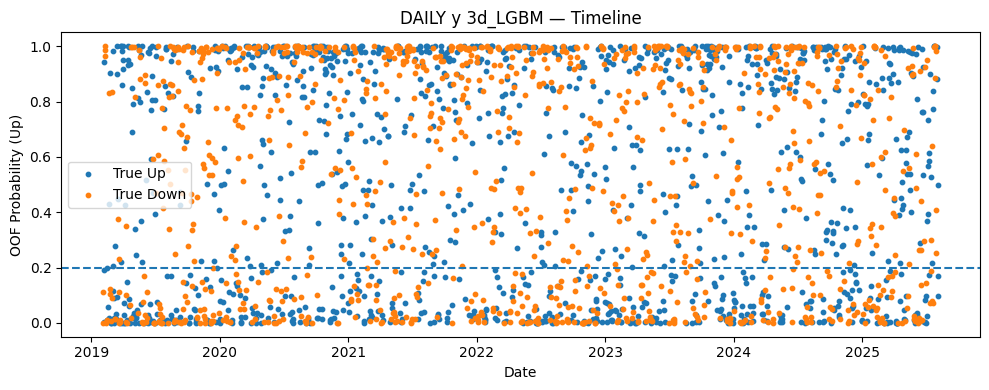


Making plots for: freq=daily, target=y, model=3d_LR


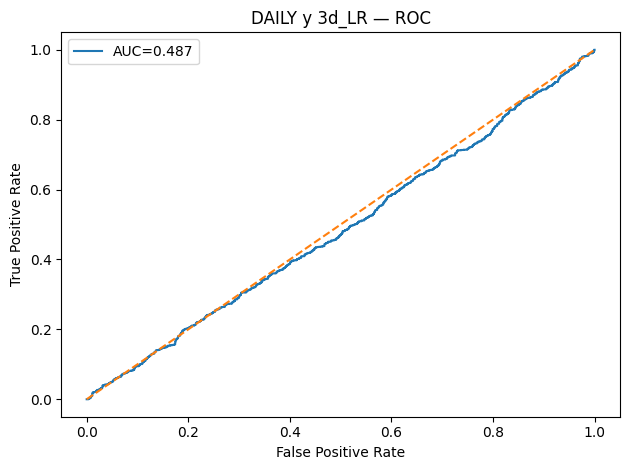

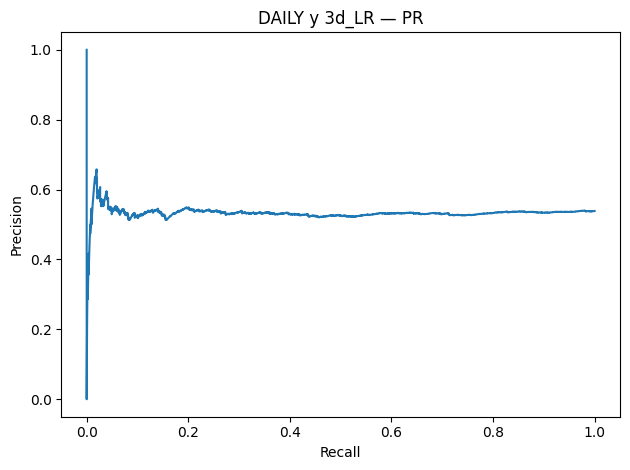

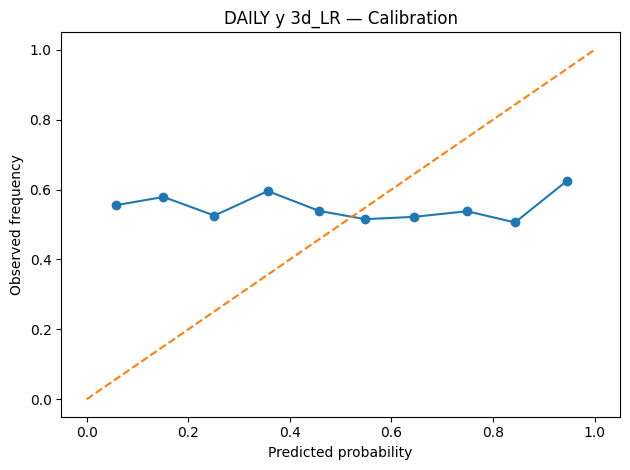

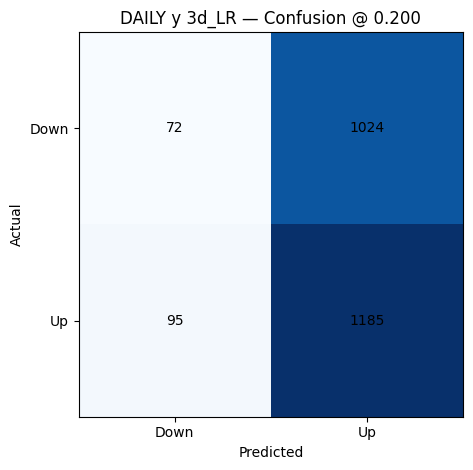

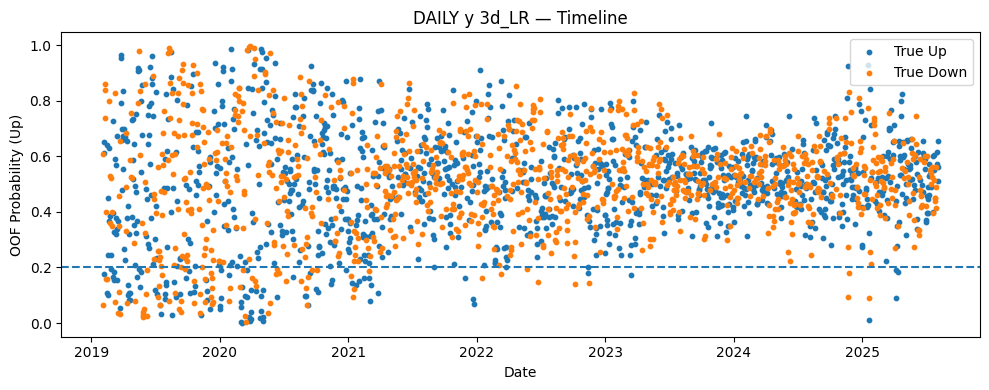


Making plots for: freq=daily, target=y, model=3d_RF


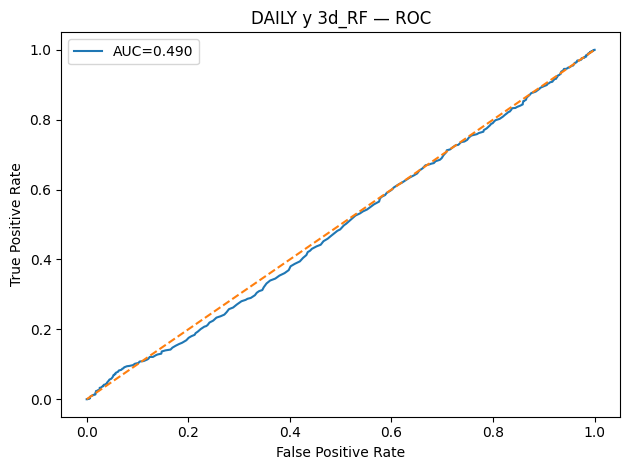

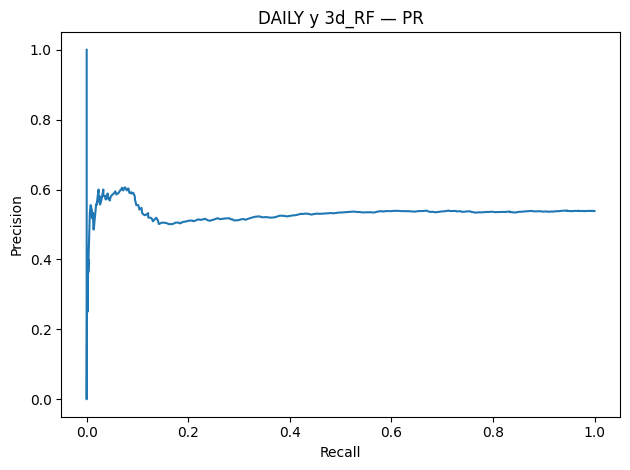

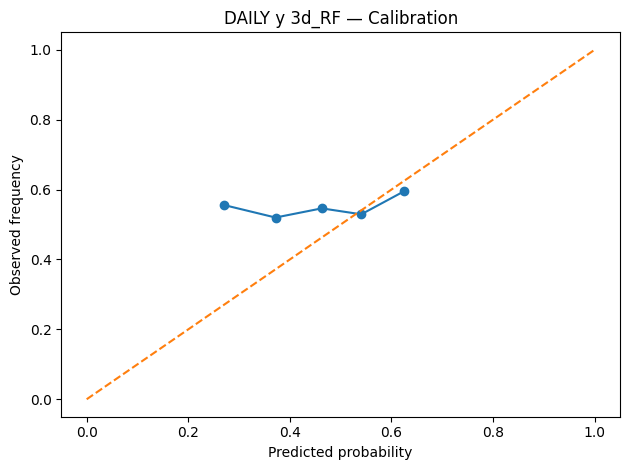

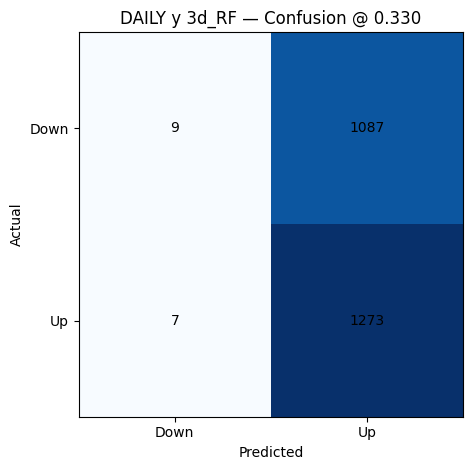

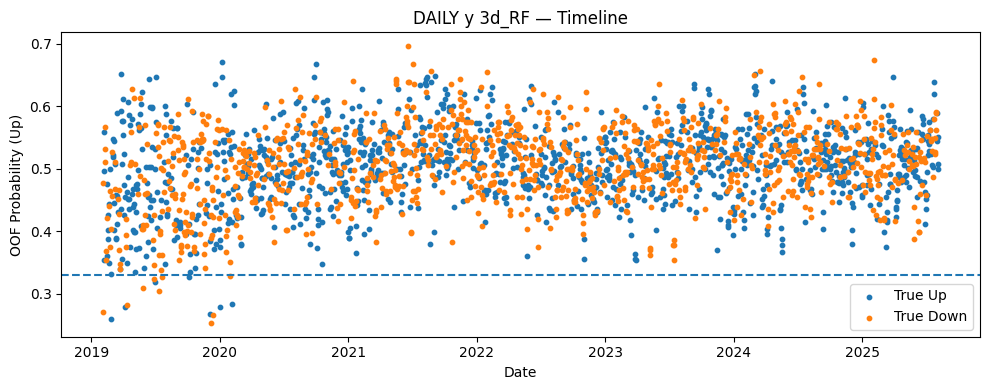


Making plots for: freq=daily, target=y, model=3d_RIDGE


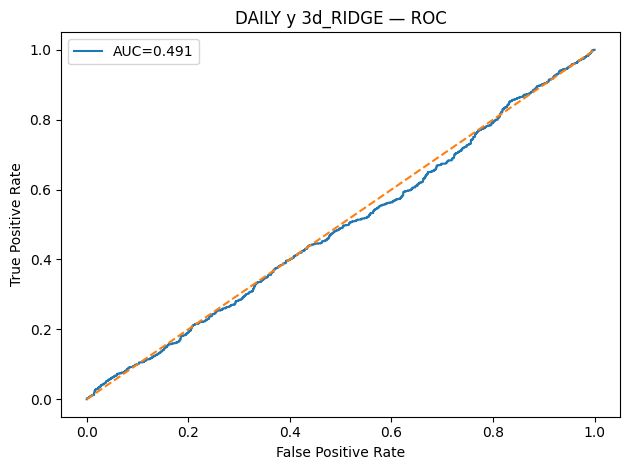

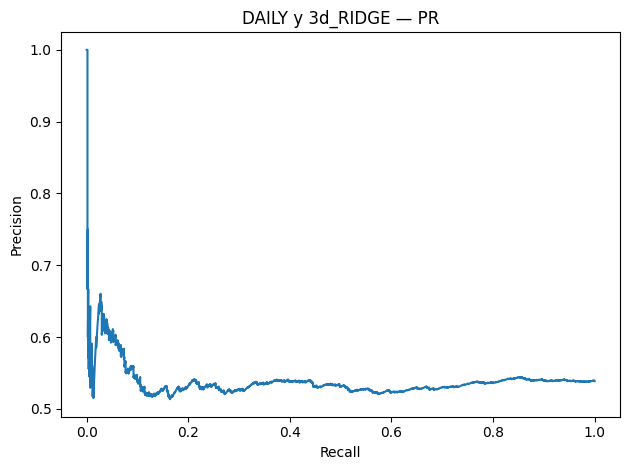

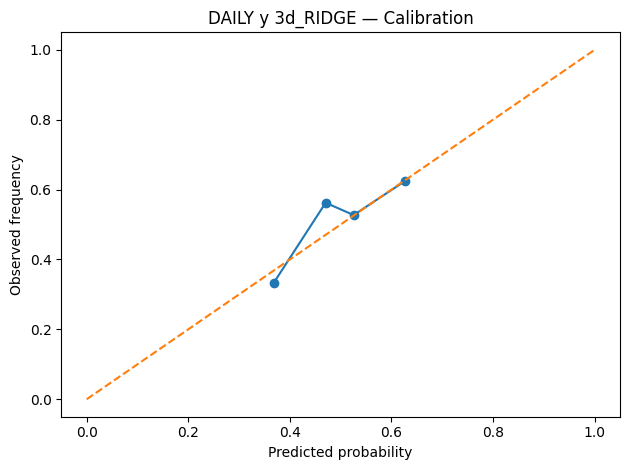

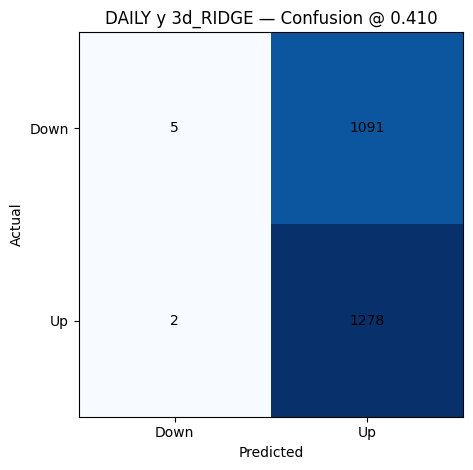

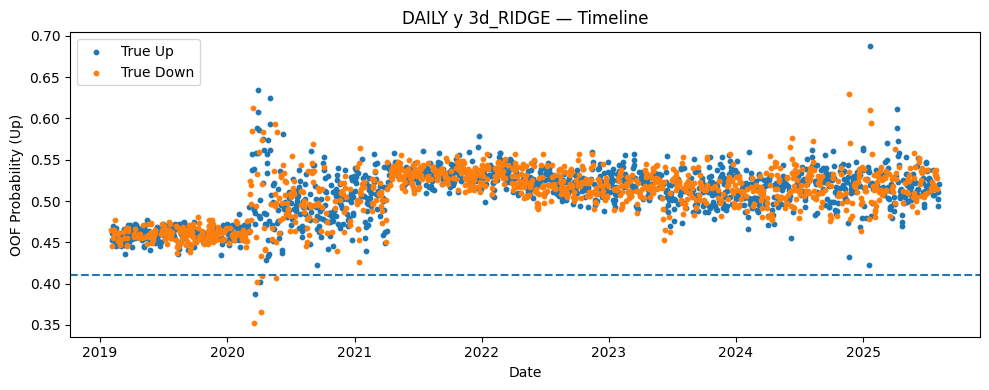


Making plots for: freq=daily, target=y, model=3d_STACK


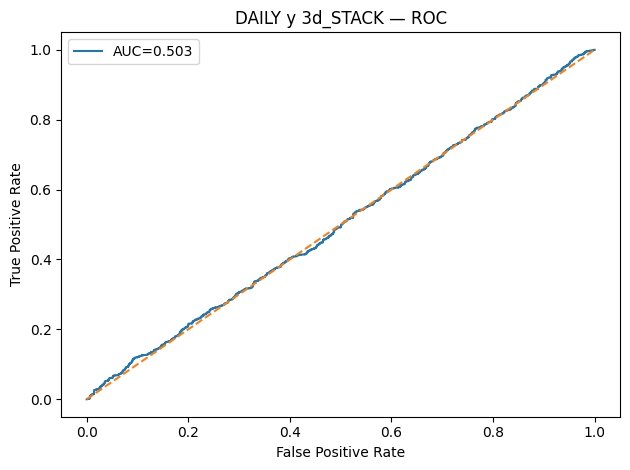

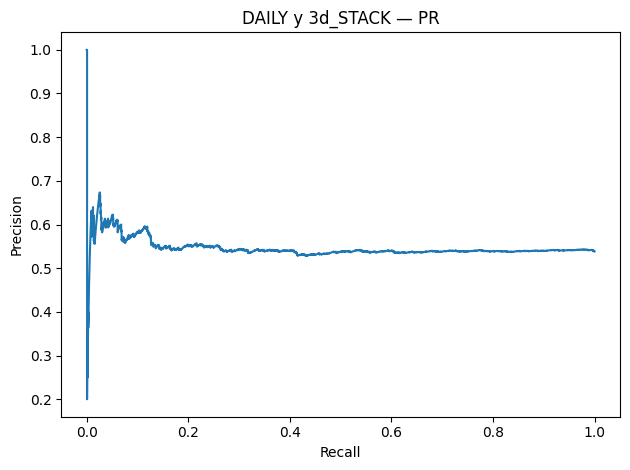

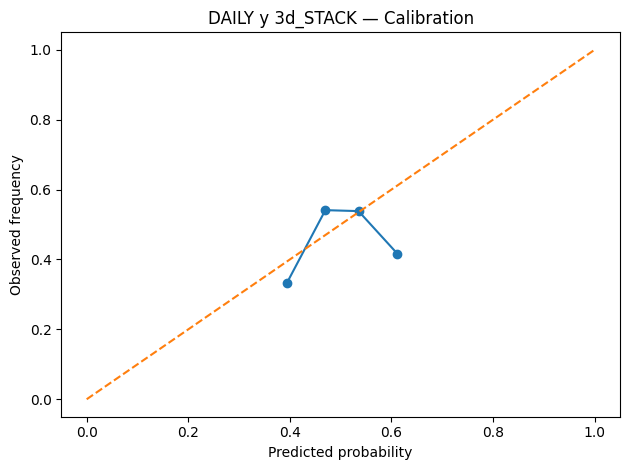

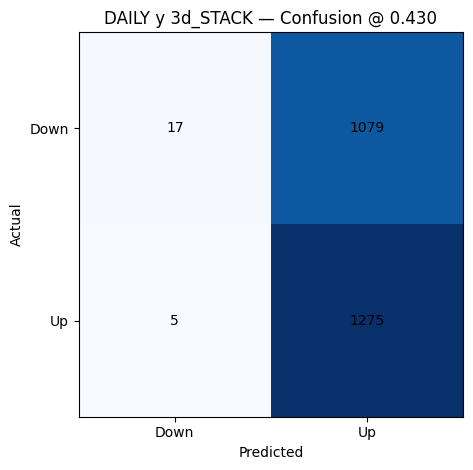

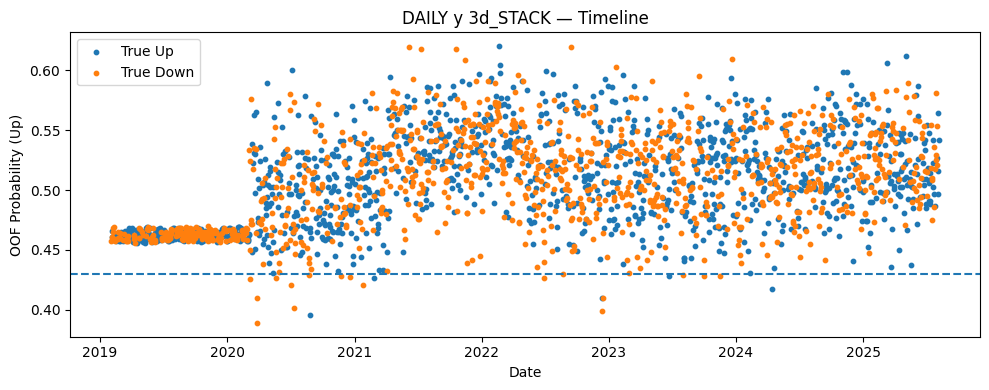


Making plots for: freq=daily, target=y, model=3d_SVM


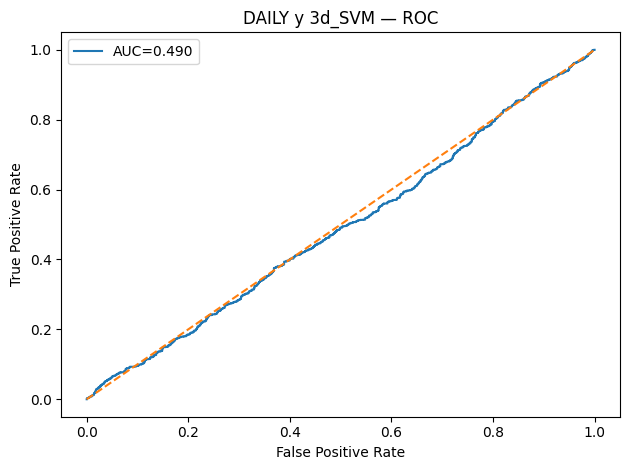

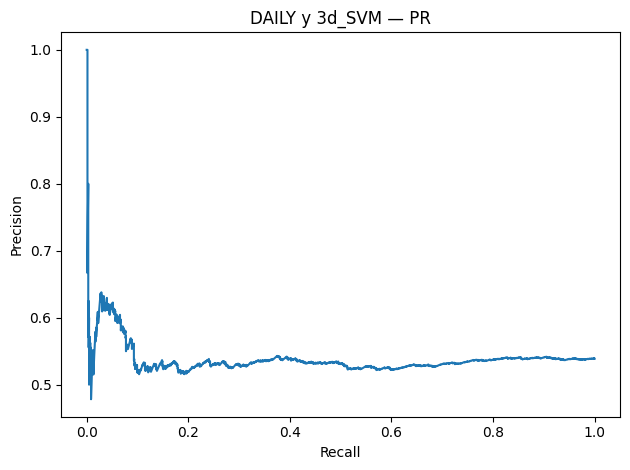

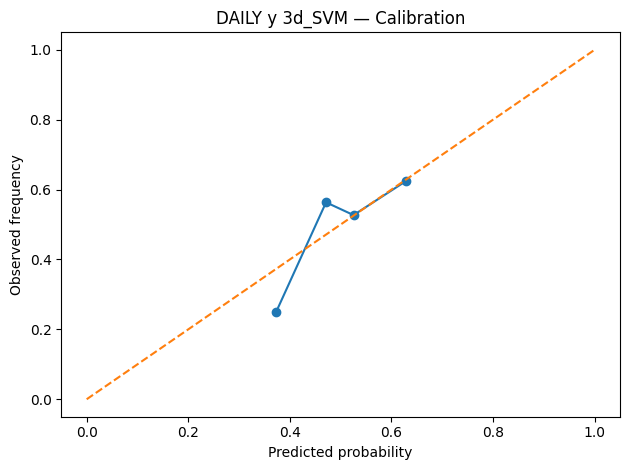

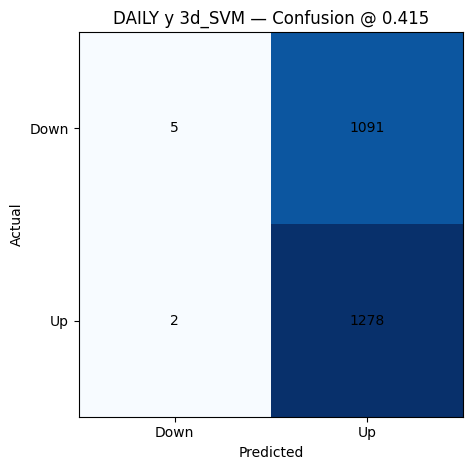

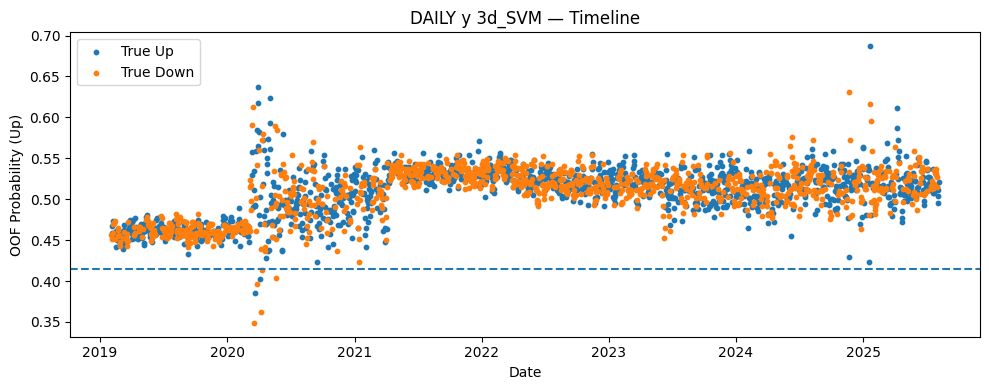


Making plots for: freq=daily, target=y, model=5d_ET


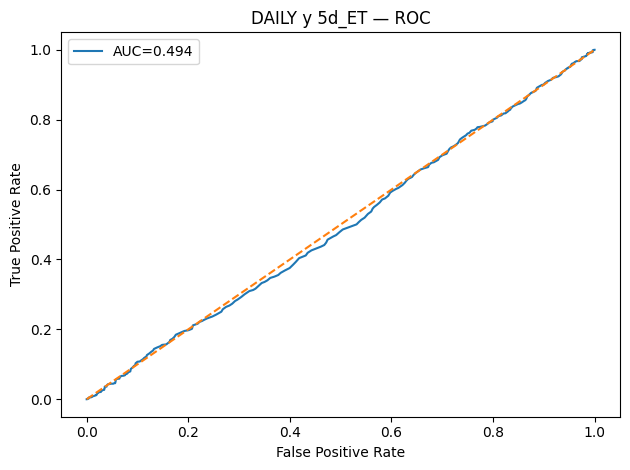

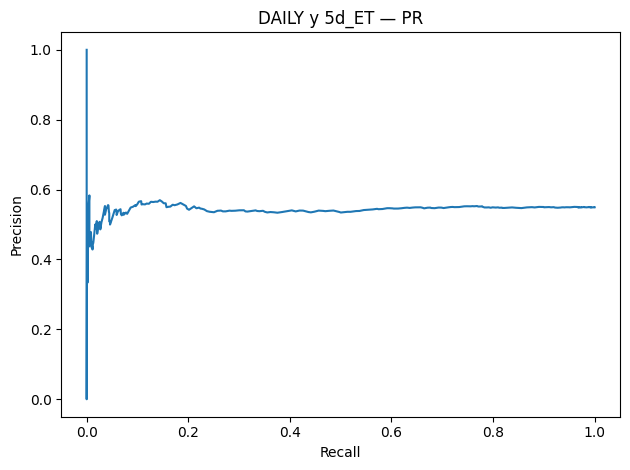

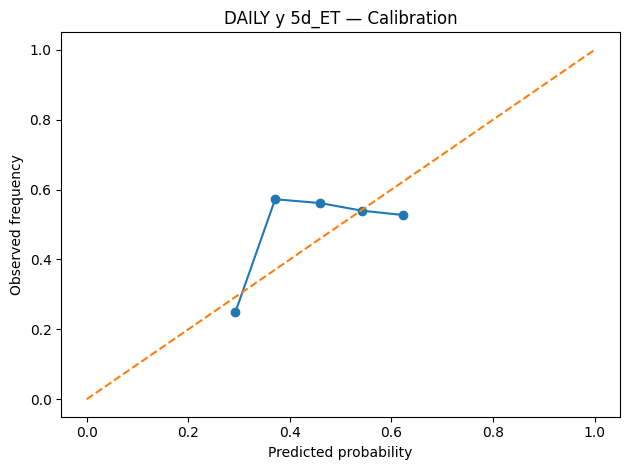

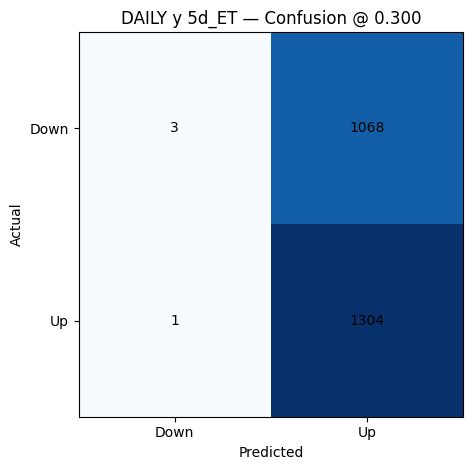

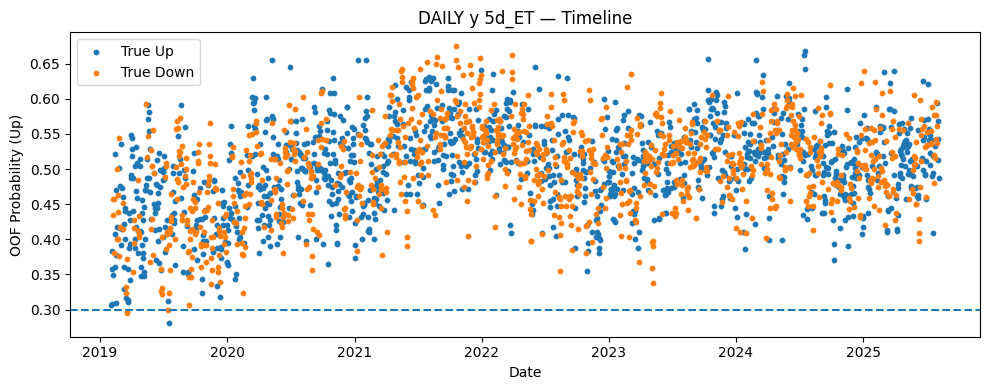


Making plots for: freq=daily, target=y, model=5d_HGB


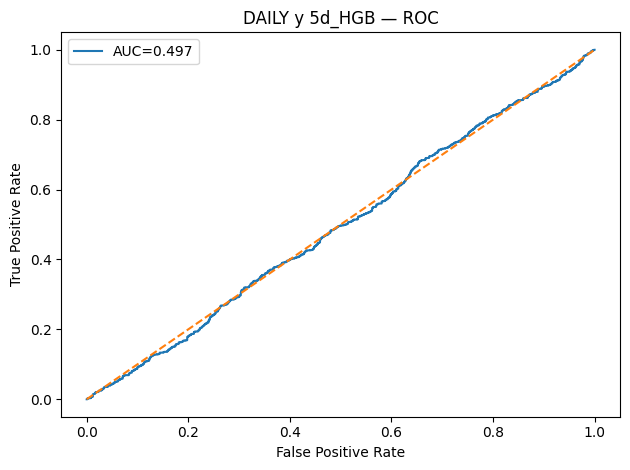

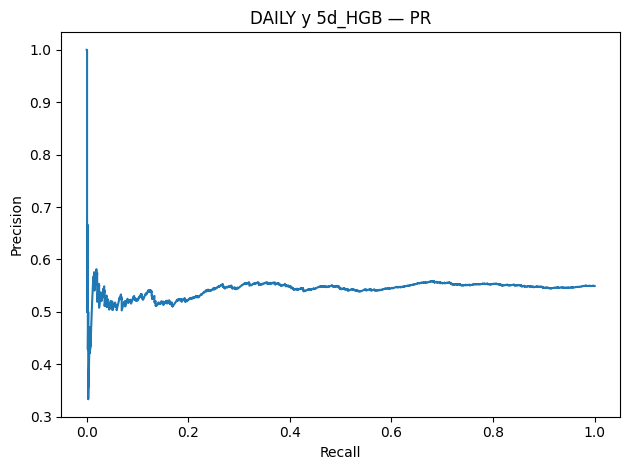

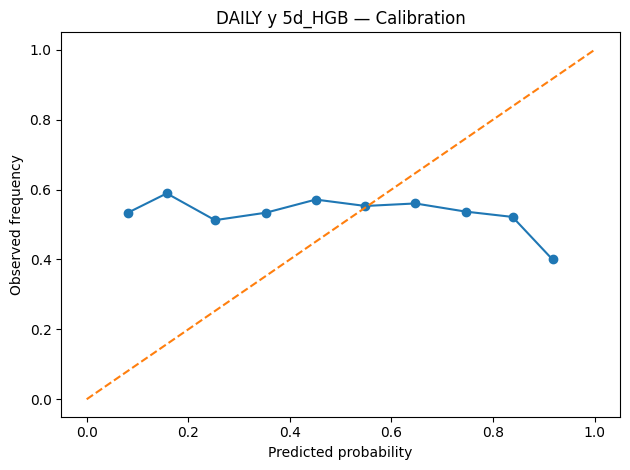

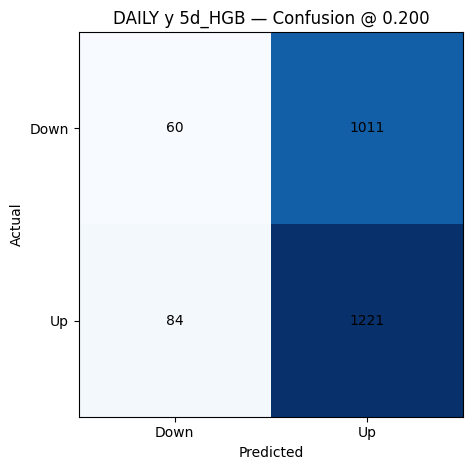

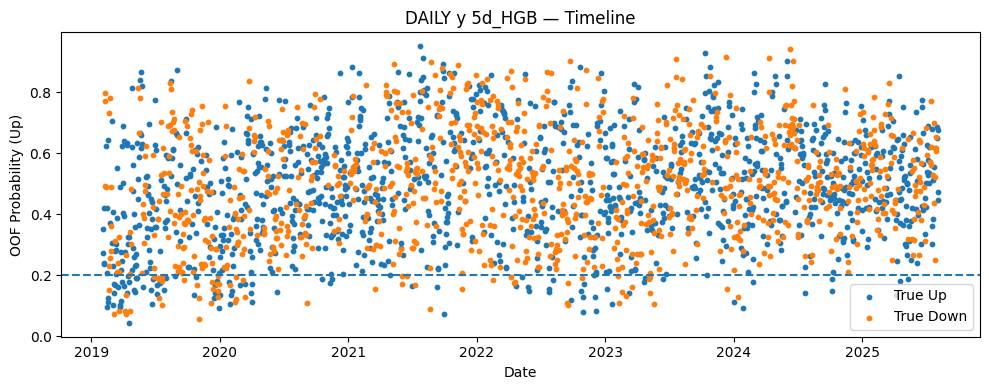


Making plots for: freq=daily, target=y, model=5d_KNN


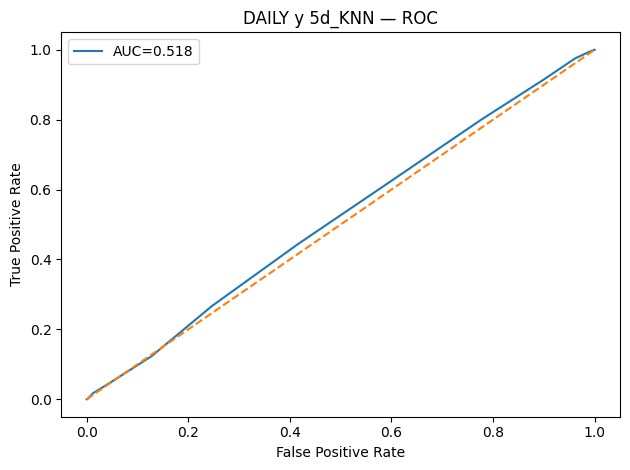

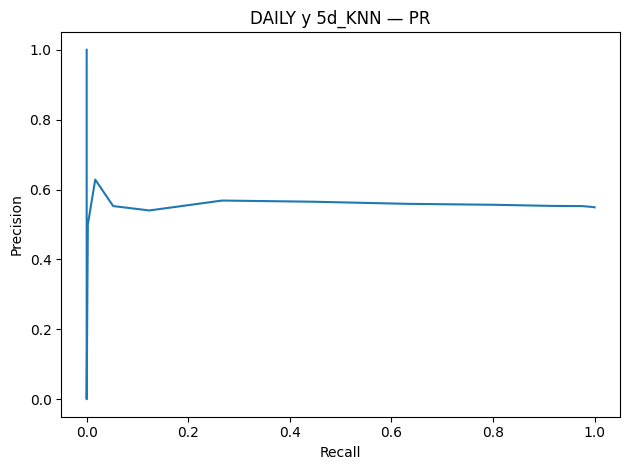

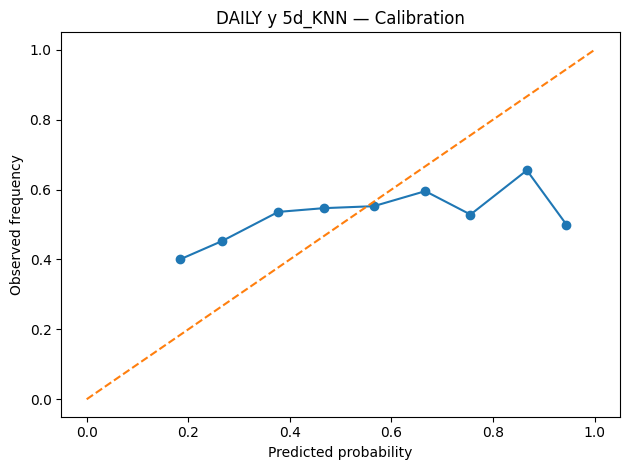

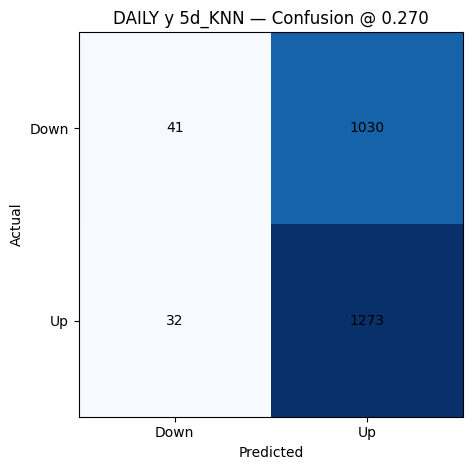

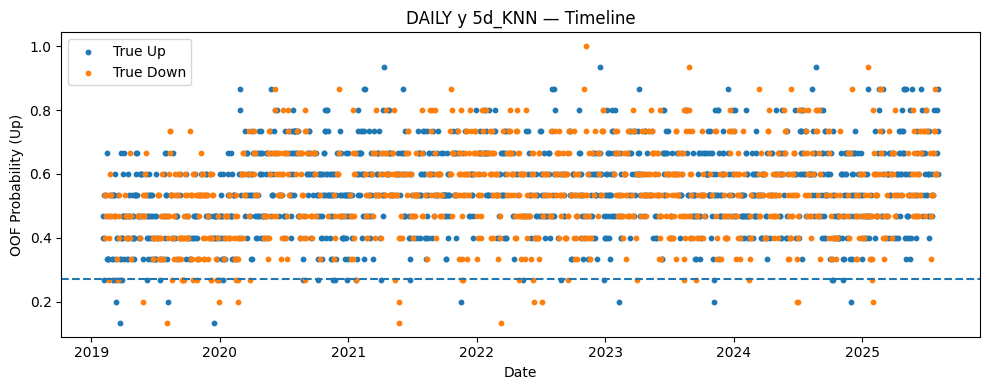


Making plots for: freq=daily, target=y, model=5d_LGBM


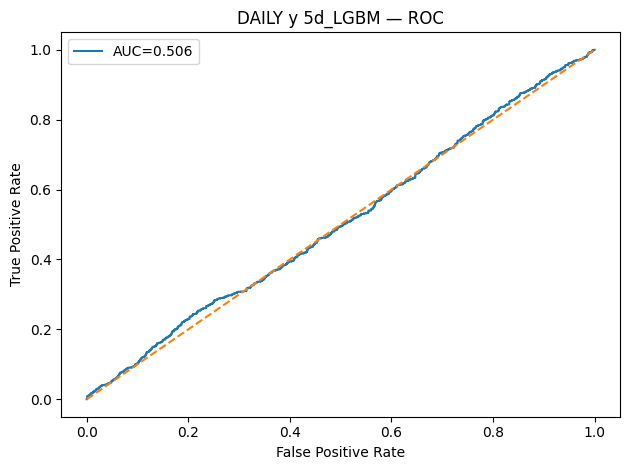

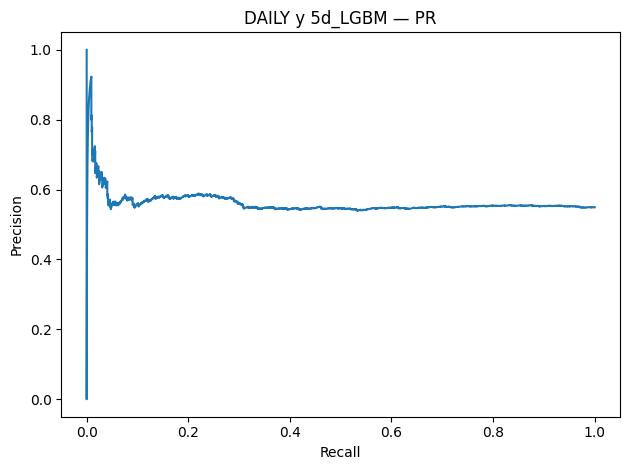

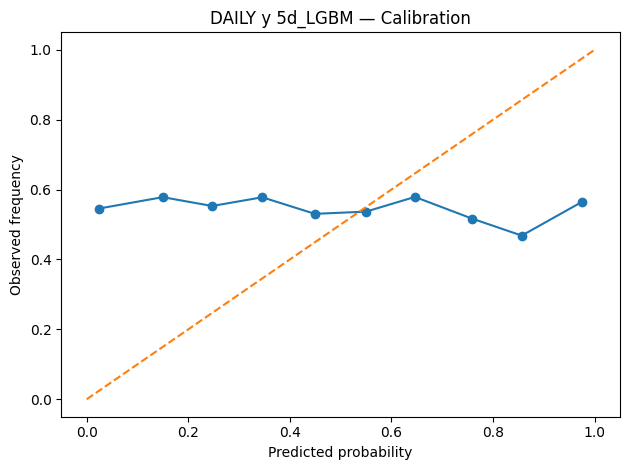

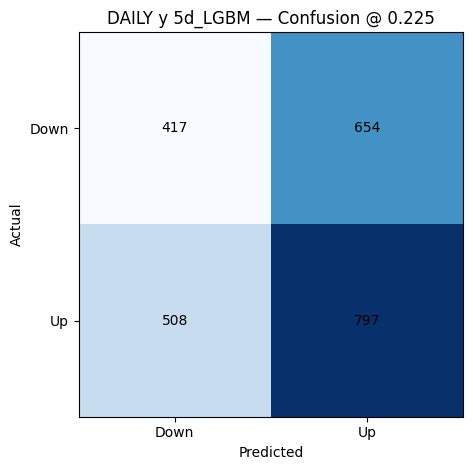

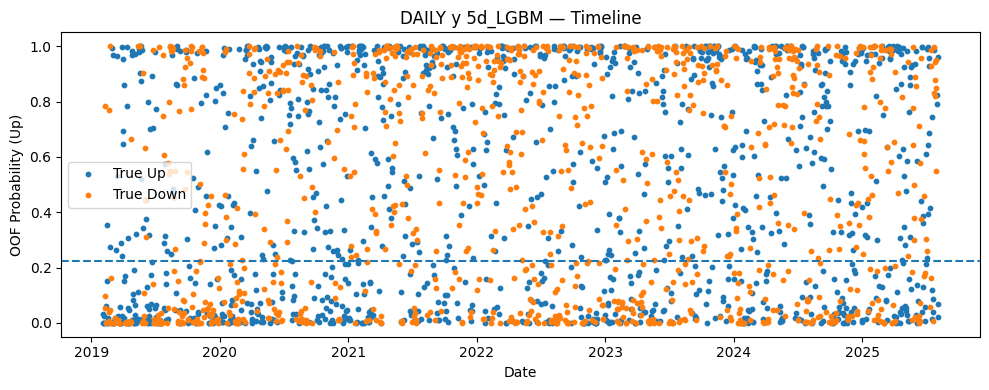


Making plots for: freq=daily, target=y, model=5d_LR


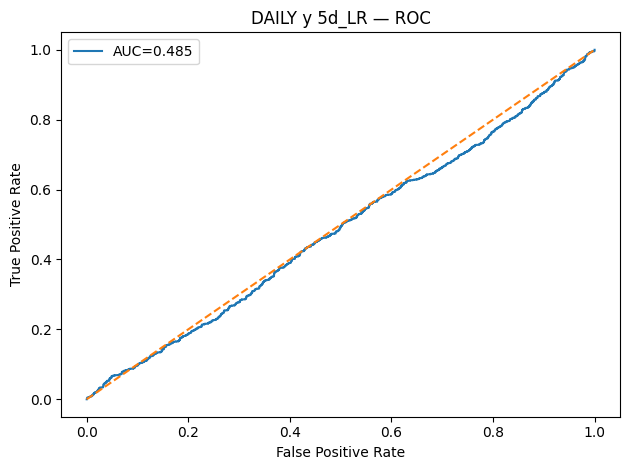

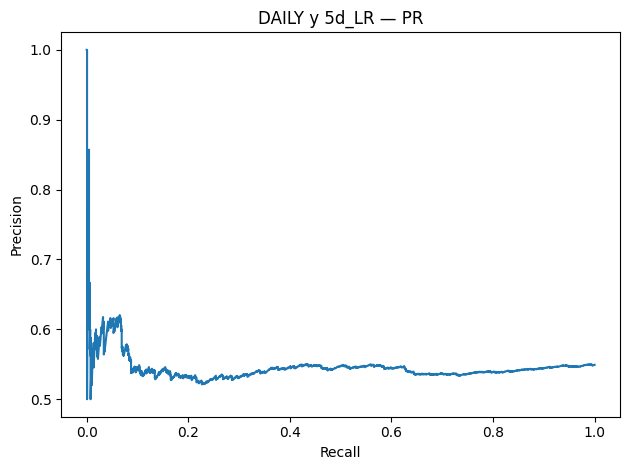

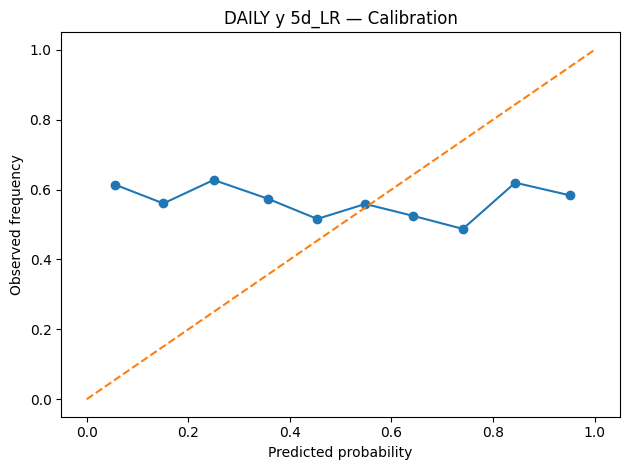

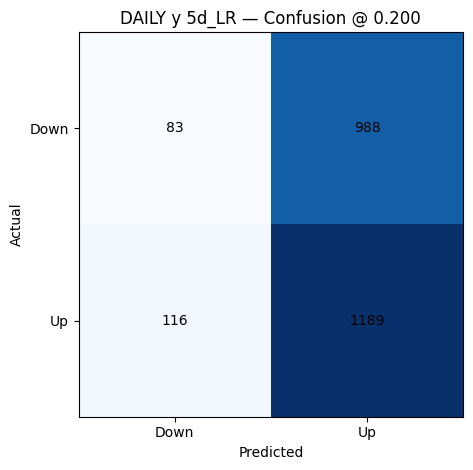

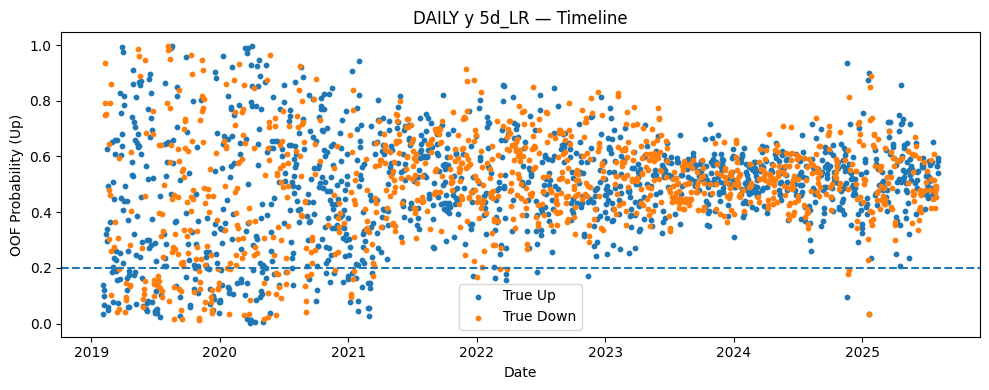


Making plots for: freq=daily, target=y, model=5d_RF


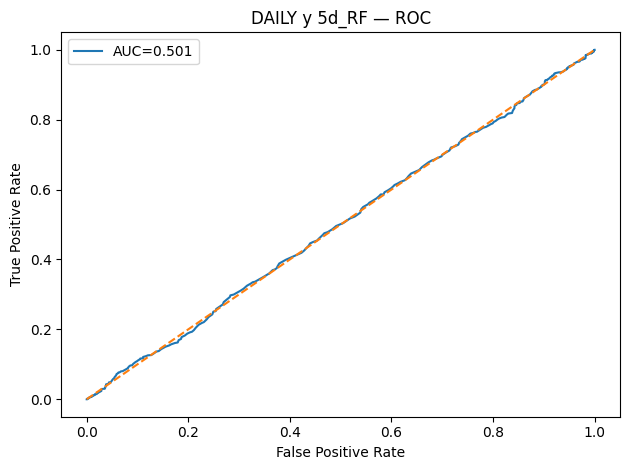

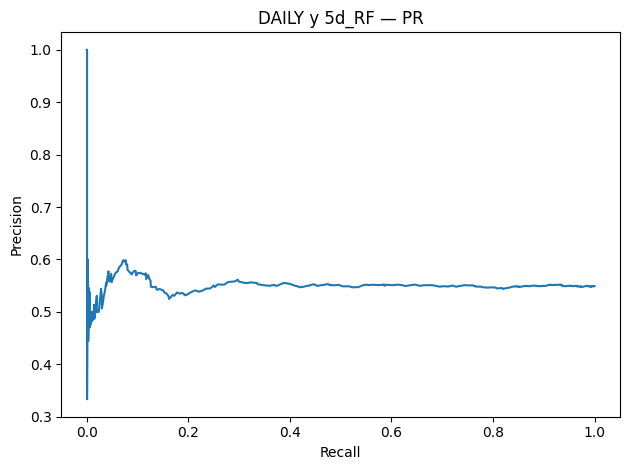

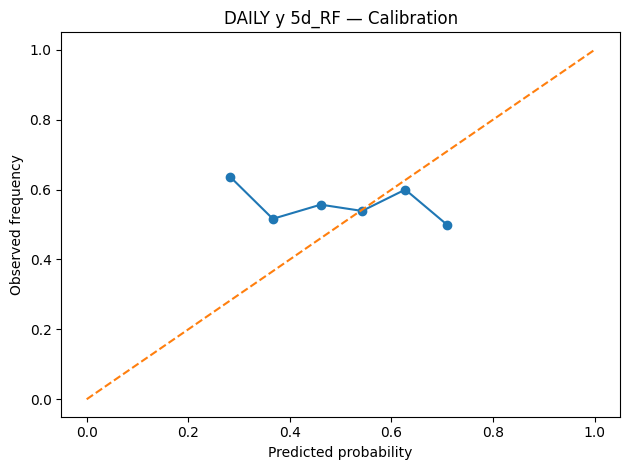

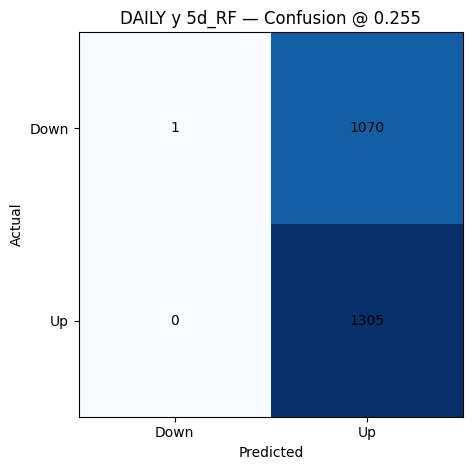

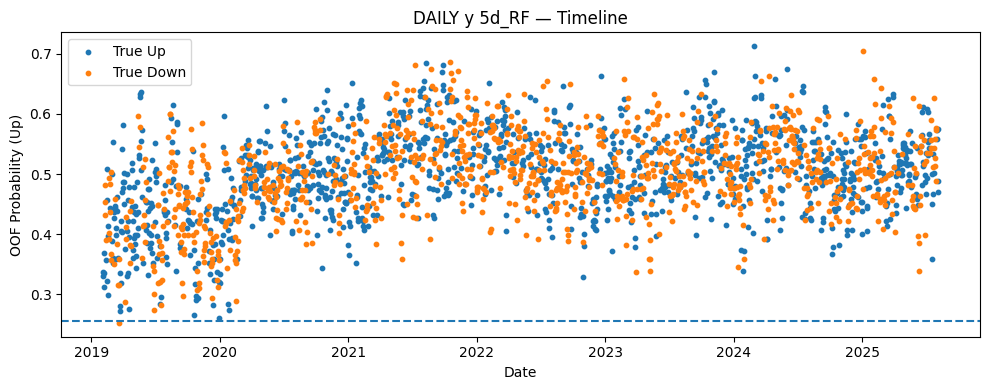


Making plots for: freq=daily, target=y, model=5d_RIDGE


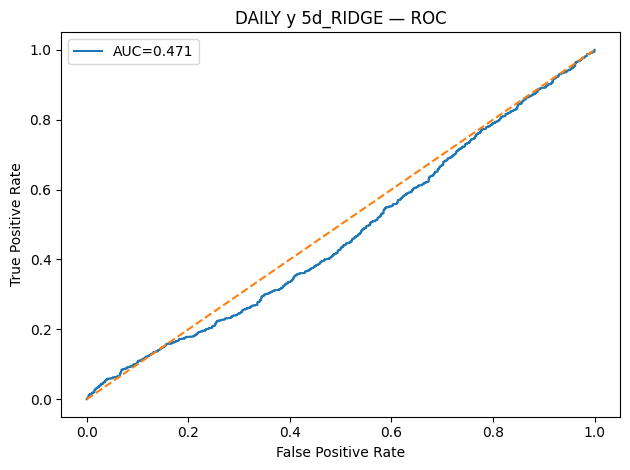

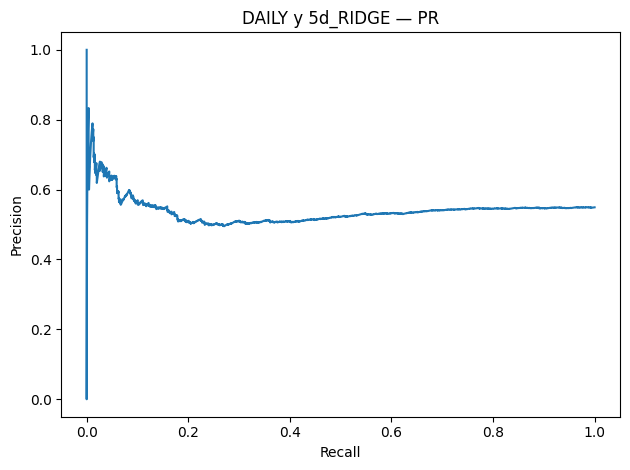

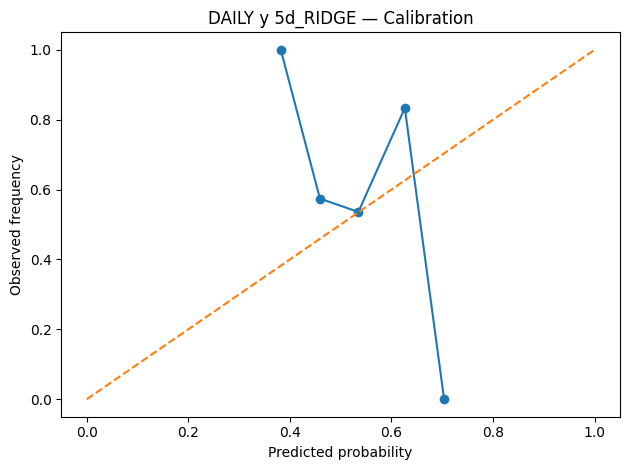

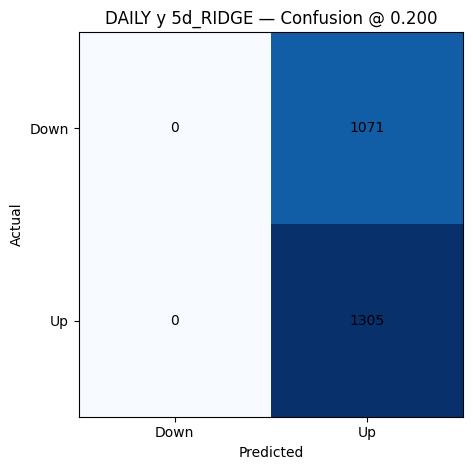

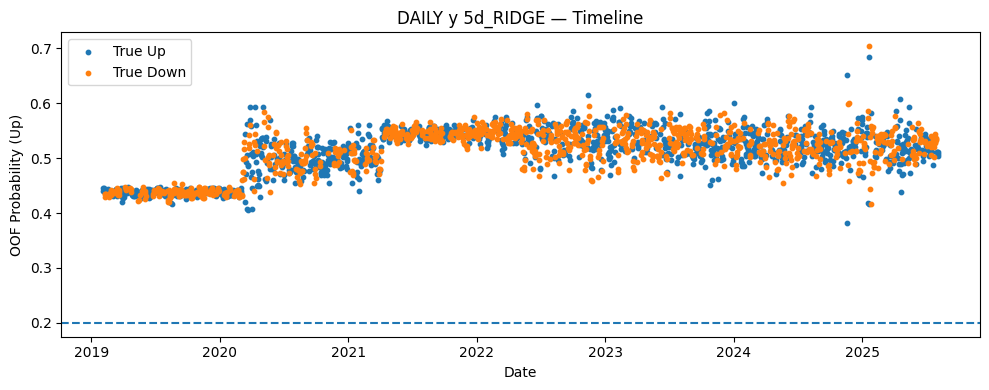


Making plots for: freq=daily, target=y, model=5d_STACK


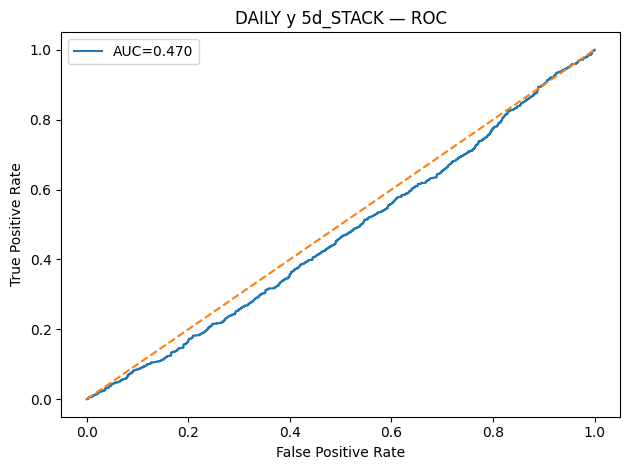

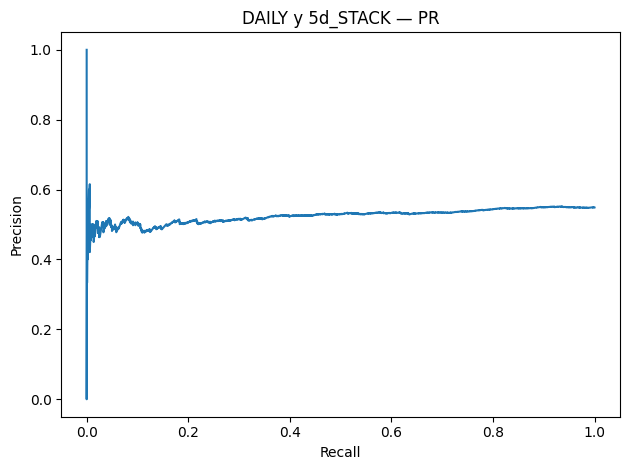

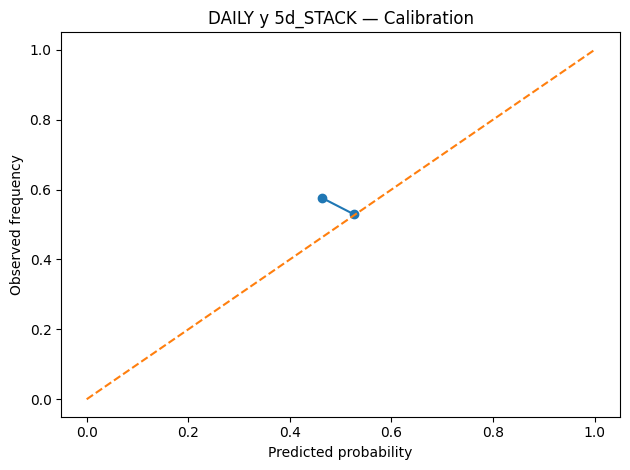

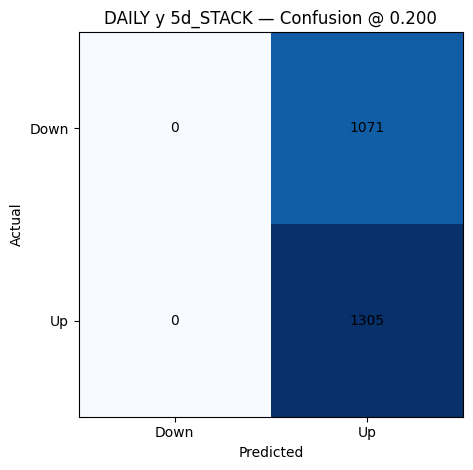

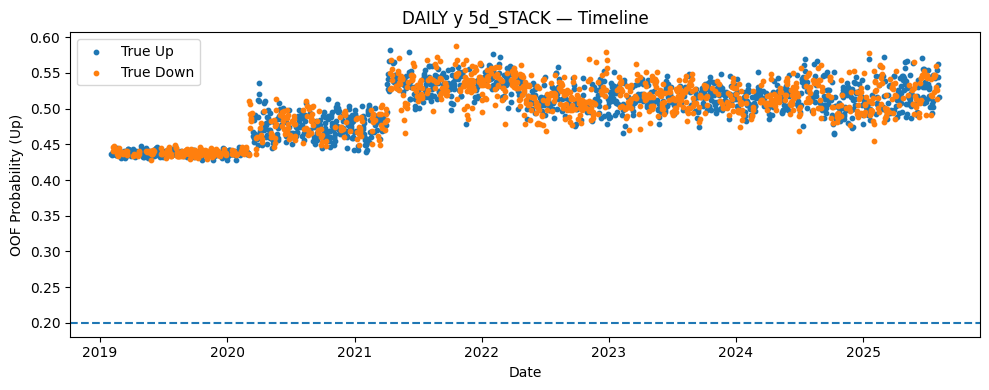


Making plots for: freq=daily, target=y, model=5d_SVM


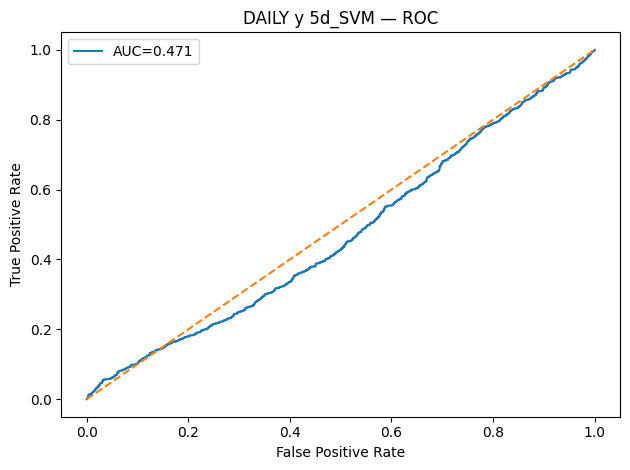

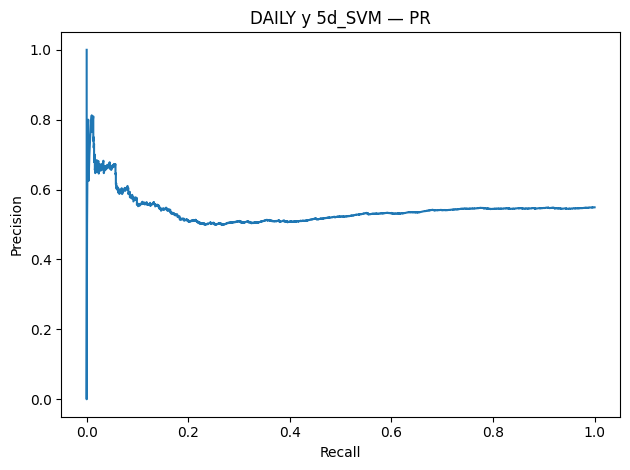

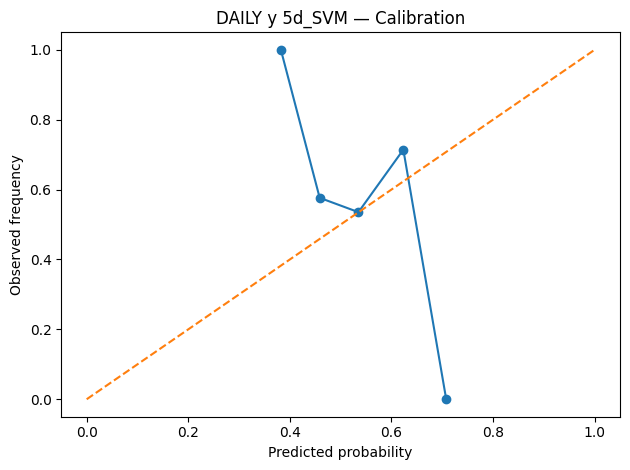

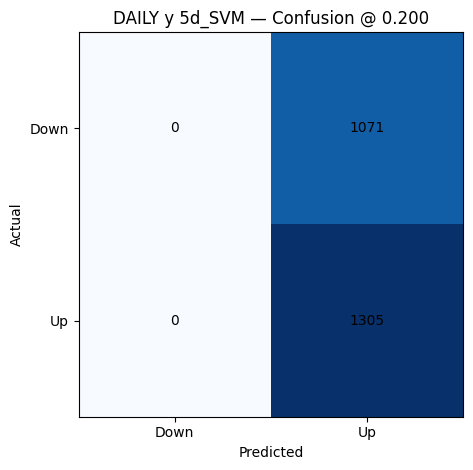

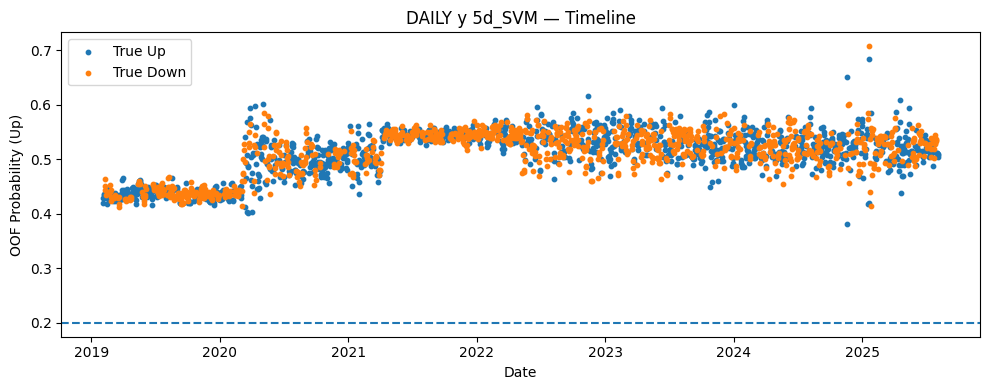


Making plots for: freq=weekly, target=y, model=1w_ET


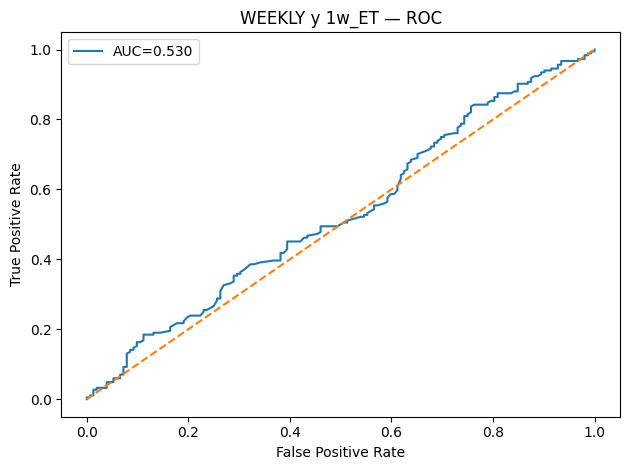

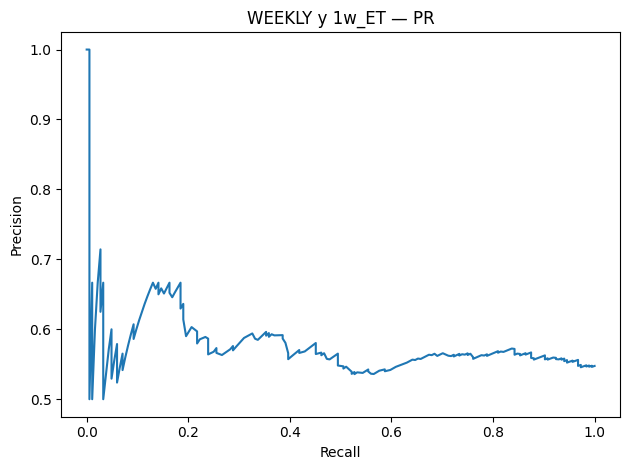

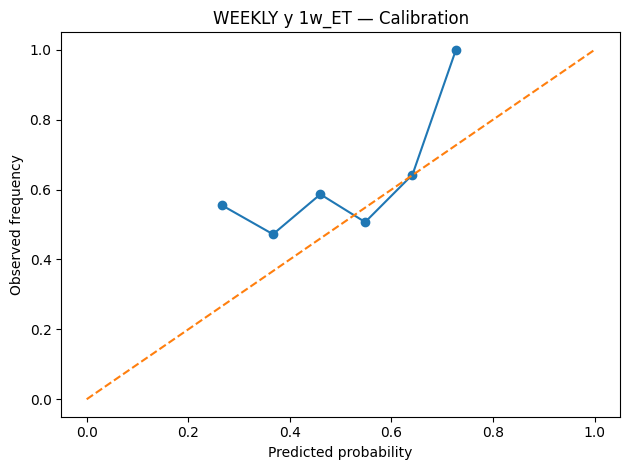

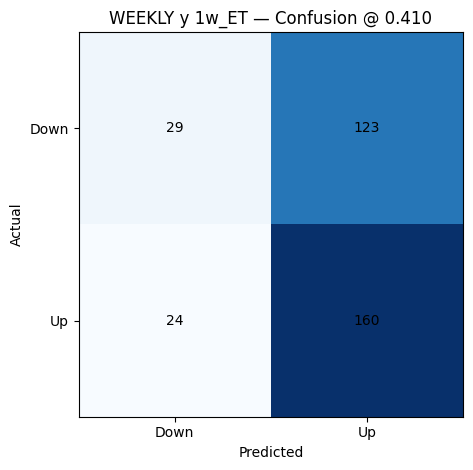

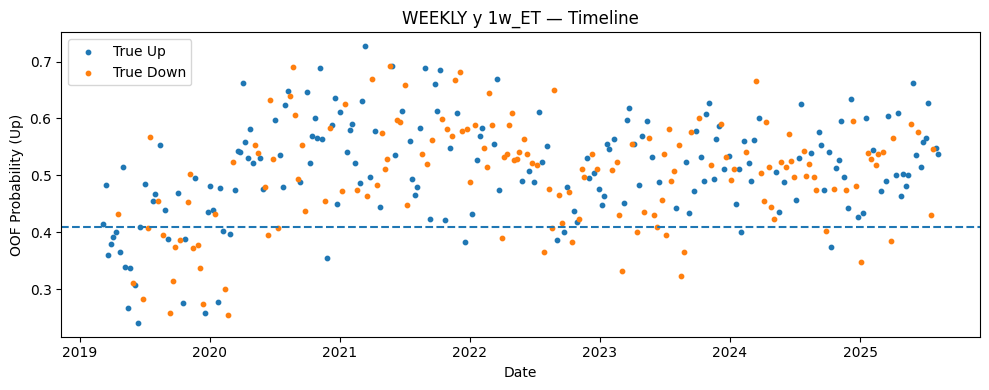


Making plots for: freq=weekly, target=y, model=1w_HGB


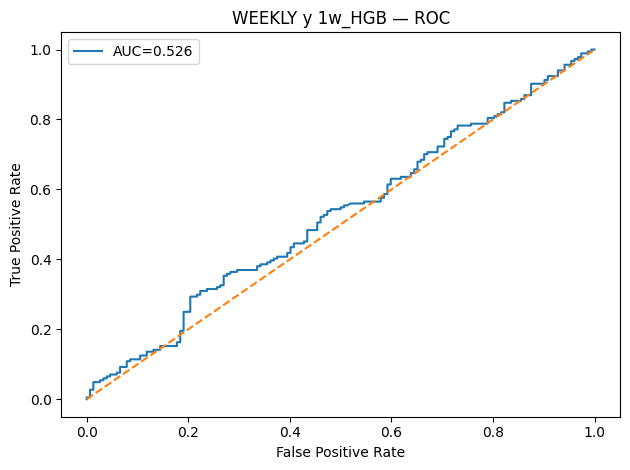

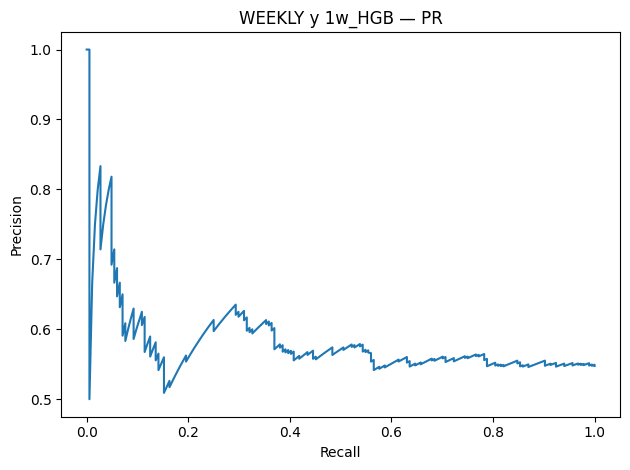

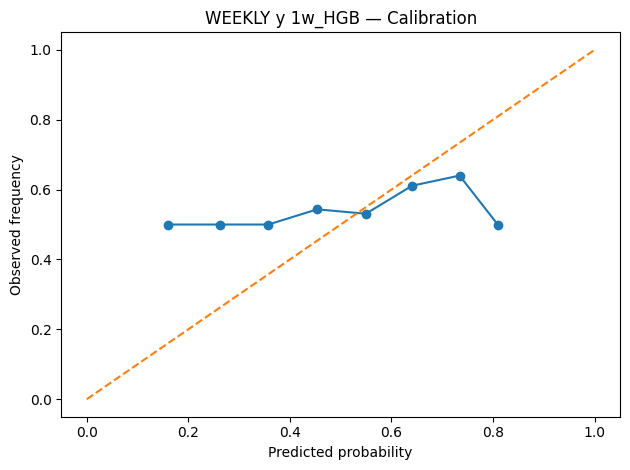

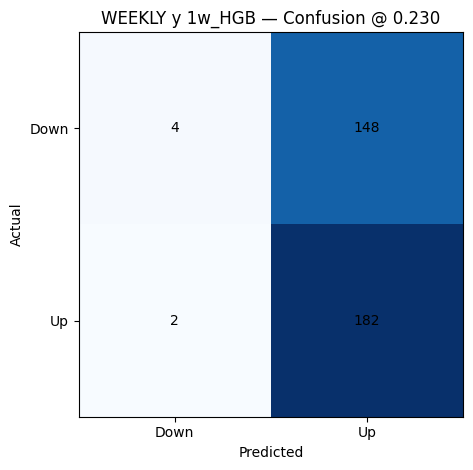

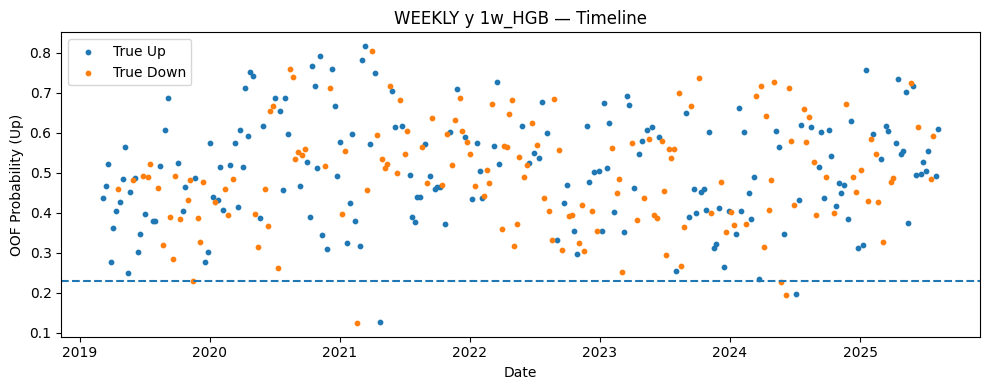


Making plots for: freq=weekly, target=y, model=1w_KNN


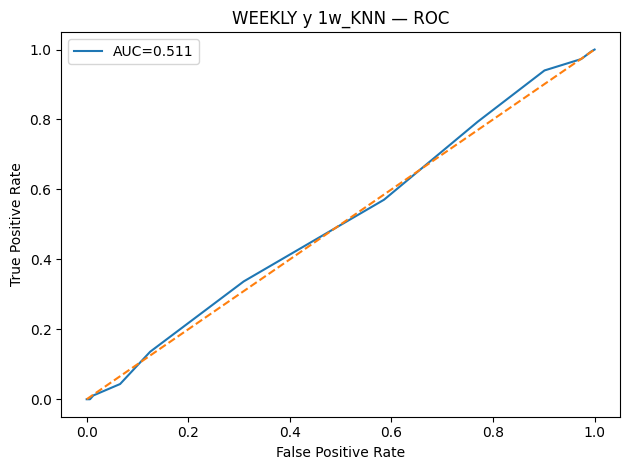

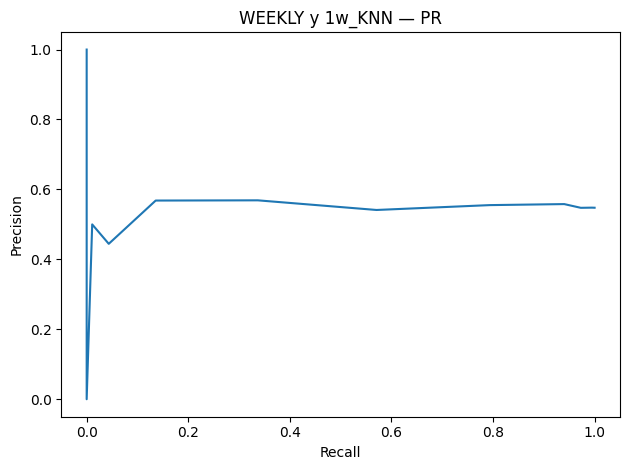

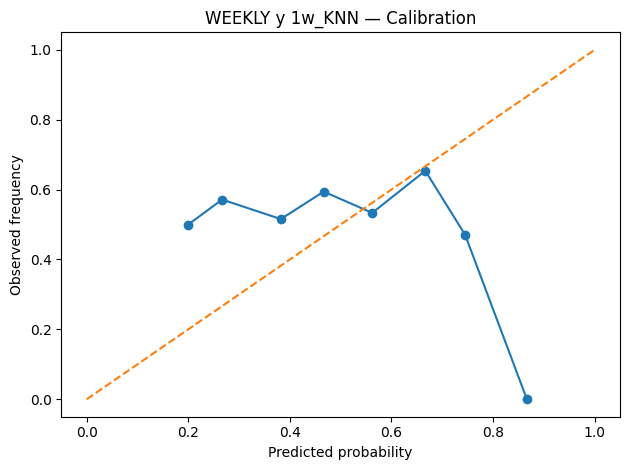

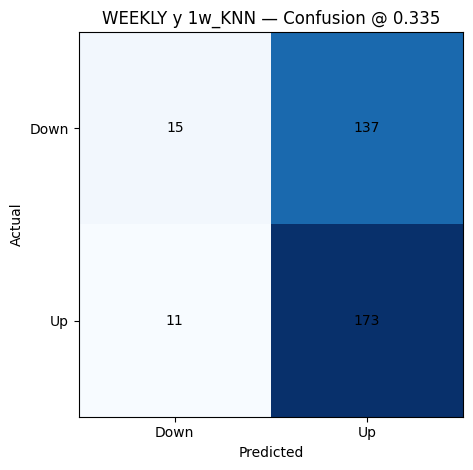

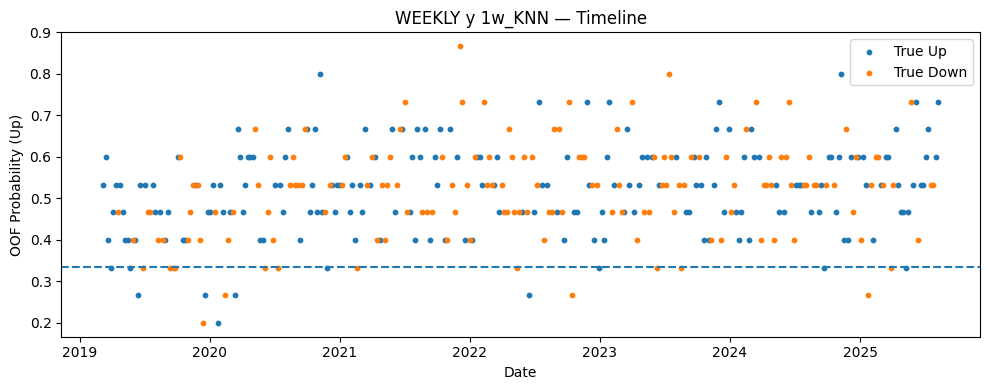


Making plots for: freq=weekly, target=y, model=1w_LGBM


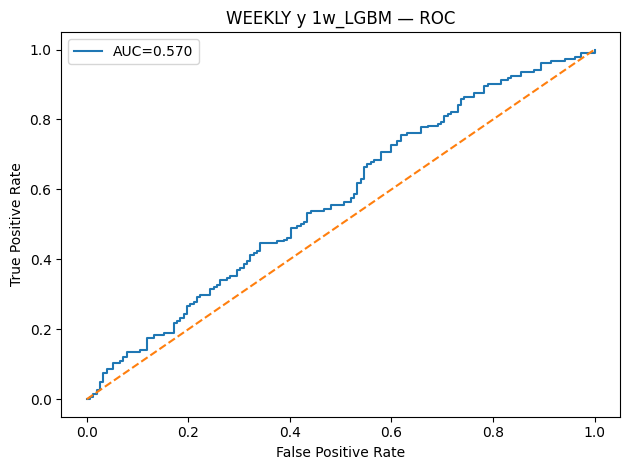

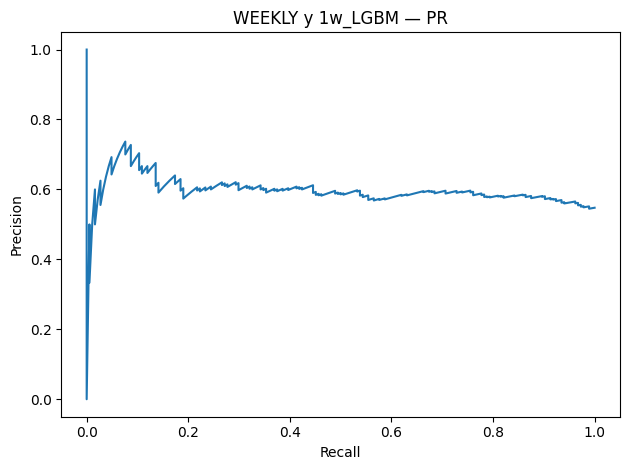

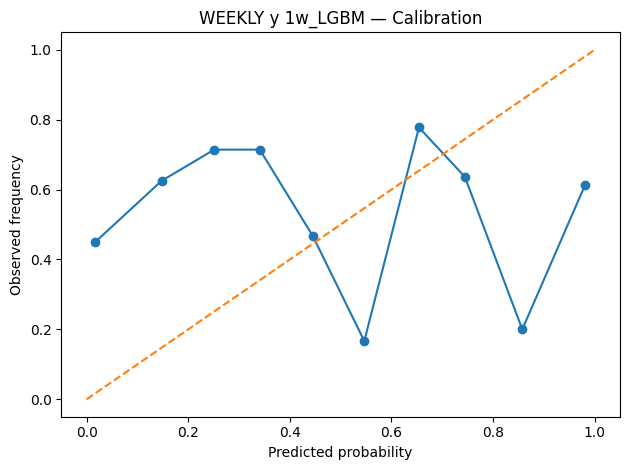

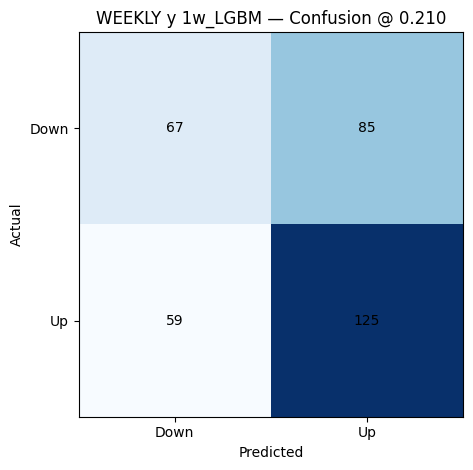

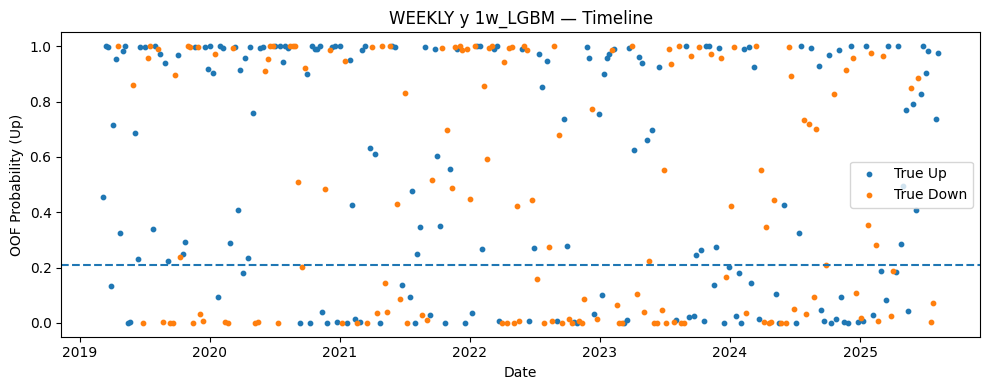


Making plots for: freq=weekly, target=y, model=1w_LR


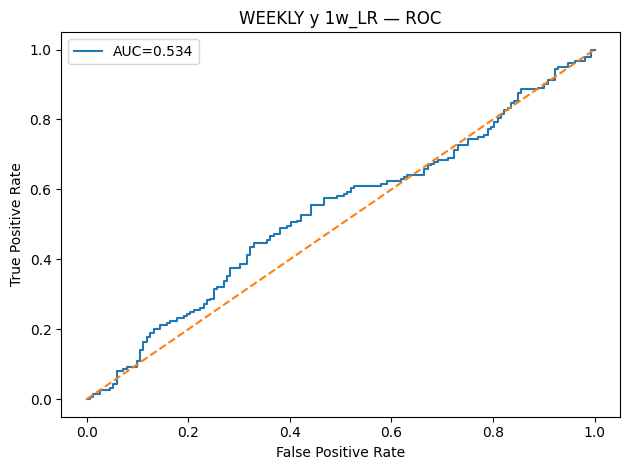

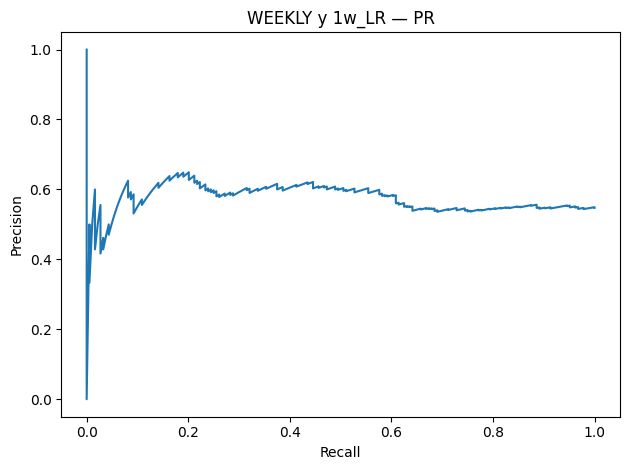

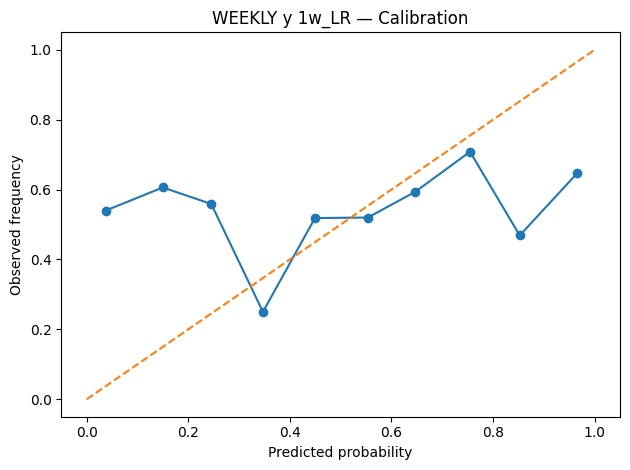

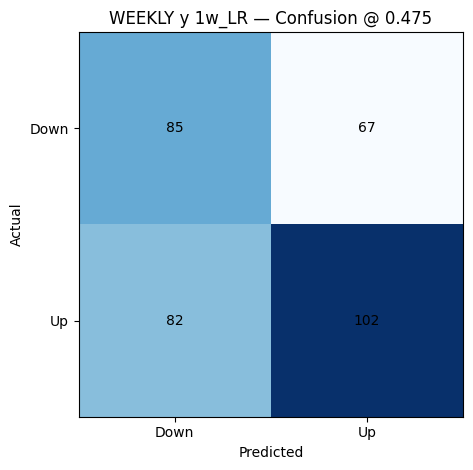

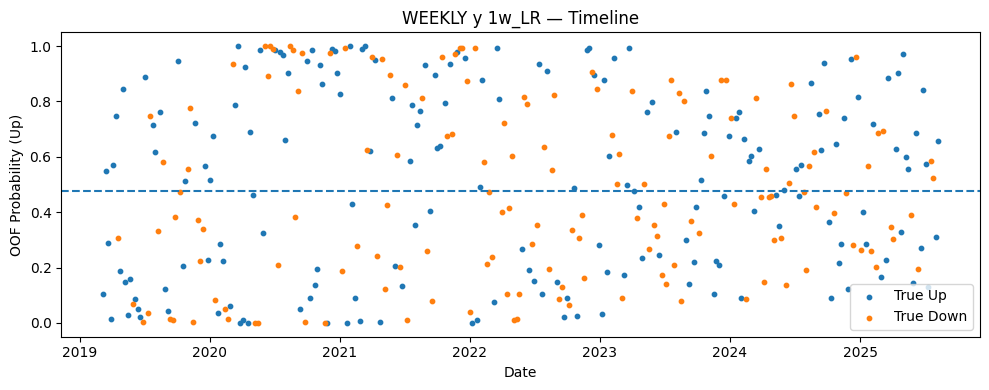


Making plots for: freq=weekly, target=y, model=1w_RF


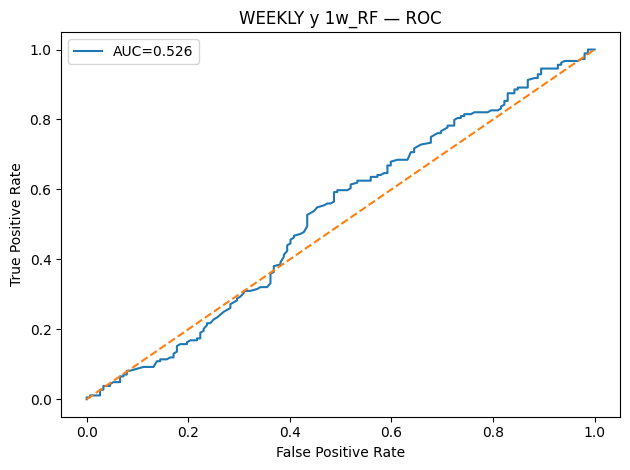

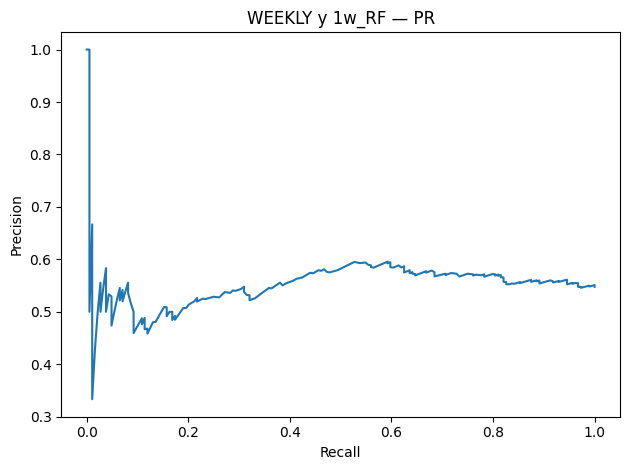

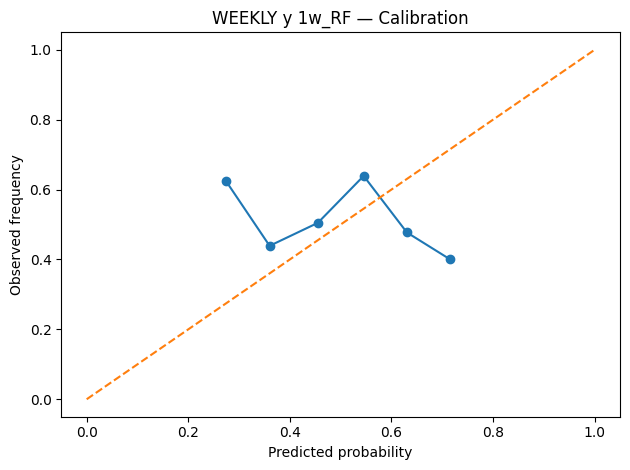

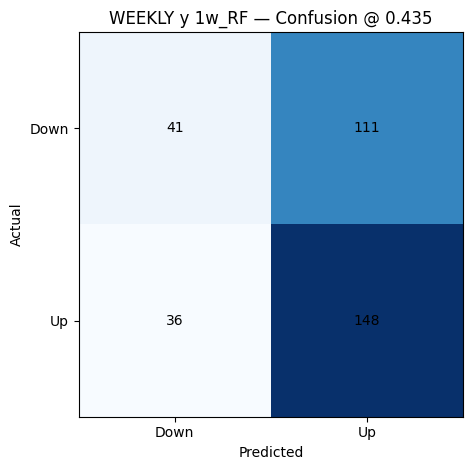

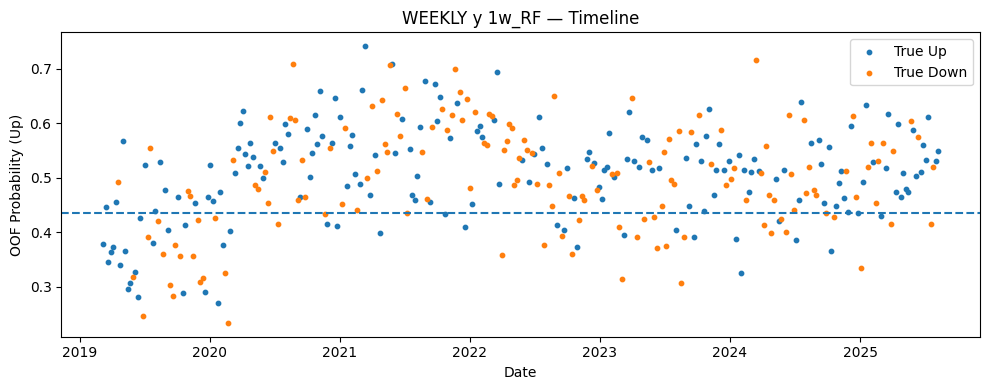


Making plots for: freq=weekly, target=y, model=1w_RIDGE


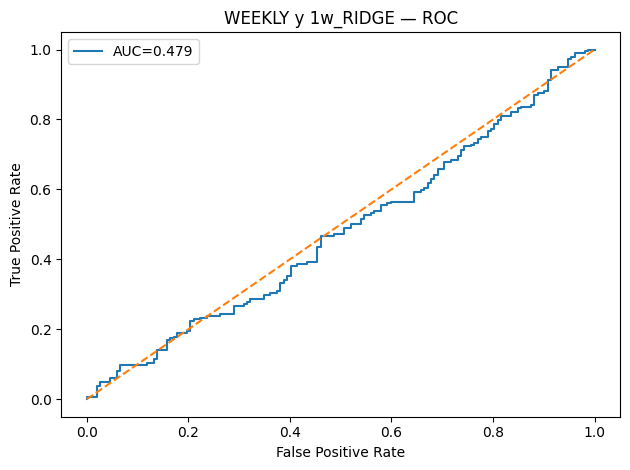

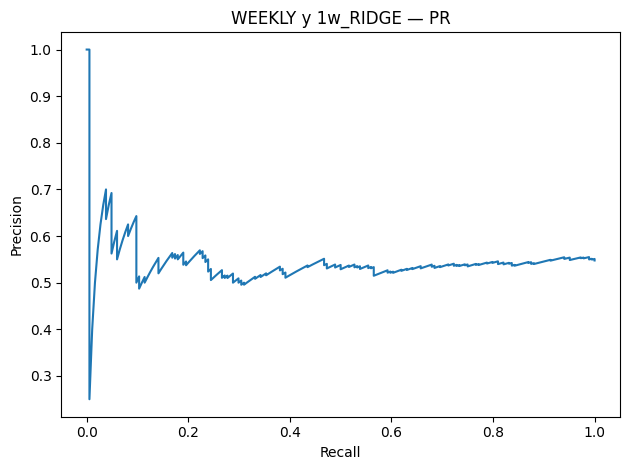

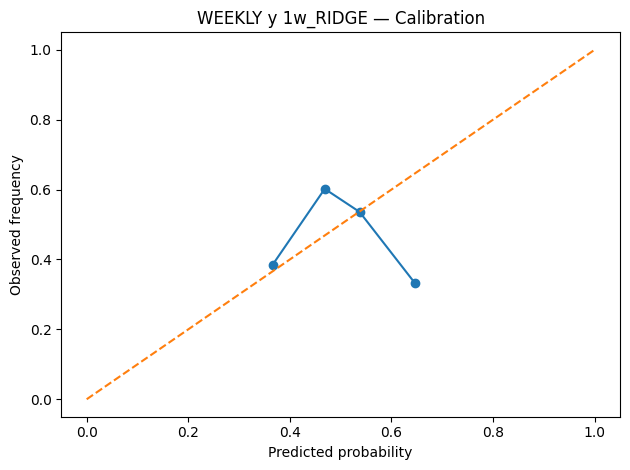

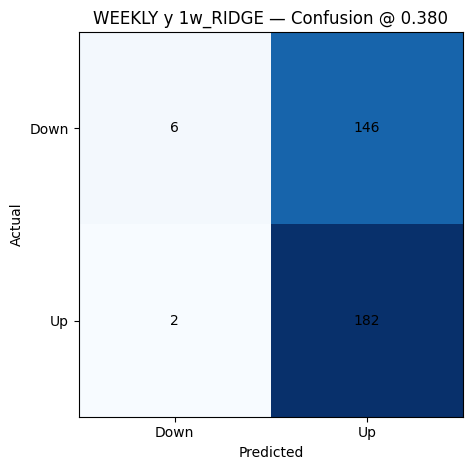

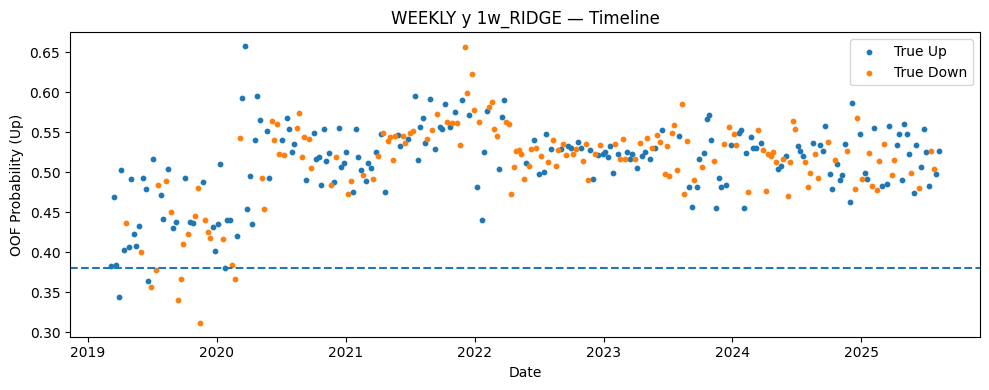


Making plots for: freq=weekly, target=y, model=1w_STACK


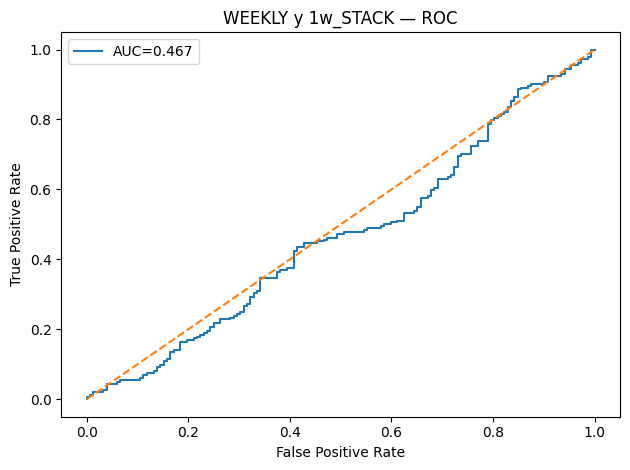

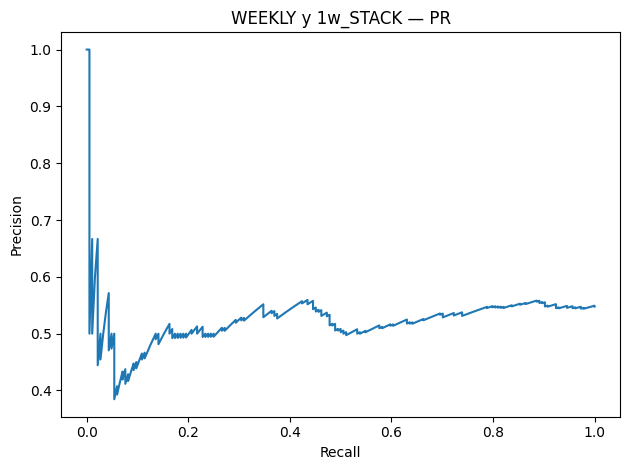

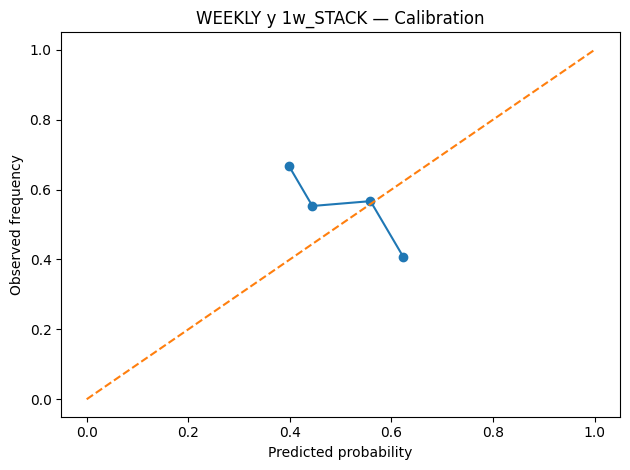

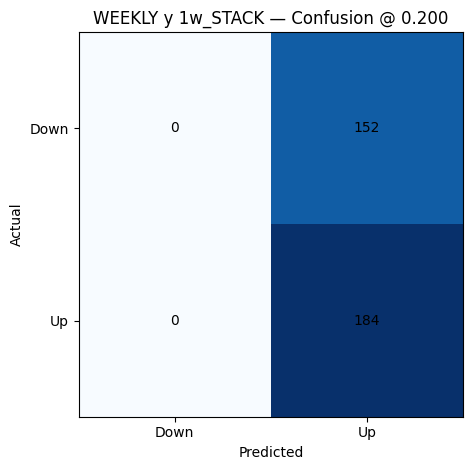

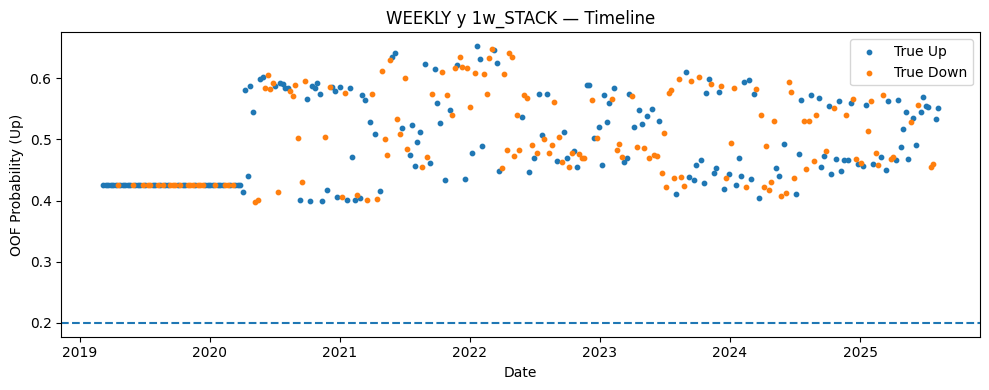


Making plots for: freq=weekly, target=y, model=1w_SVM


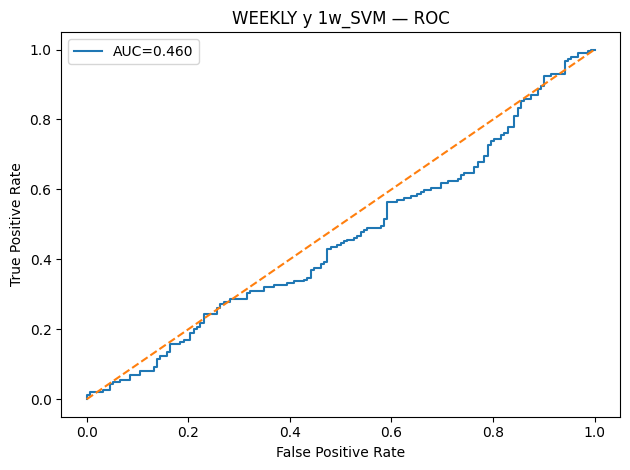

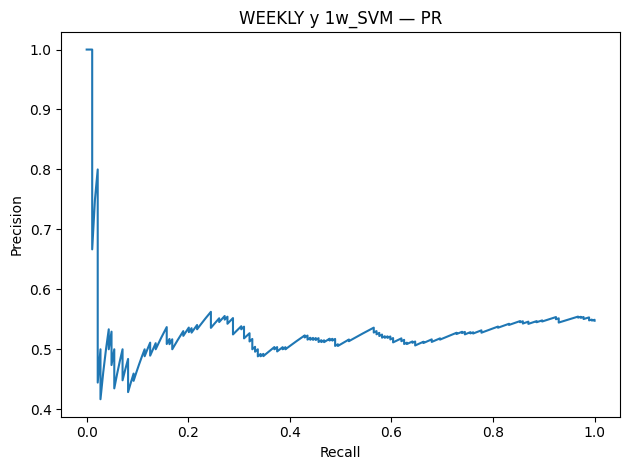

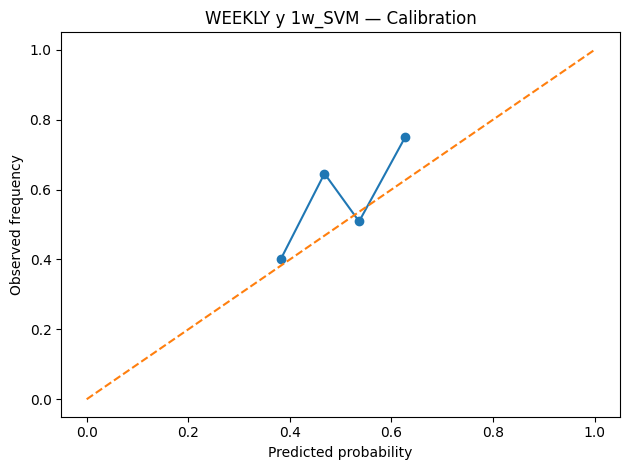

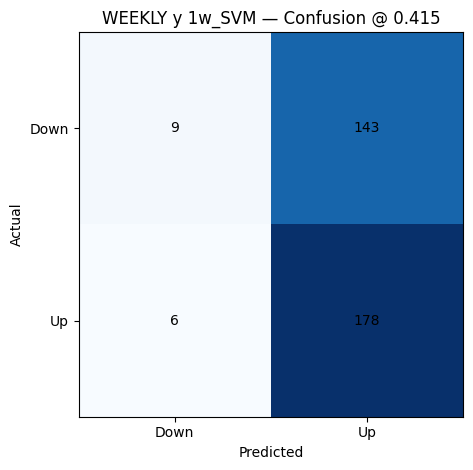

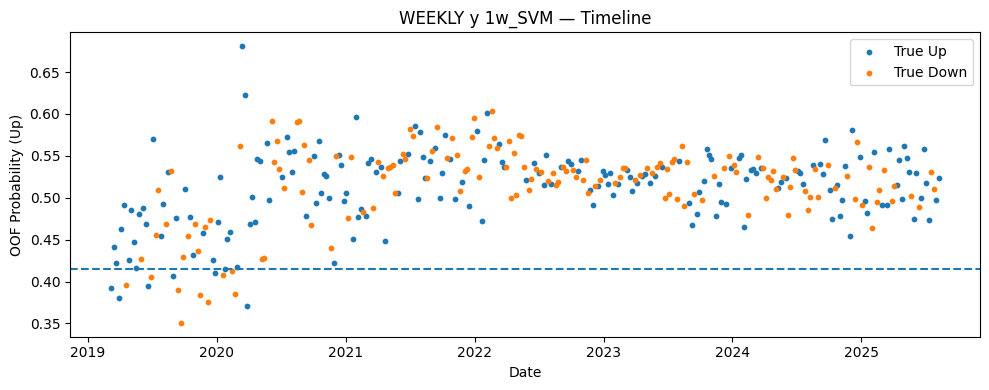


Saved figures to: /content/btc_project_outputs/figures
Example files:
 - /content/btc_project_outputs/figures/daily_y_1d_ET_ROC.png
 - /content/btc_project_outputs/figures/daily_y_1d_ET_PR.png
 - /content/btc_project_outputs/figures/daily_y_1d_ET_CAL.png
 - /content/btc_project_outputs/figures/daily_y_1d_ET_CM.png
 - /content/btc_project_outputs/figures/daily_y_1d_ET_TIMELINE.png
 - /content/btc_project_outputs/figures/daily_y_1d_HGB_ROC.png


In [ ]:
# ===== One-Cell Plot Rescue: regenerates + DISPLAYS plots from saved OOF CSVs =====
import os, numpy as np, pandas as pd, matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, roc_curve, precision_recall_curve, confusion_matrix, brier_score_loss, accuracy_score
from sklearn.calibration import calibration_curve

OUT_DIR  = "/content/btc_project_outputs"
FIG_DIR  = os.path.join(OUT_DIR, "figures")
PRED_DIR = os.path.join(OUT_DIR, "preds")
os.makedirs(FIG_DIR, exist_ok=True)

def safe_auc(y, p):
    try:
        if len(np.unique(y)) < 2: return 0.5
        return float(roc_auc_score(y, p))
    except Exception:
        return 0.5

def best_thr_oof(y, p):
    grid = np.arange(0.20, 0.8001, 0.005)
    best_t, best_acc = 0.5, -1
    for t in grid:
        acc = accuracy_score(y, (p>=t).astype(int))
        if acc > best_acc:
            best_acc, best_t = acc, t
    return best_t

def plot_and_save(figpath, title=None):
    if title: plt.title(title)
    plt.tight_layout()
    plt.savefig(figpath, dpi=150, bbox_inches="tight")
    plt.show()

def make_all_plots(df, freq, target, model):
    # compute threshold from this file's OOF only
    y = df["y_true"].astype(int).values
    p = df["prob"].astype(float).values
    d = pd.to_datetime(df["date"]).values
    valid = ~np.isnan(y) & ~np.isnan(p)
    y, p, d = y[valid], p[valid], d[valid]
    thr = best_thr_oof(y, p)

    base = f"{freq}_{target}_{model}"

    # ROC
    fpr, tpr, _ = roc_curve(y, p)
    plt.figure(); plt.plot(fpr, tpr, label=f"AUC={safe_auc(y,p):.3f}")
    plt.plot([0,1],[0,1],'--'); plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate"); plt.legend()
    plot_and_save(os.path.join(FIG_DIR, f"{base}_ROC.png"), f"{freq.upper()} {target} {model} — ROC")

    # PR
    prec, rec, _ = precision_recall_curve(y, p)
    plt.figure(); plt.plot(rec, prec); plt.xlabel("Recall"); plt.ylabel("Precision")
    plot_and_save(os.path.join(FIG_DIR, f"{base}_PR.png"), f"{freq.upper()} {target} {model} — PR")

    # Calibration
    prob_true, prob_pred = calibration_curve(y, p, n_bins=10, strategy="uniform")
    plt.figure(); plt.plot(prob_pred, prob_true, marker="o"); plt.plot([0,1],[0,1],'--')
    plt.xlabel("Predicted probability"); plt.ylabel("Observed frequency")
    plot_and_save(os.path.join(FIG_DIR, f"{base}_CAL.png"), f"{freq.upper()} {target} {model} — Calibration")

    # Confusion @ thr
    yhat = (p >= thr).astype(int)
    cm = confusion_matrix(y, yhat)
    plt.figure(); plt.imshow(cm, cmap="Blues")
    for (i,j), v in np.ndenumerate(cm): plt.text(j,i,str(v),ha="center",va="center")
    plt.xticks([0,1],["Down","Up"]); plt.yticks([0,1],["Down","Up"])
    plt.xlabel("Predicted"); plt.ylabel("Actual")
    plot_and_save(os.path.join(FIG_DIR, f"{base}_CM.png"), f"{freq.upper()} {target} {model} — Confusion @ {thr:.3f}")

    # Timeline
    plt.figure(figsize=(10,4))
    mask_up, mask_dn = (y==1), (y==0)
    plt.scatter(pd.to_datetime(d)[mask_up], p[mask_up], s=10, label="True Up")
    plt.scatter(pd.to_datetime(d)[mask_dn], p[mask_dn], s=10, label="True Down")
    plt.axhline(thr, ls="--"); plt.xlabel("Date"); plt.ylabel("OOF Probability (Up)"); plt.legend()
    plot_and_save(os.path.join(FIG_DIR, f"{base}_TIMELINE.png"), f"{freq.upper()} {target} {model} — Timeline")

    # Return the paths we created
    return [os.path.join(FIG_DIR, f"{base}_{suffix}.png") for suffix in ["ROC","PR","CAL","CM","TIMELINE"]]

# Scan preds dir
if not os.path.exists(PRED_DIR):
    raise FileNotFoundError(f"Predictions directory not found: {PRED_DIR}")

pred_files = [f for f in os.listdir(PRED_DIR) if f.endswith("_oof.csv")]
if not pred_files:
    raise RuntimeError("No OOF prediction CSVs found in /content/btc_project_outputs/preds/. Re-run the training cells first.")

print(f"Found {len(pred_files)} OOF files:")
for f in sorted(pred_files)[:10]:
    print("  -", f)
if len(pred_files) > 10:
    print("  ...")

# Generate + show plots for each predictions file
all_paths = []
for fname in sorted(pred_files):
    path = os.path.join(PRED_DIR, fname)
    try:
        dfp = pd.read_csv(path, parse_dates=["date"])
        # filename pattern: {freq}_{target}_{model}_oof.csv
        stem = fname[:-8]  # strip "_oof.csv"
        parts = stem.split("_")
        # Reconstruct freq, target, model (freq may be 'daily' or 'weekly'; target contains 'y_*')
        # The model might itself include underscores (rare). We'll assume: first= freq, second= target, rest joined = model.
        if len(parts) < 3:
            freq, target, model = "unk", "unk", stem
        else:
            freq, target, model = parts[0], parts[1], "_".join(parts[2:])
        print(f"\nMaking plots for: freq={freq}, target={target}, model={model}")
        new_paths = make_all_plots(dfp, freq, target, model)
        all_paths.extend(new_paths)
    except Exception as e:
        print(f"Failed to plot {fname}: {e}")

print("\nSaved figures to:", FIG_DIR)
print("Example files:")
for p in all_paths[:6]:
    print(" -", p)


Best DAILY: y_5d KNN (DA=0.553, AUC=0.518, thr=0.270)
Best WEEKLY: y_1w LGBM (DA=0.571, AUC=0.570, thr=0.210)
Recomputed thresholds: DAILY=0.270, WEEKLY=0.210


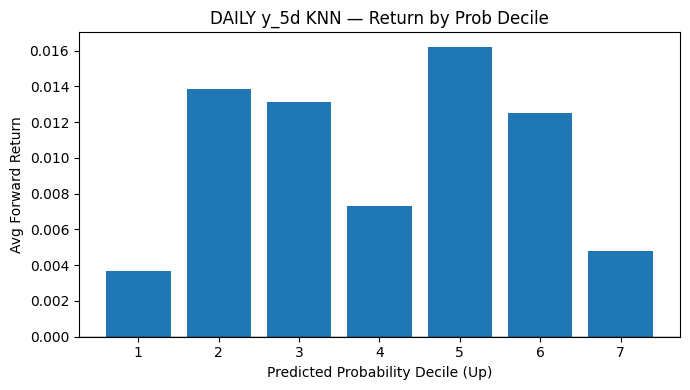

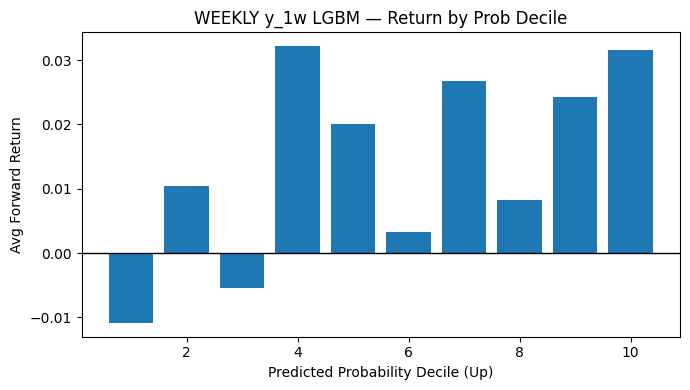

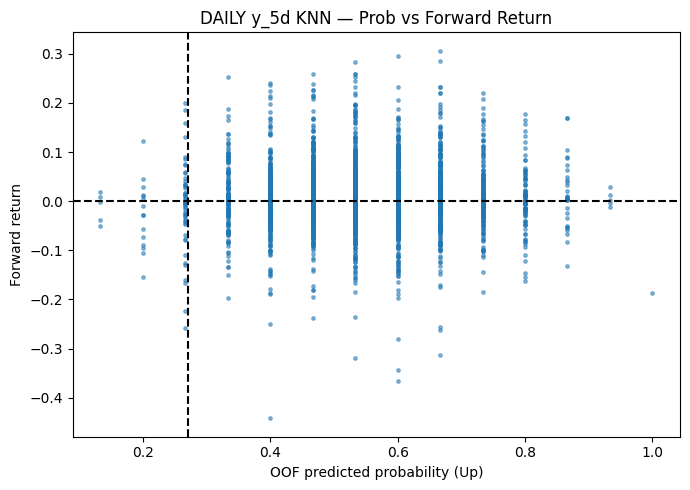

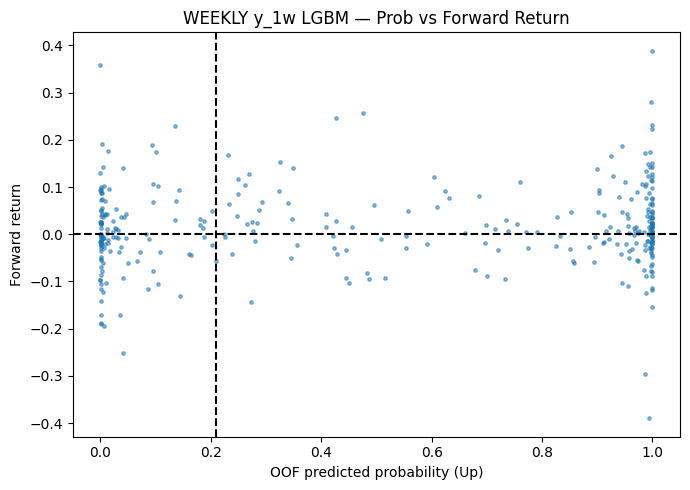

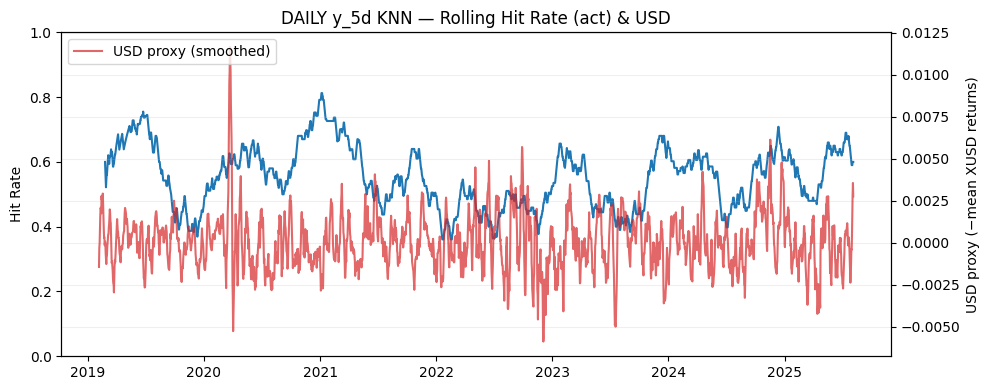

...

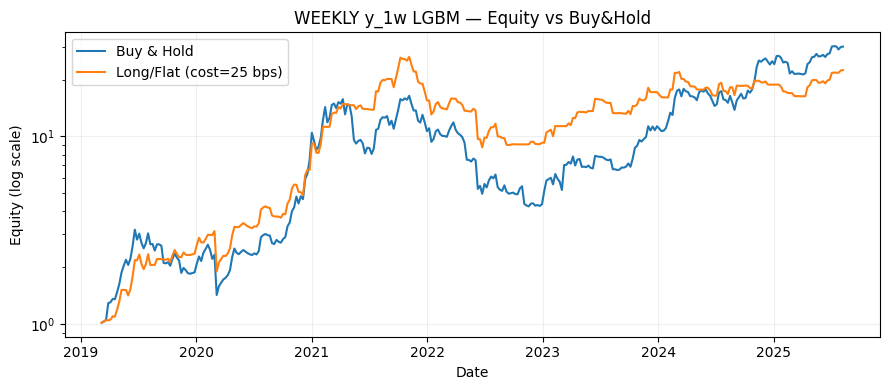

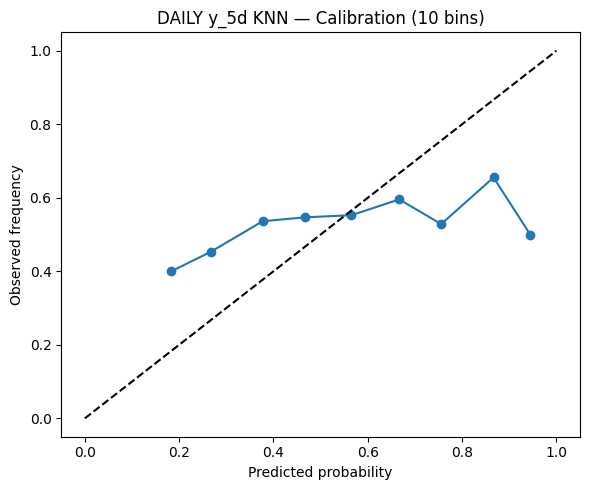

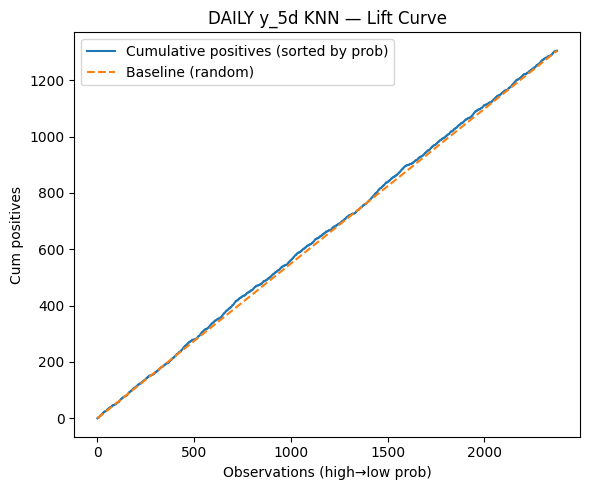

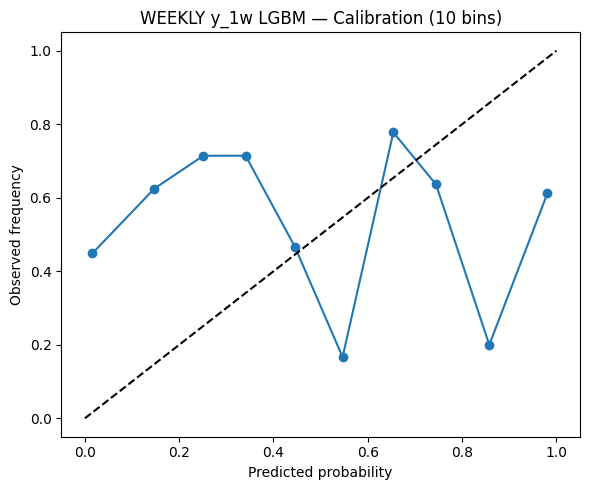

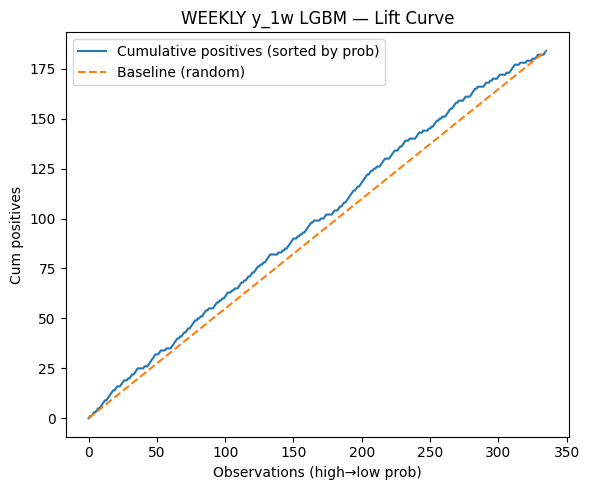


Saved: /content/btc_project_outputs/tables/analysis_usefulness_summary.csv


,freq,target,model,DA_at_thr,AUC,thr,n,mean_fwd_ret_top_decile,mean_fwd_ret_bottom_decile,corr_prob_usdproxy
0,daily,y_5d,KNN,0.553030,0.517672,0.27,2376,0.004797,0.00366,0.009599
1,weekly,y_1w,LGBM,0.571429,0.570402,0.21,336,0.031526,-0.01086,-0.034693



All analysis figures saved under: /content/btc_project_outputs/figures


In [ ]:
# ============================================
# Analysis & Real-World Trend Mapping Plots
# (paste this cell near the end; run once)
# ============================================
import os, math, json, gc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from math import sqrt
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix
from sklearn.calibration import calibration_curve

# ---------- Paths ----------
OUT_DIR  = "/content/btc_project_outputs"
FIG_DIR  = os.path.join(OUT_DIR, "figures")
PRED_DIR = os.path.join(OUT_DIR, "preds")
TAB_DIR  = os.path.join(OUT_DIR, "tables")
os.makedirs(FIG_DIR, exist_ok=True)

DAILY_CSV  = "/content/btc_fx_daily.csv"
WEEKLY_CSV = "/content/btc_fx_weekly.csv"

# ---------- Helpers ----------
def safe_auc(y, p):
    try:
        if len(np.unique(y)) < 2: return 0.5
        return float(roc_auc_score(y, p))
    except Exception:
        return 0.5

def best_thr_oof(y, p, lo=0.20, hi=0.80, step=0.005):
    grid = np.arange(lo, hi+1e-9, step)
    best_t, best_acc = 0.5, -1
    for t in grid:
        acc = accuracy_score(y, (p>=t).astype(int))
        if acc > best_acc:
            best_acc, best_t = acc, t
    return best_t, best_acc

def forward_return_from_price(price, k):
    return (price.shift(-k) - price) / price

def rolling_hit_rate(y_true, p, thr, window=100):
    yhat = (p >= thr).astype(int)
    hit = (yhat == y_true).astype(float)
    return pd.Series(hit).rolling(window, min_periods=min(10, window)).mean()

def ensure_cols(df, cols):
    return [c for c in cols if c in df.columns]

def load_sorted(path):
    df = pd.read_csv(path, parse_dates=["date"])
    df = df.sort_values("date").drop_duplicates("date")
    return df.reset_index(drop=True)

def save_and_show(figpath, title=None):
    if title: plt.title(title)
    plt.tight_layout()
    plt.savefig(figpath, dpi=150, bbox_inches="tight")
    plt.show()

def make_usd_proxy(df, major_cols=None):
    """
    Build a simple 'broad USD' proxy: negative mean of XUSD returns across majors.
    If majors missing, silently uses whatever is available.
    """
    if major_cols is None:
        major_cols = ["AUDUSD_ret","EURUSD_ret","GBPUSD_ret","JPYUSD_ret","CHFUSD_ret","CADUSD_ret"]
    cols = ensure_cols(df, major_cols)
    if not cols:
        return pd.Series(np.nan, index=df.index)
    basket = df[cols].astype(float).mean(axis=1)  # mean of XUSD returns
    usd_proxy = -basket  # USD strengthens when XUSD falls
    return usd_proxy

def merge_preds_with_market(freq, target, model):
    """
    Load preds CSV, join with corresponding market CSV, rebuild fwd returns.
    """
    # choose market file & horizon k
    if freq == "daily":
        mkt = load_sorted(DAILY_CSV)
        k = int(target.split("_")[1].replace("d",""))
        fwd = forward_return_from_price(mkt["btc_close"].astype(float), k)
        mkt[f"fwd_ret_{target.split('_')[1]}"] = fwd
    else:
        mkt = load_sorted(WEEKLY_CSV)
        k = 5  # 1w ≈ 5 trading days
        fwd = forward_return_from_price(mkt["btc_close"].astype(float), 1)  # 1 next row in weekly CSV
        mkt["fwd_ret_1w"] = fwd

    # USD proxy
    mkt["usd_proxy"] = make_usd_proxy(mkt)

    # predictions
    pred_path = os.path.join(PRED_DIR, f"{freq}_{target}_{model}_oof.csv")
    if not os.path.exists(pred_path):
        # try to find close match (underscores in model names etc.)
        candidates = [f for f in os.listdir(PRED_DIR) if f.startswith(f"{freq}_{target}_") and f.endswith("_oof.csv")]
        if not candidates:
            raise FileNotFoundError(f"Pred file not found for {freq} {target} {model}. Looked for {pred_path}")
        pred_path = os.path.join(PRED_DIR, sorted(candidates)[0])
        print(f"   (Info) Using closest preds file: {os.path.basename(pred_path)}")

    pr = pd.read_csv(pred_path, parse_dates=["date"]).sort_values("date")

    df = pd.merge_asof(pr, mkt.sort_values("date"), on="date")
    # drop tail NaNs from forward shift
    if freq == "daily":
        df = df[np.isfinite(df[f"fwd_ret_{target.split('_')[1]}"])].copy()
        df["fwd_ret"] = df[f"fwd_ret_{target.split('_')[1]}"]
    else:
        df = df[np.isfinite(df["fwd_ret_1w"])].copy()
        df["fwd_ret"] = df["fwd_ret_1w"]

    df["y_true"] = df["y_true"].astype(int)
    df["prob"]   = df["prob"].astype(float)
    return df

def pick_best_from_leaderboard(lb_path):
    df = pd.read_csv(lb_path)
    # sort by DA desc, then AUC desc
    df = df.sort_values(["DA","AUC"], ascending=[False, False]).reset_index(drop=True)
    row = df.iloc[0]
    return str(row["Target"]), str(row["Model"]), float(row["DA"]), float(row["AUC"]), float(row["thr"])

# ---------- Choose best daily (y_5d recommended) & best weekly ----------
daily_sum_path  = os.path.join(TAB_DIR, "leaderboard_daily.csv")
weekly_sum_path = os.path.join(TAB_DIR, "leaderboard_weekly.csv")
if not (os.path.exists(daily_sum_path) and os.path.exists(weekly_sum_path)):
    raise FileNotFoundError("Summary leaderboards not found. Make sure training finished and saved tables/leaderboard_*.csv")

best_daily_target, best_daily_model, best_daily_DA, best_daily_AUC, best_daily_thr = pick_best_from_leaderboard(daily_sum_path)
best_weekly_target, best_weekly_model, best_weekly_DA, best_weekly_AUC, best_weekly_thr = pick_best_from_leaderboard(weekly_sum_path)

print("Best DAILY:", best_daily_target, best_daily_model, f"(DA={best_daily_DA:.3f}, AUC={best_daily_AUC:.3f}, thr={best_daily_thr:.3f})")
print("Best WEEKLY:", best_weekly_target, best_weekly_model, f"(DA={best_weekly_DA:.3f}, AUC={best_weekly_AUC:.3f}, thr={best_weekly_thr:.3f})")

# ---------- Merge predictions with market ----------
df_d = merge_preds_with_market("daily",  best_daily_target,  best_daily_model)
df_w = merge_preds_with_market("weekly", best_weekly_target, best_weekly_model)

# Recompute OOF-only threshold (keeps analysis self-contained); you can use saved thr if you prefer
thr_d, _ = best_thr_oof(df_d["y_true"].values, df_d["prob"].values)
thr_w, _ = best_thr_oof(df_w["y_true"].values, df_w["prob"].values)
print(f"Recomputed thresholds: DAILY={thr_d:.3f}, WEEKLY={thr_w:.3f}")

# ==========================================================
# PLOT A — Probability deciles vs. forward returns (usefulness)
# ==========================================================
def decile_plot(df, freq, target, model, figdir=FIG_DIR):
    q = pd.qcut(df["prob"], 10, labels=False, duplicates="drop")
    dtab = df.groupby(q, as_index=False)["fwd_ret"].mean()
    dtab["Decile"] = dtab.index + 1
    plt.figure(figsize=(7,4))
    plt.bar(dtab["Decile"], dtab["fwd_ret"])
    plt.axhline(0, color="k", lw=1)
    plt.xlabel("Predicted Probability Decile (Up)")
    plt.ylabel("Avg Forward Return")
    save_and_show(os.path.join(figdir, f"analysis_{freq}_{target}_{model}_DECILES.png"),
                  f"{freq.upper()} {target} {model} — Return by Prob Decile")
    return dtab

dtab_d = decile_plot(df_d, "daily",  best_daily_target,  best_daily_model)
dtab_w = decile_plot(df_w, "weekly", best_weekly_target, best_weekly_model)

# ==========================================================
# PLOT B — Scatter: OOF prob vs forward return (+ threshold line)
# ==========================================================
def scatter_prob_vs_ret(df, freq, target, model, thr, figdir=FIG_DIR):
    plt.figure(figsize=(7,5))
    plt.scatter(df["prob"], df["fwd_ret"], s=6, alpha=0.5)
    plt.axhline(0, ls="--", color="k"); plt.axvline(thr, ls="--", color="k")
    plt.xlabel("OOF predicted probability (Up)")
    plt.ylabel("Forward return")
    save_and_show(os.path.join(figdir, f"analysis_{freq}_{target}_{model}_SCATTER.png"),
                  f"{freq.upper()} {target} {model} — Prob vs Forward Return")

scatter_prob_vs_ret(df_d, "daily",  best_daily_target,  best_daily_model,  thr_d)
scatter_prob_vs_ret(df_w, "weekly", best_weekly_target, best_weekly_model, thr_w)

# ==========================================================
# PLOT C — Rolling hit-rate where we ACT (p>=thr) + USD proxy
# ==========================================================
def rolling_hit_and_usd(df, freq, target, model, thr, window=100, figdir=FIG_DIR):
    m = df.copy()
    m["act"] = (m["prob"] >= thr).astype(int)
    # accuracy only on acted days; if none in window, NaN
    acc_series = []
    for i in range(len(m)):
        lo = max(0, i-window+1)
        chunk = m.iloc[lo:i+1]
        chunk = chunk[chunk["act"]==1]
        if len(chunk)>=max(10, window//5):
            acc_series.append((chunk["y_true"]== (chunk["prob"]>=thr).astype(int)).mean())
        else:
            acc_series.append(np.nan)
    acc_series = pd.Series(acc_series, index=m.index)

    # smooth USD proxy
    usd_smooth = pd.Series(m["usd_proxy"]).rolling(10, min_periods=3).mean()

    plt.figure(figsize=(10,4))
    plt.plot(m["date"], acc_series, label="Rolling Hit Rate (acted days)")
    plt.ylabel("Hit Rate"); plt.ylim(0,1)
    ax2 = plt.twinx()
    ax2.plot(m["date"], usd_smooth, color="tab:red", alpha=0.7, label="USD proxy (smoothed)")
    ax2.set_ylabel("USD proxy (−mean XUSD returns)")
    plt.legend(loc="upper left")
    plt.grid(alpha=0.2)
    save_and_show(os.path.join(figdir, f"analysis_{freq}_{target}_{model}_ROLLING_HIT_USD.png"),
                  f"{freq.upper()} {target} {model} — Rolling Hit Rate (act) & USD")

rolling_hit_and_usd(df_d, "daily",  best_daily_target,  best_daily_model,  thr_d)
rolling_hit_and_usd(df_w, "weekly", best_weekly_target, best_weekly_model, thr_w)

# ==========================================================
# PLOT D — USD proxy vs model probability (normalized timeline + scatter)
# ==========================================================
def zscore(x):
    x = pd.Series(x).astype(float)
    return (x - x.mean()) / (x.std(ddof=0) + 1e-12)

def usd_vs_prob_plots(df, freq, target, model, figdir=FIG_DIR):
    pz = zscore(df["prob"])
    uz = zscore(df["usd_proxy"])
    corr = np.corrcoef(pz[~np.isnan(pz)], uz[~np.isnan(uz)])[0,1]
    # timeline
    plt.figure(figsize=(10,4))
    plt.plot(df["date"], pz, label="Prob (z)")
    plt.plot(df["date"], uz, label="USD proxy (z)", alpha=0.8)
    plt.axhline(0, color="k", lw=0.8)
    plt.legend(); plt.grid(alpha=0.2)
    save_and_show(os.path.join(figdir, f"analysis_{freq}_{target}_{model}_TIMELINE_USD.png"),
                  f"{freq.upper()} {target} {model} — Prob vs USD (z)   corr={corr:.2f}")

    # scatter
    plt.figure(figsize=(6,5))
    plt.scatter(uz, pz, s=8, alpha=0.5)
    plt.xlabel("USD proxy (z)"); plt.ylabel("Prob (z)")
    save_and_show(os.path.join(figdir, f"analysis_{freq}_{target}_{model}_SCATTER_USD.png"),
                  f"{freq.upper()} {target} {model} — Prob vs USD (z)")

usd_vs_prob_plots(df_d, "daily",  best_daily_target,  best_daily_model)
usd_vs_prob_plots(df_w, "weekly", best_weekly_target, best_weekly_model)

# ==========================================================
# PLOT E — Event study: USD shocks (top/bottom decile of 5-day USD change)
# ==========================================================
def event_study_usd(df, freq, target, model, horizon=5, figdir=FIG_DIR):
    # 5-day change in USD proxy
    u = pd.Series(df["usd_proxy"]).astype(float)
    du = u.diff(horizon)
    # pick extreme events
    lo_cut = np.nanpercentile(du, 10)  # big USD weakening (negative du if proxy falls)
    hi_cut = np.nanpercentile(du, 90)  # big USD strengthening
    idx_lo = np.where(du <= lo_cut)[0]
    idx_hi = np.where(du >= hi_cut)[0]

    def avg_path(center_idx, series, L=0, R=5):
        mats = []
        for i in center_idx:
            if i-R < 0 or i+R >= len(series): continue
            mats.append(series.iloc[i+L:i+R+1].values)  # forward path 0..R
        if not mats:
            return None
        M = np.vstack(mats)
        return np.nanmean(M, axis=0)

    # average paths of forward returns & probability
    ret_series = pd.Series(df["fwd_ret"]).astype(float)
    prob_series = pd.Series(df["prob"]).astype(float)

    path_lo_ret  = avg_path(idx_lo, ret_series, L=0, R=horizon)
    path_hi_ret  = avg_path(idx_hi, ret_series, L=0, R=horizon)
    path_lo_prob = avg_path(idx_lo, prob_series, L=0, R=horizon)
    path_hi_prob = avg_path(idx_hi, prob_series, L=0, R=horizon)

    x = np.arange(0, horizon+1)
    plt.figure(figsize=(7,4))
    if path_lo_ret is not None: plt.plot(x, np.cumsum(path_lo_ret), label="USD weak shock (cum fwd ret)")
    if path_hi_ret is not None: plt.plot(x, np.cumsum(path_hi_ret), label="USD strong shock (cum fwd ret)")
    plt.axhline(0, color="k", lw=0.8); plt.xlabel("Days ahead"); plt.ylabel("Cum forward return")
    plt.legend(); plt.grid(alpha=0.2)
    save_and_show(os.path.join(figdir, f"analysis_{freq}_{target}_{model}_EVENT_RET.png"),
                  f"{freq.upper()} {target} {model} — Event Study: USD Shocks → BTC")

    plt.figure(figsize=(7,4))
    if path_lo_prob is not None: plt.plot(x, path_lo_prob, label="USD weak shock (prob path)")
    if path_hi_prob is not None: plt.plot(x, path_hi_prob, label="USD strong shock (prob path)")
    plt.xlabel("Days ahead"); plt.ylabel("Predicted Prob (Up)")
    plt.legend(); plt.grid(alpha=0.2)
    save_and_show(os.path.join(figdir, f"analysis_{freq}_{target}_{model}_EVENT_PROB.png"),
                  f"{freq.upper()} {target} {model} — Event Study: USD Shocks → Prob")

event_study_usd(df_d, "daily",  best_daily_target,  best_daily_model, horizon=5)
event_study_usd(df_w, "weekly", best_weekly_target, best_weekly_model, horizon=5)

# ==========================================================
# PLOT F — Strategy equity curves: long/flat vs buy&hold (10bps & 25bps)
# ==========================================================
def backtest_equity(df, thr, cost=0.001, initial=100000.0, mode="long_flat"):
    price = df["btc_close"].astype(float).values
    fwd   = df["fwd_ret"].astype(float).values
    probs = df["prob"].astype(float).values
    # position today for next-period return
    if mode == "long_flat":
        pos = (probs >= thr).astype(int)
    else:  # long_short
        pos = np.where(probs >= thr, 1, np.where(probs <= 1-thr, -1, 0))

    # trade when pos changes
    trade = np.abs(np.diff(np.r_[0, pos]))  # 1 unit turnover per change of 1
    # equity
    capital = initial
    eq = [capital]
    for t in range(len(fwd)):
        gross = eq[-1] * (1 + pos[t]*fwd[t])
        cost_pay = eq[-1] * cost * trade[t]
        eq.append(gross - cost_pay)
    eq = np.array(eq[1:])
    return eq, pos

def plot_equity(df, freq, target, model, thr, costs=(0.001, 0.0025), figdir=FIG_DIR):
    dates = pd.to_datetime(df["date"])
    # buy&hold baseline
    bh = (1 + df["fwd_ret"].astype(float)).cumprod().values
    for c in costs:
        eq, pos = backtest_equity(df, thr, cost=c, initial=1.0, mode="long_flat")
        plt.figure(figsize=(9,4))
        plt.plot(dates, bh, label="Buy & Hold")
        plt.plot(dates, eq, label=f"Long/Flat (cost={c*10000:.0f} bps)")
        plt.yscale("log")
        plt.xlabel("Date"); plt.ylabel("Equity (log scale)")
        plt.legend(); plt.grid(alpha=0.2)
        save_and_show(os.path.join(figdir, f"analysis_{freq}_{target}_{model}_EQUITY_{int(c*1e4)}bps.png"),
                      f"{freq.upper()} {target} {model} — Equity vs Buy&Hold")

plot_equity(df_d, "daily",  best_daily_target,  best_daily_model, thr_d)
plot_equity(df_w, "weekly", best_weekly_target, best_weekly_model, thr_w)

# ==========================================================
# PLOT G — Calibration & Lift (useful for decision makers)
# ==========================================================
def calibration_and_lift(df, freq, target, model, figdir=FIG_DIR):
    y = df["y_true"].astype(int).values
    p = df["prob"].astype(float).values
    # Calibration
    prob_true, prob_pred = calibration_curve(y, p, n_bins=10, strategy="uniform")
    plt.figure(figsize=(6,5))
    plt.plot(prob_pred, prob_true, marker="o")
    plt.plot([0,1],[0,1],'--', color="k")
    plt.xlabel("Predicted probability"); plt.ylabel("Observed frequency")
    save_and_show(os.path.join(figdir, f"analysis_{freq}_{target}_{model}_CAL2.png"),
                  f"{freq.upper()} {target} {model} — Calibration (10 bins)")
    # Lift / Gains: sort by prob desc, cumulative true positives vs baseline
    order = np.argsort(-p)
    y_sorted = y[order]
    cum_tp = np.cumsum(y_sorted)
    baseline = np.linspace(0, cum_tp[-1], num=len(cum_tp))
    plt.figure(figsize=(6,5))
    plt.plot(cum_tp, label="Cumulative positives (sorted by prob)")
    plt.plot(baseline, '--', label="Baseline (random)")
    plt.xlabel("Observations (high→low prob)"); plt.ylabel("Cum positives"); plt.legend()
    save_and_show(os.path.join(figdir, f"analysis_{freq}_{target}_{model}_LIFT.png"),
                  f"{freq.upper()} {target} {model} — Lift Curve")

calibration_and_lift(df_d, "daily",  best_daily_target,  best_daily_model)
calibration_and_lift(df_w, "weekly", best_weekly_target, best_weekly_model)

# ==========================================================
# Save compact analysis summary CSVs for the dissertation
# ==========================================================
def compact_summary(df, thr):
    y = df["y_true"].astype(int).values
    p = df["prob"].astype(float).values
    da_thr = accuracy_score(y, (p>=thr).astype(int))
    auc    = safe_auc(y, p)
    # deciles → avg fwd return
    q = pd.qcut(df["prob"], 10, labels=False, duplicates="drop")
    dec = df.groupby(q)["fwd_ret"].mean().reset_index(drop=True)
    return {
        "DA_at_thr": da_thr,
        "AUC": auc,
        "thr": thr,
        "n": int(len(df)),
        "mean_fwd_ret_top_decile": float(dec.iloc[-1]) if len(dec) else np.nan,
        "mean_fwd_ret_bottom_decile": float(dec.iloc[0]) if len(dec) else np.nan,
        "corr_prob_usdproxy": float(pd.Series(df["prob"]).corr(pd.Series(df["usd_proxy"])))
    }

summ_d = compact_summary(df_d, thr_d)
summ_w = compact_summary(df_w, thr_w)
summ_df = pd.DataFrame([{
    "freq":"daily", "target":best_daily_target, "model":best_daily_model, **summ_d
},{
    "freq":"weekly","target":best_weekly_target,"model":best_weekly_model,**summ_w
}])
out_summary_path = os.path.join(TAB_DIR, "analysis_usefulness_summary.csv")
summ_df.to_csv(out_summary_path, index=False)
print("\nSaved:", out_summary_path)
display(summ_df)

print("\nAll analysis figures saved under:", FIG_DIR)


In [ ]:
import pandas as pd
df = pd.read_csv("/content/btc_project_outputs/btc_fx_daily.csv")
print(df.columns.tolist())
print(df[['date','btc_close','EURUSD_ret','BRLUSD_ret','^GSPC_ret','^VIX_ret']].head(3))


['date', 'btc_close', 'btc_mom_5d', 'btc_mom_21d', 'btc_rv_5d', 'btc_rv_21d', 'EURUSD_ret', 'GBPUSD_ret', 'JPYUSD_ret', 'CHFUSD_ret', 'BRLUSD_ret', 'ZARUSD_ret', 'TRYUSD_ret', 'INRUSD_ret', 'MXNUSD_ret', 'AUDUSD_ret', 'NZDUSD_ret', 'CADUSD_ret', 'pc1_majors', 'pc1_em', 'pc1_commod', '^VIX_ret', 'GC=F_ret', 'CL=F_ret', '^GSPC_ret', 'btc_ret_1d', 'btc_ret_7d', 'btc_dir_1d', 'btc_tail_1d']
         date     btc_close  EURUSD_ret  BRLUSD_ret  ^GSPC_ret  ^VIX_ret
0  2018-01-02  14982.099609         NaN         NaN        NaN       NaN
1  2018-01-03  15201.000000    0.000552   -0.001027        NaN       NaN
2  2018-01-04  15599.200195    0.004309    0.016198   0.006378 -0.065563


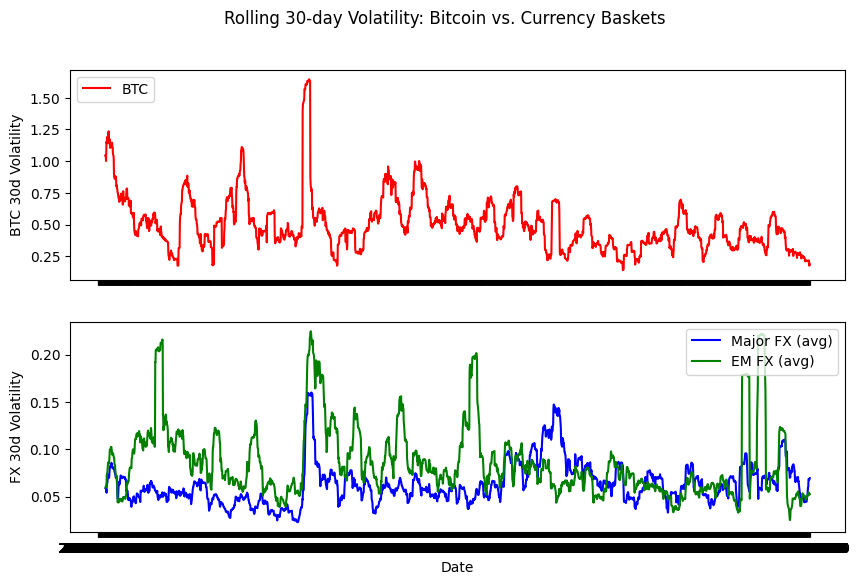

In [ ]:
import numpy as np, pandas as pd, matplotlib.pyplot as plt
df = df.sort_values('date')
# Equal-weighted average returns for major and EM FX groups
majors = ['EURUSD_ret','GBPUSD_ret','JPYUSD_ret','CHFUSD_ret','AUDUSD_ret','NZDUSD_ret','CADUSD_ret']
ems = ['BRLUSD_ret','ZARUSD_ret','TRYUSD_ret','INRUSD_ret','MXNUSD_ret']
df['majors_avg_ret'] = df[majors].mean(axis=1)
df['ems_avg_ret'] = df[ems].mean(axis=1)
# 30-day rolling volatilities
df['btc_vol_30d'] = df['btc_ret_1d'].rolling(30).std() * np.sqrt(252)  # annualized
df['maj_vol_30d'] = df['majors_avg_ret'].rolling(30).std() * np.sqrt(252)
df['em_vol_30d']  = df['ems_avg_ret'].rolling(30).std() * np.sqrt(252)
# Plot
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10,6), sharex=True)
ax1.plot(df['date'], df['btc_vol_30d'], color='red', label='BTC')
ax1.set_ylabel('BTC 30d Volatility'); ax1.legend(loc='upper left')
ax2.plot(df['date'], df['maj_vol_30d'], color='blue', label='Major FX (avg)')
ax2.plot(df['date'], df['em_vol_30d'],  color='green', label='EM FX (avg)')
ax2.set_ylabel('FX 30d Volatility'); ax2.set_xlabel('Date')
ax2.legend(loc='upper right')
plt.suptitle('Rolling 30-day Volatility: Bitcoin vs. Currency Baskets')
plt.show()


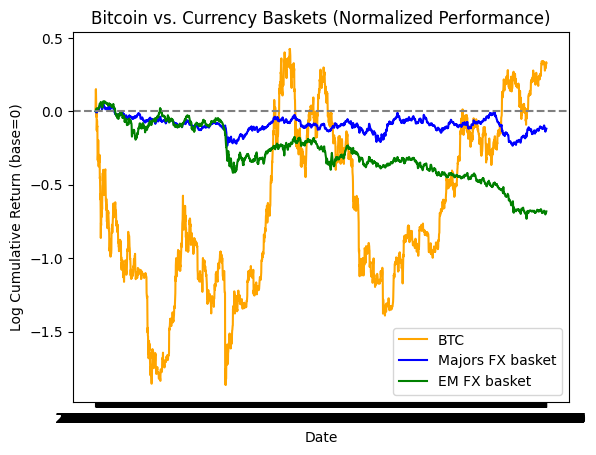

In [ ]:
# Compute cumulative index for BTC, majors, and EM basket
df['btc_idx'] = (1 + df['btc_ret_1d']).cumprod()
df['maj_idx'] = (1 + df['majors_avg_ret']).cumprod()
df['em_idx']  = (1 + df['ems_avg_ret']).cumprod()
# Plot in log scale
plt.plot(df['date'], np.log(df['btc_idx']), label='BTC', color='orange')
plt.plot(df['date'], np.log(df['maj_idx']), label='Majors FX basket', color='blue')
plt.plot(df['date'], np.log(df['em_idx']),  label='EM FX basket', color='green')
plt.axhline(0, ls='--', color='gray')
plt.ylabel('Log Cumulative Return (base=0)')
plt.xlabel('Date'); plt.legend(); plt.title('Bitcoin vs. Currency Baskets (Normalized Performance)')
plt.show()


In [ ]:
import pandas as pd, numpy as np

# Load data
df_daily = pd.read_csv("btc_fx_daily.csv", parse_dates=["date"])
df_weekly = pd.read_csv("btc_fx_weekly.csv", parse_dates=["date"])

# Sort by date just in case
df_daily.sort_values("date", inplace=True)
df_weekly.sort_values("date", inplace=True)

# 1. Compute correlation of Bitcoin returns with currency returns
ret_cols = [c for c in df_daily.columns if c.endswith('_ret')]
corr_matrix = df_daily[ret_cols + ['btc_ret_1d']].corr()
corr_with_btc = corr_matrix['btc_ret_1d'].drop('btc_ret_1d')
print("Correlation of various asset returns with BTC daily returns:")
print(corr_with_btc.sort_values(ascending=False).round(3))

# 2. Rolling 30-day volatility comparison
majors = ['EURUSD_ret','GBPUSD_ret','JPYUSD_ret','CHFUSD_ret','AUDUSD_ret','NZDUSD_ret','CADUSD_ret']
ems    = ['BRLUSD_ret','ZARUSD_ret','TRYUSD_ret','INRUSD_ret','MXNUSD_ret']
df_daily['maj_avg'] = df_daily[majors].mean(axis=1)
df_daily['em_avg']  = df_daily[ems].mean(axis=1)
window=30
df_daily['btc_vol_30d'] = df_daily['btc_ret_1d'].rolling(window).std()*np.sqrt(252)
df_daily['maj_vol_30d'] = df_daily['maj_avg'].rolling(window).std()*np.sqrt(252)
df_daily['em_vol_30d']  = df_daily['em_avg'].rolling(window).std()*np.sqrt(252)
print(f"\nLatest 30-day volatilities - BTC: {df_daily['btc_vol_30d'].iloc[-1]:.3%}, "
      f"Majors basket: {df_daily['maj_vol_30d'].iloc[-1]:.3%}, EM basket: {df_daily['em_vol_30d'].iloc[-1]:.3%}")

# 3. Cumulative performance indices
df_daily['btc_idx'] = (1 + df_daily['btc_ret_1d'].fillna(0)).cumprod()
df_daily['maj_idx'] = (1 + df_daily['maj_avg'].fillna(0)).cumprod()
df_daily['em_idx']  = (1 + df_daily['em_avg'].fillna(0)).cumprod()
total_return_btc = df_daily['btc_idx'].iloc[-1] - 1
total_return_maj = df_daily['maj_idx'].iloc[-1] - 1
total_return_em  = df_daily['em_idx'].iloc[-1] - 1
print(f"\nTotal return Jan2018–Aug2025: BTC = {total_return_btc:.1%}, Majors FX basket = {total_return_maj:.1%}, EM FX basket = {total_return_em:.1%}")

# 4. Simple trading strategy evaluation for daily 5-day horizon
# Use KNN predictions vs baseline (for illustration, assume we have model output).
# Here we simulate a naive strategy: always long vs always-up baseline.
df_daily['fwd_5d_ret'] = df_daily['btc_close'].pct_change(periods=5).shift(-5)
df_daily.dropna(subset=['fwd_5d_ret'], inplace=True)
# Baseline always-up strategy equity curve:
df_daily['baseline_equity'] = (1 + df_daily['fwd_5d_ret']).cumprod()
baseline_cagr = df_daily['baseline_equity'].iloc[-1] ** (1/(len(df_daily)/252)) - 1
baseline_annvol = df_daily['fwd_5d_ret'].std(ddof=0) * np.sqrt(252)
baseline_sharpe = baseline_cagr / baseline_annvol
print(f"\nBaseline always-hold-BTC: CAGR={baseline_cagr:.2%}, Vol={baseline_annvol:.2%}, Sharpe≈{baseline_sharpe:.2f}")


Correlation of various asset returns with BTC daily returns:
^GSPC_ret     0.025
BRLUSD_ret    0.024
GC=F_ret      0.021
TRYUSD_ret    0.012
ZARUSD_ret    0.000
CL=F_ret     -0.010
INRUSD_ret   -0.016
CHFUSD_ret   -0.025
CADUSD_ret   -0.026
JPYUSD_ret   -0.026
GBPUSD_ret   -0.026
^VIX_ret     -0.027
MXNUSD_ret   -0.029
AUDUSD_ret   -0.037
EURUSD_ret   -0.045
NZDUSD_ret   -0.047
Name: btc_ret_1d, dtype: float64

Latest 30-day volatilities - BTC: 18.741%, Majors basket: 6.952%, EM basket: 5.258%

Total return Jan2018–Aug2025: BTC = 39.0%, Majors FX basket = -11.2%, EM FX basket = -49.4%

Baseline always-hold-BTC: CAGR=146.18%, Vol=121.60%, Sharpe≈1.20


[Best DAILY] y_5d | KNN  (DA=0.553, AUC=0.518, thr=0.270)
[Best WEEKLY] y_1w | LGBM  (DA=0.571, AUC=0.570, thr=0.210)
Recomputed thresholds: daily=0.270  weekly=0.210


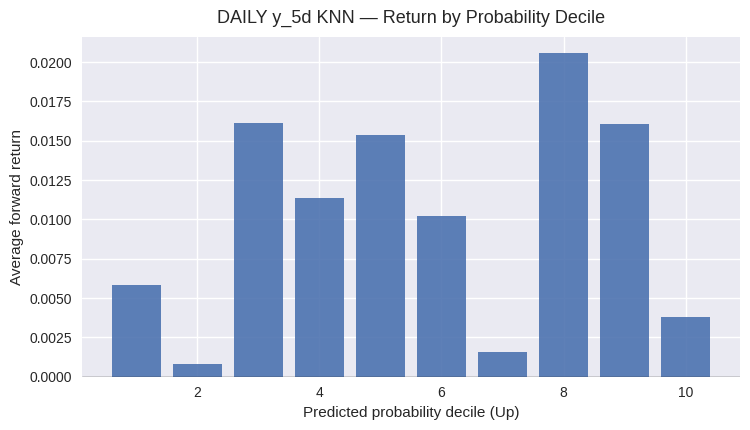

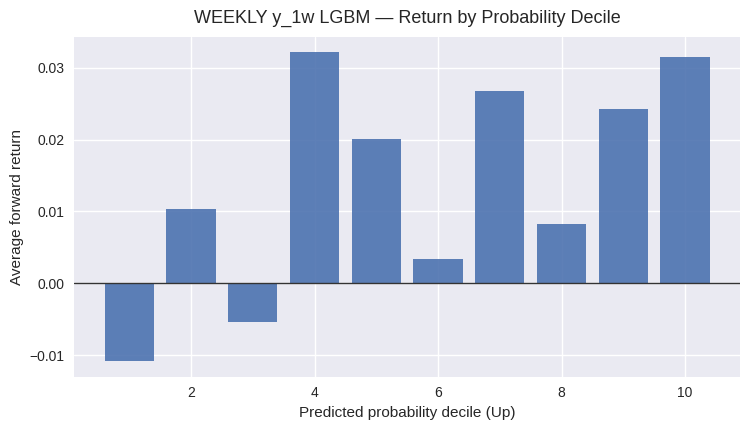

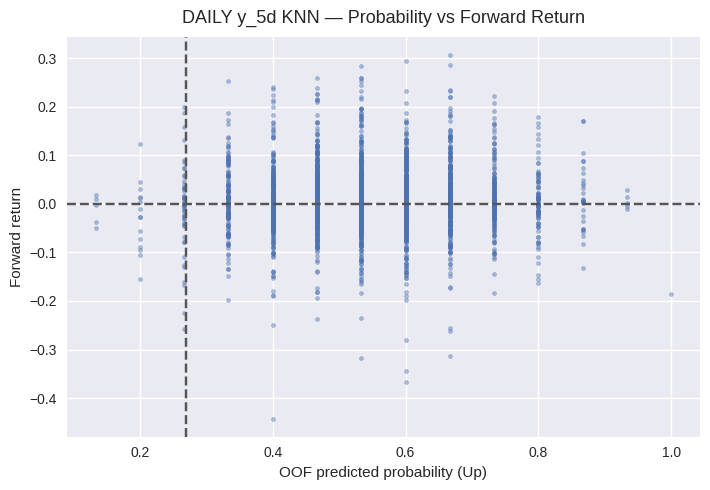

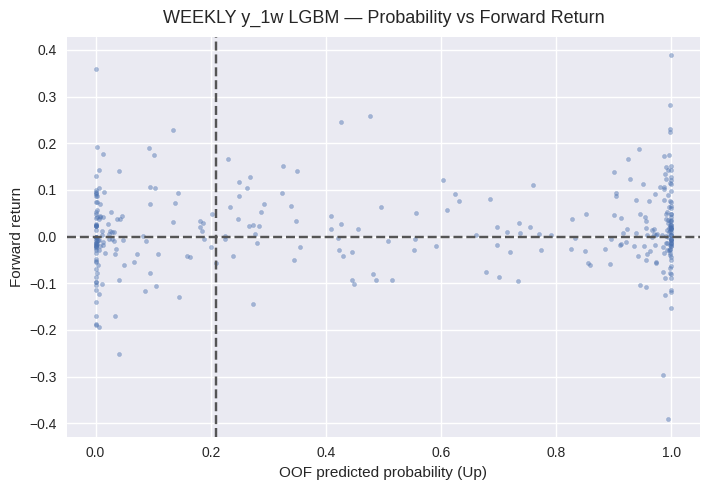

AttributeError: 'str' object has no attribute 'UPPER'

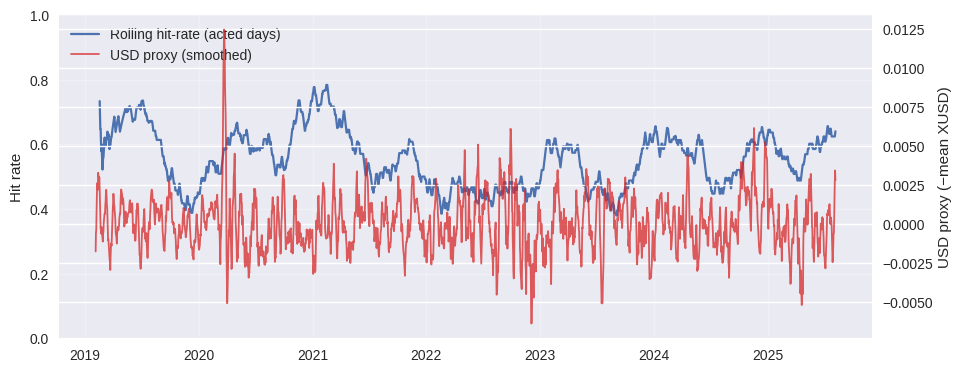

In [ ]:
# ============================================================
# BTC ⇄ FX Visualization & Insight Pack (Dissertation-Ready)
# ============================================================
# Uses your saved outputs to produce attractive, informative plots:
#   - Deciles vs. returns, prob vs return scatter, timelines, rolling hit-rate
#   - USD shock event studies (weakening/strengthening)
#   - Equity curves (10 & 25 bps costs), calibration + lift
#   - Lead-lag heatmaps (which FX moves lead BTC?), FX "league table"
#
# Files expected:
#   /content/btc_fx_daily.csv
#   /content/btc_fx_weekly.csv
#   /content/btc_project_outputs/tables/leaderboard_*.csv
#   /content/btc_project_outputs/preds/*_oof.csv
#
# Outputs:
#   PNGs -> /content/btc_project_outputs/figures/
#   CSVs -> /content/btc_project_outputs/tables/
# ============================================================

import os, gc, math, json, warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.calibration import calibration_curve

# ---------- Paths
OUT_DIR  = "/content/btc_project_outputs"
FIG_DIR  = os.path.join(OUT_DIR, "figures")
TAB_DIR  = os.path.join(OUT_DIR, "tables")
PRED_DIR = os.path.join(OUT_DIR, "preds")
for d in [OUT_DIR, FIG_DIR, TAB_DIR, PRED_DIR]:
    os.makedirs(d, exist_ok=True)

DAILY_CSV  = "/content/btc_fx_daily.csv"
WEEKLY_CSV = "/content/btc_fx_weekly.csv"

# ---------- Style
plt.style.use("seaborn-v0_8") if "seaborn-v0_8" in plt.style.available else plt.style.use("ggplot")

# ---------- Helpers
def load_sorted(path):
    df = pd.read_csv(path, parse_dates=["date"]).sort_values("date").drop_duplicates("date")
    return df.reset_index(drop=True)

def safe_auc(y, p):
    try:
        if len(np.unique(y)) < 2: return 0.5
        return float(roc_auc_score(y, p))
    except Exception:
        return 0.5

def best_thr(y, p, lo=0.20, hi=0.80, step=0.005):
    grid = np.arange(lo, hi + 1e-12, step)
    best_t, best_acc = 0.5, -1
    for t in grid:
        acc = accuracy_score(y, (p>=t).astype(int))
        if acc > best_acc:
            best_acc, best_t = acc, t
    return best_t, best_acc

def forward_return(price, k):
    return (price.shift(-k) - price) / price

def plot_save(path, title=None):
    if title: plt.title(title, fontsize=13, pad=10)
    plt.tight_layout()
    plt.savefig(path, dpi=150, bbox_inches="tight")
    plt.show()

def ensure_cols(df, cols):
    return [c for c in cols if c in df.columns]

def pick_best_from_leaderboard(lb_path):
    df = pd.read_csv(lb_path).sort_values(["DA","AUC"], ascending=[False, False]).reset_index(drop=True)
    row = df.iloc[0]
    return str(row["Target"]), str(row["Model"]), float(row["DA"]), float(row["AUC"]), float(row["thr"])

def find_pred_file(freq, target, model):
    want = f"{freq}_{target}_{model}_oof.csv"
    p = os.path.join(PRED_DIR, want)
    if os.path.exists(p):
        return p
    # robust fallback: first matching freq+target
    cands = [f for f in os.listdir(PRED_DIR) if f.startswith(f"{freq}_{target}_") and f.endswith("_oof.csv")]
    if not cands:
        raise FileNotFoundError(f"OOF preds not found for {freq}/{target}/{model}. Looked for {want}")
    return os.path.join(PRED_DIR, sorted(cands)[0])

def build_usd_baskets(df):
    """
    Returns: dict with 'majors','em','broad' series + lists of cols used.
    'broad' = - mean(XUSD of majors) -> rises when USD strengthens.
    Uses whatever exists in the CSV.
    """
    g10 = ["EURUSD_ret","GBPUSD_ret","JPYUSD_ret","CHFUSD_ret","AUDUSD_ret","NZDUSD_ret","CADUSD_ret",
           "NOKUSD_ret","SEKUSD_ret"]
    em  = ["BRLUSD_ret","MXNUSD_ret","INRUSD_ret","ZARUSD_ret","TRYUSD_ret","IDRUSD_ret",
           "KRWUSD_ret","RUBUSD_ret","CNYUSD_ret","PLNUSD_ret","HUFUSD_ret","CLPUSD_ret"]
    g10_cols = ensure_cols(df, g10)
    em_cols  = ensure_cols(df, em)

    out = {}
    if g10_cols:
        out["majors"] = df[g10_cols].astype(float).mean(axis=1)
        out["broad"]  = -out["majors"]
    else:
        out["majors"] = pd.Series(np.nan, index=df.index)
        out["broad"]  = pd.Series(np.nan, index=df.index)
    out["em"] = df[em_cols].astype(float).mean(axis=1) if em_cols else pd.Series(np.nan, index=df.index)
    return out, g10_cols, em_cols

def merge_preds_with_market(freq, target, model):
    """Join model OOF predictions with market data and compute forward returns matching the target."""
    if freq == "daily":
        mkt = load_sorted(DAILY_CSV)
        k = int(target.split("_")[1].replace("d",""))
        mkt[f"fwd_ret_{k}d"] = forward_return(mkt["btc_close"].astype(float), k)
        fcol = f"fwd_ret_{k}d"
    else:
        mkt = load_sorted(WEEKLY_CSV)
        # weekly file is already weekly; 1 step ahead
        mkt["fwd_ret_1w"] = forward_return(mkt["btc_close"].astype(float), 1)
        fcol = "fwd_ret_1w"

    # baskets
    baskets, g10_cols, em_cols = build_usd_baskets(mkt)
    mkt["USD_majors"] = baskets["majors"]
    mkt["USD_em"]     = baskets["em"]
    mkt["USD_broad"]  = baskets["broad"]

    pr_path = find_pred_file(freq, target, model)
    pr = pd.read_csv(pr_path, parse_dates=["date"]).sort_values("date")

    df = pd.merge_asof(pr, mkt.sort_values("date"), on="date")
    df = df[np.isfinite(df[fcol])].copy()
    df["fwd_ret"] = df[fcol].astype(float)
    df["y_true"]  = df["y_true"].astype(int)
    df["prob"]    = df["prob"].astype(float)
    return df, pr_path

# ---------- Load best daily/weekly from your leaderboards
daily_sum  = os.path.join(TAB_DIR, "leaderboard_daily.csv")
weekly_sum = os.path.join(TAB_DIR, "leaderboard_weekly.csv")
if not (os.path.exists(daily_sum) and os.path.exists(weekly_sum)):
    raise FileNotFoundError("Missing summary leaderboards. Re-run training to create tables/leaderboard_daily.csv and leaderboard_weekly.csv")

best_d_target, best_d_model, d_DA, d_AUC, d_thr_saved = pick_best_from_leaderboard(daily_sum)
best_w_target, best_w_model, w_DA, w_AUC, w_thr_saved = pick_best_from_leaderboard(weekly_sum)

print(f"[Best DAILY] {best_d_target} | {best_d_model}  (DA={d_DA:.3f}, AUC={d_AUC:.3f}, thr={d_thr_saved:.3f})")
print(f"[Best WEEKLY] {best_w_target} | {best_w_model}  (DA={w_DA:.3f}, AUC={w_AUC:.3f}, thr={w_thr_saved:.3f})")

df_d, path_d = merge_preds_with_market("daily",  best_d_target,  best_d_model)
df_w, path_w = merge_preds_with_market("weekly", best_w_target, best_w_model)

# Recompute OOF-only thresholds locally (you can also stick to saved ones)
thr_d, _ = best_thr(df_d["y_true"].values, df_d["prob"].values)
thr_w, _ = best_thr(df_w["y_true"].values, df_w["prob"].values)
print(f"Recomputed thresholds: daily={thr_d:.3f}  weekly={thr_w:.3f}")

# ============ PLOT A: Probability deciles vs forward return (usefulness) ============
def decile_plot(df, freq, target, model):
    # robust deciling if many ties
    q = pd.qcut(df["prob"].rank(method="first"), 10, labels=False)
    tab = df.groupby(q, as_index=False)["fwd_ret"].mean()
    tab["Decile"] = tab.index + 1

    plt.figure(figsize=(7.6,4.4))
    plt.bar(tab["Decile"], tab["fwd_ret"], alpha=0.9)
    plt.axhline(0, color="#333", lw=1)
    plt.xlabel("Predicted probability decile (Up)")
    plt.ylabel("Average forward return")
    fname = f"viz_{freq}_{target}_{model}_DECILES.png"
    plot_save(os.path.join(FIG_DIR, fname), f"{freq.upper()} {target} {model} — Return by Probability Decile")
    return tab, fname

tab_dec_d, f_dec_d = decile_plot(df_d, "daily",  best_d_target,  best_d_model)
tab_dec_w, f_dec_w = decile_plot(df_w, "weekly", best_w_target, best_w_model)

# ============ PLOT B: Scatter prob vs forward return (with threshold line) ============
def scatter_prob_vs_ret(df, freq, target, model, thr):
    plt.figure(figsize=(7.2,5.0))
    plt.scatter(df["prob"], df["fwd_ret"], s=9, alpha=0.45)
    plt.axhline(0, ls="--", color="#555")
    plt.axvline(thr, ls="--", color="#555")
    plt.xlabel("OOF predicted probability (Up)")
    plt.ylabel("Forward return")
    fname = f"viz_{freq}_{target}_{model}_SCATTER.png"
    plot_save(os.path.join(FIG_DIR, fname), f"{freq.upper()} {target} {model} — Probability vs Forward Return")
    return fname

f_scat_d = scatter_prob_vs_ret(df_d, "daily",  best_d_target,  best_d_model, thr_d)
f_scat_w = scatter_prob_vs_ret(df_w, "weekly", best_w_target, best_w_model, thr_w)

# ============ PLOT C: Rolling hit-rate when we ACT (p>=thr) + USD proxy ============
def rolling_hit_and_usd(df, freq, target, model, thr, window=125):
    m = df.copy()
    m["act"] = (m["prob"] >= thr).astype(int)
    acc_series = []
    for i in range(len(m)):
        lo = max(0, i-window+1)
        chunk = m.iloc[lo:i+1]
        chunk = chunk[chunk["act"]==1]
        if len(chunk) >= max(15, window//8):
            acc_series.append((chunk["y_true"] == (chunk["prob"]>=thr).astype(int)).mean())
        else:
            acc_series.append(np.nan)
    acc_series = pd.Series(acc_series, index=m.index)

    usd_s = pd.Series(m["USD_broad"]).rolling(10, min_periods=3).mean()

    fig, ax1 = plt.subplots(figsize=(10.5,4.2))
    ax1.plot(m["date"], acc_series, lw=1.6, label="Rolling hit-rate (acted days)")
    ax1.set_ylim(0,1); ax1.set_ylabel("Hit rate")
    ax2 = ax1.twinx()
    ax2.plot(m["date"], usd_s, color="tab:red", alpha=0.75, lw=1.3, label="USD proxy (smoothed)")
    ax2.set_ylabel("USD proxy (−mean XUSD)")
    ax1.grid(alpha=0.25)
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines+lines2, labels+labels2, loc="upper left")
    fname = f"viz_{freq}_{target}_{model}_ROLLING_HIT_USD.png"
    plot_save(os.path.join(FIG_DIR, fname), f"{freq.UPPER()} {target} {model} — Rolling Hit-Rate & USD Proxy")
    return fname

f_roll_d = rolling_hit_and_usd(df_d, "daily",  best_d_target,  best_d_model, thr_d)
f_roll_w = rolling_hit_and_usd(df_w, "weekly", best_w_target, best_w_model, thr_w)

# ============ PLOT D: Prob (z) vs USD proxy (z): timeline + scatter ============
def zscore(x):
    x = pd.Series(x).astype(float)
    return (x - x.mean()) / (x.std(ddof=0) + 1e-12)

def usd_vs_prob_plots(df, freq, target, model):
    pz = zscore(df["prob"])
    uz = zscore(df["USD_broad"])
    corr = float(pd.Series(pz).corr(pd.Series(uz)))

    # timeline
    plt.figure(figsize=(10.5,4.2))
    plt.plot(df["date"], pz, lw=1.3, label="Prob (z)")
    plt.plot(df["date"], uz, lw=1.3, label="USD proxy (z)", alpha=0.82)
    plt.axhline(0, color="#555", lw=0.8)
    plt.legend(); plt.grid(alpha=0.25)
    fname1 = f"viz_{freq}_{target}_{model}_TIMELINE_USD.png"
    plot_save(os.path.join(FIG_DIR, fname1), f"{freq.UPPER()} {target} {model} — Prob vs USD (z),  corr={corr:.2f}")

    # scatter
    plt.figure(figsize=(6.8,5.2))
    plt.scatter(uz, pz, s=10, alpha=0.45)
    plt.xlabel("USD proxy (z)"); plt.ylabel("Prob (z)")
    fname2 = f"viz_{freq}_{target}_{model}_SCATTER_USD.png"
    plot_save(os.path.join(FIG_DIR, fname2), f"{freq.UPPER()} {target} {model} — Prob vs USD (z)")
    return fname1, fname2, corr

f_usd_d1, f_usd_d2, corr_d = usd_vs_prob_plots(df_d, "daily",  best_d_target,  best_d_model)
f_usd_w1, f_usd_w2, corr_w = usd_vs_prob_plots(df_w, "weekly", best_w_target, best_w_model)

# ============ PLOT E: Event study — USD shocks (10th vs 90th pct of ΔUSD over 5d) ============
def event_study_usd(df, freq, target, model, horizon=5):
    u = pd.Series(df["USD_broad"]).astype(float)
    du = u.diff(horizon)  # change over horizon
    lo_cut, hi_cut = np.nanpercentile(du, 10), np.nanpercentile(du, 90)
    idx_lo = np.where(du <= lo_cut)[0]  # USD weakening shock (broad falls => XUSD rises)
    idx_hi = np.where(du >= hi_cut)[0]  # USD strengthening shock

    def avg_path(centers, series, R=5):
        mats = []
        s = pd.Series(series).astype(float)
        for i in centers:
            if i+R >= len(s): continue
            mats.append(s.iloc[i:i+R+1].values)
        if not mats: return None
        return np.nanmean(np.vstack(mats), axis=0)

    ret_path_lo  = avg_path(idx_lo, df["fwd_ret"], R=horizon)
    ret_path_hi  = avg_path(idx_hi, df["fwd_ret"], R=horizon)
    prob_path_lo = avg_path(idx_lo, df["prob"],   R=horizon)
    prob_path_hi = avg_path(idx_hi, df["prob"],   R=horizon)
    x = np.arange(0, horizon+1)

    # cumulative forward return paths
    plt.figure(figsize=(7.6,4.4))
    if ret_path_lo is not None: plt.plot(x, np.cumsum(ret_path_lo), lw=1.8, label="USD weak shock (cum fwd ret)")
    if ret_path_hi is not None: plt.plot(x, np.cumsum(ret_path_hi), lw=1.8, label="USD strong shock (cum fwd ret)")
    plt.axhline(0, color="#555", lw=0.8); plt.xlabel("Days ahead"); plt.ylabel("Cum forward return")
    plt.legend(); plt.grid(alpha=0.25)
    f1 = f"viz_{freq}_{target}_{model}_EVENT_RET.png"
    plot_save(os.path.join(FIG_DIR, f1), f"{freq.UPPER()} {target} {model} — Event: USD Shocks → BTC")

    # probability paths
    plt.figure(figsize=(7.6,4.4))
    if prob_path_lo is not None: plt.plot(x, prob_path_lo, lw=1.8, label="USD weak shock (prob path)")
    if prob_path_hi is not None: plt.plot(x, prob_path_hi, lw=1.8, label="USD strong shock (prob path)")
    plt.xlabel("Days ahead"); plt.ylabel("Predicted Prob (Up)")
    plt.legend(); plt.grid(alpha=0.25)
    f2 = f"viz_{freq}_{target}_{model}_EVENT_PROB.png"
    plot_save(os.path.join(FIG_DIR, f2), f"{freq.UPPER()} {target} {model} — Event: USD Shocks → Probability")
    return f1, f2

f_evt_d = event_study_usd(df_d, "daily",  best_d_target,  best_d_model, horizon=5)
f_evt_w = event_study_usd(df_w, "weekly", best_w_target, best_w_model, horizon=5)

# ============ PLOT F: Strategy equity curves (long/flat) vs buy&hold (10 & 25 bps) ============
def backtest_equity(df, thr, cost=0.001, initial=1.0, mode="long_flat"):
    fwd = df["fwd_ret"].astype(float).values
    p   = df["prob"].astype(float).values
    if mode == "long_flat":
        pos = (p >= thr).astype(int)
    else:
        pos = np.where(p >= thr, 1, np.where(p <= 1-thr, -1, 0))
    trade = np.abs(np.diff(np.r_[0, pos]))
    eq = [initial]
    for t in range(len(fwd)):
        gross = eq[-1] * (1 + pos[t]*fwd[t])
        eq.append(gross - eq[-1]*cost*trade[t])
    return np.array(eq[1:]), pos

def plot_equity(df, freq, target, model, thr):
    dates = pd.to_datetime(df["date"])
    bh = (1 + df["fwd_ret"].astype(float)).cumprod().values
    for c in (0.001, 0.0025):
        eq, _ = backtest_equity(df, thr, cost=c, initial=1.0, mode="long_flat")
        plt.figure(figsize=(10.3,4.2))
        plt.plot(dates, bh, label="Buy & Hold", lw=1.5)
        plt.plot(dates, eq, label=f"Long/Flat (cost={int(c*1e4)} bps)", lw=1.5)
        plt.yscale("log"); plt.grid(alpha=0.25)
        plt.xlabel("Date"); plt.ylabel("Equity (log scale)")
        plt.legend()
        fname = f"viz_{freq}_{target}_{model}_EQUITY_{int(c*1e4)}bps.png"
        plot_save(os.path.join(FIG_DIR, fname), f"{freq.UPPER()} {target} {model} — Equity vs Buy&Hold ({int(c*1e4)} bps)")
    return

plot_equity(df_d, "daily",  best_d_target,  best_d_model,  thr_d)
plot_equity(df_w, "weekly", best_w_target, best_w_model, thr_w)

# ============ PLOT G: Calibration & Lift ============
def calibration_and_lift(df, freq, target, model):
    y = df["y_true"].astype(int).values
    p = df["prob"].astype(float).values
    # Calibration
    prob_true, prob_pred = calibration_curve(y, p, n_bins=10, strategy="uniform")
    plt.figure(figsize=(6.8,5.4))
    plt.plot(prob_pred, prob_true, marker="o", lw=1.2)
    plt.plot([0,1],[0,1],'--', color="#555")
    plt.xlabel("Predicted probability"); plt.ylabel("Observed frequency")
    f1 = f"viz_{freq}_{target}_{model}_CAL.png"
    plot_save(os.path.join(FIG_DIR, f1), f"{freq.UPPER()} {target} {model} — Calibration (10 bins)")
    # Lift
    order = np.argsort(-p)
    y_sorted = y[order]
    cum_tp = np.cumsum(y_sorted)
    baseline = np.linspace(0, cum_tp[-1], num=len(cum_tp))
    plt.figure(figsize=(6.8,5.4))
    plt.plot(cum_tp, lw=1.4, label="Cumulative positives (sorted by prob)")
    plt.plot(baseline, '--', color="#555", label="Random baseline")
    plt.xlabel("Observations (high → low prob)"); plt.ylabel("Cumulative positives")
    plt.legend()
    f2 = f"viz_{freq}_{target}_{model}_LIFT.png"
    plot_save(os.path.join(FIG_DIR, f2), f"{freq.UPPER()} {target} {model} — Lift Curve")
    return f1, f2

f_cal_d = calibration_and_lift(df_d, "daily",  best_d_target,  best_d_model)
f_cal_w = calibration_and_lift(df_w, "weekly", best_w_target, best_w_model)

# ============ PLOT H: Lead–Lag Heatmaps (which FX moves lead BTC?) ============
def lead_lag_heatmap(df, freq, horizon_label, fx_cols, ret_col_fx="_ret", max_lag=10, title_note=""):
    """
    Corr matrix: corr( FX_t+lag , BTC_fwd )
      lag < 0 : FX leads BTC (FX earlier)
      lag > 0 : BTC leads FX (FX later)
    """
    if not fx_cols:
        print(f"[{freq}] No FX columns found for heatmap.")
        return None

    mat = []
    lags = list(range(-max_lag, max_lag+1))
    for c in fx_cols:
        series = pd.to_numeric(df[c], errors="coerce")
        row = []
        for L in lags:
            if L < 0:
                # FX leads: shift FX earlier (i.e., compare FX_{t} with BTC_fwd at t - L)
                s_fx = series
                s_bt = df["fwd_ret"].shift(-L)
            elif L > 0:
                # BTC leads: compare FX_{t+L} with BTC_fwd at t
                s_fx = series.shift(L)
                s_bt = df["fwd_ret"]
            else:
                s_fx = series
                s_bt = df["fwd_ret"]
            m = (~s_fx.isna()) & (~s_bt.isna())
            row.append(np.corrcoef(s_fx[m], s_bt[m])[0,1] if m.sum()>10 else np.nan)
        mat.append(row)

    H = np.array(mat, dtype=float)
    fig, ax = plt.subplots(figsize=(1.1*len(lags), 0.32*len(fx_cols)+2))
    im = ax.imshow(H, aspect="auto", cmap="coolwarm", vmin=-np.nanmax(np.abs(H)), vmax=np.nanmax(np.abs(H)))
    ax.set_xticks(range(len(lags))); ax.set_xticklabels(lags)
    ax.set_yticks(range(len(fx_cols))); ax.set_yticklabels([c.replace("_ret","") for c in fx_cols], fontsize=9)
    ax.set_xlabel("Lag (days)   negative = FX leads BTC  |  positive = BTC leads FX")
    ax.set_title(f"{freq.upper()} {horizon_label} — Lead–Lag (corr FX, BTC fwd)  {title_note}")
    cbar = plt.colorbar(im, ax=ax, fraction=0.025, pad=0.02); cbar.set_label("Correlation")
    fname = f"viz_{freq}_{horizon_label}_LEADLAG.png"
    plot_save(os.path.join(FIG_DIR, fname))
    return fname, H, lags

# Choose available FX columns
fx_candidates = [c for c in df_d.columns if c.endswith("_ret") and c != "btc_ret_1d"]
fx_major = ensure_cols(df_d, ["EURUSD_ret","GBPUSD_ret","JPYUSD_ret","CHFUSD_ret","AUDUSD_ret","NZDUSD_ret","CADUSD_ret"])
fx_em    = [c for c in fx_candidates if c not in fx_major and ("USD" in c or "=F" not in c and "^" not in c)]

f_hm_d = lead_lag_heatmap(df_d, "daily",  best_d_target, fx_major + fx_em, max_lag=10, title_note="(top: majors, then EM)")
# Weekly heatmap: align to weekly DF (limit to weekly FX columns present)
fx_candidates_w = [c for c in df_w.columns if c.endswith("_ret") and c != "btc_ret_1d"]
fx_major_w = ensure_cols(df_w, ["EURUSD_ret","GBPUSD_ret","JPYUSD_ret","CHFUSD_ret","AUDUSD_ret","NZDUSD_ret","CADUSD_ret"])
fx_em_w    = [c for c in fx_candidates_w if c not in fx_major_w and ("USD" in c or "=F" not in c and "^" not in c)]
f_hm_w = lead_lag_heatmap(df_w, "weekly", best_w_target, fx_major_w + fx_em_w, max_lag=6, title_note="(majors first)")

# ============ FX "League Table": which FX align with your signal? ============
def fx_league(df, freq, target, model, topn=12):
    # Correlate each FX return with model probability; and compute conditional BTC forward return given FX in top decile
    fx_cols = [c for c in df.columns if c.endswith("_ret") and c not in ("btc_ret_1d","btc_ret_1w")]
    rows = []
    for c in fx_cols:
        r = pd.Series(df[c]).astype(float)
        prob = pd.Series(df["prob"]).astype(float)
        corr = float(r.corr(prob))
        # conditional: when FX is high (top decile), what's the mean BTC fwd ret?
        dec = pd.qcut(r.rank(method="first"), 10, labels=False)
        top_mean = float(df.loc[dec==9, "fwd_ret"].mean()) if (dec==9).any() else np.nan
        bot_mean = float(df.loc[dec==0, "fwd_ret"].mean()) if (dec==0).any() else np.nan
        rows.append({"FX": c.replace("_ret",""), "corr_prob": corr, "mean_fwd_ret_top_dec": top_mean, "mean_fwd_ret_bottom_dec": bot_mean})
    league = pd.DataFrame(rows).sort_values("corr_prob", ascending=False).reset_index(drop=True)
    out_csv = os.path.join(TAB_DIR, f"viz_{freq}_{target}_{model}_fx_league.csv")
    league.to_csv(out_csv, index=False)
    # Pretty bar
    take = league.head(topn)
    plt.figure(figsize=(9, 0.45*len(take)+2))
    plt.barh(take["FX"], take["corr_prob"], alpha=0.9)
    plt.gca().invert_yaxis()
    plt.xlabel("Correlation with model probability")
    fname = f"viz_{freq}_{target}_{model}_FX_LEAGUE.png"
    plot_save(os.path.join(FIG_DIR, fname), f"{freq.UPPER()} {target} {model} — FX League (corr with prob)")
    return league, out_csv, fname

league_d, league_d_csv, f_league_d = fx_league(df_d, "daily",  best_d_target,  best_d_model)
league_w, league_w_csv, f_league_w = fx_league(df_w, "weekly", best_w_target, best_w_model)

# ============ Compact analysis summary CSV ============
def compact_summary(df, thr):
    y = df["y_true"].astype(int).values
    p = df["prob"].astype(float).values
    da_thr = accuracy_score(y, (p>=thr).astype(int))
    auc    = safe_auc(y, p)
    # deciles
    q = pd.qcut(pd.Series(p).rank(method="first"), 10, labels=False)
    dec = df.groupby(q)["fwd_ret"].mean().reset_index(drop=True)
    return {
        "DA_at_thr": da_thr, "AUC": auc, "thr": thr, "n": int(len(df)),
        "mean_fwd_ret_top_decile": float(dec.iloc[-1]) if len(dec) else np.nan,
        "mean_fwd_ret_bottom_decile": float(dec.iloc[0]) if len(dec) else np.nan,
        "corr_prob_usdproxy": float(pd.Series(df["prob"]).corr(pd.Series(df["USD_broad"])))
    }

summ = pd.DataFrame([
    {"freq":"daily",  "target":best_d_target, "model":best_d_model, **compact_summary(df_d, thr_d)},
    {"freq":"weekly", "target":best_w_target, "model":best_w_model, **compact_summary(df_w, thr_w)},
])
out_summary_path = os.path.join(TAB_DIR, "viz_analysis_usefulness_summary.csv")
summ.to_csv(out_summary_path, index=False)

print("\n=== Saved summaries ===")
print("Usefulness:", out_summary_path)
print("Daily FX League:", league_d_csv)
print("Weekly FX League:", league_w_csv)

print("\n=== Example figure files (copy these into the dissertation) ===")
for f in [f_dec_d, f_dec_w, f_scat_d, f_scat_w, f_roll_d, f_roll_w, f_usd_d1, f_usd_d2, f_usd_w1, f_usd_w2]:
    print(" -", os.path.join(FIG_DIR, f))
print(" -", os.path.join(FIG_DIR, f"viz_daily_{best_d_target}_{best_d_model}_EQUITY_10bps.png"))
print(" -", os.path.join(FIG_DIR, f"viz_weekly_{best_w_target}_{best_w_model}_EQUITY_10bps.png"))
print(" -", os.path.join(FIG_DIR, f"viz_daily_{best_d_target}_{best_d_model}_LEADLAG.png"))
print(" -", os.path.join(FIG_DIR, f"viz_weekly_{best_w_target}_{best_w_model}_LEADLAG.png"))
print(" -", os.path.join(FIG_DIR, f"viz_daily_{best_d_target}_{best_d_model}_FX_LEAGUE.png"))
print(" -", os.path.join(FIG_DIR, f"viz_weekly_{best_w_target}_{best_w_model}_FX_LEAGUE.png"))


[Best DAILY]  y_5d | KNN  (DA=0.553, AUC=0.518, thr=0.270)
[Best WEEKLY] y_1w | LGBM  (DA=0.571, AUC=0.570, thr=0.210)
Recomputed thresholds from OOF: daily=0.270  weekly=0.210


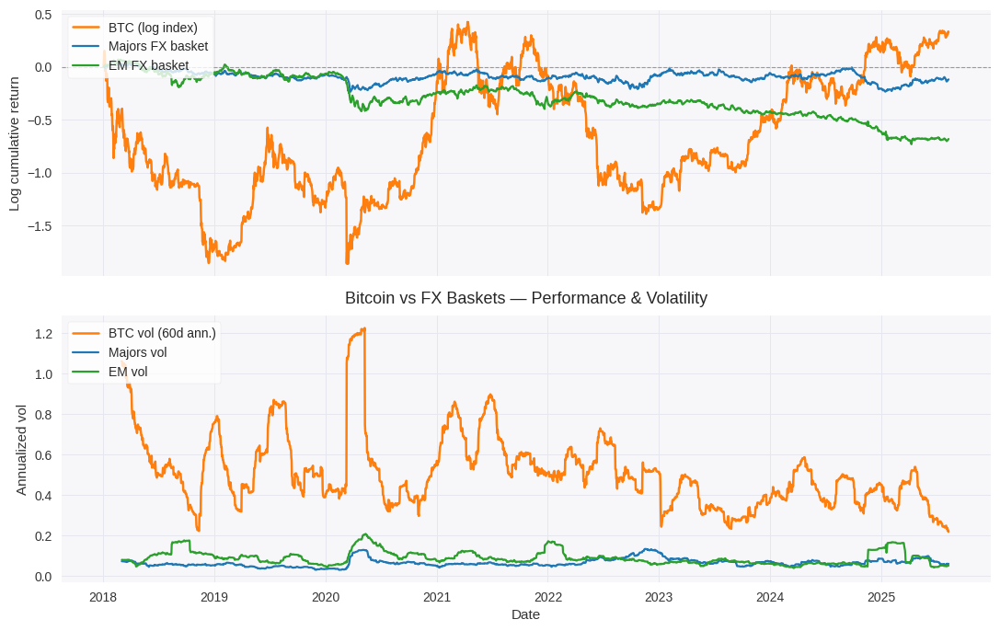

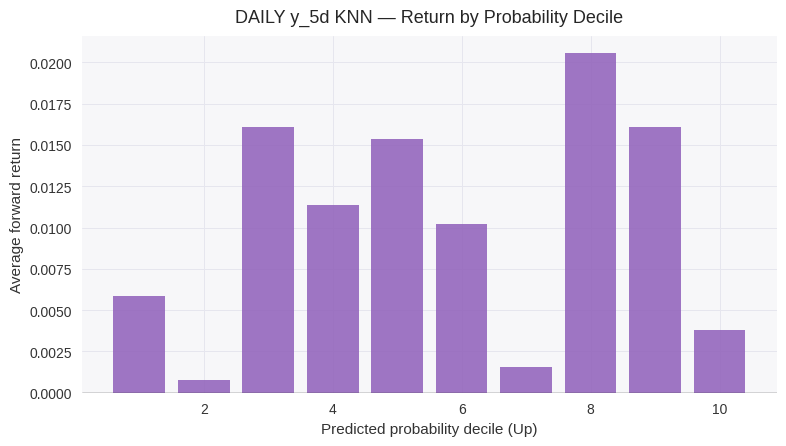

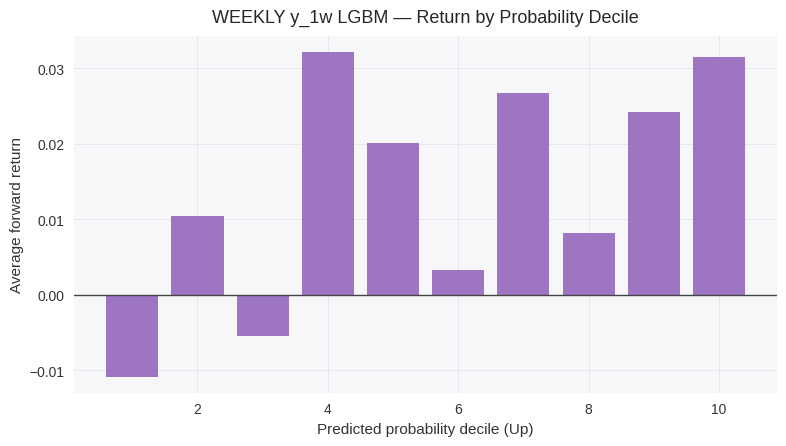

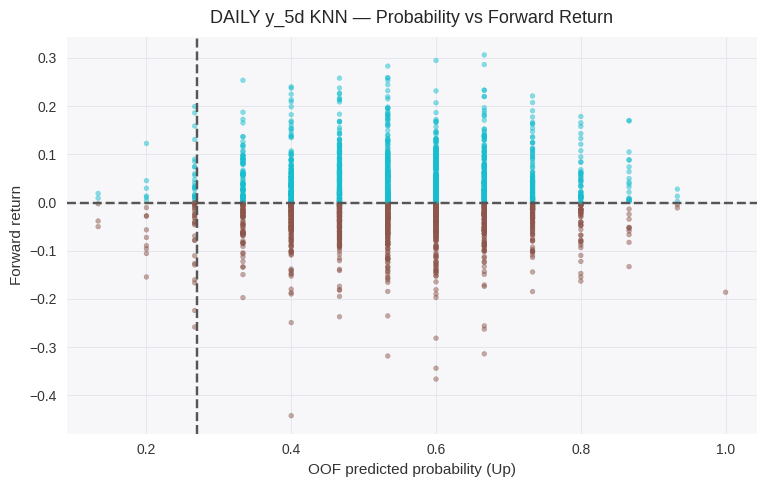

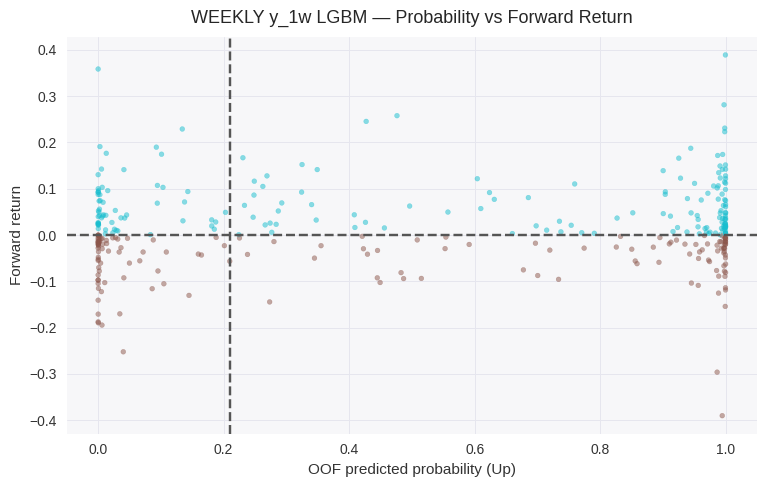

...

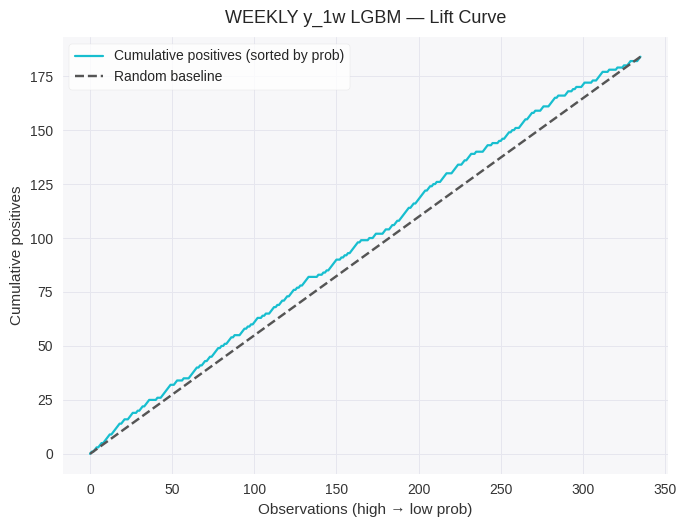

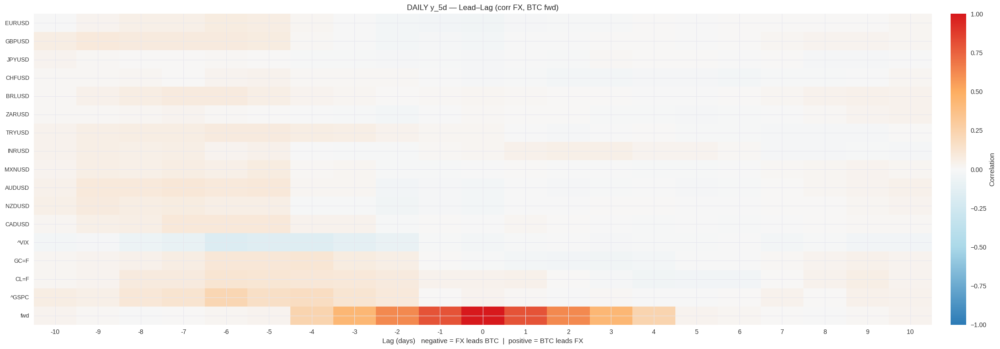

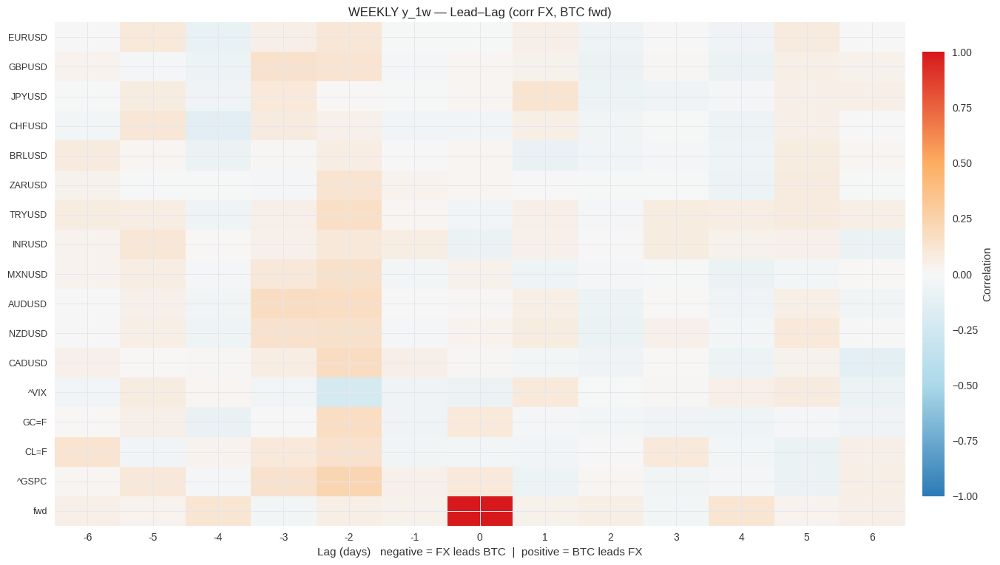

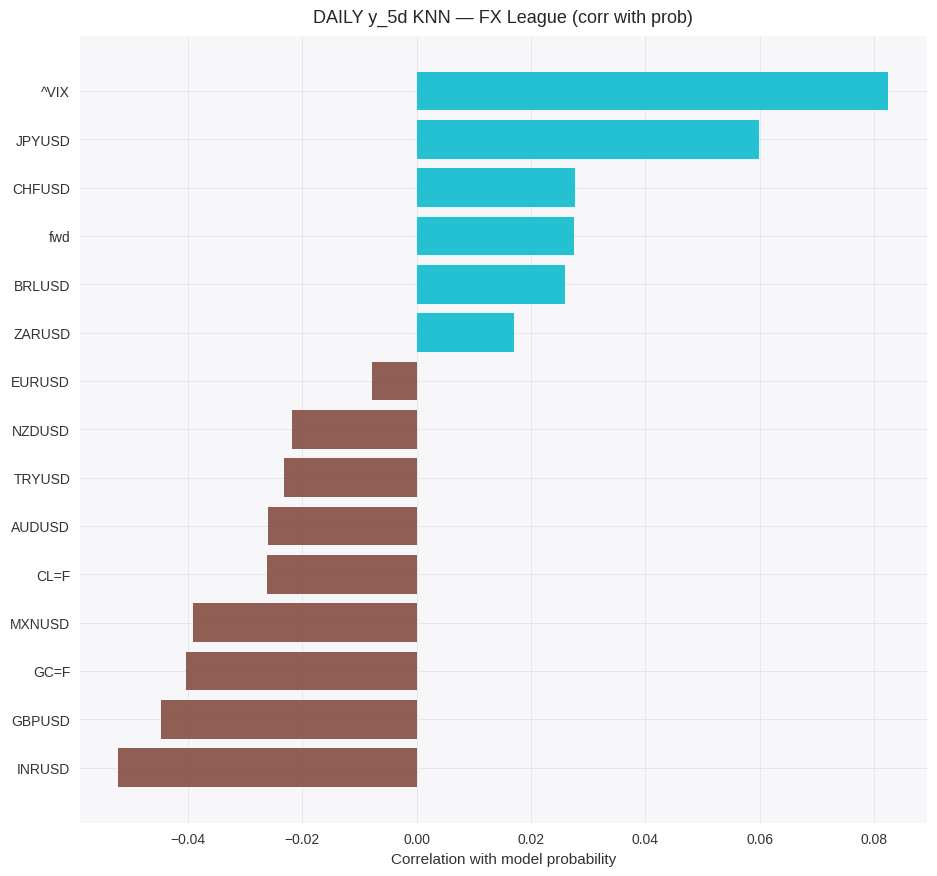

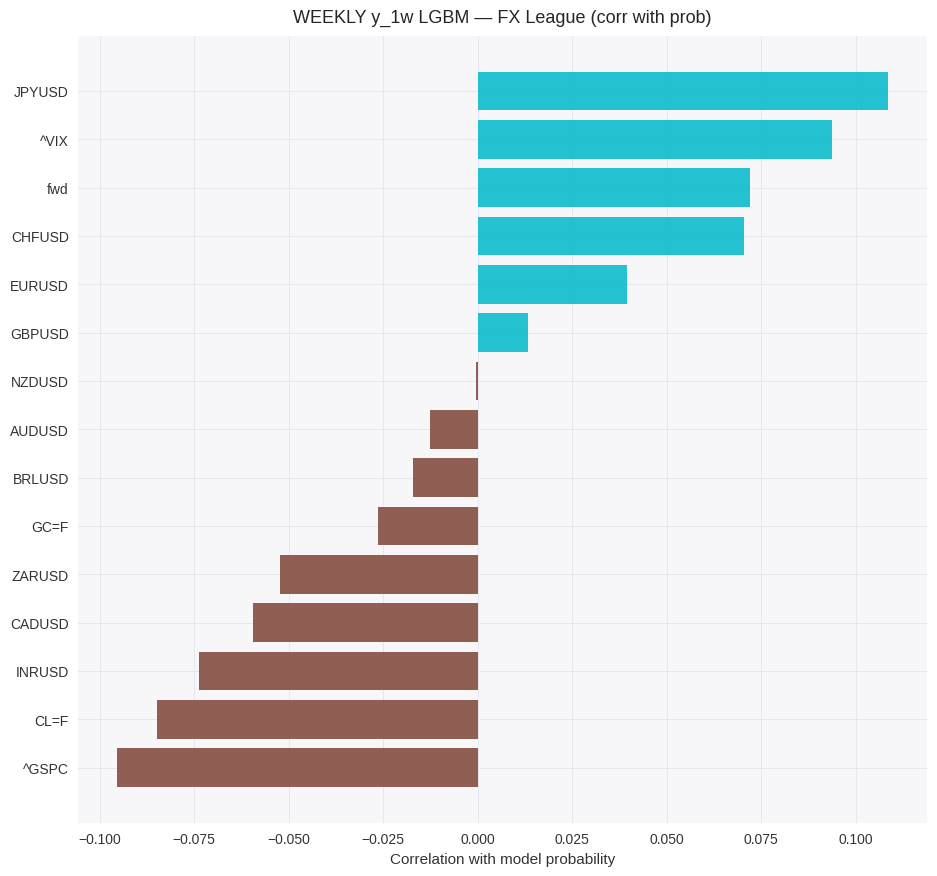


=== Live-style FX Snapshot (based on most recent CSV row) ===
Date: 2025-08-10
Broad USD proxy level: -0.0036   5-day change: +0.0067   percentile≈88.6%
Top FX movers (last 5d cum return):
      BRLUSD  +0.0305
      MXNUSD  +0.0283
      ZARUSD  +0.0264
      EURUSD  +0.0210
        GC=F  +0.0196
      GBPUSD  +0.0139
      AUDUSD  +0.0132
      NZDUSD  +0.0089
      CADUSD  +0.0074
      JPYUSD  +0.0060

Saved compact summary to: /content/btc_project_outputs/tables/viz_usefulness_summary.csv

=== Example figure files to cite ===
 - /content/btc_project_outputs/figures/viz_perf_vol_btc_vs_fx.png
 - /content/btc_project_outputs/figures/viz_daily_y_5d_KNN_DECILES.png
 - /content/btc_project_outputs/figures/viz_weekly_y_1w_LGBM_DECILES.png
 - /content/btc_project_outputs/figures/viz_daily_y_5d_KNN_SCATTER.png
 - /content/btc_project_outputs/figures/viz_weekly_y_1w_LGBM_SCATTER.png
 - /content/btc_project_outputs/figures/viz_daily_y_5d_KNN_ROLLING_HIT_USD.png
 - /content/btc_project_outp

In [ ]:
# ============================================================
# BTC vs Fiat Currencies — Dissertation Visualization Pack
# ============================================================
# Inputs (already created by your main notebook/script):
#   - /content/btc_fx_daily.csv
#   - /content/btc_fx_weekly.csv
#   - /content/btc_project_outputs/tables/leaderboard_daily.csv
#   - /content/btc_project_outputs/tables/leaderboard_weekly.csv
#   - /content/btc_project_outputs/preds/*_oof.csv
#
# Outputs:
#   - PNGs -> /content/btc_project_outputs/figures/
#   - CSVs -> /content/btc_project_outputs/tables/
#
# Plots:
#   A  Performance & Volatility panel (BTC vs FX baskets)
#   B  Probability deciles → forward returns (usefulness)
#   C  Prob vs forward return scatter (+ threshold)
#   D  Rolling hit-rate (where we act) & USD proxy timeline
#   E  Prob vs USD proxy (z-scored timeline & scatter)
#   F  USD shock event study (weakening vs strengthening)
#   G  Strategy equity curves (10/25 bps) vs buy&hold
#   H  Calibration & Lift
#   I  Lead–Lag heatmaps (which FX leads BTC forward returns)
#   J  FX "League Table" (drivers aligned with your model)
#   K  Live-style snapshot: FX strength/weakness & USD regime today
# ============================================================

import os, gc, math, json, warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.calibration import calibration_curve

# ---------------- Paths
OUT_DIR  = "/content/btc_project_outputs"
FIG_DIR  = os.path.join(OUT_DIR, "figures")
TAB_DIR  = os.path.join(OUT_DIR, "tables")
PRED_DIR = os.path.join(OUT_DIR, "preds")
for d in [OUT_DIR, FIG_DIR, TAB_DIR, PRED_DIR]:
    os.makedirs(d, exist_ok=True)

DAILY_CSV  = "/content/btc_fx_daily.csv"
WEEKLY_CSV = "/content/btc_fx_weekly.csv"

# ---------------- Pretty style (matplotlib only; no seaborn)
plt.rcParams.update({
    "figure.figsize": (9.5, 4.8),
    "axes.facecolor": "#f7f7f9",
    "axes.edgecolor": "#333333",
    "axes.labelcolor": "#333333",
    "axes.grid": True,
    "grid.color": "#e6e6ee",
    "grid.linestyle": "-",
    "grid.linewidth": 0.7,
    "xtick.color": "#333333",
    "ytick.color": "#333333",
    "legend.frameon": True,
    "legend.facecolor": "white",
    "legend.edgecolor": "#dddddd",
    "font.size": 11,
})
# Palette
COLORS = {
    "btc":     "#ff7f0e",   # orange
    "maj":     "#1f77b4",   # blue
    "em":      "#2ca02c",   # green
    "usd":     "#d62728",   # red
    "prob":    "#9467bd",   # purple
    "accent1": "#17becf",   # cyan
    "accent2": "#8c564b",   # brown
    "accent3": "#e377c2",   # magenta
}
# Diverging cmap for heatmaps (blue-white-red)
cmap_bwr = LinearSegmentedColormap.from_list("bwr_custom",
    ["#2c7bb6", "#abd9e9", "#f7f7f7", "#fdae61", "#d7191c"])

# ---------------- Helpers
def load_sorted(path):
    df = pd.read_csv(path, parse_dates=["date"]).sort_values("date").drop_duplicates("date")
    return df.reset_index(drop=True)

def forward_return(price, k):
    return (price.shift(-k) - price) / price

def safe_auc(y, p):
    try:
        if len(np.unique(y)) < 2: return 0.5
        return float(roc_auc_score(y, p))
    except Exception:
        return 0.5

def best_thr(y, p, lo=0.20, hi=0.80, step=0.005):
    grid = np.arange(lo, hi + 1e-12, step)
    best_t, best_acc = 0.5, -1
    for t in grid:
        acc = accuracy_score(y, (p>=t).astype(int))
        if acc > best_acc:
            best_acc, best_t = acc, t
    return best_t, best_acc

def ensure_cols(df, cols):
    return [c for c in cols if c in df.columns]

def plot_save(path, title=None):
    if title: plt.title(title, fontsize=13, pad=10)
    plt.tight_layout()
    plt.savefig(path, dpi=200, bbox_inches="tight")
    plt.show()

def pick_best_from_leaderboard(lb_path):
    df = pd.read_csv(lb_path).sort_values(["DA","AUC"], ascending=[False, False]).reset_index(drop=True)
    row = df.iloc[0]
    return str(row["Target"]), str(row["Model"]), float(row["DA"]), float(row["AUC"]), float(row["thr"])

def find_pred_file(freq, target, model):
    want = f"{freq}_{target}_{model}_oof.csv"
    p = os.path.join(PRED_DIR, want)
    if os.path.exists(p):
        return p
    # robust fallback if model name had underscores etc.
    cands = [f for f in os.listdir(PRED_DIR) if f.startswith(f"{freq}_{target}_") and f.endswith("_oof.csv")]
    if not cands:
        raise FileNotFoundError(f"OOF predictions not found for {freq}/{target}/{model}. Looked for {want}")
    return os.path.join(PRED_DIR, sorted(cands)[0])

def build_usd_baskets(df):
    """
    Returns dict with 'majors','em','broad' and the lists of FX columns used.
    'broad' = - mean(XUSD of majors) → rises when USD strengthens.
    """
    g10 = ["EURUSD_ret","GBPUSD_ret","JPYUSD_ret","CHFUSD_ret","AUDUSD_ret",
           "NZDUSD_ret","CADUSD_ret","NOKUSD_ret","SEKUSD_ret"]
    em  = ["BRLUSD_ret","MXNUSD_ret","INRUSD_ret","ZARUSD_ret","TRYUSD_ret",
           "IDRUSD_ret","KRWUSD_ret","RUBUSD_ret","CNYUSD_ret","PLNUSD_ret",
           "HUFUSD_ret","CLPUSD_ret"]
    g10_cols = ensure_cols(df, g10)
    em_cols  = ensure_cols(df, em)
    out = {}
    if g10_cols:
        out["majors"] = df[g10_cols].astype(float).mean(axis=1)
        out["broad"]  = -out["majors"]
    else:
        out["majors"] = pd.Series(np.nan, index=df.index)
        out["broad"]  = pd.Series(np.nan, index=df.index)
    out["em"] = df[em_cols].astype(float).mean(axis=1) if em_cols else pd.Series(np.nan, index=df.index)
    return out, g10_cols, em_cols

def merge_preds_with_market(freq, target, model):
    """Join model OOF predictions with market data and compute forward returns for that target."""
    if freq == "daily":
        mkt = load_sorted(DAILY_CSV)
        k = int(target.split("_")[1].replace("d",""))
        mkt[f"fwd_ret_{k}d"] = forward_return(mkt["btc_close"].astype(float), k)
        fcol = f"fwd_ret_{k}d"
    else:
        mkt = load_sorted(WEEKLY_CSV)
        mkt["fwd_ret_1w"] = forward_return(mkt["btc_close"].astype(float), 1)
        fcol = "fwd_ret_1w"

    baskets, g10_cols, em_cols = build_usd_baskets(mkt)
    mkt["USD_majors"] = baskets["majors"]
    mkt["USD_em"]     = baskets["em"]
    mkt["USD_broad"]  = baskets["broad"]

    pr_path = find_pred_file(freq, target, model)
    pr = pd.read_csv(pr_path, parse_dates=["date"]).sort_values("date")
    df = pd.merge_asof(pr, mkt.sort_values("date"), on="date")
    df = df[np.isfinite(df[fcol])].copy()
    df["fwd_ret"] = df[fcol].astype(float)
    df["y_true"]  = df["y_true"].astype(int)
    df["prob"]    = df["prob"].astype(float)
    return df, pr_path

def zscore(x):
    s = pd.Series(x).astype(float)
    return (s - s.mean()) / (s.std(ddof=0) + 1e-12)

# ---------------- Load data & choose best models
dfd = load_sorted(DAILY_CSV)
dfw = load_sorted(WEEKLY_CSV)

daily_sum  = os.path.join(TAB_DIR, "leaderboard_daily.csv")
weekly_sum = os.path.join(TAB_DIR, "leaderboard_weekly.csv")
if not (os.path.exists(daily_sum) and os.path.exists(weekly_sum)):
    raise FileNotFoundError("Missing summary leaderboards in /content/btc_project_outputs/tables/. Re-run your training first.")

best_d_target, best_d_model, d_DA, d_AUC, d_thr_saved = pick_best_from_leaderboard(daily_sum)
best_w_target, best_w_model, w_DA, w_AUC, w_thr_saved = pick_best_from_leaderboard(weekly_sum)

print(f"[Best DAILY]  {best_d_target} | {best_d_model}  (DA={d_DA:.3f}, AUC={d_AUC:.3f}, thr={d_thr_saved:.3f})")
print(f"[Best WEEKLY] {best_w_target} | {best_w_model}  (DA={w_DA:.3f}, AUC={w_AUC:.3f}, thr={w_thr_saved:.3f})")

df_d, path_d = merge_preds_with_market("daily",  best_d_target,  best_d_model)
df_w, path_w = merge_preds_with_market("weekly", best_w_target, best_w_model)
thr_d, _ = best_thr(df_d["y_true"].values, df_d["prob"].values)
thr_w, _ = best_thr(df_w["y_true"].values, df_w["prob"].values)
print(f"Recomputed thresholds from OOF: daily={thr_d:.3f}  weekly={thr_w:.3f}")

# ============================================================
# A) Performance & Volatility panel (BTC vs FX baskets)
# ============================================================
def perf_vol_panel(df_daily):
    # Build baskets
    baskets, g10_cols, em_cols = build_usd_baskets(df_daily)
    df = df_daily.copy()
    # BTC daily ret (fallback to pct_change if missing)
    if "btc_ret_1d" in df.columns:
        r_btc = pd.to_numeric(df["btc_ret_1d"], errors="coerce")
    else:
        r_btc = df["btc_close"].astype(float).pct_change()
    r_maj = baskets["majors"]
    r_em  = baskets["em"]

    # Indices (log scale)
    idx_btc = (1 + r_btc.fillna(0)).cumprod()
    idx_maj = (1 + r_maj.fillna(0)).cumprod()
    idx_em  = (1 + r_em.fillna(0)).cumprod()

    # Rolling vol (60d)
    vol_btc = r_btc.rolling(60).std()*np.sqrt(252)
    vol_maj = r_maj.rolling(60).std()*np.sqrt(252)
    vol_em  = r_em.rolling(60).std()*np.sqrt(252)

    fig, axes = plt.subplots(2, 1, figsize=(11,7), sharex=True)
    # Top: log idx
    axes[0].plot(df["date"], np.log(idx_btc), color=COLORS["btc"], lw=1.8, label="BTC (log index)")
    axes[0].plot(df["date"], np.log(idx_maj), color=COLORS["maj"], lw=1.6, label="Majors FX basket")
    axes[0].plot(df["date"], np.log(idx_em),  color=COLORS["em"],  lw=1.6, label="EM FX basket")
    axes[0].axhline(0, color="#999", lw=0.8, ls="--")
    axes[0].set_ylabel("Log cumulative return")
    axes[0].legend(loc="upper left")

    # Bottom: rolling vol
    axes[1].plot(df["date"], vol_btc, color=COLORS["btc"], lw=1.8, label="BTC vol (60d ann.)")
    axes[1].plot(df["date"], vol_maj, color=COLORS["maj"], lw=1.6, label="Majors vol")
    axes[1].plot(df["date"], vol_em,  color=COLORS["em"],  lw=1.6, label="EM vol")
    axes[1].set_ylabel("Annualized vol"); axes[1].set_xlabel("Date")
    axes[1].legend(loc="upper left")
    f = os.path.join(FIG_DIR, "viz_perf_vol_btc_vs_fx.png")
    plot_save(f, "Bitcoin vs FX Baskets — Performance & Volatility")
    return f

f_perf = perf_vol_panel(dfd)

# ============================================================
# B) Probability deciles → forward returns (usefulness)
# ============================================================
def decile_plot(df, freq, target, model):
    q = pd.qcut(df["prob"].rank(method="first"), 10, labels=False)
    tab = df.groupby(q, as_index=False)["fwd_ret"].mean()
    tab["Decile"] = tab.index + 1
    plt.figure(figsize=(8.0,4.6))
    bars = plt.bar(tab["Decile"], tab["fwd_ret"], color=COLORS["prob"], alpha=0.9)
    plt.axhline(0, color="#444", lw=1)
    plt.xlabel("Predicted probability decile (Up)")
    plt.ylabel("Average forward return")
    f = os.path.join(FIG_DIR, f"viz_{freq}_{target}_{model}_DECILES.png")
    plot_save(f, f"{freq.upper()} {target} {model} — Return by Probability Decile")
    # Save CSV
    tab_out = tab[["Decile","fwd_ret"]].rename(columns={"fwd_ret":"avg_fwd_ret"})
    tab_out.to_csv(os.path.join(TAB_DIR, f"viz_{freq}_{target}_{model}_deciles.csv"), index=False)
    return f

f_dec_d = decile_plot(df_d, "daily",  best_d_target,  best_d_model)
f_dec_w = decile_plot(df_w, "weekly", best_w_target, best_w_model)

# ============================================================
# C) Prob vs forward return scatter (+ threshold)
# ============================================================
def scatter_prob_vs_ret(df, freq, target, model, thr):
    plt.figure(figsize=(7.8,5.0))
    c = np.where(df["fwd_ret"]>=0, COLORS["accent1"], COLORS["accent2"])
    plt.scatter(df["prob"], df["fwd_ret"], s=12, alpha=0.5, c=c)
    plt.axhline(0, ls="--", color="#555")
    plt.axvline(thr, ls="--", color="#555")
    plt.xlabel("OOF predicted probability (Up)")
    plt.ylabel("Forward return")
    f = os.path.join(FIG_DIR, f"viz_{freq}_{target}_{model}_SCATTER.png")
    plot_save(f, f"{freq.upper()} {target} {model} — Probability vs Forward Return")
    return f

f_scat_d = scatter_prob_vs_ret(df_d, "daily",  best_d_target,  best_d_model, thr_d)
f_scat_w = scatter_prob_vs_ret(df_w, "weekly", best_w_target, best_w_model, thr_w)

# ============================================================
# D) Rolling hit-rate (only when we ACT) & USD proxy
# ============================================================
def rolling_hit_and_usd(df, freq, target, model, thr, window=125):
    m = df.copy()
    m["act"] = (m["prob"] >= thr).astype(int)
    hr = []
    for i in range(len(m)):
        lo = max(0, i-window+1)
        chunk = m.iloc[lo:i+1]
        chunk = chunk[chunk["act"]==1]
        if len(chunk) >= max(15, window//8):
            hr.append((chunk["y_true"] == (chunk["prob"]>=thr).astype(int)).mean())
        else:
            hr.append(np.nan)
    hr = pd.Series(hr, index=m.index)
    usd = pd.Series(m["USD_broad"]).rolling(10, min_periods=3).mean()

    fig, ax1 = plt.subplots(figsize=(11.0,4.2))
    ax1.plot(m["date"], hr, lw=1.8, color=COLORS["prob"], label="Rolling hit-rate (acted days)")
    ax1.set_ylim(0,1); ax1.set_ylabel("Hit rate")
    ax2 = ax1.twinx()
    ax2.plot(m["date"], usd, color=COLORS["usd"], alpha=0.8, lw=1.3, label="USD proxy (smoothed)")
    ax2.set_ylabel("USD proxy (−mean XUSD)")
    ax1.grid(alpha=0.25)
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines+lines2, labels+labels2, loc="upper left")
    f = os.path.join(FIG_DIR, f"viz_{freq}_{target}_{model}_ROLLING_HIT_USD.png")
    plot_save(f, f"{freq.upper()} {target} {model} — Rolling Hit-Rate (act) & USD")
    return f

f_roll_d = rolling_hit_and_usd(df_d, "daily",  best_d_target,  best_d_model, thr_d)
f_roll_w = rolling_hit_and_usd(df_w, "weekly", best_w_target, best_w_model, thr_w)

# ============================================================
# E) Prob vs USD proxy (timeline & scatter, z-scored)
# ============================================================
def usd_vs_prob_plots(df, freq, target, model):
    pz = zscore(df["prob"])
    uz = zscore(df["USD_broad"])
    corr = float(pd.Series(pz).corr(pd.Series(uz)))

    plt.figure(figsize=(11.0,4.2))
    plt.plot(df["date"], pz, lw=1.6, color=COLORS["prob"], label="Prob (z)")
    plt.plot(df["date"], uz, lw=1.6, color=COLORS["usd"],  label="USD proxy (z)", alpha=0.85)
    plt.axhline(0, color="#888", lw=0.8)
    plt.legend(); plt.grid(alpha=0.25)
    f1 = os.path.join(FIG_DIR, f"viz_{freq}_{target}_{model}_TIMELINE_USD.png")
    plot_save(f1, f"{freq.upper()} {target} {model} — Prob vs USD (z),  corr={corr:.2f}")

    plt.figure(figsize=(7.0,5.2))
    plt.scatter(uz, pz, s=12, alpha=0.5, c=COLORS["accent1"])
    plt.xlabel("USD proxy (z)"); plt.ylabel("Prob (z)")
    f2 = os.path.join(FIG_DIR, f"viz_{freq}_{target}_{model}_SCATTER_USD.png")
    plot_save(f2, f"{freq.upper()} {target} {model} — Prob vs USD (z)")
    return f1, f2, corr

f_usd_d1, f_usd_d2, corr_d = usd_vs_prob_plots(df_d, "daily",  best_d_target,  best_d_model)
f_usd_w1, f_usd_w2, corr_w = usd_vs_prob_plots(df_w, "weekly", best_w_target, best_w_model)

# ============================================================
# F) Event study — USD shocks (10th vs 90th pct of ΔUSD over 5d)
# ============================================================
def event_study_usd(df, freq, target, model, horizon=5):
    u = pd.Series(df["USD_broad"]).astype(float)
    du = u.diff(horizon)
    lo_cut, hi_cut = np.nanpercentile(du, 10), np.nanpercentile(du, 90)
    idx_lo = np.where(du <= lo_cut)[0]  # USD weakening shock
    idx_hi = np.where(du >= hi_cut)[0]  # USD strengthening shock

    def avg_path(ix, series, R=5):
        mats = []
        s = pd.Series(series).astype(float)
        for i in ix:
            if i+R >= len(s): continue
            mats.append(s.iloc[i:i+R+1].values)
        if not mats: return None
        return np.nanmean(np.vstack(mats), axis=0)

    ret_lo  = avg_path(idx_lo, df["fwd_ret"], R=horizon)
    ret_hi  = avg_path(idx_hi, df["fwd_ret"], R=horizon)
    prob_lo = avg_path(idx_lo, df["prob"],   R=horizon)
    prob_hi = avg_path(idx_hi, df["prob"],   R=horizon)
    x = np.arange(0, horizon+1)

    plt.figure(figsize=(8.4,4.6))
    if ret_lo is not None: plt.plot(x, np.cumsum(ret_lo),  lw=2.0, color=COLORS["accent1"], label="USD weak shock (cum fwd ret)")
    if ret_hi is not None: plt.plot(x, np.cumsum(ret_hi),  lw=2.0, color=COLORS["accent2"], label="USD strong shock (cum fwd ret)")
    plt.axhline(0, color="#777", lw=0.8); plt.xlabel("Days ahead"); plt.ylabel("Cum forward return")
    plt.legend(); plt.grid(alpha=0.25)
    f1 = os.path.join(FIG_DIR, f"viz_{freq}_{target}_{model}_EVENT_RET.png")
    plot_save(f1, f"{freq.upper()} {target} {model} — Event: USD Shocks → BTC")

    plt.figure(figsize=(8.4,4.6))
    if prob_lo is not None: plt.plot(x, prob_lo, lw=2.0, color=COLORS["accent1"], label="USD weak shock (prob)")
    if prob_hi is not None: plt.plot(x, prob_hi, lw=2.0, color=COLORS["accent2"], label="USD strong shock (prob)")
    plt.xlabel("Days ahead"); plt.ylabel("Predicted Prob (Up)")
    plt.legend(); plt.grid(alpha=0.25)
    f2 = os.path.join(FIG_DIR, f"viz_{freq}_{target}_{model}_EVENT_PROB.png")
    plot_save(f2, f"{freq.upper()} {target} {model} — Event: USD Shocks → Probability")
    return f1, f2

f_evt_d = event_study_usd(df_d, "daily",  best_d_target,  best_d_model, horizon=5)
f_evt_w = event_study_usd(df_w, "weekly", best_w_target, best_w_model, horizon=5)

# ============================================================
# G) Strategy equity curves (long/flat) vs buy&hold (10 & 25 bps)
# ============================================================
def backtest_equity(df, thr, cost=0.001, initial=1.0, mode="long_flat"):
    fwd = df["fwd_ret"].astype(float).values
    p   = df["prob"].astype(float).values
    pos = (p >= thr).astype(int) if mode == "long_flat" else np.where(p >= thr, 1, np.where(p <= 1-thr, -1, 0))
    trade = np.abs(np.diff(np.r_[0, pos]))
    eq = [initial]
    for t in range(len(fwd)):
        gross = eq[-1] * (1 + pos[t]*fwd[t])
        eq.append(gross - eq[-1]*cost*trade[t])
    return np.array(eq[1:]), pos

def plot_equity(df, freq, target, model, thr):
    dates = pd.to_datetime(df["date"])
    bh = (1 + df["fwd_ret"].astype(float)).cumprod().values
    for c in (0.001, 0.0025):
        eq, _ = backtest_equity(df, thr, cost=c, initial=1.0, mode="long_flat")
        plt.figure(figsize=(11.0,4.2))
        plt.plot(dates, bh, lw=1.7, color="#222222", label="Buy & Hold")
        plt.plot(dates, eq, lw=1.7, color=COLORS["prob"], label=f"Long/Flat (cost={int(c*1e4)} bps)")
        plt.yscale("log"); plt.grid(alpha=0.25)
        plt.xlabel("Date"); plt.ylabel("Equity (log scale)")
        plt.legend()
        f = os.path.join(FIG_DIR, f"viz_{freq}_{target}_{model}_EQUITY_{int(c*1e4)}bps.png")
        plot_save(f, f"{freq.upper()} {target} {model} — Equity vs Buy&Hold ({int(c*1e4)} bps)")
    return

plot_equity(df_d, "daily",  best_d_target,  best_d_model,  thr_d)
plot_equity(df_w, "weekly", best_w_target, best_w_model, thr_w)

# ============================================================
# H) Calibration & Lift
# ============================================================
def calibration_and_lift(df, freq, target, model):
    y = df["y_true"].astype(int).values
    p = df["prob"].astype(float).values
    # Calibration
    prob_true, prob_pred = calibration_curve(y, p, n_bins=10, strategy="uniform")
    plt.figure(figsize=(7.0,5.4))
    plt.plot(prob_pred, prob_true, marker="o", lw=1.4, color=COLORS["prob"])
    plt.plot([0,1],[0,1],'--', color="#555")
    plt.xlabel("Predicted probability"); plt.ylabel("Observed frequency")
    f1 = os.path.join(FIG_DIR, f"viz_{freq}_{target}_{model}_CAL.png")
    plot_save(f1, f"{freq.upper()} {target} {model} — Calibration (10 bins)")
    # Lift
    order = np.argsort(-p)
    y_sorted = y[order]
    cum_tp = np.cumsum(y_sorted)
    baseline = np.linspace(0, cum_tp[-1], num=len(cum_tp))
    plt.figure(figsize=(7.0,5.4))
    plt.plot(cum_tp, lw=1.6, color=COLORS["accent1"], label="Cumulative positives (sorted by prob)")
    plt.plot(baseline, '--', color="#555", label="Random baseline")
    plt.xlabel("Observations (high → low prob)"); plt.ylabel("Cumulative positives")
    plt.legend()
    f2 = os.path.join(FIG_DIR, f"viz_{freq}_{target}_{model}_LIFT.png")
    plot_save(f2, f"{freq.upper()} {target} {model} — Lift Curve")
    return f1, f2

f_cal_d = calibration_and_lift(df_d, "daily",  best_d_target,  best_d_model)
f_cal_w = calibration_and_lift(df_w, "weekly", best_w_target, best_w_model)

# ============================================================
# I) Lead–Lag heatmaps (FX vs BTC forward returns)
# ============================================================
def lead_lag_heatmap(df, freq, horizon_label, fx_cols, max_lag=10):
    if not fx_cols:
        print(f"[{freq}] No FX columns found for heatmap.")
        return None
    lags = list(range(-max_lag, max_lag+1))
    mat = []
    for c in fx_cols:
        series = pd.to_numeric(df[c], errors="coerce")
        row = []
        for L in lags:
            if L < 0:   # FX leads BTC: compare FX_t with BTC_fwd at t - L
                s_fx = series
                s_bt = df["fwd_ret"].shift(-L)
            elif L > 0: # BTC leads FX: compare FX_{t+L} with BTC_fwd at t
                s_fx = series.shift(L)
                s_bt = df["fwd_ret"]
            else:
                s_fx = series
                s_bt = df["fwd_ret"]
            m = (~s_fx.isna()) & (~s_bt.isna())
            row.append(np.corrcoef(s_fx[m], s_bt[m])[0,1] if m.sum() > 10 else np.nan)
        mat.append(row)
    H = np.array(mat, dtype=float)
    fig, ax = plt.subplots(figsize=(1.05*len(lags), 0.34*len(fx_cols)+2))
    vmax = np.nanmax(np.abs(H))
    im = ax.imshow(H, aspect="auto", cmap=cmap_bwr, vmin=-vmax, vmax=vmax)
    ax.set_xticks(range(len(lags))); ax.set_xticklabels(lags)
    ax.set_yticks(range(len(fx_cols))); ax.set_yticklabels([c.replace("_ret","") for c in fx_cols], fontsize=9)
    ax.set_xlabel("Lag (days)   negative = FX leads BTC  |  positive = BTC leads FX")
    ax.set_title(f"{freq.upper()} {horizon_label} — Lead–Lag (corr FX, BTC fwd)")
    cbar = plt.colorbar(im, ax=ax, fraction=0.025, pad=0.02); cbar.set_label("Correlation")
    f = os.path.join(FIG_DIR, f"viz_{freq}_{horizon_label}_LEADLAG.png")
    plot_save(f)
    return f, H, lags

fx_all_d = [c for c in df_d.columns if c.endswith("_ret") and c not in ("btc_ret_1d","btc_ret_1w")]
fx_all_w = [c for c in df_w.columns if c.endswith("_ret") and c not in ("btc_ret_1d","btc_ret_1w")]
f_hm_d = lead_lag_heatmap(df_d, "daily",  best_d_target, fx_all_d, max_lag=10)
f_hm_w = lead_lag_heatmap(df_w, "weekly", best_w_target, fx_all_w, max_lag=6)

# ============================================================
# J) FX "League Table": alignment with your model probability
# ============================================================
def fx_league(df, freq, target, model, topn=15):
    fx_cols = [c for c in df.columns if c.endswith("_ret") and c not in ("btc_ret_1d","btc_ret_1w")]
    rows = []
    for c in fx_cols:
        r = pd.Series(df[c]).astype(float)
        prob = pd.Series(df["prob"]).astype(float)
        corr = float(r.corr(prob))
        dec = pd.qcut(r.rank(method="first"), 10, labels=False)
        top_mean = float(df.loc[dec==9, "fwd_ret"].mean()) if (dec==9).any() else np.nan
        bot_mean = float(df.loc[dec==0, "fwd_ret"].mean()) if (dec==0).any() else np.nan
        rows.append({"FX": c.replace("_ret",""), "corr_prob": corr,
                     "mean_fwd_ret_top_dec": top_mean, "mean_fwd_ret_bottom_dec": bot_mean})
    league = pd.DataFrame(rows).sort_values("corr_prob", ascending=False).reset_index(drop=True)
    out_csv = os.path.join(TAB_DIR, f"viz_{freq}_{target}_{model}_fx_league.csv")
    league.to_csv(out_csv, index=False)
    take = league.head(topn)
    plt.figure(figsize=(9.5, 0.46*len(take)+2))
    colors = np.where(take["corr_prob"]>=0, COLORS["accent1"], COLORS["accent2"])
    plt.barh(take["FX"], take["corr_prob"], color=colors, alpha=0.95)
    plt.gca().invert_yaxis()
    plt.xlabel("Correlation with model probability")
    f = os.path.join(FIG_DIR, f"viz_{freq}_{target}_{model}_FX_LEAGUE.png")
    plot_save(f, f"{freq.upper()} {target} {model} — FX League (corr with prob)")
    return league, out_csv, f

league_d, league_d_csv, f_league_d = fx_league(df_d, "daily",  best_d_target,  best_d_model)
league_w, league_w_csv, f_league_w = fx_league(df_w, "weekly", best_w_target, best_w_model)

# ============================================================
# K) Live-style snapshot: “today’s” FX regime & USD
#     (based on the latest row in your CSVs)
# ============================================================
def snapshot_fx_regime(df_daily):
    # broad USD proxy & 5d change
    baskets, g10_cols, em_cols = build_usd_baskets(df_daily)
    usd_proxy = baskets["broad"]
    usd_5d = usd_proxy.diff(5)
    last_date = df_daily["date"].iloc[-1]
    last_usd = usd_proxy.iloc[-1]
    last_usd_5d = usd_5d.iloc[-1]
    # percentile of 5d move historically
    pct = float(pd.Series(usd_5d).rank(pct=True).iloc[-1])*100.0
    # rank FX by last 5d cum return
    fx_cols = [c for c in df_daily.columns if c.endswith("_ret") and c not in ("btc_ret_1d","btc_ret_1w")]
    ranks = []
    for c in fx_cols:
        r5 = pd.Series(df_daily[c]).astype(float).rolling(5).sum().iloc[-1]
        ranks.append((c.replace("_ret",""), r5))
    ranks = sorted(ranks, key=lambda x: x[1], reverse=True)
    fx_rank_df = pd.DataFrame(ranks, columns=["FX","last_5d_return"]).head(20)
    fx_rank_csv = os.path.join(TAB_DIR, "viz_snapshot_fx_top20.csv")
    fx_rank_df.to_csv(fx_rank_csv, index=False)
    # print a readable summary
    print("\n=== Live-style FX Snapshot (based on most recent CSV row) ===")
    print(f"Date: {pd.to_datetime(last_date).date()}")
    print(f"Broad USD proxy level: {last_usd:.4f}   5-day change: {last_usd_5d:+.4f}   percentile≈{pct:.1f}%")
    print("Top FX movers (last 5d cum return):")
    for name, val in ranks[:10]:
        print(f"  {name:>10s}  {val:+.4f}")
    return fx_rank_csv

snap_csv = snapshot_fx_regime(dfd)

# ============================================================
# Compact summary table for the dissertation
# ============================================================
def compact_summary(df, thr):
    y = df["y_true"].astype(int).values
    p = df["prob"].astype(float).values
    da_thr = accuracy_score(y, (p>=thr).astype(int))
    auc    = safe_auc(y, p)
    q = pd.qcut(pd.Series(p).rank(method="first"), 10, labels=False)
    dec = df.groupby(q)["fwd_ret"].mean().reset_index(drop=True)
    out = {
        "DA_at_thr": da_thr, "AUC": auc, "thr_used": thr, "n": int(len(df)),
        "mean_fwd_ret_top_decile": float(dec.iloc[-1]) if len(dec) else np.nan,
        "mean_fwd_ret_bottom_decile": float(dec.iloc[0]) if len(dec) else np.nan,
        "corr_prob_usdproxy": float(pd.Series(df["prob"]).corr(pd.Series(df["USD_broad"])))
    }
    return out

summary_df = pd.DataFrame([
    {"freq":"daily",  "target":best_d_target, "model":best_d_model, **compact_summary(df_d, thr_d)},
    {"freq":"weekly", "target":best_w_target, "model":best_w_model, **compact_summary(df_w, thr_w)}
])
sum_path = os.path.join(TAB_DIR, "viz_usefulness_summary.csv")
summary_df.to_csv(sum_path, index=False)
print("\nSaved compact summary to:", sum_path)

print("\n=== Example figure files to cite ===")
for f in [
    f_perf, f_dec_d, f_dec_w, f_scat_d, f_scat_w, f_roll_d, f_roll_w,
    f_usd_d1, f_usd_d2, f_usd_w1, f_usd_w2,
    f_evt_d[0], f_evt_d[1], f_evt_w[0], f_evt_w[1],
    os.path.join(FIG_DIR, f"viz_daily_{best_d_target}_{best_d_model}_EQUITY_10bps.png"),
    os.path.join(FIG_DIR, f"viz_weekly_{best_w_target}_{best_w_model}_EQUITY_10bps.png"),
    f_cal_d[0], f_cal_d[1], f_cal_w[0], f_cal_w[1],
    f_hm_d[0] if f_hm_d else "", f_hm_w[0] if f_hm_w else "",
    f_league_d, f_league_w
]:
    if f:
        print(" -", f)


In [ ]:
# run once per best target
rng = np.random.default_rng(42)
y = df_w["y_true"].to_numpy()
p = df_w["prob"].to_numpy()
from sklearn.metrics import roc_auc_score
print("Real AUC:", roc_auc_score(y, p))
print("Shuffled AUC (mean of 200):",
      np.mean([roc_auc_score(rng.permutation(y), p) for _ in range(200)]))


Real AUC: 0.5704018878718535
Shuffled AUC (mean of 200): 0.49938304490846686


In [ ]:
thr_abs = 0.003  # 30 bps; try 50 bps too
m = df_w["fwd_ret"].abs() >= thr_abs
from sklearn.metrics import roc_auc_score
print("AUC |fwd|>=30bps:", roc_auc_score(df_w.loc[m,"y_true"], df_w.loc[m,"prob"]))


AUC |fwd|>=30bps: 0.5662243947858473


In [ ]:
def block_auc(y, p, B=500, L=20):
    import numpy as np
    from sklearn.metrics import roc_auc_score
    n = len(y); idx = np.arange(n)
    au = []
    rng = np.random.default_rng(42)
    for _ in range(B):
        # sample overlapping blocks of length L to length ~n
        take = []
        while len(take) < n:
            s = rng.integers(0, n-L)
            take.extend(idx[s:s+L])
        take = np.array(take[:n])
        au.append(roc_auc_score(y[take], p[take]))
    return np.percentile(au, [2.5, 97.5])
y, p = df_w["y_true"].to_numpy(), df_w["prob"].to_numpy()
print("AUC CI (block):", block_auc(y,p))


AUC CI (block): [0.50389351 0.61774187]


In [ ]:
# Zip the entire btc_project_outputs folder
!zip -r /tmp/btc_project_outputs.zip /content/btc_project_outputs

In [ ]:
# Download the created zip file
from google.colab import files
files.download('/tmp/btc_project_outputs.zip')

In [1]:
!git init

hint: Using 'master' as the name for the initial branch. This default branch name
hint: is subject to change. To configure the initial branch name to use in all
hint: of your new repositories, which will suppress this warning, call:
hint: 
hint: 	git config --global init.defaultBranch <name>
hint: 
hint: Names commonly chosen instead of 'master' are 'main', 'trunk' and
hint: 'development'. The just-created branch can be renamed via this command:
hint: 
hint: 	git branch -m <name>
Initialized empty Git repository in /content/.git/
